In [75]:
# infectious-diseases-by-county-year-and-sex
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from prophet import Prophet

import warnings
warnings.filterwarnings("ignore")

plt.style.use('ggplot')
plt.style.use('fivethirtyeight')

In [77]:
# Reading the CSV file (Load the data)
df = pd.read_csv("FYP Dataset/infectious-diseases-by-county-year-and-sex.csv")
df.head()

,Disease,County,Year,Sex,Cases,Population,Rate,Lower_95__CI,Upper_95__CI
0,Anaplasmosis,Alameda,2001,Female,0.0,746596,-,0.0,0.494
1,Anaplasmosis,Alameda,2001,Male,0.0,718968,-,0.0,0.513
2,Anaplasmosis,Alameda,2001,Total,0.0,1465564,-,0.0,0.252
3,Anaplasmosis,Alameda,2002,Female,0.0,747987,-,0.0,0.493
4,Anaplasmosis,Alameda,2002,Male,0.0,720481,-,0.0,0.512


In [81]:
df.shape

(199125, 9)

In [83]:
df.columns

Index(['Disease', 'County', 'Year', 'Sex', 'Cases', 'Population', 'Rate',
       'Lower_95__CI', 'Upper_95__CI'],
      dtype='object')

In [85]:
# Check the number of missing values in each column
missing_data = df.isnull().sum()
print(missing_data)

Disease            0
County             0
Year               0
Sex                0
Cases           5064
Population         0
Rate               0
Lower_95__CI    5581
Upper_95__CI    5581
dtype: int64


In [87]:
# Show all unique values with their counts
df['Disease'].value_counts()

Disease
Anaplasmosis                                                                             4071
Anthrax                                                                                  4071
Lyme Disease                                                                             4071
Malaria                                                                                  4071
Paralytic Shellfish Poisoning                                                            4071
Paratyphoid Fever                                                                        4071
Plague, human                                                                            4071
Psittacosis                                                                              4071
Q Fever                                                                                  4071
Rabies, human                                                                            4071
Relapsing Fever                                     

In [89]:
# Keep only rows where 'County' is 'Malaria'
filtered_df = df[df['Disease'] == 'Malaria']
filtered_df.shape

(4071, 9)

In [91]:
filtered_df.head()

,Disease,County,Year,Sex,Cases,Population,Rate,Lower_95__CI,Upper_95__CI
108147,Malaria,Alameda,2001,Female,2.0,746596,0.268*,0.032,0.968
108148,Malaria,Alameda,2001,Male,13.0,718968,1.808*,0.963,3.092
108149,Malaria,Alameda,2001,Total,15.0,1465564,1.023*,0.573,1.688
108150,Malaria,Alameda,2002,Female,10.0,747987,1.337*,0.641,2.459
108151,Malaria,Alameda,2002,Male,17.0,720481,2.360*,1.375,3.778


In [95]:
# Now sort, set as index, and ensure datetime index
df = df.sort_values('Year')
df.set_index('Year', inplace=True)

In [97]:
duplicate_dates = df[df.index.duplicated(keep=False)]
print(duplicate_dates)

                          Disease      County     Sex  Cases  Population  \
Year                                                                       
2001                 Anaplasmosis     Alameda  Female    0.0      746596   
2001                 Ehrlichiosis  Santa Cruz   Total    0.0      256166   
2001                   Babesiosis        Yuba  Female    0.0       30474   
2001                   Babesiosis        Yuba    Male    0.0       30952   
2001                   Babesiosis        Yuba   Total    0.0       61426   
...                           ...         ...     ...    ...         ...   
2023           Coccidioidomycosis      Plumas  Female    NaN        9520   
2023  Spotted Fever Rickettsiosis      Tehama  Female    0.0       32314   
2023  Spotted Fever Rickettsiosis      Tehama    Male    0.0       31846   
2023           Coccidioidomycosis   San Diego    Male  249.0     1699261   
2023         Zika Virus Infection        Yuba   Total    0.0       82973   

        Rat

In [101]:
# Ensure the index is datetime and sorted (if not already)
df = df.sort_index()

# Get unique diseases
diseases = df['Disease'].unique()

In [103]:
malaria_df = df.query("Disease == 'Malaria'")

In [105]:
malaria_df.shape

(4071, 8)

In [107]:
malaria_df.head()

,Disease,County,Sex,Cases,Population,Rate,Lower_95__CI,Upper_95__CI
Year,,,,,,,,
2001,Malaria,Glenn,Female,0.0,13154,-,0.00,28.039
2001,Malaria,Glenn,Male,0.0,13457,-,0.00,27.409
2001,Malaria,Glenn,Total,0.0,26611,-,0.00,13.861
2001,Malaria,Humboldt,Female,0.0,64153,-,0.00,5.750
2001,Malaria,Humboldt,Male,1.0,63195,1.582*,0.04,8.816


In [109]:
print(malaria_df['Cases'].sum())

malaria_df = malaria_df.groupby(malaria_df.index).sum()

print(malaria_df['Cases'].sum())

11490.0
11490.0


In [111]:
malaria_df.shape

(23, 8)

In [113]:
malaria_df.dtypes

Disease          object
County           object
Sex              object
Cases           float64
Population        int64
Rate             object
Lower_95__CI    float64
Upper_95__CI    float64
dtype: object

In [115]:
malaria_df.drop(['County', 'Sex', 'Disease', 'Rate', 'Lower_95__CI', 'Upper_95__CI'], axis=1, inplace=True)

In [117]:
malaria_df.head()

,Cases,Population
Year,,
2001,699.0,138050968
2002,700.0,139753160
2003,662.0,141555712
2004,630.0,143011060
2005,663.0,143942328


In [119]:
malaria_df.tail()

,Cases,Population
Year,,
2019,420.0,158581522
2020,178.0,158604980
2021,328.0,158385644
2022,465.0,158349148
2023,612.0,158689408


In [121]:
# Check the number of missing values in each column
missing_data = malaria_df.isnull().sum()
print(missing_data)

Cases         0
Population    0
dtype: int64


In [123]:
# Replace NaN with 0 in the entire DataFrame
malaria_df = malaria_df.fillna(0)

In [125]:
# Check the number of missing values in each column
missing_data = malaria_df.isnull().sum()
print(missing_data)

Cases         0
Population    0
dtype: int64


In [127]:
malaria_df.columns

Index(['Cases', 'Population'], dtype='object')

In [129]:
malaria_df.head()

,Cases,Population
Year,,
2001,699.0,138050968
2002,700.0,139753160
2003,662.0,141555712
2004,630.0,143011060
2005,663.0,143942328


In [276]:
max_year = malaria_df['Cases'].idxmax()
max_cases = malaria_df['Cases'].max()

print(f"Year with highest cases: {max_year}")
print(f"Cases: {int(max_cases):,}")

Year with highest cases: 2002
Cases: 700


In [ ]:
# Compute correlation matrix
correlation_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(14, 10))
sns.set(style="white")

# Generate a mask for the upper triangle (optional)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    correlation_matrix,
    mask=mask,
    cmap="coolwarm",
    vmax=1,
    vmin=-1,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75},
    annot=True,
    fmt=".2f",
    annot_kws={"size": 9}
)

# Improve title styling
plt.title("Correlation Heatmap", fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# Set style
sns.set_style("whitegrid")

# Resample and aggregate
yearly_cases = df['Cases'].resample('Y').sum()

# Convert index to year for clearer x-axis labels
yearly_cases.index = yearly_cases.index.year

# Plot
plt.figure(figsize=(15, 5))
bars = plt.bar(yearly_cases.index, yearly_cases, color=color_pal[0])

# Annotate bars with values
for bar in bars:
    height = bar.get_height()
    plt.annotate(f'{int(height):,}', xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 5), textcoords="offset points", ha='center', fontsize=9)

# Title and labels
plt.title('Yearly New Malaria Cases', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total New Cases', fontsize=12)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [28]:
# Engineered features + Epidemiological features (without prediction range)

16:59:59 - cmdstanpy - INFO - Chain [1] start processing
17:00:00 - cmdstanpy - INFO - Chain [1] done processing



Prophet Evaluation:
  MAE: 233.97
  MSE: 91237.81
  RMSE: 302.06
  MAPE: 50.50%
  SMAPE: 79.22%
  R2: -4.06
Prophet - Train MAE: 14.68, Test MAE: 233.97
Prophet - Train RMSE: 18.16, Test RMSE: 302.06


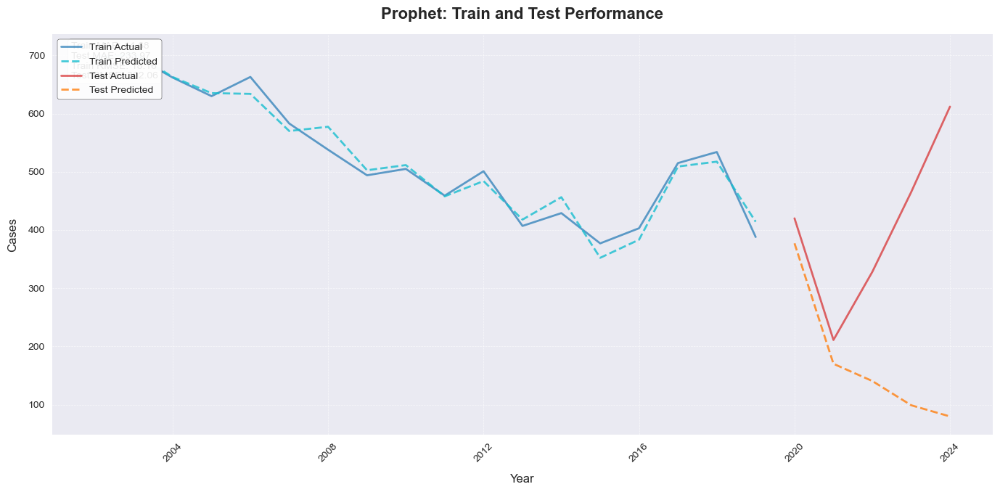

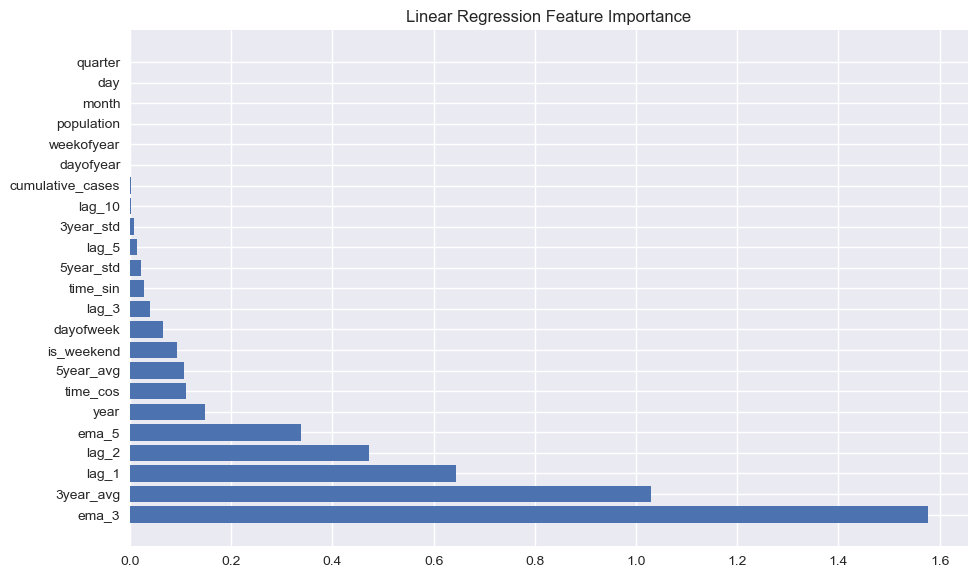


Linear Regression Evaluation:
  MAE: 8.42
  MSE: 210.90
  RMSE: 14.52
  MAPE: 3.51%
  SMAPE: 3.76%
  R2: 0.99
Linear Regression - Train MAE: 0.00, Test MAE: 8.42
Linear Regression - Train RMSE: 0.00, Test RMSE: 14.52


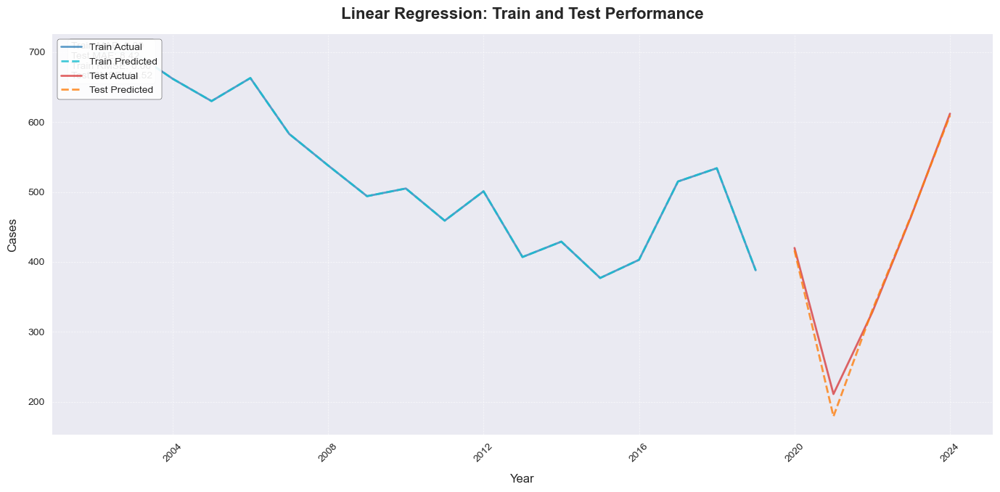

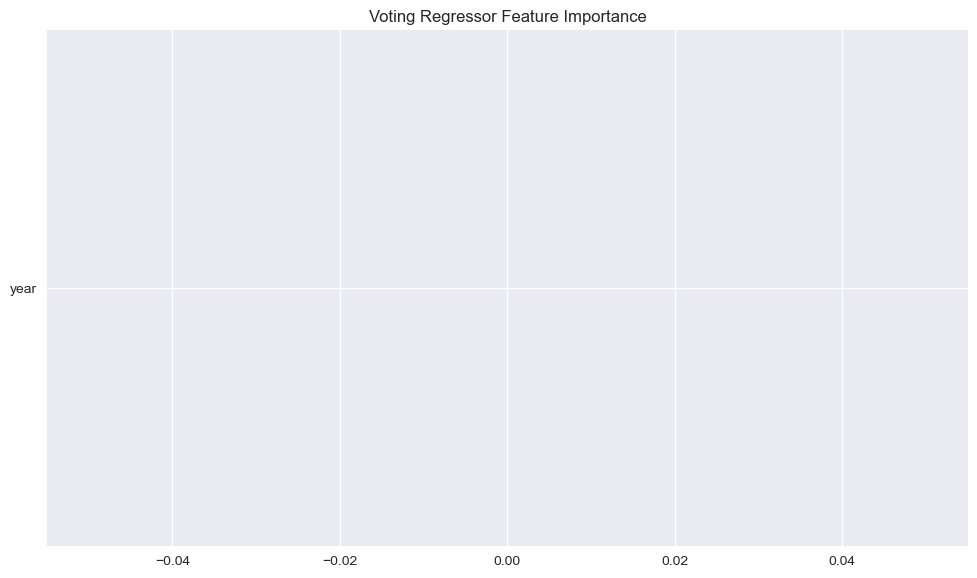


Voting Regressor Evaluation:
  MAE: 13.27
  MSE: 181.69
  RMSE: 13.48
  MAPE: 3.75%
  SMAPE: 3.74%
  R2: 0.99
Voting Regressor - Train MAE: 0.09, Test MAE: 13.27
Voting Regressor - Train RMSE: 0.10, Test RMSE: 13.48


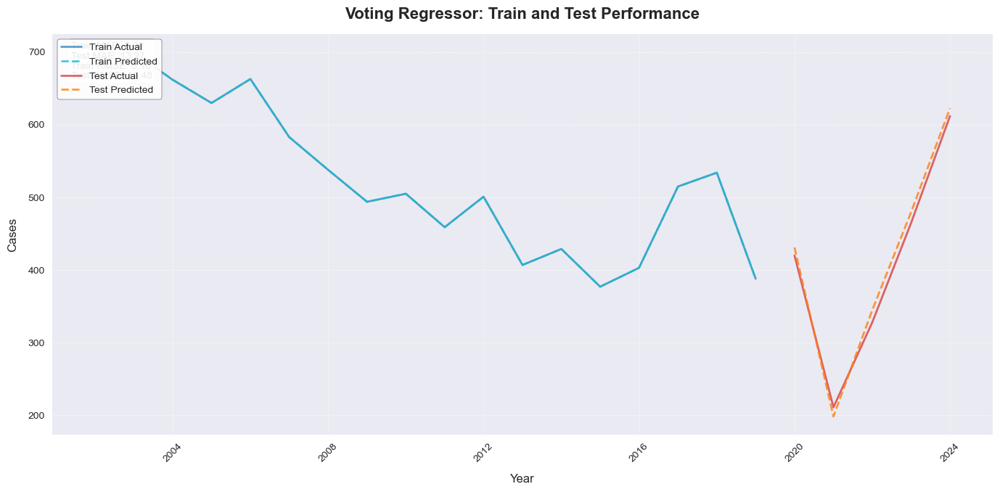

Error in run_xgboost_lr: 'XGBRegressor' object has no attribute 'estimators_'
XGBoost-LR model failed: 'XGBRegressor' object has no attribute 'estimators_'


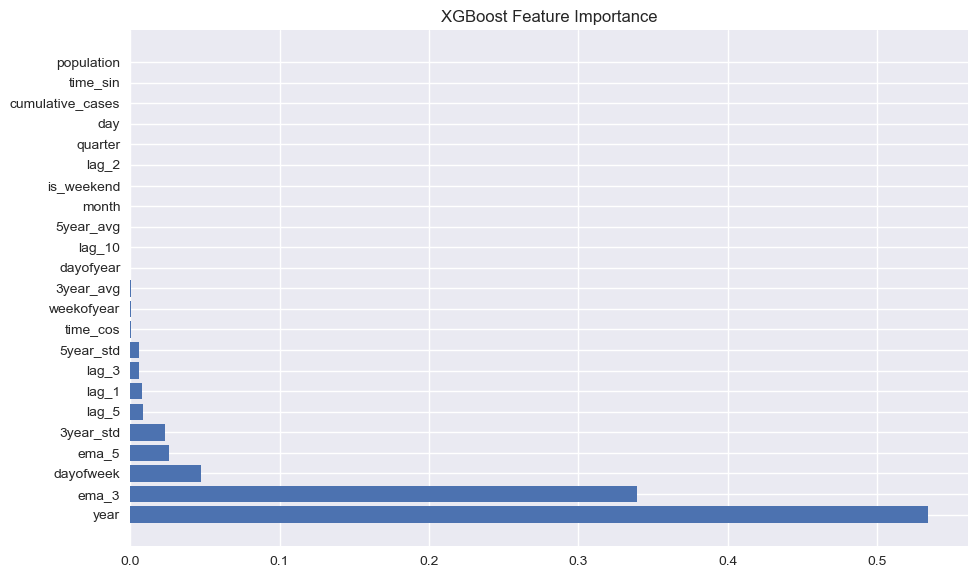


XGBoost Evaluation:
  MAE: 80.30
  MSE: 10144.65
  RMSE: 100.72
  MAPE: 27.89%
  SMAPE: 21.94%
  R2: 0.44
XGBoost - Train MAE: 0.17, Test MAE: 80.30
XGBoost - Train RMSE: 0.26, Test RMSE: 100.72


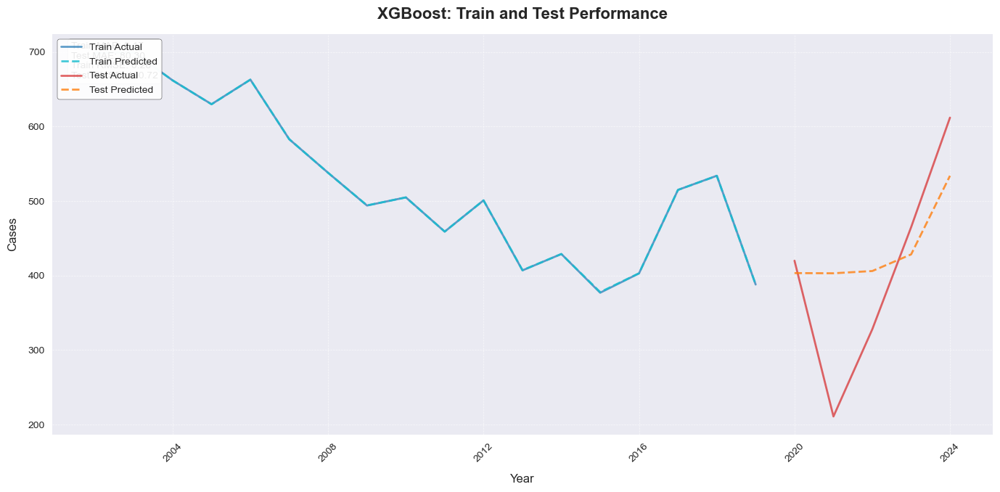

  File "C:\Users\user\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\user\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\user\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\user\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


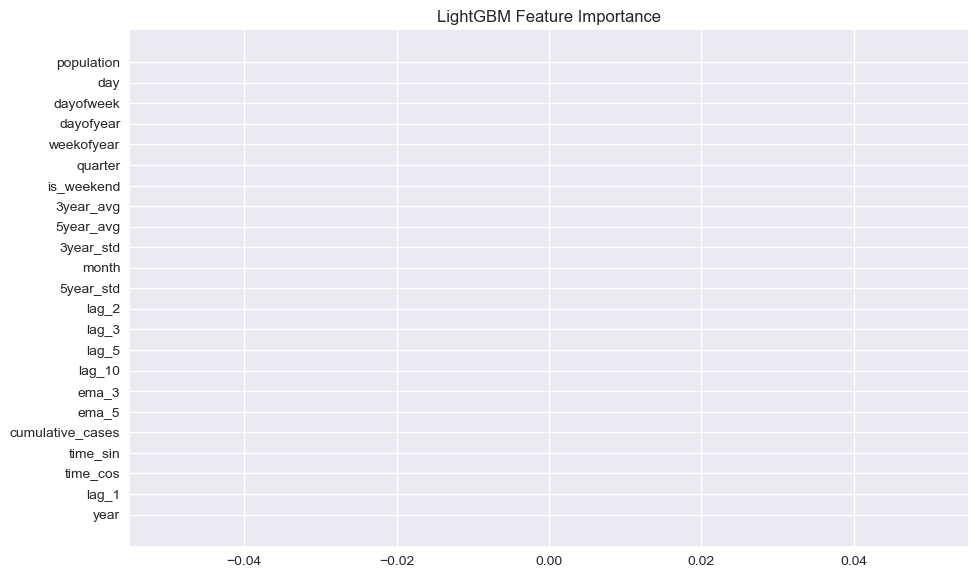


LightGBM Evaluation:
  MAE: 153.83
  MSE: 32405.38
  RMSE: 180.01
  MAPE: 52.64%
  SMAPE: 36.45%
  R2: -0.80
LightGBM - Train MAE: 88.05, Test MAE: 153.83
LightGBM - Train RMSE: 104.96, Test RMSE: 180.01


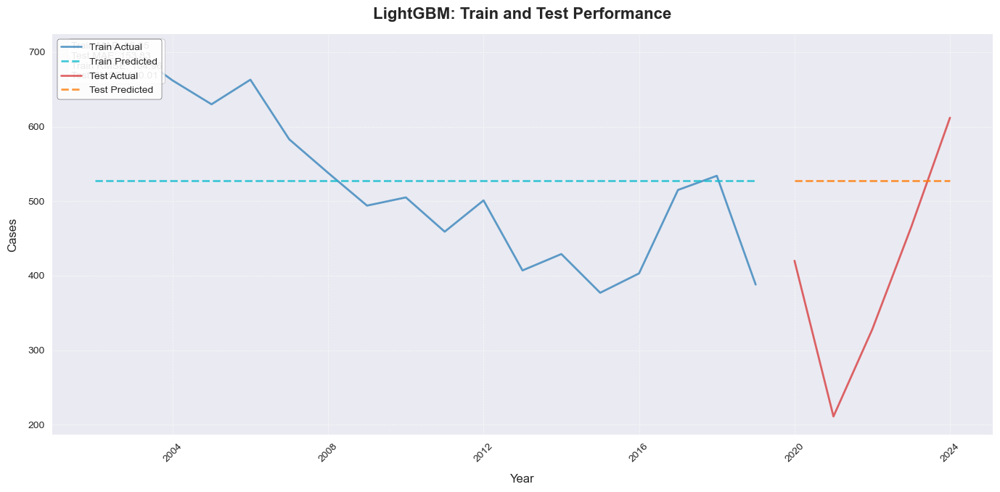

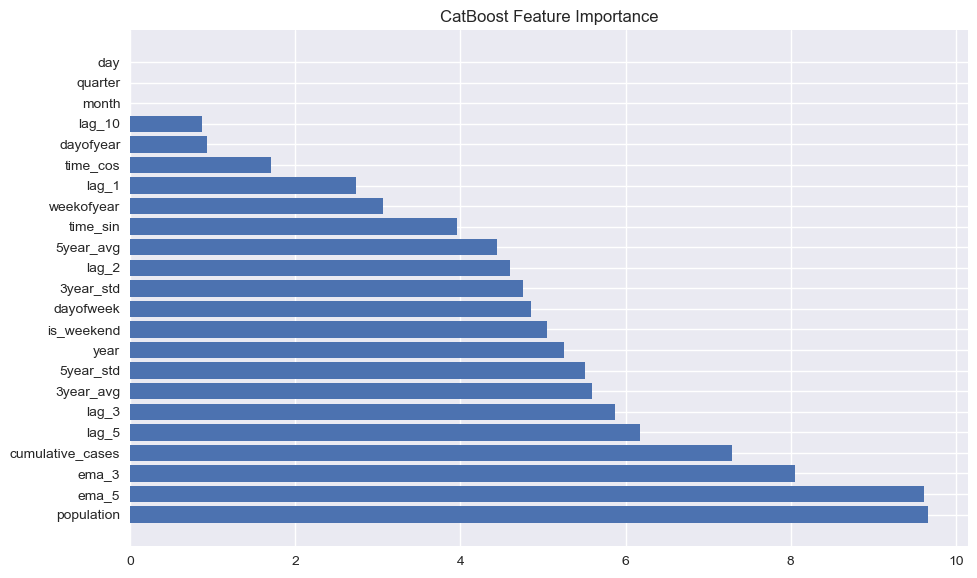


CatBoost Evaluation:
  MAE: 104.34
  MSE: 18317.07
  RMSE: 135.34
  MAPE: 37.16%
  SMAPE: 26.91%
  R2: -0.02
CatBoost - Train MAE: 2.78, Test MAE: 104.34
CatBoost - Train RMSE: 3.50, Test RMSE: 135.34


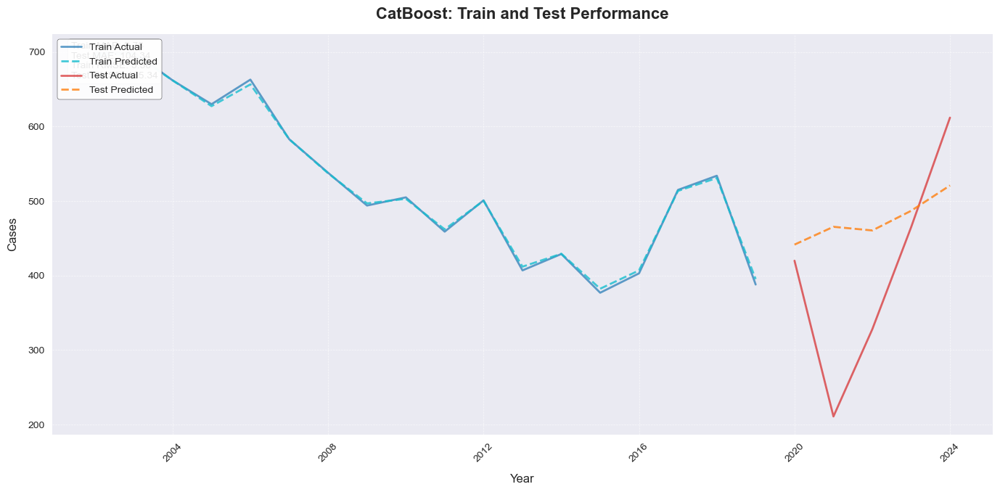

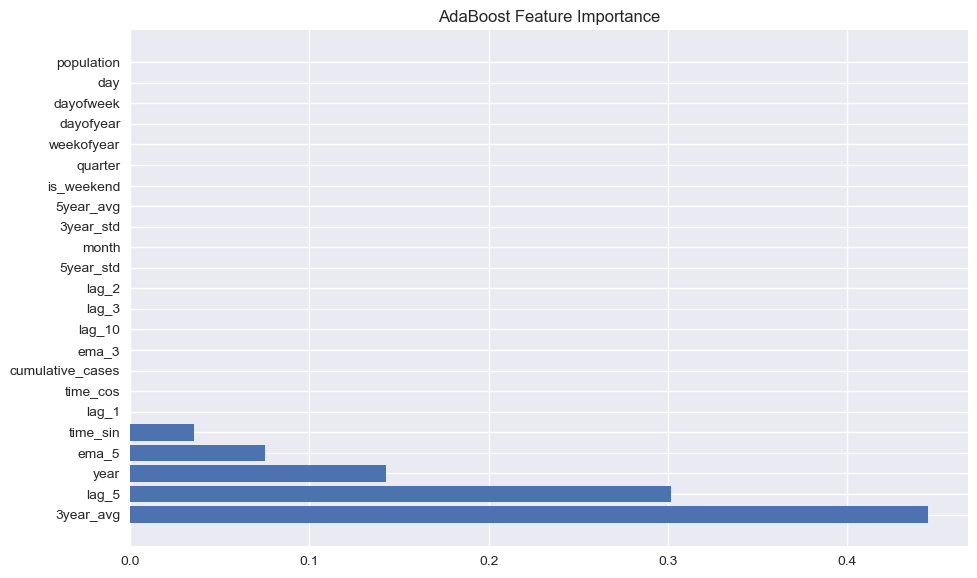


AdaBoost Evaluation:
  MAE: 110.34
  MSE: 18043.80
  RMSE: 134.33
  MAPE: 33.19%
  SMAPE: 28.36%
  R2: -0.00
AdaBoost - Train MAE: 28.94, Test MAE: 110.34
AdaBoost - Train RMSE: 38.69, Test RMSE: 134.33


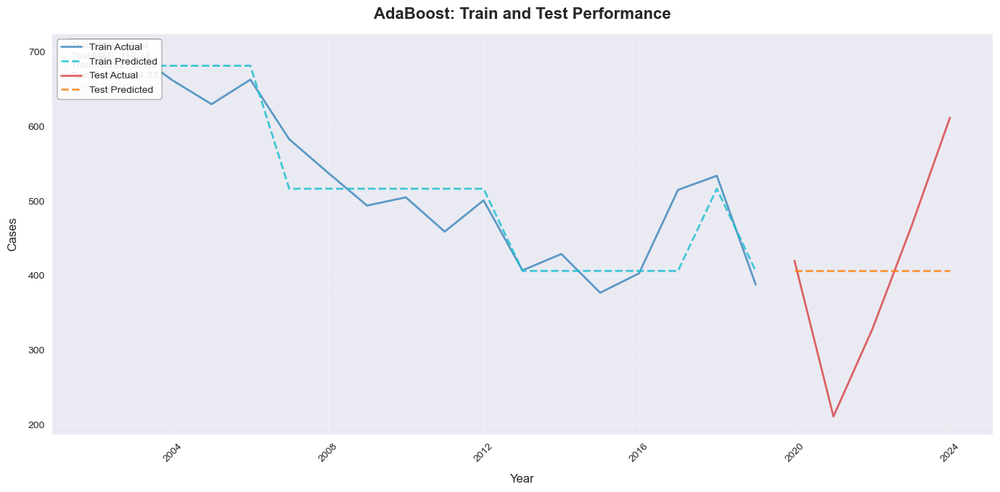


SVR Evaluation:
  MAE: 158.08
  MSE: 34162.33
  RMSE: 184.83
  MAPE: 54.16%
  SMAPE: 37.18%
  R2: -0.89
SVR - Train MAE: 6.83, Test MAE: 158.08
SVR - Train RMSE: 13.83, Test RMSE: 184.83


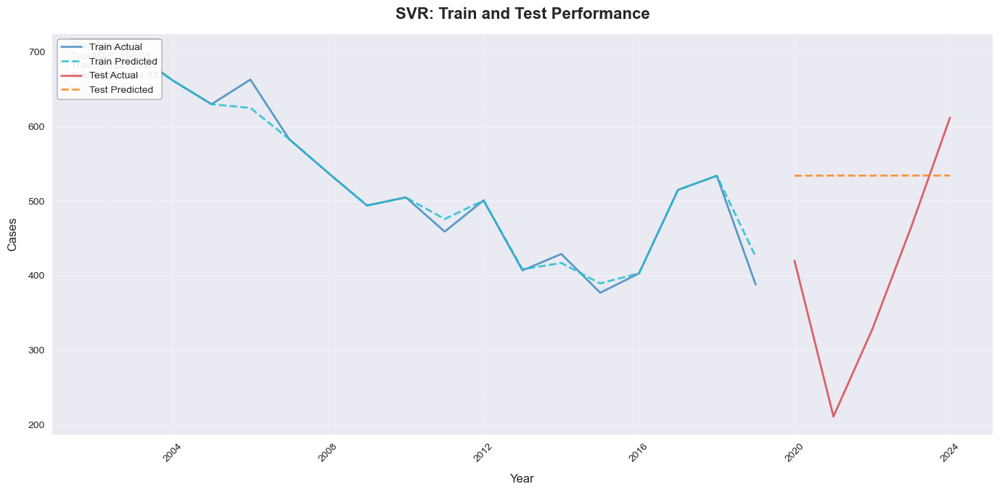


KNN Evaluation:
  MAE: 114.36
  MSE: 19896.28
  RMSE: 141.05
  MAPE: 37.36%
  SMAPE: 29.05%
  R2: -0.10
KNN - Train MAE: 30.85, Test MAE: 114.36
KNN - Train RMSE: 37.48, Test RMSE: 141.05


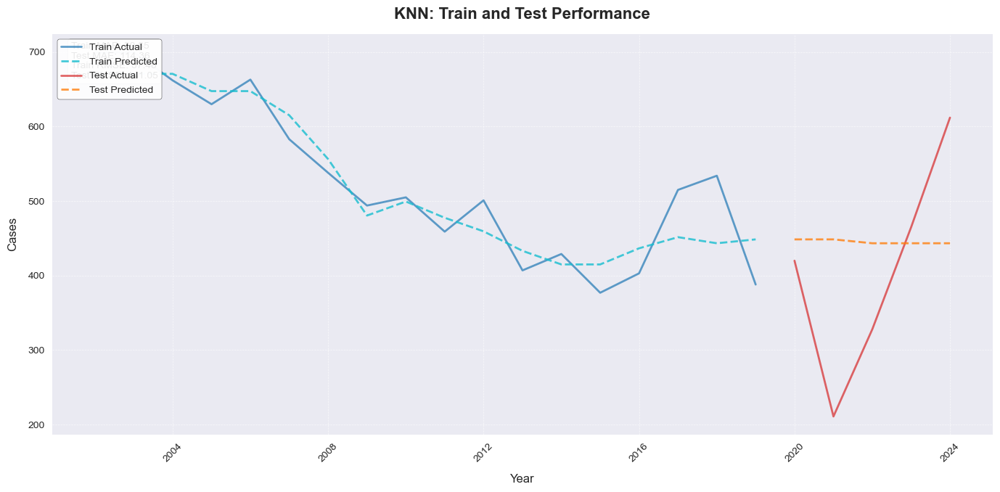

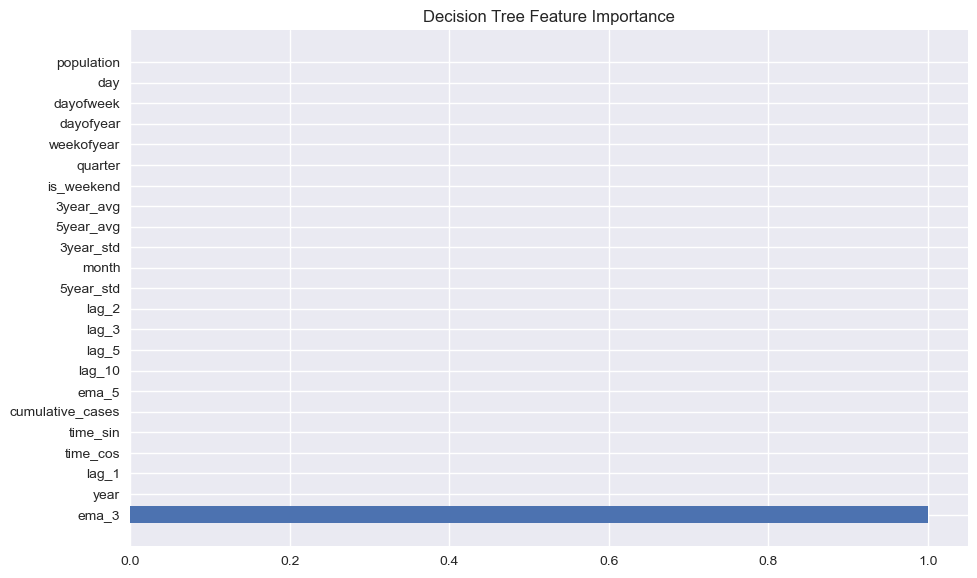


Decision Tree Evaluation:
  MAE: 90.29
  MSE: 11385.87
  RMSE: 106.70
  MAPE: 29.55%
  SMAPE: 24.08%
  R2: 0.37
Decision Tree - Train MAE: 22.57, Test MAE: 90.29
Decision Tree - Train RMSE: 29.52, Test RMSE: 106.70


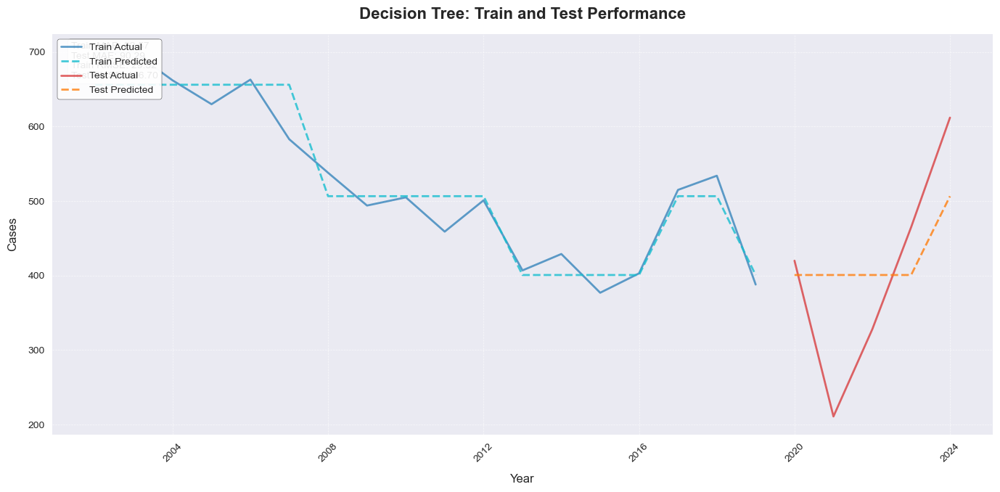

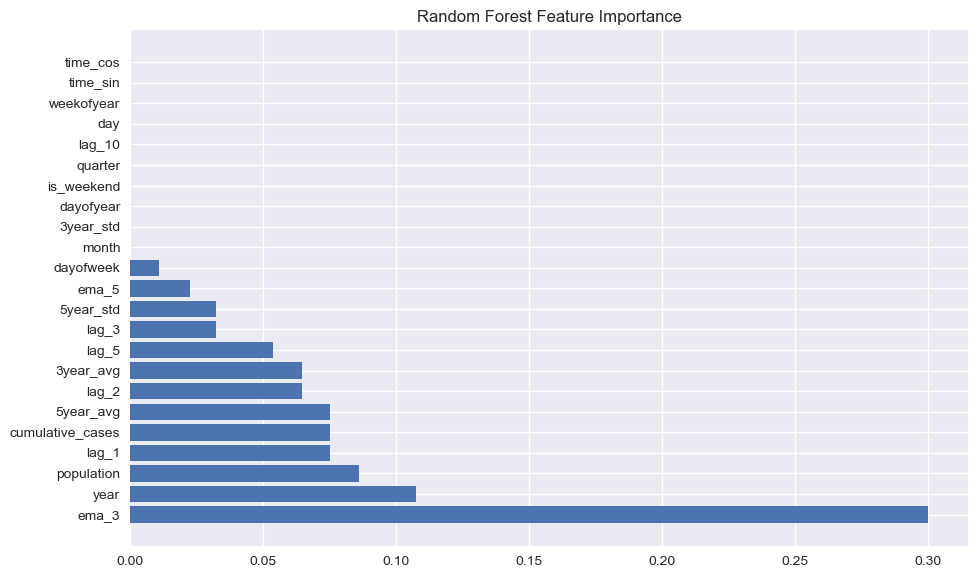


Random Forest Evaluation:
  MAE: 110.80
  MSE: 19798.12
  RMSE: 140.71
  MAPE: 38.65%
  SMAPE: 28.25%
  R2: -0.10
Random Forest - Train MAE: 43.75, Test MAE: 110.80
Random Forest - Train RMSE: 50.80, Test RMSE: 140.71


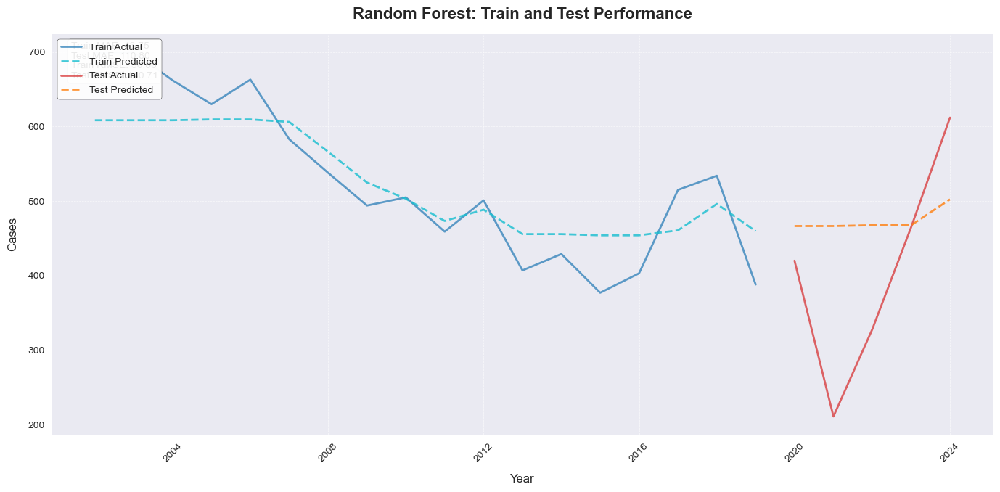

Training boosting base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining boosting base models on full training set...


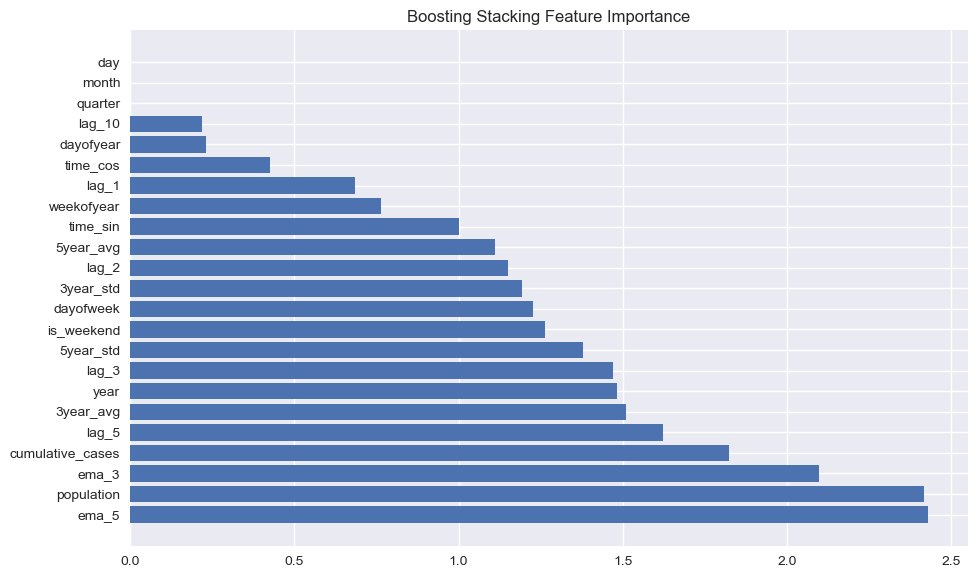


Boosting Stacking Evaluation:
  MAE: 151.10
  MSE: 33909.59
  RMSE: 184.15
  MAPE: 52.60%
  SMAPE: 35.31%
  R2: -0.88
Boosting Stacking - Train MAE: 165.60, Test MAE: 151.10
Boosting Stacking - Train RMSE: 208.71, Test RMSE: 184.15


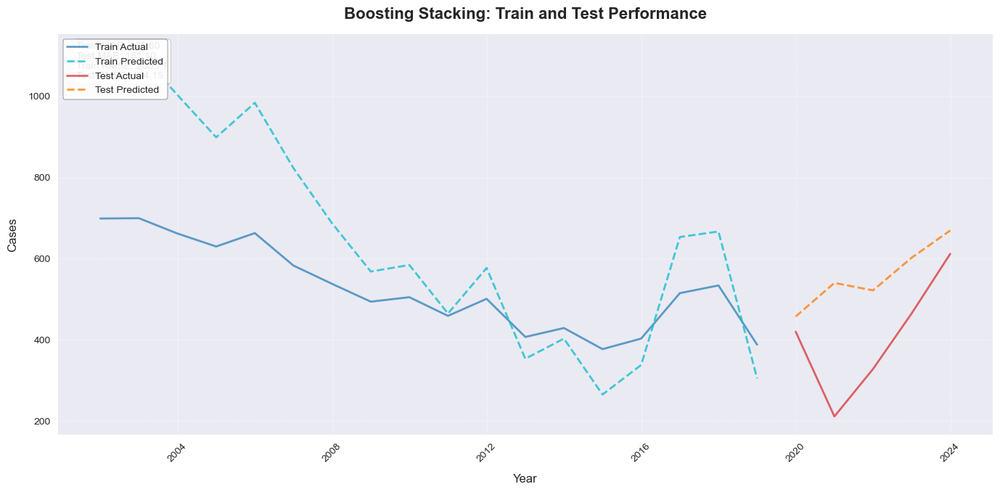

Training tree-based base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining tree-based base models on full training set...


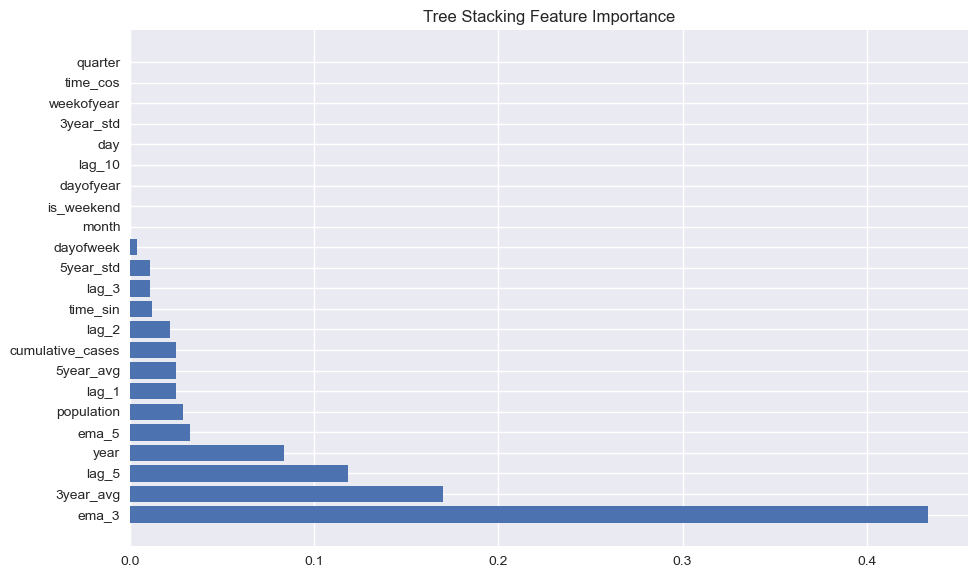


Tree Stacking Evaluation:
  MAE: 244.80
  MSE: 79018.35
  RMSE: 281.10
  MAPE: 69.84%
  SMAPE: 47.17%
  R2: -3.38
Tree Stacking - Train MAE: 183.96, Test MAE: 244.80
Tree Stacking - Train RMSE: 251.04, Test RMSE: 281.10


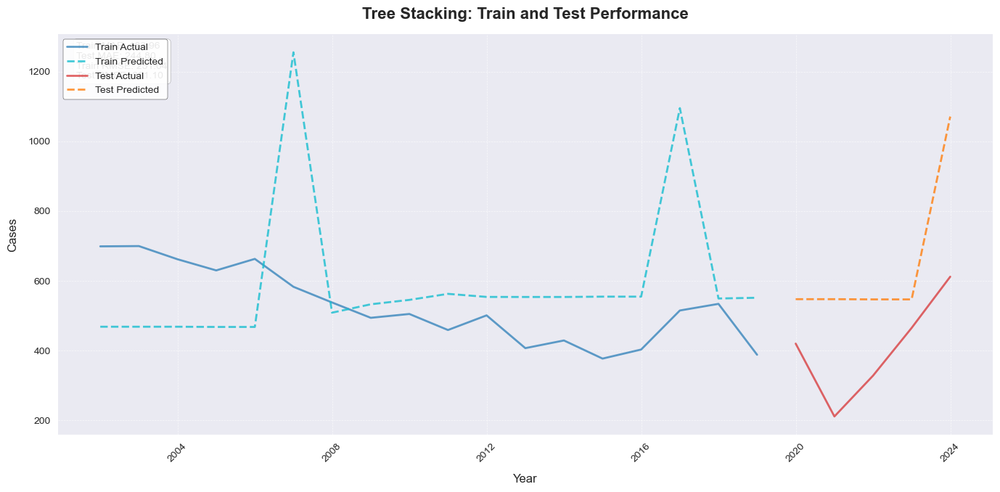

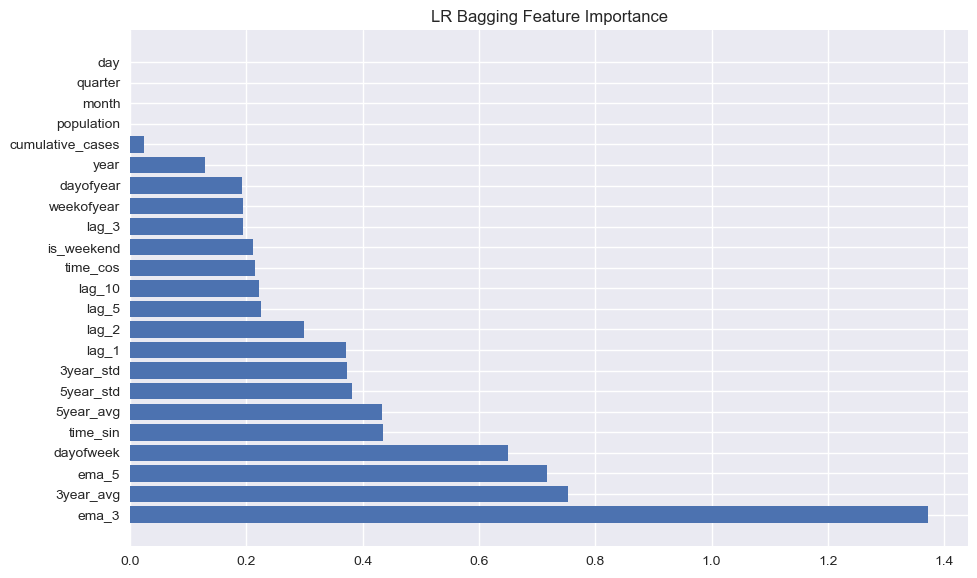


LR Bagging Evaluation:
  MAE: 107.67
  MSE: 12654.97
  RMSE: 112.49
  MAPE: 33.20%
  SMAPE: 27.10%
  R2: 0.30
LR Bagging - Train MAE: 6.49, Test MAE: 107.67
LR Bagging - Train RMSE: 9.05, Test RMSE: 112.49


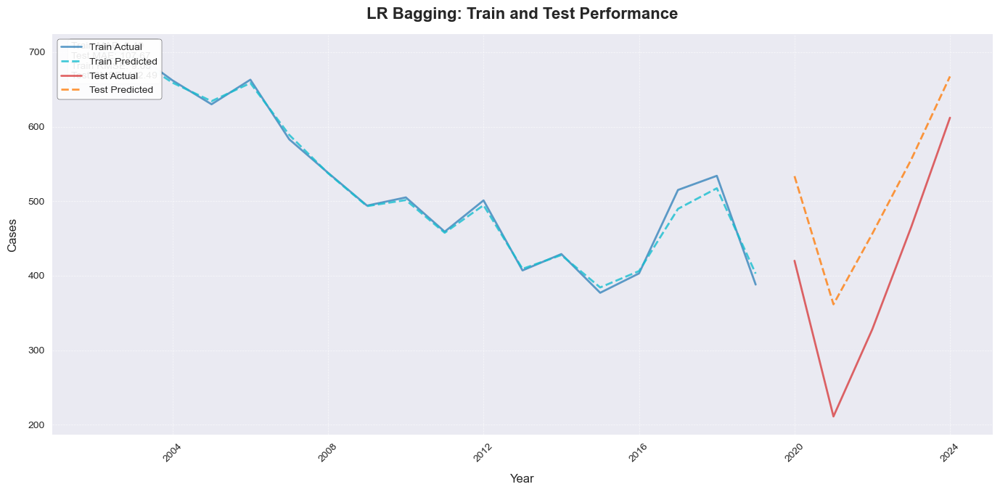

17:00:21 - cmdstanpy - INFO - Chain [1] start processing
17:00:21 - cmdstanpy - INFO - Chain [1] done processing


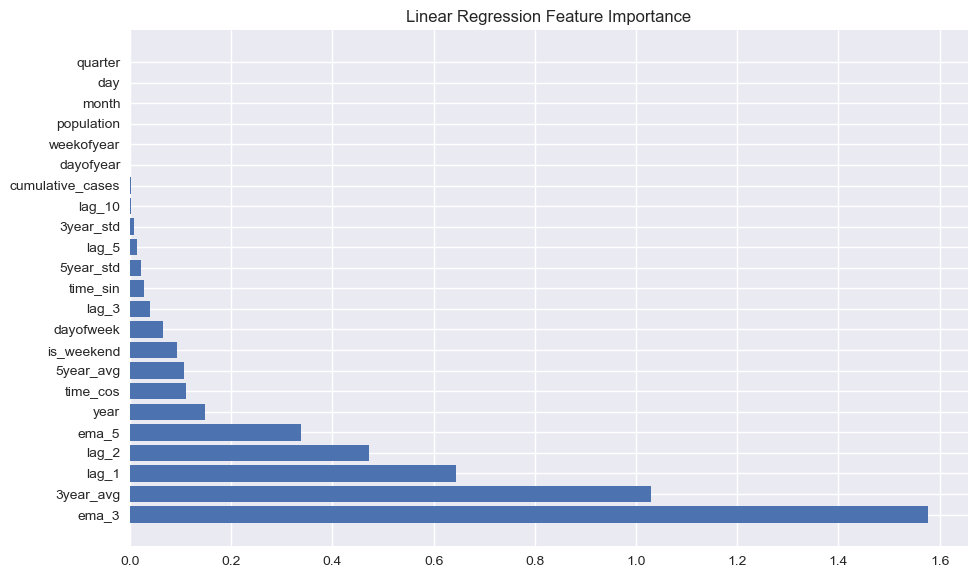

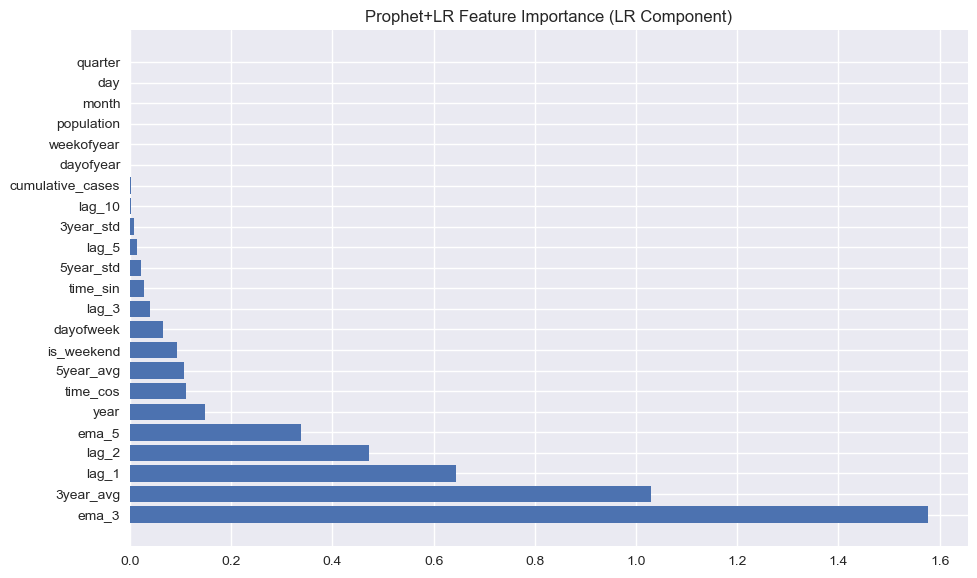


Prophet+LR Evaluation:
  MAE: 52.25
  MSE: 3902.37
  RMSE: 62.47
  MAPE: 12.55%
  SMAPE: 13.56%
  R2: 0.78
Prophet+LR - Train MAE: 2.94, Test MAE: 52.25
Prophet+LR - Train RMSE: 3.63, Test RMSE: 62.47


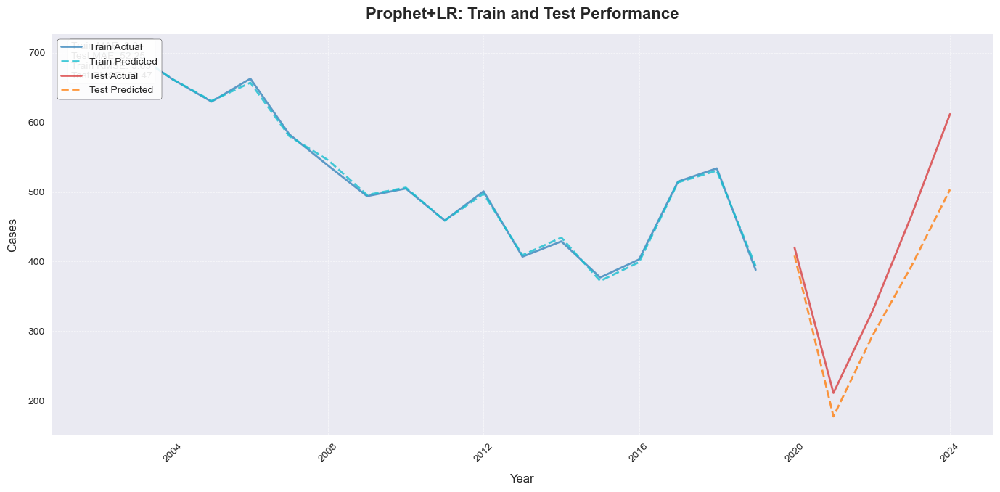


ANN Evaluation:
  MAE: 162.55
  MSE: 42073.06
  RMSE: 205.12
  MAPE: 36.45%
  SMAPE: 44.44%
  R2: -1.33
ANN - Train MAE: 251.10, Test MAE: 162.55
ANN - Train RMSE: 271.12, Test RMSE: 205.12


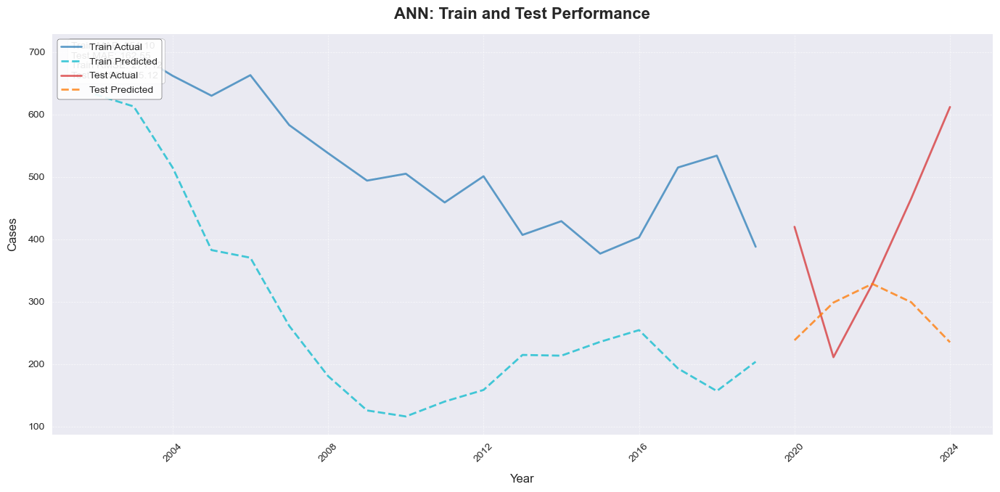

Running ACO for feature selection...
Iteration 0, Best MAE: 18.14
Iteration 10, Best MAE: 17.10
Iteration 20, Best MAE: 8.49
Iteration 30, Best MAE: 8.49
Iteration 40, Best MAE: 8.49


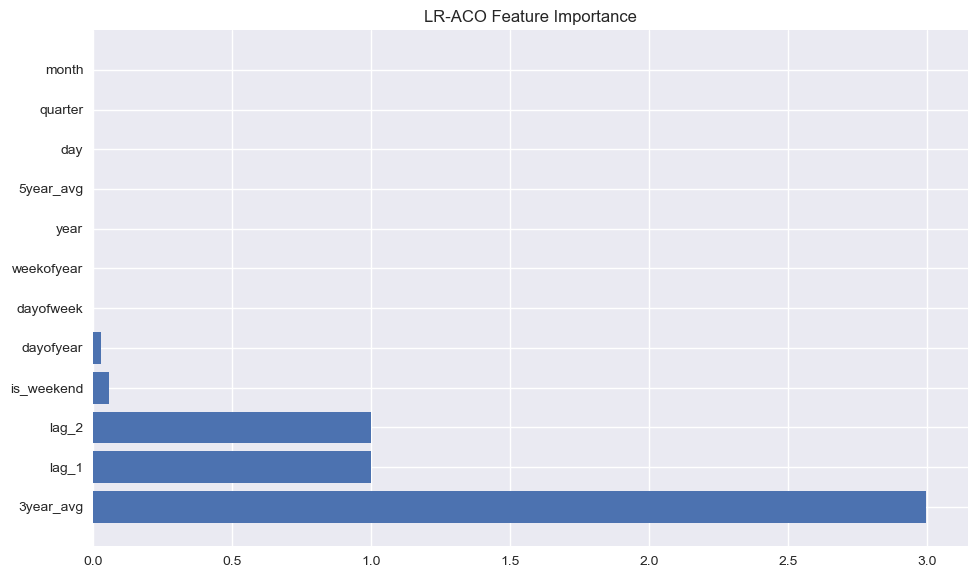


LR-ACO Evaluation:
  MAE: 20.91
  MSE: 2173.18
  RMSE: 46.62
  MAPE: 9.89%
  SMAPE: 13.13%
  R2: 0.88
LR-ACO - Train MAE: 0.04, Test MAE: 20.91
LR-ACO - Train RMSE: 0.07, Test RMSE: 46.62


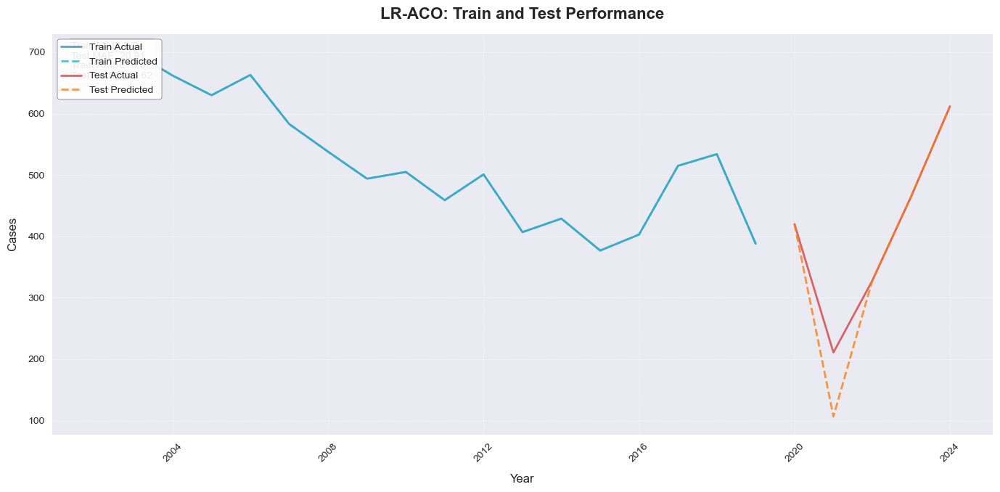

Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 42.70
Iteration 10, Best MAE: 40.61
Iteration 20, Best MAE: 40.61
Iteration 30, Best MAE: 40.61
Iteration 40, Best MAE: 40.61


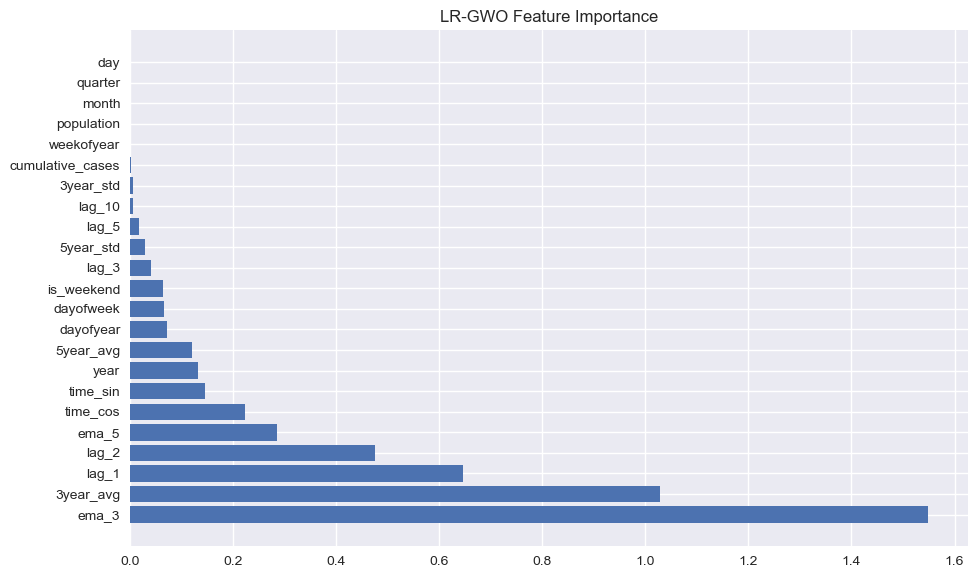


LR-GWO Evaluation:
  MAE: 8.69
  MSE: 217.20
  RMSE: 14.74
  MAPE: 3.58%
  SMAPE: 3.84%
  R2: 0.99
LR-GWO - Train MAE: 0.03, Test MAE: 8.69
LR-GWO - Train RMSE: 0.03, Test RMSE: 14.74


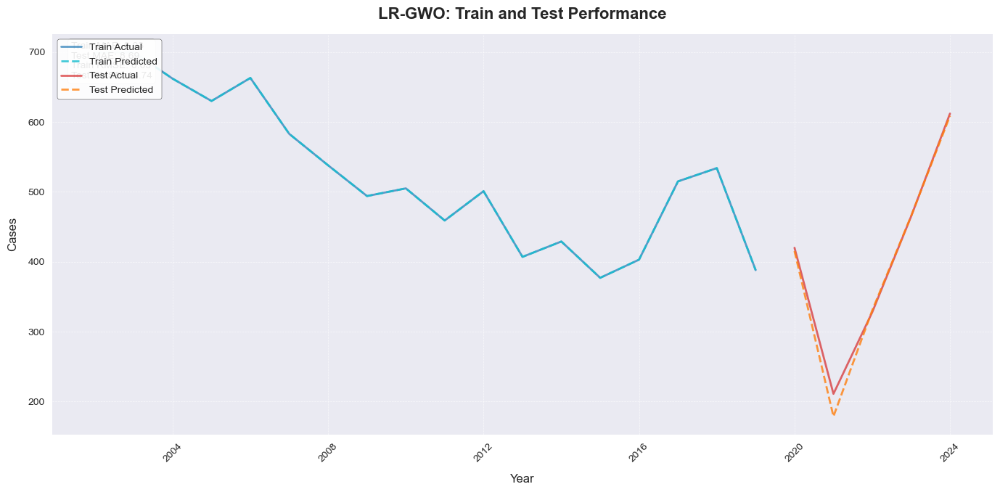

Running ACO for feature selection...
Iteration 0, Best MAE: 18.58
Iteration 10, Best MAE: 17.50
Iteration 20, Best MAE: 10.63
Iteration 30, Best MAE: 10.63
Iteration 40, Best MAE: 10.63
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 11.32
Iteration 10, Best MAE: 11.15
Iteration 20, Best MAE: 11.15
Iteration 30, Best MAE: 11.15
Iteration 40, Best MAE: 11.15


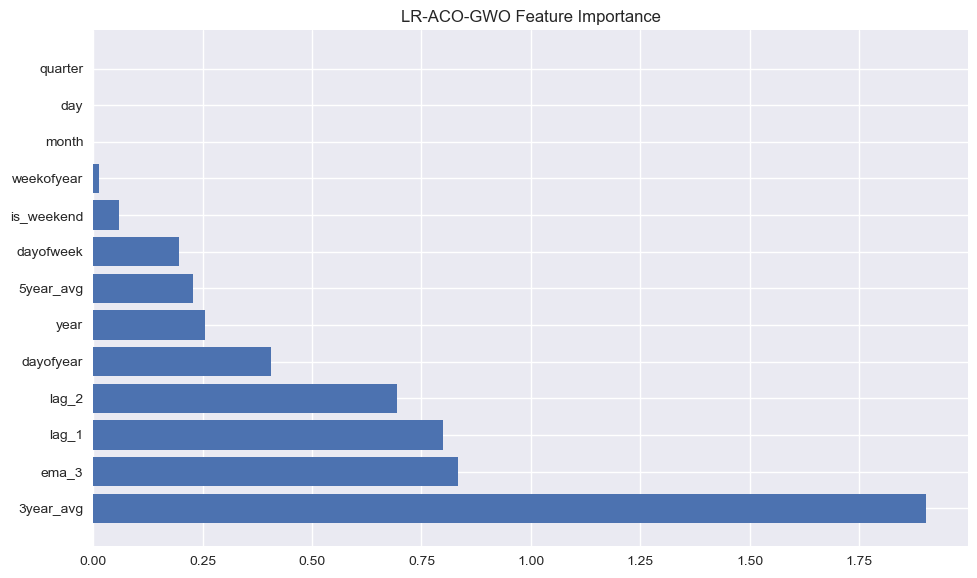


LR-ACO-GWO Evaluation:
  MAE: 13.36
  MSE: 593.82
  RMSE: 24.37
  MAPE: 5.81%
  SMAPE: 6.54%
  R2: 0.97
LR-ACO-GWO - Train MAE: 0.51, Test MAE: 13.36
LR-ACO-GWO - Train RMSE: 0.61, Test RMSE: 24.37


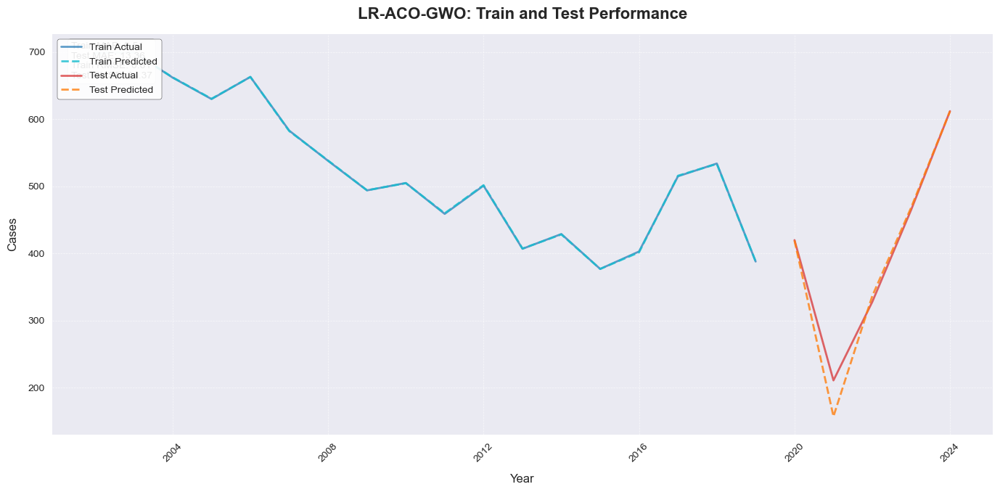

Running ACO for feature selection...
Iteration 0, Best MAE: 18.59
Iteration 10, Best MAE: 17.07
Iteration 20, Best MAE: 17.07
Iteration 30, Best MAE: 15.91
Iteration 40, Best MAE: 15.91
Selected features by ACO: ['year', 'month', 'day', 'dayofweek', 'is_weekend', 'weekofyear', 'quarter', '3year_avg', 'dayofyear', '3year_std', '5year_avg', '5year_std', 'lag_1', 'lag_3', 'ema_3', 'lag_2', 'ema_5']
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 16.86
Iteration 10, Best MAE: 13.93
Iteration 20, Best MAE: 13.93
Iteration 30, Best MAE: 13.93
Iteration 40, Best MAE: 13.93
Optimized hyperparameters: {'n_estimators': 13.152140289983732, 'max_samples': 1.0}


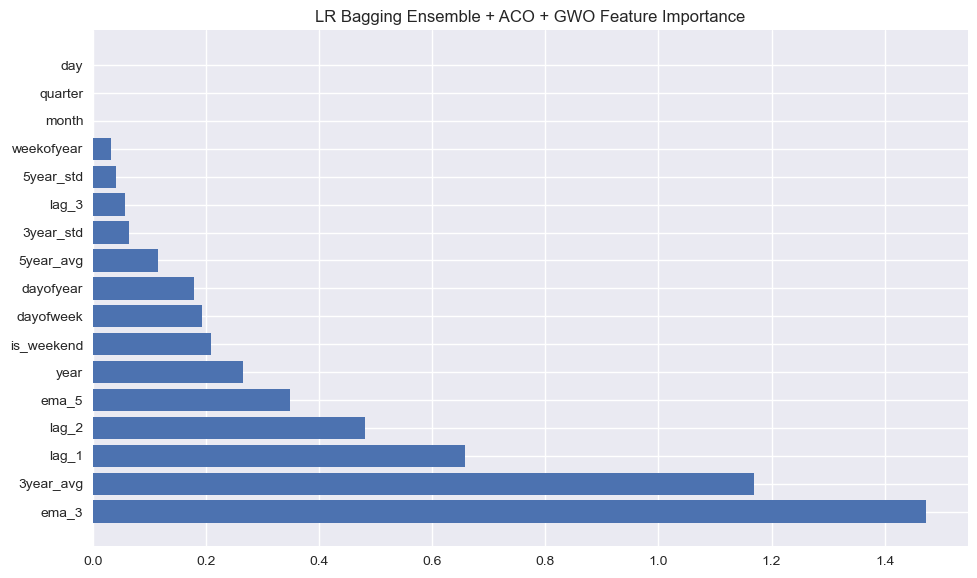


LR Bagging ACO GWO Evaluation:
  MAE: 11.08
  MSE: 269.78
  RMSE: 16.42
  MAPE: 4.22%
  SMAPE: 4.53%
  R2: 0.99
LR Bagging ACO GWO - Train MAE: 0.78, Test MAE: 11.08
LR Bagging ACO GWO - Train RMSE: 1.29, Test RMSE: 16.42


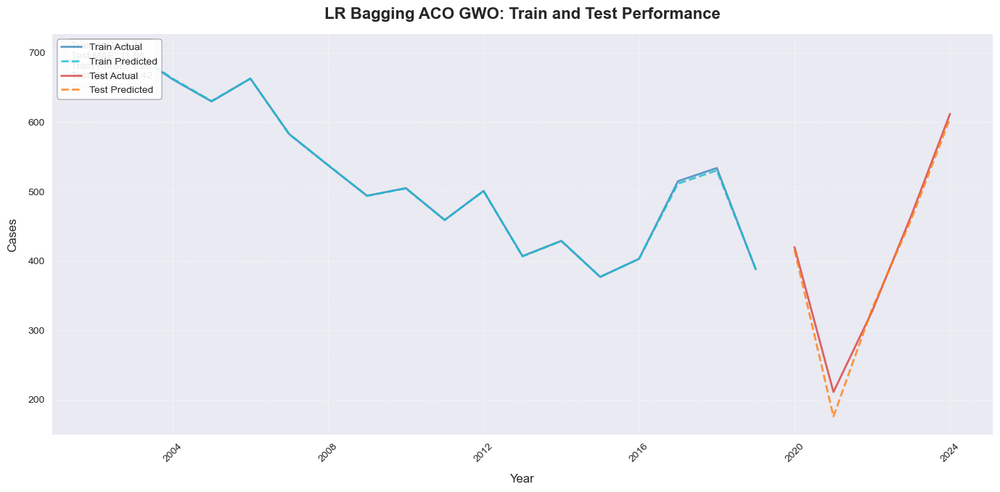


Model Performance Summary (sorted by MAE):
             Model        MAE          MSE       RMSE      MAPE     SMAPE        R2
 Linear Regression   8.420986   210.896393  14.522272  3.513067  3.762396  0.988311
            LR-GWO   8.694786   217.203461  14.737824  3.581092  3.836316  0.987962
LR Bagging ACO GWO  11.075535   269.775179  16.424834  4.223066  4.529729  0.985048
  Voting Regressor  13.266400   181.689968  13.479242  3.752850  3.743482  0.989930
        LR-ACO-GWO  13.355060   593.823759  24.368499  5.809083  6.542506  0.967088
            LR-ACO  20.907200  2173.181545  46.617395  9.893439 13.134690  0.879555
        Prophet+LR  52.245355  3902.365866  62.468919 12.549401 13.564633  0.783718
           XGBoost  80.300159 10144.654240 100.720674 27.890209 21.940055  0.437750
     Decision Tree  90.285714 11385.868735 106.704586 29.550500 24.076724  0.368958
          CatBoost 104.339352 18317.066397 135.340557 37.155874 26.913468 -0.015192
        LR Bagging 107.666389 12

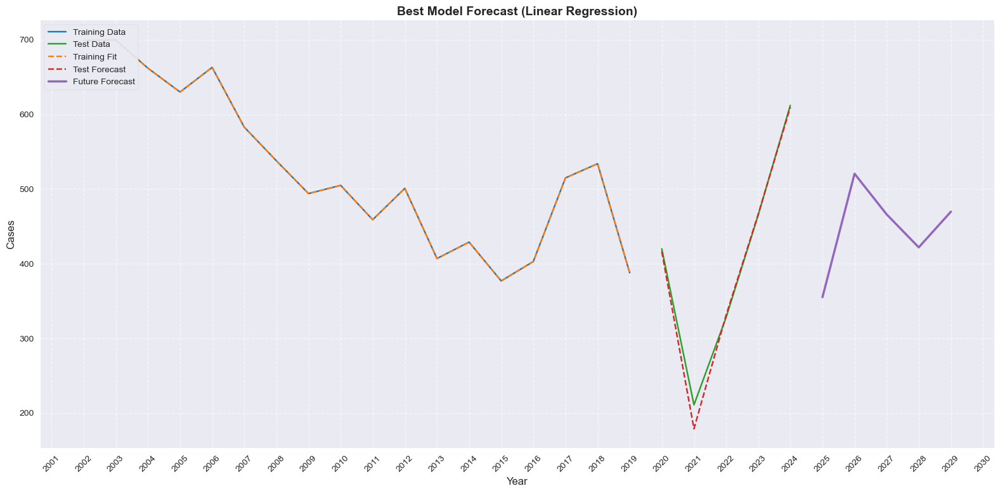

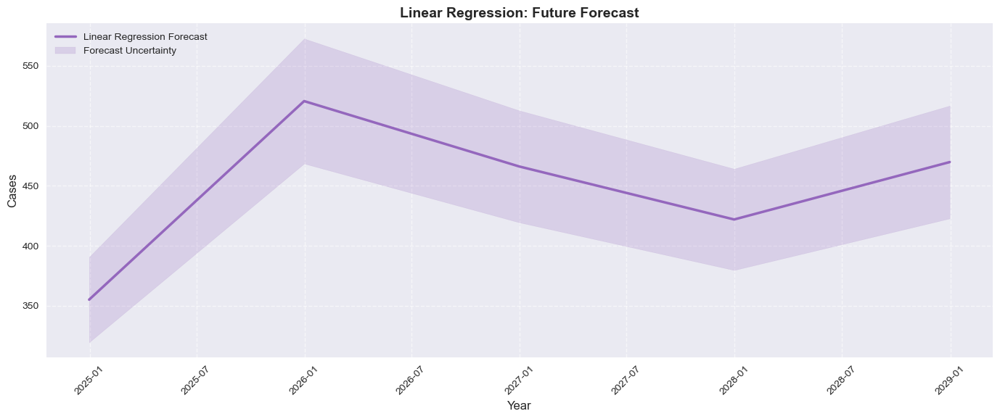


Future Forecasts for All Models:

Prophet Forecast:
        ds        yhat
2024-12-31   35.137671
2025-12-31    0.293810
2026-12-31  -34.519313
2027-12-31  -65.900584
2028-12-31 -107.199067

Linear Regression Forecast:
        ds       yhat
2024-12-31 355.144090
2025-12-31 520.594054
2026-12-31 466.142490
2027-12-31 421.951324
2028-12-31 469.784998

Voting Regressor Forecast:
        ds       yhat
2024-12-31 372.960097
2025-12-31 522.034122
2026-12-31 470.101728
2027-12-31 433.495667
2028-12-31 471.238434

XGBoost Forecast:
        ds       yhat
2024-12-31 532.364319
2025-12-31 532.851868
2026-12-31 533.542664
2027-12-31 530.441345
2028-12-31 526.781799

LightGBM Forecast:
        ds       yhat
2024-12-31 527.043335
2025-12-31 527.043335
2026-12-31 527.043335
2027-12-31 527.043335
2028-12-31 527.043335

CatBoost Forecast:
        ds       yhat
2024-12-31 474.570805
2025-12-31 465.369667
2026-12-31 485.550136
2027-12-31 492.658286
2028-12-31 516.251488

AdaBoost Forecast:
        ds   

In [29]:
from sklearn.ensemble import AdaBoostRegressor
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from scipy.ndimage import gaussian_filter1d
from statsmodels.tsa.seasonal import STL
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import VotingRegressor, BaggingRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from datetime import timedelta
import matplotlib.dates as mdates


# Configure logging to suppress unnecessary warnings
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

# Define universal feature set for ML models (updated for annual data)
FEATURES = [
    'year', 'month', 'day', 'dayofweek', 'dayofyear', 'weekofyear', 'quarter', 'is_weekend',
    '3year_avg', '5year_avg', '3year_std', '5year_std', 'lag_1', 'lag_2', 'lag_3', 'lag_5',
    'lag_10', 'ema_3', 'ema_5', 'cumulative_cases', 'time_sin', 'time_cos', 'population'
]

# === DATA PREPROCESSING ===

def preprocess_data(df, frequency='Y', group_by_year=True):
    """Preprocess input DataFrame for annual forecasting, handling multiple rows per year."""
    try:
        if not isinstance(df, pd.DataFrame):
            raise ValueError("Input must be a pandas DataFrame")
        if 'Cases' not in df.columns:
            raise ValueError("DataFrame must contain 'Cases' column")
            
        df = df.copy()
        
        # Reset index if Year is the index
        if df.index.name == 'Year':
            df = df.reset_index()
        
        # Aggregate by year, summing cases and averaging population
        agg_dict = {
            'Cases': 'sum',
            'Population': 'mean'
        }
        
        # Ensure we have a Year column
        if 'Year' not in df.columns and df.index.name != 'Year':
            raise ValueError("Data must have either a 'Year' column or a 'Year' index")
        
        # Convert Year to datetime if it's not already
        if 'Year' in df.columns:
            df['ds'] = pd.to_datetime(df['Year'], format='%Y')
        else:
            df['ds'] = pd.to_datetime(df.index, format='%Y')
            
        if group_by_year:
            df_agg = df.groupby('ds').agg(agg_dict).reset_index()
        else:
            df_agg = df.copy()
            
        df_agg = df_agg.rename(columns={'Cases': 'y', 'Population': 'population'})
        df_agg.set_index('ds', inplace=True)
        
        # Handle resampling (though with annual data this may not change much)
        numeric_cols = ['y', 'population']
        
        df_numeric = df_agg[numeric_cols].resample(frequency).sum(numeric_only=True).fillna(0)
        df_agg = df_numeric
        
        # Ensure population is not all zeros or NaN
        df_agg['population'] = df_agg['population'].fillna(df_agg['population'].mean())
        if df_agg['population'].isna().all():
            print("Warning: Population column is all NaN after filling")
            df_agg['population'] = 1  # Fallback to avoid division by zero

        # Smooth and transform the target variable
        df_agg['y'] = df_agg['y'].replace(0, np.nan).interpolate(method='time').fillna(method='bfill')
        df_agg['y'] = df_agg['y'].clip(lower=df_agg['y'].quantile(0.01), upper=df_agg['y'].quantile(0.99))
        df_agg['y_log'] = np.log(df_agg['y'].clip(lower=df_agg['y'].quantile(0.01)))
        df_agg = df_agg.reset_index()

        return df_agg, {}
    except Exception as e:
        print(f"Error in preprocess_data: {e}")
        raise

def add_features(df, encoders=None, is_future=False, base_df=None):
    """Add time-series features to DataFrame for annual forecasting."""
    try:
        df = df.copy()
        if 'ds' not in df.columns:
            raise ValueError("DataFrame must contain 'ds' column with dates")
            
        df['ds'] = pd.to_datetime(df['ds'])
        
        # Extract year and basic time features
        df['year'] = df['ds'].dt.year
        df['month'] = df['ds'].dt.month
        df['day'] = df['ds'].dt.day
        df['dayofweek'] = df['ds'].dt.dayofweek
        df['dayofyear'] = df['ds'].dt.dayofyear
        df['weekofyear'] = df['ds'].dt.isocalendar().week
        df['quarter'] = df['ds'].dt.quarter
        df['is_weekend'] = df['dayofweek'].ge(5).astype(int)

        if not is_future:
            if 'y' not in df.columns:
                raise ValueError("Historical data must contain 'y' column")
                
            df.set_index('ds', inplace=True)
            
            # Annual rolling statistics (3 and 5 year windows)
            for window in [3, 5]:
                df[f'{window}year_avg'] = df['y'].rolling(window, min_periods=1).mean().fillna(method='bfill')
                df[f'{window}year_std'] = df['y'].rolling(window, min_periods=1).std().fillna(method='bfill')
            
            # Annual lags
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                df[f'lag_{lag}'] = df['y'].shift(lag).fillna(method='bfill')
                
            # Exponential moving averages
            df['ema_3'] = df['y'].ewm(span=3, adjust=False).mean().fillna(method='bfill')
            df['ema_5'] = df['y'].ewm(span=5, adjust=False).mean().fillna(method='bfill')
            
            # Cumulative cases
            df['cumulative_cases'] = df['y'].cumsum().fillna(method='bfill')
            
            # Time-based cyclical features
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            df = df.reset_index()
        else:
            if base_df is None:
                raise ValueError("base_df must be provided for future forecasting")
            
            # Use historical data to populate features for future forecasts
            lags = [1, 2, 3, 5, 10]
            latest_values = base_df.tail(max(lags)).copy()
            y_values = latest_values['y'].values if 'y' in latest_values.columns else np.zeros(len(latest_values))
            
            for window in [3, 5]:
                df[f'{window}year_avg'] = base_df[f'{window}year_avg'].iloc[-window:].mean()
                df[f'{window}year_std'] = base_df[f'{window}year_std'].iloc[-window:].mean()
            
            for lag in lags:
                if len(y_values) >= lag:
                    df[f'lag_{lag}'] = y_values[-lag]
                else:
                    df[f'lag_{lag}'] = y_values[-1] if len(y_values) > 0 else 0
            
            df['ema_3'] = base_df['ema_3'].iloc[-1] if 'ema_3' in base_df.columns else 0
            df['ema_5'] = base_df['ema_5'].iloc[-1] if 'ema_5' in base_df.columns else 0
            df['cumulative_cases'] = base_df['cumulative_cases'].iloc[-1] if 'cumulative_cases' in base_df.columns else 0
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            # Handle population
            if 'population' in base_df.columns:
                df['population'] = base_df['population'].iloc[-1]
            else:
                df['population'] = 0  # Default value if missing

        # Ensure all features exist, fill missing ones with reasonable defaults
        for feature in FEATURES:
            if feature not in df.columns:
                if 'lag_' in feature:
                    df[feature] = 0  # Default for lags
                elif 'avg' in feature or 'std' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                elif 'ema' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                else:
                    df[feature] = 0
                
        # Final check for missing values
        df[FEATURES] = df[FEATURES].fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        return df
    except Exception as e:
        print(f"Detailed error in add_features: {str(e)}")
        if 'df' in locals():
            print(f"DataFrame columns: {df.columns}")
            print(f"Missing features: {[f for f in FEATURES if f not in df.columns]}")
        raise

# === MODEL IMPLEMENTATIONS ===

def create_prophet_model():
    """Create and configure a Prophet model for annual forecasting."""
    model = Prophet(
        seasonality_mode='multiplicative',
        changepoint_prior_scale=0.05,
        yearly_seasonality=False,  # No yearly seasonality for annual data
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_range=0.9
    )
    # Add custom seasonalities for longer cycles
    model.add_seasonality(name='decadal', period=10, fourier_order=3)  # 10-year cycle
    model.add_seasonality(name='quinquennial', period=5, fourier_order=2)  # 5-year cycle
    
    # Add relevant regressors
    for reg in ['3year_avg', '5year_avg', 'population']:
        model.add_regressor(reg)
    return model

def run_linear_regression(train_df, test_df, target='y'):
    """Fit and forecast using Linear Regression model."""
    try:
        # Ensure we have valid data
        if len(train_df) == 0 or len(test_df) == 0:
            raise ValueError("Empty training or test data provided")
            
        # Handle missing values more carefully
        train_clean = train_df.copy()
        test_clean = test_df.copy()
        
        # Fill missing values with median for numeric features
        for feature in FEATURES:
            if feature in train_clean.columns:
                median_val = train_clean[feature].median()
                train_clean[feature] = train_clean[feature].fillna(median_val)
                test_clean[feature] = test_clean[feature].fillna(median_val)
        
        # Ensure we have at least one sample
        if len(train_clean) == 0:
            raise ValueError("No valid training samples after cleaning")
        if len(test_clean) == 0:
            raise ValueError("No valid test samples after cleaning")
            
        X_train = train_clean[FEATURES]
        y_train = train_clean[target]
        X_test = test_clean[FEATURES]
        
        # Verify shapes
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
            
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance plot
        if len(FEATURES) > 0:
            fi = pd.DataFrame({
                'feature': FEATURES,
                'importance': np.abs(model.coef_)
            }).sort_values('importance', ascending=False)
            plt.figure(figsize=(10, 6))
            plt.barh(fi['feature'], fi['importance'])
            plt.title('Linear Regression Feature Importance')
            plt.tight_layout()
            plt.show()
            plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Detailed error in run_linear_regression: {str(e)}")
        print(f"Train shape: {train_df.shape if isinstance(train_df, pd.DataFrame) else 'N/A'}")
        print(f"Test shape: {test_df.shape if isinstance(test_df, pd.DataFrame) else 'N/A'}")
        if 'train_clean' in locals():
            print(f"Train features after cleaning: {train_clean[FEATURES].shape if isinstance(train_clean, pd.DataFrame) else 'N/A'}")
        raise

def run_voting_regressor(train_df, test_df, target='y'):
    """Fit and forecast using Voting Regressor model."""
    try:
        # Ensure data is not empty
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        # Validate data shapes
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        estimators = [
            ('lr', LinearRegression()),
            ('ridge', Ridge(alpha=1.0)),
            ('lasso', Lasso(alpha=1.0))
        ]
        model = VotingRegressor(estimators=estimators, n_jobs=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance (average of base estimators' coefficients)
        feature_importance = np.zeros(len(FEATURES))
        for name, estimator in estimators:
            if hasattr(estimator, 'coef_'):
                estimator.fit(X_train, y_train)  # Fit individual estimator for coefficients
                feature_importance += np.abs(estimator.coef_)
        feature_importance /= len([e for e in estimators if hasattr(e[1], 'coef_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Voting Regressor Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_voting_regressor: {e}")
        raise

def run_xgboost_lr(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost with Linear Regression base estimator."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(
            estimator=LinearRegression(),
            n_estimators=1000,
            learning_rate=0.01,
            max_depth=3,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance (based on estimator weights)
        feature_importance = np.zeros(len(FEATURES))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost-LR Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost_lr: {e}")
        raise

def run_xgboost(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost: {e}")
        raise

def run_lightgbm(train_df, test_df, target='y'):
    """Fit and forecast using LightGBM model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LightGBM Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lightgbm: {e}")
        raise

def run_catboost(train_df, test_df, target='y'):
    """Fit and forecast using CatBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.get_feature_importance()
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('CatBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_catboost: {e}")
        raise

def run_adaboost(train_df, test_df, target='y'):
    """Fit and forecast using AdaBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
            n_estimators=100,
            learning_rate=0.1,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('AdaBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_adaboost: {e}")
        raise

def run_svr(train_df, test_df, target='y'):
    """Fit and forecast using SVR model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = SVR(kernel='rbf', C=100, epsilon=0.1)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_svr: {e}")
        raise

def run_knn(train_df, test_df, target='y'):
    """Fit and forecast using KNN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_knn: {e}")
        raise

def run_decision_tree(train_df, test_df, target='y'):
    """Fit and forecast using Decision Tree model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Decision Tree Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_decision_tree: {e}")
        raise

def run_random_forest(train_df, test_df, target='y'):
    """Fit and forecast using Random Forest model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        # Ensure consistent sample sizes
        train_df = train_df.copy().dropna(subset=[target] + FEATURES)
        test_df = test_df.copy().dropna(subset=FEATURES)
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        # Validate shapes
        if X_train.shape[0] != y_train.shape[0]:
            raise ValueError(f"Inconsistent training data: X_train has {X_train.shape[0]} samples, y_train has {y_train.shape[0]} samples")
        if X_test.shape[0] == 0:
            raise ValueError("Empty test data after preprocessing")
        
        # print(f"Random Forest - X_train shape: {X_train.shape}, y_train shape: {y_train.shape}, X_test shape: {X_test.shape}")
        
        model = RandomForestRegressor(
            n_estimators=100,
            max_depth=5,
            min_samples_split=10,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Random Forest Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_random_forest: {e}")
        raise

# === NEW STACKING MODELS ===

class StackingModelWrapper:
    def __init__(self, base_models, meta_model):
        self.base_models = base_models
        self.meta_model = meta_model
        
    def predict(self, X):
        try:
            base_preds = []
            for name, model in self.base_models.items():
                base_preds.append(model.predict(X))
            stacked_X = np.column_stack(base_preds)
            return self.meta_model.predict(stacked_X)
        except Exception as e:
            print(f"Error in StackingModelWrapper predict: {e}")
            raise

def create_boosting_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with boosting models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'xgb': XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42),
            'lgbm': LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1),
            'catboost': CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training boosting base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining boosting base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        # Feature importance (average of base models' importance)
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Boosting Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_boosting_stacking_model: {e}")
        raise

def create_tree_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with tree-based models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'dt': DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42),
            'rf': RandomForestRegressor(
                n_estimators=100,
                max_depth=5,
                min_samples_split=10,
                min_samples_leaf=5,
                random_state=42,
                n_jobs=-1
            ),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training tree-based base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining tree-based base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        # Feature importance
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Tree Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_tree_stacking_model: {e}")
        raise

def create_lr_bagging_ensemble(train_df, test_df, target='y'):
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=100,
            max_samples=0.8,
            max_features=0.8,
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance with feature subsampling
        feature_importance = np.zeros(len(FEATURES))
        for estimator, features in zip(model.estimators_, model.estimators_features_):
            coefs = np.abs(estimator.coef_)
            for coef, feature_idx in zip(coefs, features):
                feature_importance[feature_idx] += coef
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in create_lr_bagging_ensemble: {e}")
        raise

def run_prophet_lr_ensemble(train_df, test_df, target='y'):
    """Create a simple averaging ensemble of Prophet and Linear Regression."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        prophet_model = create_prophet_model()
        prophet_model.fit(train_df)
        prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
        
        train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        prophet_train_pred = prophet_model.predict(train_input)['yhat'].values
        prophet_test_pred = prophet_model.predict(test_input)['yhat'].values
        
        lr_pred, lr_model = run_linear_regression(train_df, test_df, target=target)
        lr_train_pred = lr_model.predict(train_df[FEATURES])
        
        # Ensemble predictions
        ensemble_train_pred = 0.2 * prophet_train_pred + 0.8 * lr_train_pred
        ensemble_test_pred = 0.2 * prophet_test_pred + 0.8 * lr_pred
        
        # Feature importance (from Linear Regression component)
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(lr_model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Prophet+LR Feature Importance (LR Component)')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return ensemble_test_pred, {'prophet': prophet_model, 'lr': lr_model}
    except Exception as e:
        print(f"Error in run_prophet_lr_ensemble: {e}")
        raise

def create_neural_network(input_dim):
    """Create and configure a feedforward ANN for time series forecasting."""
    try:
        model = Sequential([
            Dense(128, activation='relu', input_dim=input_dim),
            Dropout(0.3),
            Dense(64, activation='relu'),
            Dropout(0.3),
            Dense(32, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model
    except Exception as e:
        print(f"Error in create_neural_network: {e}")
        raise

def run_neural_network(train_df, test_df, target='y', epochs=100, batch_size=32):
    """Fit and forecast using ANN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = create_neural_network(input_dim=len(FEATURES))
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        model.fit(
            X_train_scaled, y_train,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            validation_split=0.2,
            callbacks=[early_stopping]
        )
        predictions = model.predict(X_test_scaled, verbose=0).flatten()
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_neural_network: {e}")
        raise

# === ACO for Feature Selection ===

class AntColonyOptimization:
    def __init__(self, n_ants, n_features, n_iterations=50, alpha=1.0, beta=2.0, evaporation_rate=0.5, Q=100):
        self.n_ants = n_ants
        self.n_features = n_features
        self.n_iterations = n_iterations
        self.alpha = alpha
        self.beta = beta
        self.evaporation_rate = evaporation_rate
        self.Q = Q
        self.pheromones = np.ones(n_features)
        self.best_solution = None
        self.best_score = np.inf

    def _evaluate_solution(self, selected_features, train_df, target='y'):
        try:
            if not selected_features:
                return np.inf
            selected_feature_names = [FEATURES[i] for i in selected_features]
            X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
            y_train = train_df[target].fillna(train_df[target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = LinearRegression()
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in ACO evaluation: {e}")
            return np.inf

    def _construct_solution(self):
        selected_features = []
        available_features = list(range(self.n_features))
        n_select = np.random.randint(1, self.n_features + 1)
        for _ in range(n_select):
            if not available_features:
                break
            pheromones = self.pheromones[available_features]
            heuristic = 1.0 / (1.0 + np.arange(len(available_features)))
            probabilities = (pheromones ** self.alpha) * (heuristic ** self.beta)
            probabilities /= probabilities.sum()
            selected_idx = np.random.choice(len(available_features), p=probabilities)
            selected_feature = available_features.pop(selected_idx)
            selected_features.append(selected_feature)
        return selected_features

    def _update_pheromones(self, solutions, scores):
        self.pheromones *= (1 - self.evaporation_rate)
        for solution, score in zip(solutions, scores):
            for feature_idx in solution:
                self.pheromones[feature_idx] += self.Q / score
        best_idx = np.argmin(scores)
        if scores[best_idx] < self.best_score:
            self.best_score = scores[best_idx]
            self.best_solution = solutions[best_idx]

    def optimize(self, train_df, target='y'):
        print("Running ACO for feature selection...")
        for iteration in range(self.n_iterations):
            solutions = []
            scores = []
            for _ in range(self.n_ants):
                solution = self._construct_solution()
                score = self._evaluate_solution(solution, train_df, target)
                solutions.append(solution)
                scores.append(score)
            self._update_pheromones(solutions, scores)
            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {self.best_score:.2f}")
        return self.best_solution

def run_lr_aco(train_df, test_df, target='y', n_ants=20, n_iterations=50):
    """Fit and forecast using Linear Regression with ACO feature selection."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices
    except Exception as e:
        print(f"Error in run_lr_aco: {e}")
        raise

# === Grey Wolf Optimization ===

class GreyWolfOptimization:
    def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features=None, target='y'):
        self.n_wolves = n_wolves
        self.n_iterations = n_iterations
        self.search_space = search_space
        self.train_df = train_df
        self.selected_features = selected_features
        self.target = target
        self.best_alpha = None
        self.best_score = np.inf

    def _evaluate_solution(self, params):
        try:
            selected_feature_names = [FEATURES[i] for i in self.selected_features] if self.selected_features else FEATURES
            X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
            y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = Ridge(alpha=params['alpha'])
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in GWO evaluation: {e}")
            return np.inf

    def optimize(self):
        print("Running GWO for hyperparameter optimization...")
        wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                  for key, bounds in self.search_space.items()}
        alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
        alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

        for iteration in range(self.n_iterations):
            a = 2 - iteration * (2 / self.n_iterations)
            for i in range(self.n_wolves):
                params = {key: wolves[key][i] for key in self.search_space}
                score = self._evaluate_solution(params)
                if score < alpha_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = alpha_score, alpha_pos
                    alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < beta_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < delta_score:
                    delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

            for key in self.search_space:
                for i in range(self.n_wolves):
                    r1, r2 = np.random.random(2)
                    A1, C1 = 2 * a * r1 - a, 2 * r2
                    D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                    X1 = alpha_pos[key] - A1 * D_alpha
                    r1, r2 = np.random.random(2)
                    A2, C2 = 2 * a * r1 - a, 2 * r2
                    D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                    X2 = beta_pos[key] - A2 * D_beta
                    r1, r2 = np.random.random(2)
                    A3, C3 = 2 * a * r1 - a, 2 * r2
                    D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                    X3 = delta_pos[key] - A3 * D_delta
                    wolves[key][i] = (X1 + X2 + X3) / 3
                    wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
        self.best_alpha = alpha_pos
        self.best_score = alpha_score
        return alpha_pos

def run_lr_gwo(train_df, test_df, target='y', n_wolves=20, n_iterations=50):
    """Fit and forecast using Ridge Regression with GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations, search_space=search_space,
                                  train_df=train_df, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lr_gwo: {e}")
        raise

def run_lr_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Ridge Regression with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations_gwo, search_space=search_space,
                                  train_df=train_df, selected_features=selected_feature_indices, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices, best_params
    except Exception as e:
        print(f"Error in run_lr_aco_gwo: {e}")
        raise

def run_lr_bagging_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Bagging Regressor with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        # Step 1: ACO for feature selection
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        print(f"Selected features by ACO: {selected_feature_names}")
        
        # Step 2: GWO for hyperparameter optimization
        search_space = {
            'n_estimators': [10, 200],
            'max_samples': [0.5, 1.0]
        }
        
        class GreyWolfOptimizationBagging:
            def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features, target):
                self.n_wolves = n_wolves
                self.n_iterations = n_iterations
                self.search_space = search_space
                self.train_df = train_df
                self.selected_features = selected_features
                self.target = target
                self.best_alpha = None
                self.best_score = np.inf

            def _evaluate_solution(self, params):
                try:
                    selected_feature_names = [FEATURES[i] for i in self.selected_features]
                    X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
                    y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
                    tscv = TimeSeriesSplit(n_splits=5)
                    mae_scores = []
                    for train_idx, val_idx in tscv.split(X_train):
                        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                        model = BaggingRegressor(
                            estimator=LinearRegression(),
                            n_estimators=int(params['n_estimators']),
                            max_samples=params['max_samples'],
                            bootstrap=True,
                            random_state=42,
                            n_jobs=-1
                        )
                        model.fit(X_tr, y_tr)
                        y_pred = model.predict(X_val)
                        mae = mean_absolute_error(y_val, y_pred)
                        mae_scores.append(mae)
                    return np.mean(mae_scores)
                except Exception as e:
                    print(f"Error in GWO evaluation: {e}")
                    return np.inf

            def optimize(self):
                print("Running GWO for hyperparameter optimization...")
                wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                          for key, bounds in self.search_space.items()}
                alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
                alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

                for iteration in range(self.n_iterations):
                    a = 2 - iteration * (2 / self.n_iterations)
                    for i in range(self.n_wolves):
                        params = {key: wolves[key][i] for key in self.search_space}
                        score = self._evaluate_solution(params)
                        if score < alpha_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = alpha_score, alpha_pos
                            alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < beta_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < delta_score:
                            delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

                    for key in self.search_space:
                        for i in range(self.n_wolves):
                            r1, r2 = np.random.random(2)
                            A1, C1 = 2 * a * r1 - a, 2 * r2
                            D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                            X1 = alpha_pos[key] - A1 * D_alpha
                            r1, r2 = np.random.random(2)
                            A2, C2 = 2 * a * r1 - a, 2 * r2
                            D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                            X2 = beta_pos[key] - A2 * D_beta
                            r1, r2 = np.random.random(2)
                            A3, C3 = 2 * a * r1 - a, 2 * r2
                            D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                            X3 = delta_pos[key] - A3 * D_delta
                            wolves[key][i] = (X1 + X2 + X3) / 3
                            wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

                    if iteration % 10 == 0:
                        print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
                self.best_alpha = alpha_pos
                self.best_score = alpha_score
                return alpha_pos

        gwo = GreyWolfOptimizationBagging(
            n_wolves=n_wolves,
            n_iterations=n_iterations_gwo,
            search_space=search_space,
            train_df=train_df,
            selected_features=selected_feature_indices,
            target=target
        )
        best_params = gwo.optimize()
        print(f"Optimized hyperparameters: {best_params}")
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=int(best_params['n_estimators']),
            max_samples=best_params['max_samples'],
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(selected_feature_names))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Ensemble + ACO + GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, (model, selected_feature_indices), best_params
    except Exception as e:
        print(f"Error in run_lr_bagging_aco_gwo: {e}")
        raise

# === FORECASTING ===

def forecast_future_prophet(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for Prophet model."""
    try:
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        forecast = model.predict(future_df)
        recent_std = base_df['y'].iloc[-5:].std()  # 5-year std
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        forecast['yhat_smoothed'] = gaussian_filter1d(forecast['yhat'], sigma=sigma)
        return forecast
    except Exception as e:
        print(f"Error in forecast_future_prophet: {e}")
        raise

def forecast_future_ml(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for ML models."""
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates, 'is_future': True})
        hist_df = base_df.copy()
        hist_df['is_future'] = False
        full_df = pd.concat([hist_df, future_df], ignore_index=True)
        full_df = add_features(full_df, is_future=True, base_df=base_df)
        future_df = full_df[full_df['is_future']].copy()
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            
            # Update lags for subsequent predictions
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                if i + lag < len(future_df):
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_ml: {e}")
        raise

def forecast_future_voting_regressor(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Voting Regressor model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_voting_regressor: {e}")
        raise

def forecast_future_xgboost_lr(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for XGBoost with Linear Regression model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_xgboost_lr: {e}")
        raise

def forecast_future_adaboost(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for AdaBoost model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_adaboost: {e}")
        raise

def forecast_future_svr(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for SVR model."""
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_svr: {e}")
        raise

def forecast_future_knn(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for KNN model."""
    try:
        return forecast_future_svr(model_tuple, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_knn: {e}")
        raise

def forecast_future_decision_tree(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Decision Tree model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_decision_tree: {e}")
        raise

def forecast_future_random_forest(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Random Forest model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_random_forest: {e}")
        raise

def forecast_future_stacked(model_wrapper, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Stacked model."""
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            pred = model_wrapper.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_stacked: {e}")
        raise

def forecast_future_lr_aco(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-ACO model."""
    try:
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_lr_aco: {e}")
        raise

def forecast_future_lr_gwo(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-GWO model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_gwo: {e}")
        raise

def forecast_future_lr_aco_gwo(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-ACO-GWO model."""
    try:
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_aco_gwo: {e}")
        raise

def forecast_future_lr_bagging(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Linear Regression Bagging Ensemble model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging: {e}")
        raise

def forecast_future_lr_bagging_aco_gwo(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR Bagging Ensemble + ACO + GWO model."""
    try:
        model, selected_feature_indices = model_tuple
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging_aco_gwo: {e}")
        raise

def forecast_future_prophet_lr_ensemble(models, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Prophet + Linear Regression ensemble."""
    try:
        prophet_forecast = forecast_future_prophet(models['prophet'], base_df, periods, freq)
        prophet_yhat = prophet_forecast['yhat'].values
        lr_forecast = forecast_future_ml(models['lr'], base_df, periods, freq)
        lr_yhat = lr_forecast['yhat'].values
        ensemble_yhat = 0.2 * prophet_yhat + 0.8 * lr_yhat
        
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        smoothed_yhat = gaussian_filter1d(ensemble_yhat, sigma=sigma)
        
        return pd.DataFrame({
            'ds': prophet_forecast['ds'],
            'yhat': ensemble_yhat,
            'yhat_smoothed': smoothed_yhat
        })
    except Exception as e:
        print(f"Error in forecast_future_prophet_lr_ensemble: {e}")
        raise

def forecast_future_neural_network(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for ANN model."""
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            pred = model.predict(row, verbose=0)[0][0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_neural_network: {e}")
        raise
        
# === EVALUATION AND VISUALIZATION ===

from sklearn.metrics import r2_score  # Add import for R² score

def evaluate_predictions(true, pred, label=""):
    """Calculate and print evaluation metrics for predictions, including MSE, SMAPE, and R²."""
    try:
        true = np.array(true)
        pred = np.array(pred)
        mse = mean_squared_error(true, pred)
        rmse = np.sqrt(mse)
        metrics = {
            'MAE': mean_absolute_error(true, pred),
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mean_absolute_percentage_error(true, pred) * 100,
            'SMAPE': 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred) + 1e-10)),
            'R2': r2_score(true, pred)
        }
        print(f"\n{label} Evaluation:")
        for k, v in metrics.items():
            print(f"  {k}: {v:.2f}{'%' if k in ['MAPE', 'SMAPE'] else ''}")
        return metrics
    except Exception as e:
        print(f"Error in evaluate_predictions: {e}")
        return {}

def plot_train_test_performance(model, train_df, test_df, model_name):
    """Compare training and test performance with model-specific prediction handling."""
    try:
        train_pred = None
        test_pred = None
        if model_name == "Prophet":
            prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred = model.predict(train_input)['yhat'].values
            test_pred = model.predict(test_input)['yhat'].values
        elif model_name in ["SVR", "KNN", "ANN"]:
            actual_model, scaler = model
            train_scaled = scaler.transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_scaled = scaler.transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = actual_model.predict(train_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(train_scaled)
            test_pred = actual_model.predict(test_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(test_scaled)
        elif model_name in ["Boosting Stacking", "Tree Stacking"]:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
        elif model_name == "Prophet+LR":
            prophet_model = model['prophet']
            lr_model = model['lr']
            prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
            test_pred_prophet = prophet_model.predict(test_input)['yhat'].values
            train_pred_lr = lr_model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred_lr = lr_model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
            test_pred = 0.2 * test_pred_prophet + 0.8 * test_pred_lr
        elif model_name in ["LR-ACO", "LR-ACO-GWO", "LR Bagging ACO GWO"]:
            actual_model, selected_features = model
            selected_feature_names = [FEATURES[i] for i in selected_features]
            train_pred = actual_model.predict(train_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
            test_pred = actual_model.predict(test_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
        else:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))

        train_mae = mean_absolute_error(train_df['y'], train_pred)
        test_mae = mean_absolute_error(test_df['y'], test_pred)
        train_mse = mean_squared_error(train_df['y'], train_pred)
        test_mse = mean_squared_error(test_df['y'], test_pred)
        train_rmse = np.sqrt(train_mse)
        test_rmse = np.sqrt(test_mse)
        print(f"{model_name} - Train MAE: {train_mae:.2f}, Test MAE: {test_mae:.2f}")
        print(f"{model_name} - Train RMSE: {train_rmse:.2f}, Test RMSE: {test_rmse:.2f}")

        plt.style.use('seaborn-v0_8')
        plt.figure(figsize=(14, 7), facecolor='white')

        plt.plot(train_df['ds'], train_df['y'], label='Train Actual', color='#1f77b4', linewidth=2, alpha=0.7)
        plt.plot(train_df['ds'], train_pred, label='Train Predicted', color='#17becf', linewidth=2, linestyle='--', alpha=0.8)
        plt.plot(test_df['ds'], test_df['y'], label='Test Actual', color='#d62728', linewidth=2, alpha=0.7)
        plt.plot(test_df['ds'], test_pred, label='Test Predicted', color='#ff7f0e', linewidth=2, linestyle='--', alpha=0.8)

        plt.title(f"{model_name}: Train and Test Performance", fontsize=16, fontweight='bold', pad=15)
        plt.xlabel("Year", fontsize=12, labelpad=10)
        plt.ylabel("Cases", fontsize=12, labelpad=10)
        plt.legend(loc='upper left', fontsize=10, frameon=True, facecolor='white', edgecolor='black', framealpha=0.9)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

        metrics_text = f"Train MAE: {train_mae:.2f}\nTest MAE: {test_mae:.2f}\nTrain RMSE: {train_rmse:.2f}\nTest RMSE: {test_rmse:.2f}"
        plt.text(0.02, 0.98, metrics_text, transform=plt.gca().transAxes, fontsize=10, 
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))

        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.gca().spines['left'].set_color('gray')
        plt.gca().spines['bottom'].set_color('gray')
        plt.gca().tick_params(axis='both', which='major', labelsize=10)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot train-test performance for {model_name}: {e}")

def plot_combined_forecast(train_df, test_df, train_forecast, test_forecast, future_forecast, title="Combined Forecast"):
    """Plot training data, test data, and future forecasts with yearly x-ticks."""
    plt.figure(figsize=(16, 8))
    
    # Plot historical data
    plt.plot(train_df['ds'], train_df['y'], color='#1f77b4', linestyle='-', label='Training Data')         # Blue
    plt.plot(test_df['ds'], test_df['y'], color='#2ca02c', linestyle='-', label='Test Data')              # Green
    
    # Plot model fits
    if isinstance(train_forecast, pd.DataFrame):
        plt.plot(train_forecast['ds'], train_forecast['yhat'], color='#ff7f0e', linestyle='--', label='Training Fit')  # Orange
    if isinstance(test_forecast, pd.DataFrame):
        plt.plot(test_forecast['ds'], test_forecast['yhat'], color='#d62728', linestyle='--', label='Test Forecast')  # Red
    
    # Plot future forecast
    if isinstance(future_forecast, pd.DataFrame):
        plt.plot(future_forecast['ds'], future_forecast['yhat'], color='#9467bd', linestyle='-', linewidth=2.5, label='Future Forecast')  # Purple
        if 'yhat_lower' in future_forecast.columns and 'yhat_upper' in future_forecast.columns:
            plt.fill_between(
                future_forecast['ds'],
                future_forecast['yhat_lower'],
                future_forecast['yhat_upper'],
                color='#9467bd', alpha=0.2, label='Forecast Uncertainty'
            )
    
    # Customize x-axis
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    
    # Labels and title
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Cases', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    
    # Legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if handles:
        plt.legend(frameon=True, framealpha=0.9, fontsize=10, loc='upper left')
    
    # Grid and layout
    plt.grid(True, which='major', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

def plot_best_model_forecast(future_forecast, model_name):
    """Plot future forecast for the best model."""
    try:
        plt.figure(figsize=(14, 6))
        plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'{model_name} Forecast', color='#9467bd', linewidth=2.5)
        # Approximate uncertainty bounds if not provided
        yhat_lower = future_forecast.get('yhat_lower', future_forecast['yhat'] * 0.9)
        yhat_upper = future_forecast.get('yhat_upper', future_forecast['yhat'] * 1.1)
        plt.fill_between(future_forecast['ds'], yhat_lower, yhat_upper, color='#9467bd', alpha=0.2, label='Forecast Uncertainty')
        
        plt.title(f"{model_name}: Future Forecast", fontsize=14, fontweight='bold')
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Cases", fontsize=12)
        plt.legend(loc='upper left', fontsize=10)
        plt.grid(True, which='major', linestyle='--', alpha=0.6)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot best model forecast for {model_name}: {e}")

# === MAIN EXECUTION ===

def main(df, periods=5, test_size=0.2, freq='Y'):
    try:
        # Preprocess data and split into train/test
        df_processed, encoders = preprocess_data(df, frequency=freq)
        df_processed = add_features(df_processed, encoders=encoders)
        
        required_cols = ['ds', 'y', '3year_avg', '5year_avg', 'population']
        missing_cols = [col for col in required_cols if col not in df_processed.columns]
        if missing_cols:
            raise ValueError(f"Missing required columns in df_processed: {missing_cols}")
            
        split_idx = int((1 - test_size) * len(df_processed))
        train_df, test_df = df_processed.iloc[:split_idx], df_processed.iloc[split_idx:]

        train_df = add_features(train_df, encoders=encoders)
        test_df = add_features(test_df, encoders=encoders, base_df=train_df)
        
        models = {
            'Prophet': create_prophet_model(),
            'Linear Regression': LinearRegression(),
            'Voting Regressor': None,
            'XGBoost-LR': None,
            'XGBoost': None,
            'LightGBM': None,
            'CatBoost': None,
            'AdaBoost': None,
            'SVR': None,
            'KNN': None,
            'Decision Tree': None,
            'Random Forest': None,
            'Boosting Stacking': None,
            'Tree Stacking': None,
            'LR Bagging': None,
            'Prophet+LR': None,
            'ANN': None,
            'LR-ACO': None,
            'LR-GWO': None,
            'LR-ACO-GWO': None,
            'LR Bagging ACO GWO': None
        }

        predictions_dict = {}
        train_predictions_dict = {}
        models_dict = {}
        future_forecasts = {}
        metrics_dict = {}  # Store metrics for all models

        # Run all models
        for model_name in models:
            try:
                if model_name == 'Prophet':
                    models[model_name].fit(train_df)
                    prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred = models[model_name].predict(train_input)['yhat'].values
                    test_forecast = models[model_name].predict(test_input)
                    test_pred = test_forecast['yhat'].values  # Extract yhat as NumPy array
                    predictions_dict[model_name] = test_pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = models[model_name]
                    future_forecasts[model_name] = forecast_future_prophet(models[model_name], df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], test_pred, model_name)
                    plot_train_test_performance(models[model_name], train_df, test_df, model_name)
                
                elif model_name == 'Linear Regression':
                    pred, model = run_linear_regression(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Voting Regressor':
                    pred, model = run_voting_regressor(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_voting_regressor(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost-LR':
                    pred, model = run_xgboost_lr(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_xgboost_lr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost':
                    pred, model = run_xgboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LightGBM':
                    pred, model = run_lightgbm(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'CatBoost':
                    pred, model = run_catboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'AdaBoost':
                    pred, model = run_adaboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_adaboost(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'SVR':
                    pred, model = run_svr(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_svr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'KNN':
                    pred, model = run_knn(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_knn(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Decision Tree':
                    pred, model = run_decision_tree(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_decision_tree(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Random Forest':
                    pred, model = run_random_forest(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_random_forest(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Boosting Stacking':
                    pred, model = create_boosting_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Tree Stacking':
                    pred, model = create_tree_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging':
                    pred, model = create_lr_bagging_ensemble(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_bagging(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Prophet+LR':
                    pred, model = run_prophet_lr_ensemble(train_df.copy(), test_df.copy())
                    prophet_model = model['prophet']
                    lr_model = model['lr']
                    prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
                    train_pred_lr = lr_model.predict(train_df[FEATURES])
                    train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_prophet_lr_ensemble(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'ANN':
                    pred, model = run_neural_network(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled, verbose=0).flatten()
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_neural_network(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO':
                    pred, model, selected_features = run_lr_aco(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR-GWO':
                    pred, model = run_lr_gwo(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_gwo(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO-GWO':
                    pred, model, selected_features, _ = run_lr_aco_gwo(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco_gwo(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging ACO GWO':
                    pred, model_tuple, _ = run_lr_bagging_aco_gwo(train_df.copy(), test_df.copy())
                    model, selected_features = model_tuple
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model_tuple
                    future_forecasts[model_name] = forecast_future_lr_bagging_aco_gwo(model_tuple, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model_tuple, train_df, test_df, model_name)
                
            except Exception as e:
                print(f"{model_name} model failed: {e}")
                continue

        # Summarize performance
        results_data = []
        for model_name in metrics_dict:
            metrics = metrics_dict[model_name]
            results_data.append({
                'Model': model_name,
                'MAE': metrics.get('MAE', np.inf),
                'MSE': metrics.get('MSE', np.inf),
                'RMSE': metrics.get('RMSE', np.inf),
                'MAPE': metrics.get('MAPE', np.inf),
                'SMAPE': metrics.get('SMAPE', np.inf),
                'R2': metrics.get('R2', -np.inf)
            })
        
        results_df = pd.DataFrame(results_data)
        print("\nModel Performance Summary (sorted by MAE):")
        print(results_df.sort_values('MAE').to_string(index=False))

        # Plot best model forecasts
        if metrics_dict:
            best_model = min(metrics_dict, key=lambda x: metrics_dict[x].get('MAE', np.inf))
            print(f"\nBest performing model based on MAE: {best_model}")
            best_test_forecast = pd.DataFrame({
                'ds': test_df['ds'],
                'yhat': predictions_dict[best_model],
                'yhat_lower': predictions_dict[best_model] * 0.9,
                'yhat_upper': predictions_dict[best_model] * 1.1
            })
            best_train_forecast = train_predictions_dict[best_model]
            print(f"Note: Uncertainty bounds for {best_model} are approximated (±10%)")
            best_future_forecast = future_forecasts[best_model]
            
            try:
                plot_combined_forecast(
                    train_df, test_df, 
                    best_train_forecast, best_test_forecast, 
                    best_future_forecast,
                    title=f"Best Model Forecast ({best_model})"
                )
                plot_best_model_forecast(best_future_forecast, best_model)
            except Exception as e:
                print(f"Failed to plot forecasts for best model ({best_model}): {e}")

        return predictions_dict, future_forecasts, best_model

    except Exception as e:
        print(f"Pipeline failed: {e}")
        return {}, {}, None

if __name__ == "__main__":
    # Run the forecasting
    predictions_dict, future_forecasts, best_model = main(malaria_df)
    
    print("\nFuture Forecasts for All Models:")
    for model_name, forecast in future_forecasts.items():
        print(f"\n{model_name} Forecast:")
        print(forecast[['ds', 'yhat']].to_string(index=False))

    if best_model:
        print(f"\nBest Model ({best_model}) Detailed Forecast:")
        print(future_forecasts[best_model].to_string(index=False))

In [30]:
# Engineered features + Epidemiological features (with prediction range)


Prophet Evaluation:
  MAE: 233.97
  MSE: 91237.81
  RMSE: 302.06
  MAPE: 50.50%
  SMAPE: 79.22%
  R2: -4.06
Prophet - Train MAE: 14.68, Test MAE: 233.97
Prophet - Train RMSE: 18.16, Test RMSE: 302.06


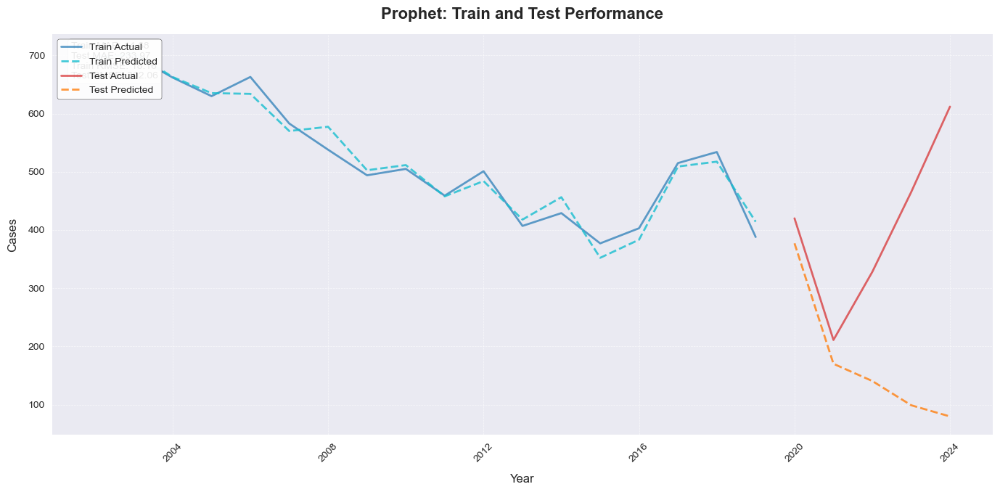

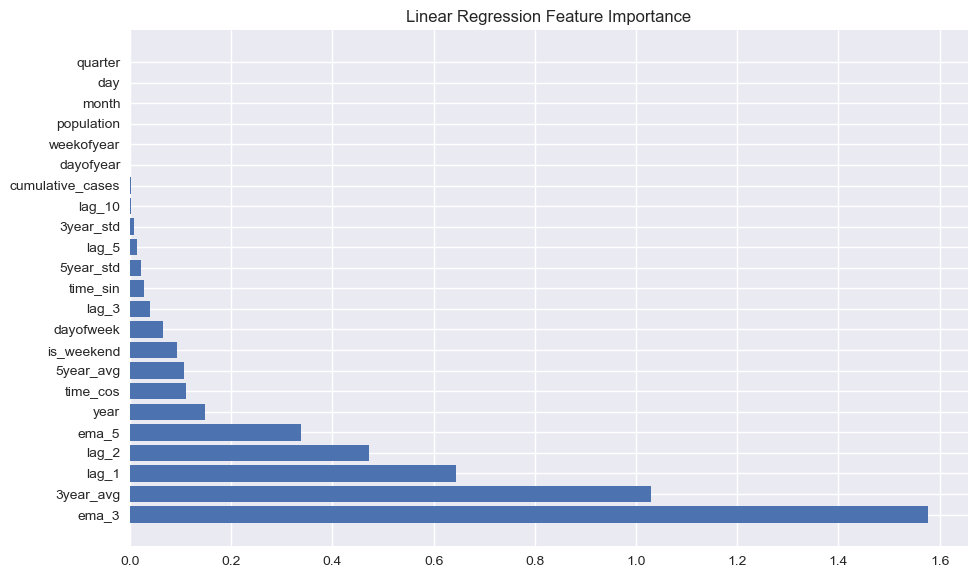


Linear Regression Evaluation:
  MAE: 8.42
  MSE: 210.90
  RMSE: 14.52
  MAPE: 3.51%
  SMAPE: 3.76%
  R2: 0.99
Linear Regression - Train MAE: 0.00, Test MAE: 8.42
Linear Regression - Train RMSE: 0.00, Test RMSE: 14.52


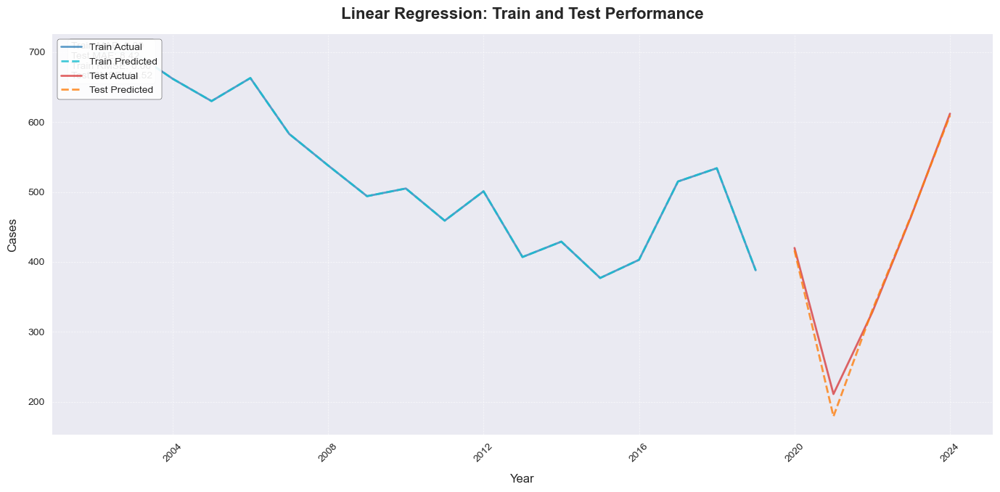

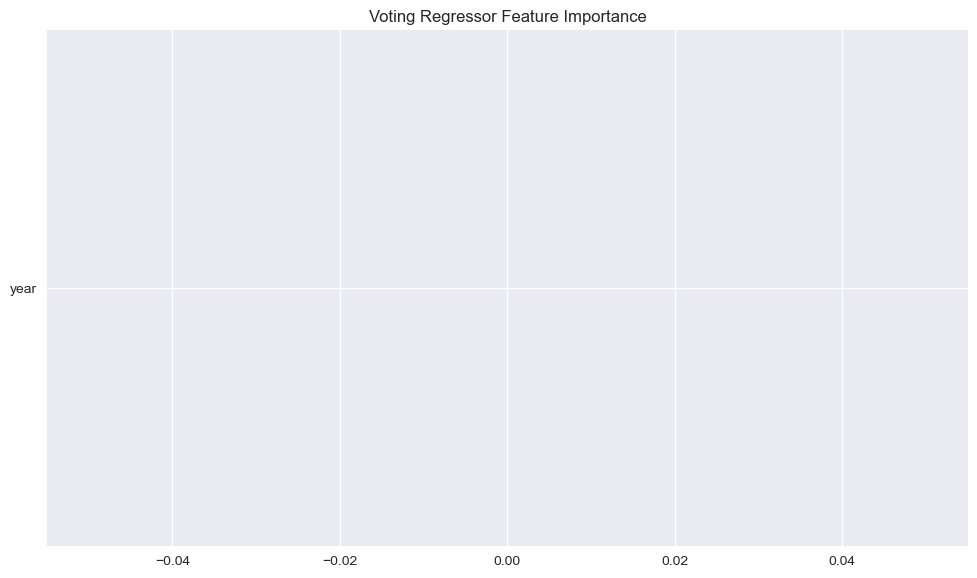


Voting Regressor Evaluation:
  MAE: 13.27
  MSE: 181.69
  RMSE: 13.48
  MAPE: 3.75%
  SMAPE: 3.74%
  R2: 0.99
Voting Regressor - Train MAE: 0.09, Test MAE: 13.27
Voting Regressor - Train RMSE: 0.10, Test RMSE: 13.48


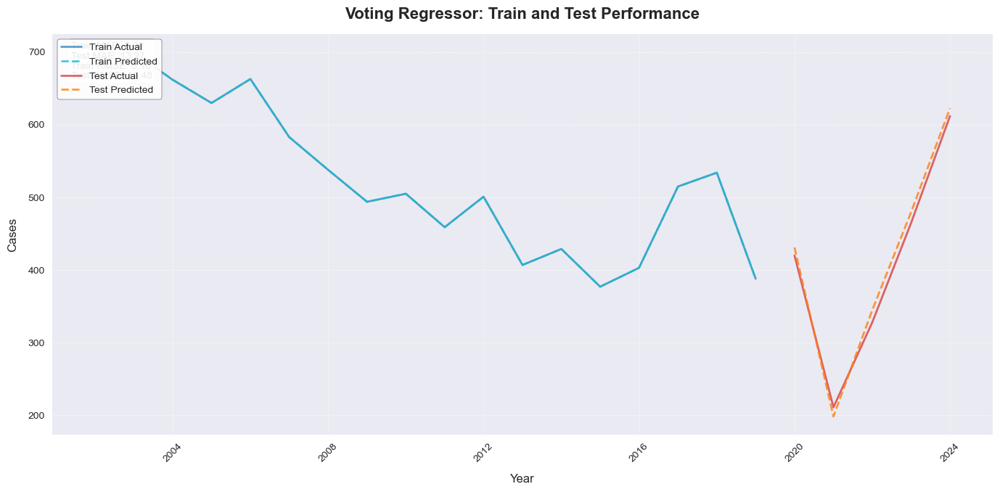

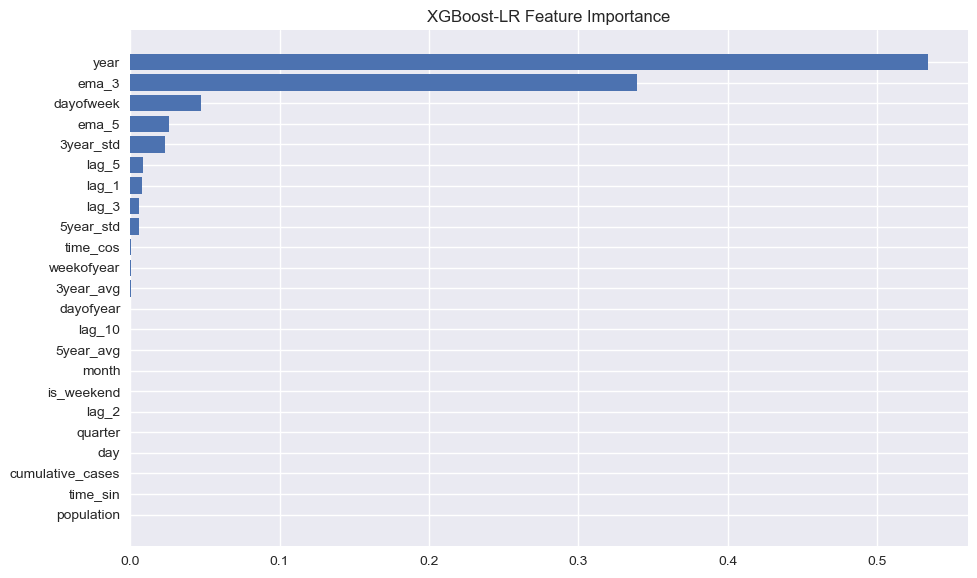


XGBoost-LR Evaluation:
  MAE: 84.13
  MSE: 12532.58
  RMSE: 111.95
  MAPE: 30.06%
  SMAPE: 22.71%
  R2: 0.31
XGBoost-LR - Train MAE: 17.80, Test MAE: 84.13
XGBoost-LR - Train RMSE: 21.95, Test RMSE: 111.95


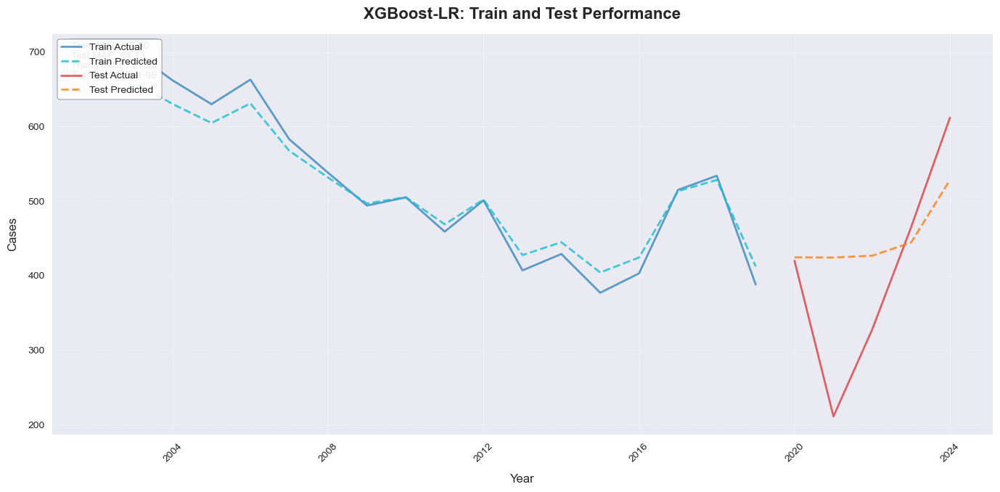

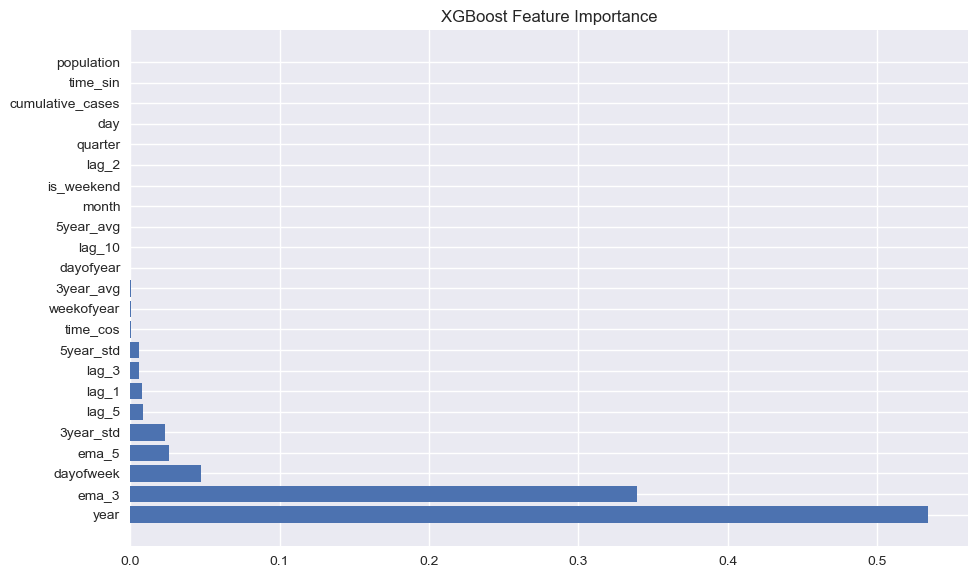


XGBoost Evaluation:
  MAE: 80.30
  MSE: 10144.65
  RMSE: 100.72
  MAPE: 27.89%
  SMAPE: 21.94%
  R2: 0.44
XGBoost - Train MAE: 0.17, Test MAE: 80.30
XGBoost - Train RMSE: 0.26, Test RMSE: 100.72


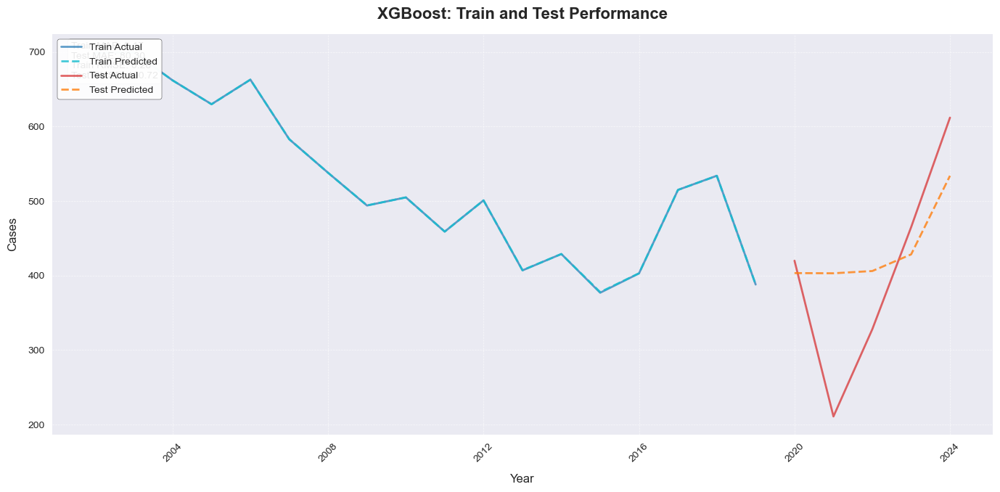

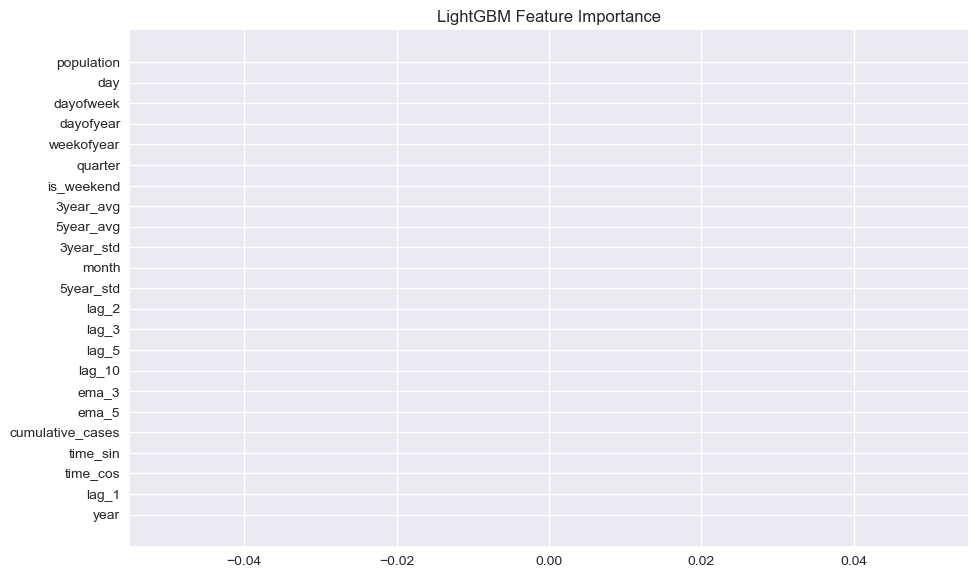


LightGBM Evaluation:
  MAE: 153.83
  MSE: 32405.38
  RMSE: 180.01
  MAPE: 52.64%
  SMAPE: 36.45%
  R2: -0.80
LightGBM - Train MAE: 88.05, Test MAE: 153.83
LightGBM - Train RMSE: 104.96, Test RMSE: 180.01


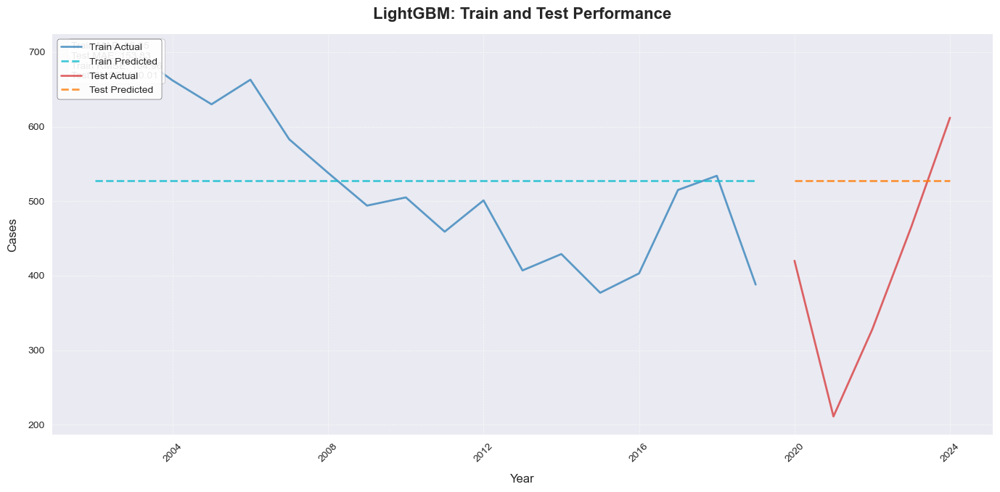

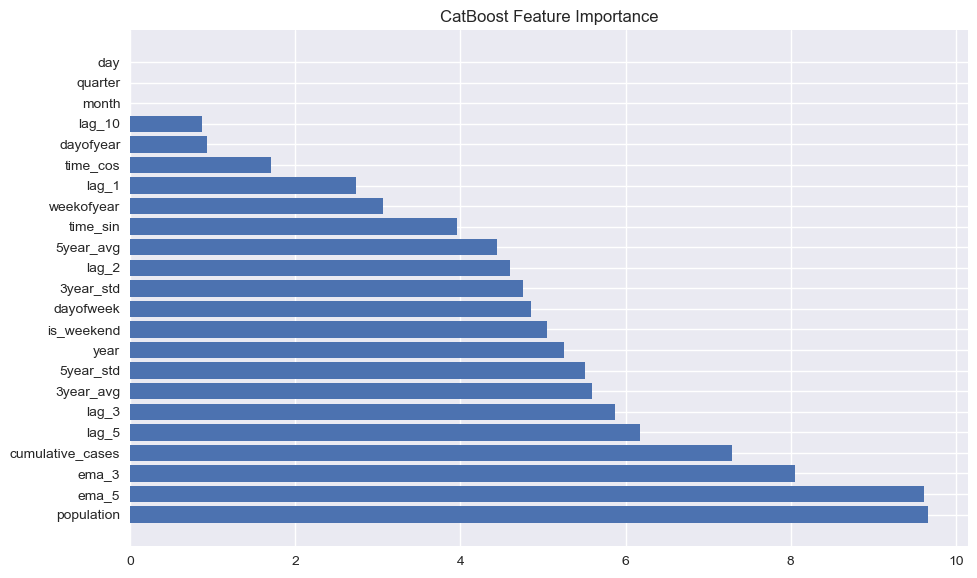


CatBoost Evaluation:
  MAE: 104.34
  MSE: 18317.07
  RMSE: 135.34
  MAPE: 37.16%
  SMAPE: 26.91%
  R2: -0.02
CatBoost - Train MAE: 2.78, Test MAE: 104.34
CatBoost - Train RMSE: 3.50, Test RMSE: 135.34


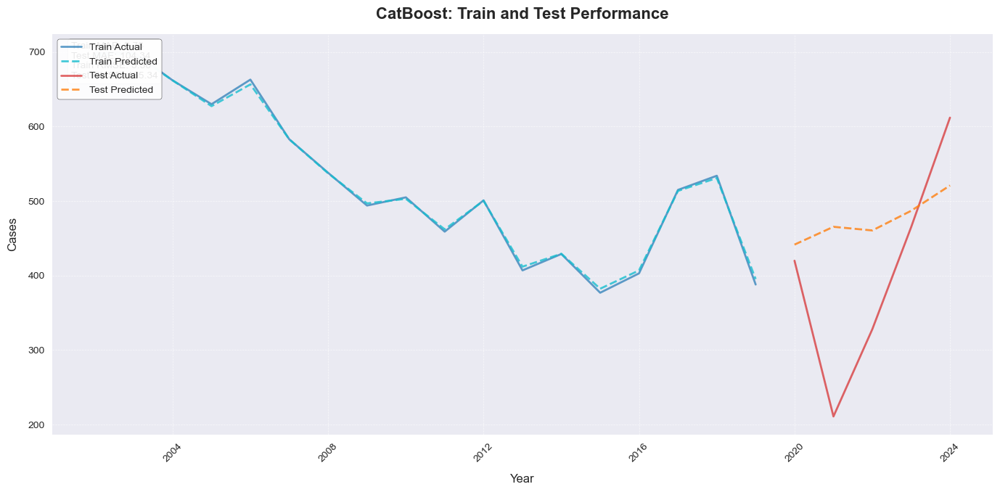

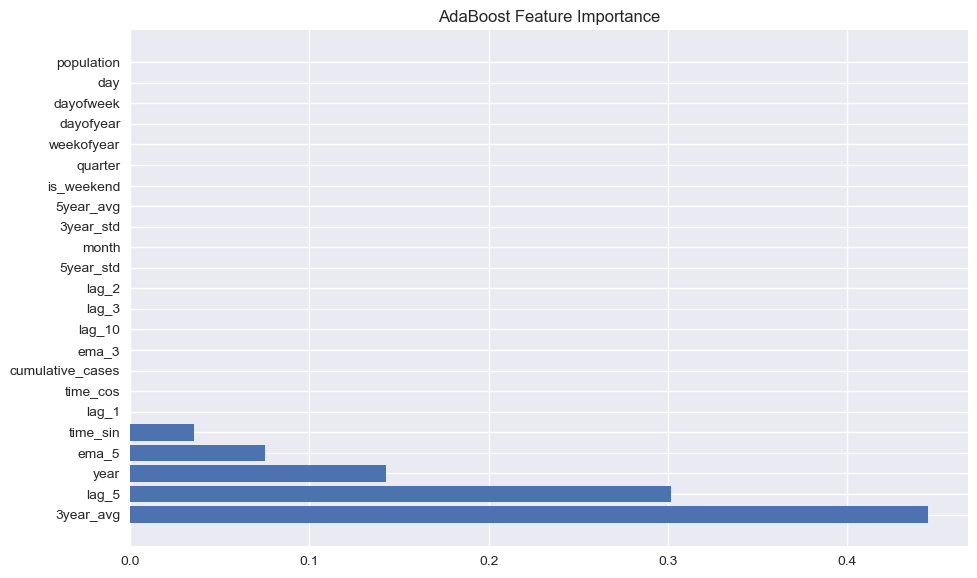


AdaBoost Evaluation:
  MAE: 110.34
  MSE: 18043.80
  RMSE: 134.33
  MAPE: 33.19%
  SMAPE: 28.36%
  R2: -0.00
AdaBoost - Train MAE: 28.94, Test MAE: 110.34
AdaBoost - Train RMSE: 38.69, Test RMSE: 134.33


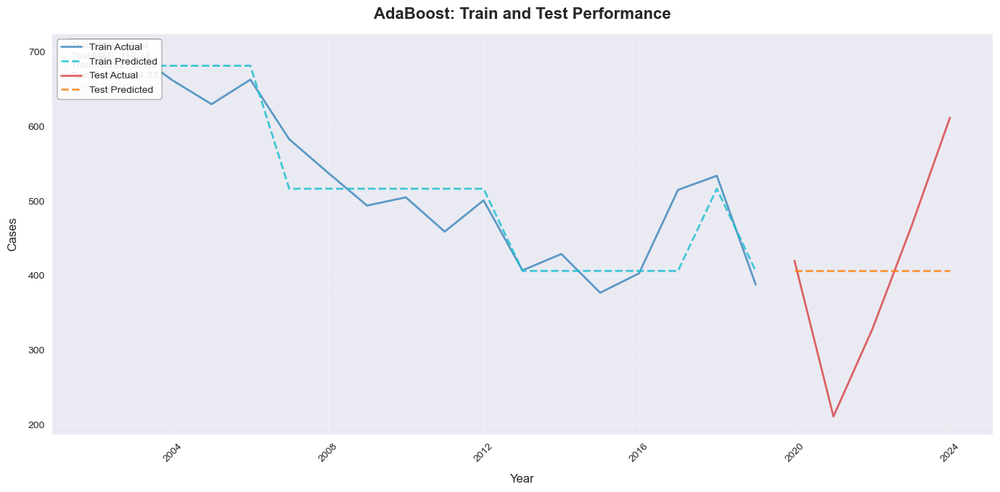


SVR Evaluation:
  MAE: 158.08
  MSE: 34162.33
  RMSE: 184.83
  MAPE: 54.16%
  SMAPE: 37.18%
  R2: -0.89
SVR - Train MAE: 6.83, Test MAE: 158.08
SVR - Train RMSE: 13.83, Test RMSE: 184.83


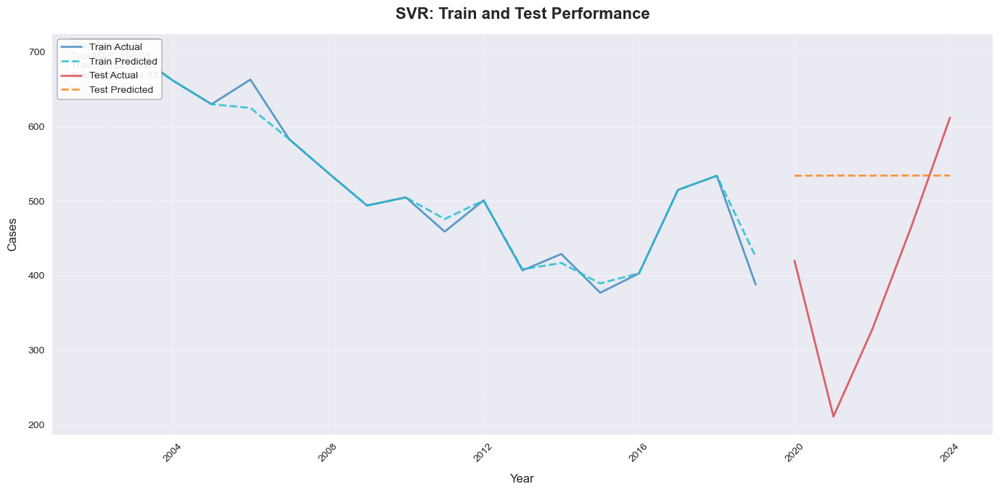


KNN Evaluation:
  MAE: 114.36
  MSE: 19896.28
  RMSE: 141.05
  MAPE: 37.36%
  SMAPE: 29.05%
  R2: -0.10
KNN - Train MAE: 30.85, Test MAE: 114.36
KNN - Train RMSE: 37.48, Test RMSE: 141.05


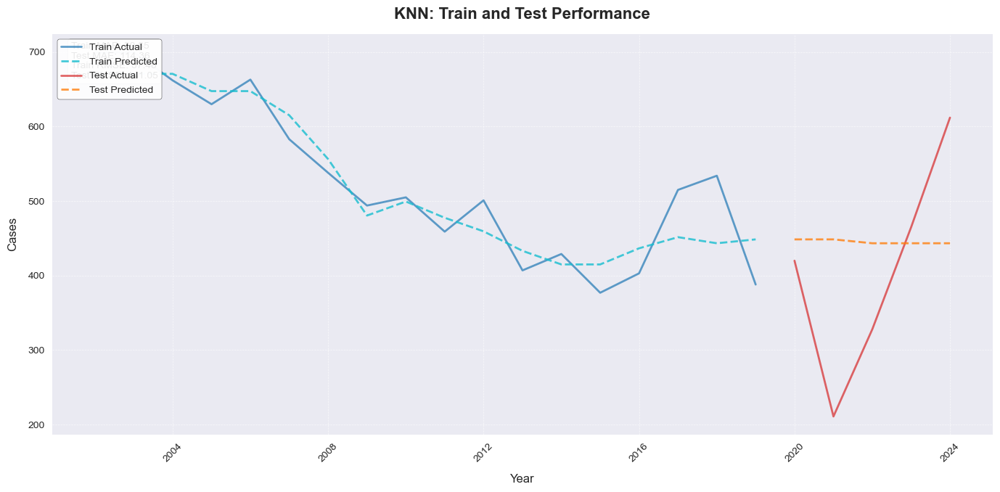

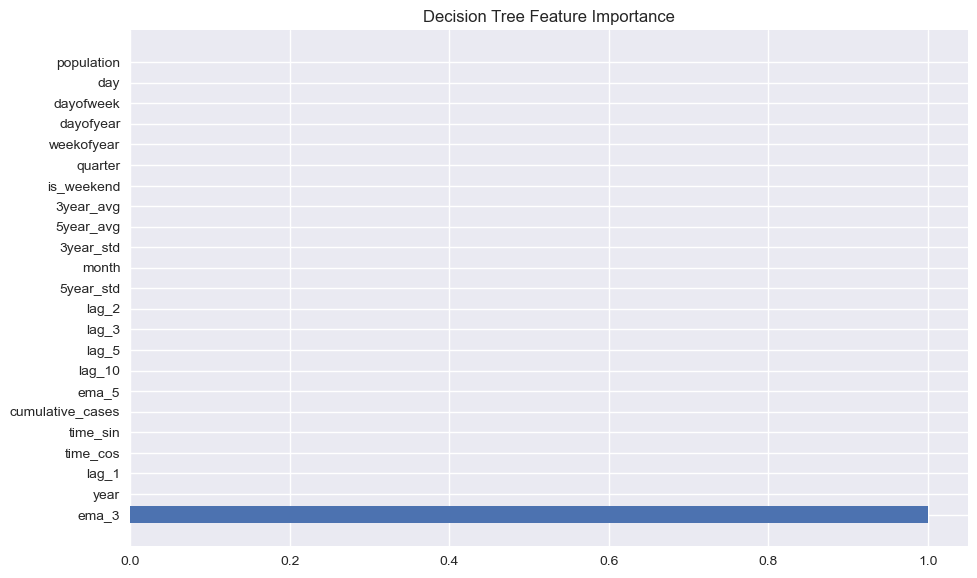


Decision Tree Evaluation:
  MAE: 90.29
  MSE: 11385.87
  RMSE: 106.70
  MAPE: 29.55%
  SMAPE: 24.08%
  R2: 0.37
Decision Tree - Train MAE: 22.57, Test MAE: 90.29
Decision Tree - Train RMSE: 29.52, Test RMSE: 106.70


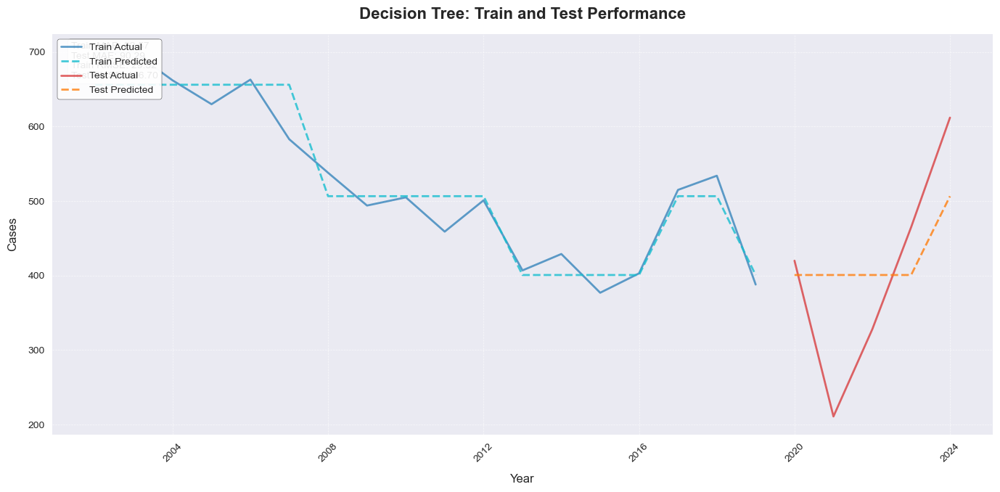

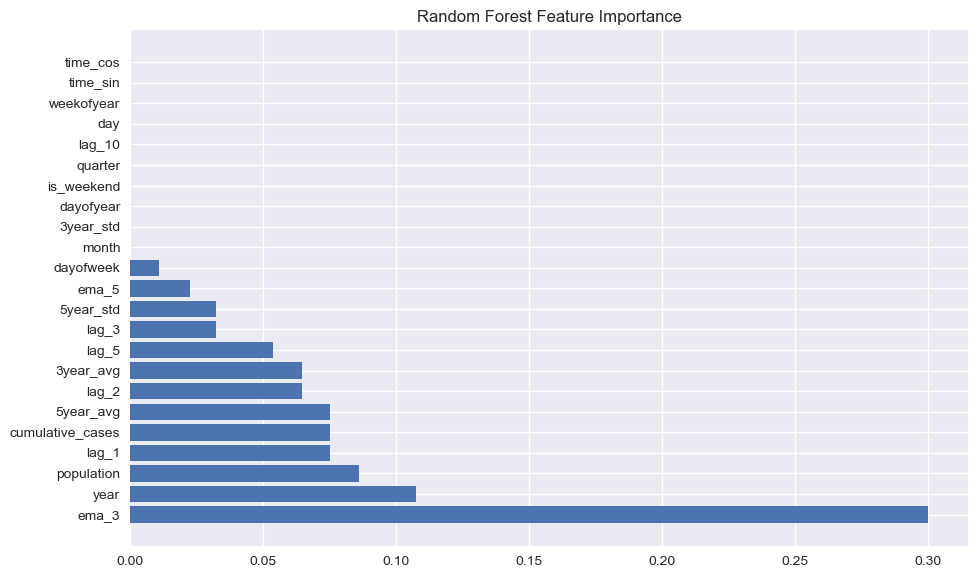


Random Forest Evaluation:
  MAE: 110.80
  MSE: 19798.12
  RMSE: 140.71
  MAPE: 38.65%
  SMAPE: 28.25%
  R2: -0.10
Random Forest - Train MAE: 43.75, Test MAE: 110.80
Random Forest - Train RMSE: 50.80, Test RMSE: 140.71


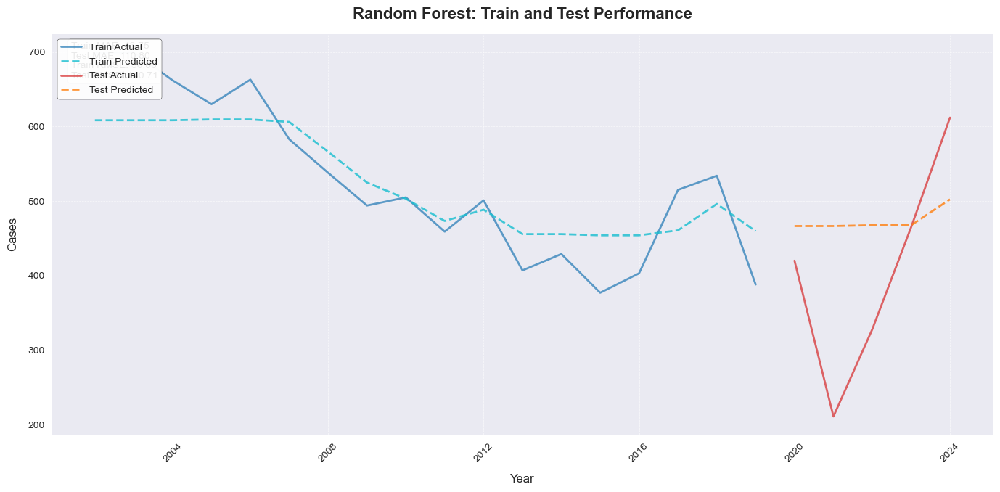

Training boosting base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining boosting base models on full training set...


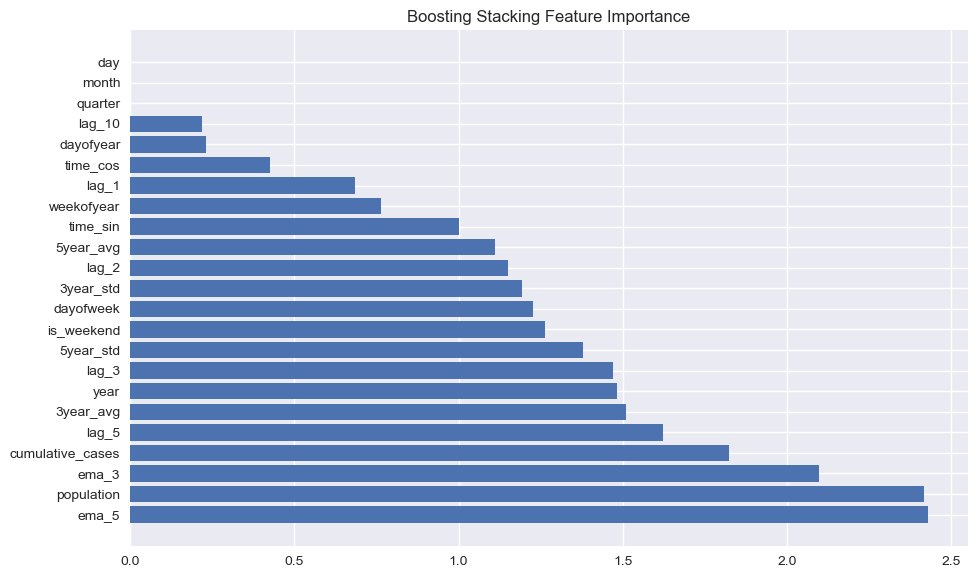


Boosting Stacking Evaluation:
  MAE: 151.10
  MSE: 33909.59
  RMSE: 184.15
  MAPE: 52.60%
  SMAPE: 35.31%
  R2: -0.88
Boosting Stacking - Train MAE: 165.60, Test MAE: 151.10
Boosting Stacking - Train RMSE: 208.71, Test RMSE: 184.15


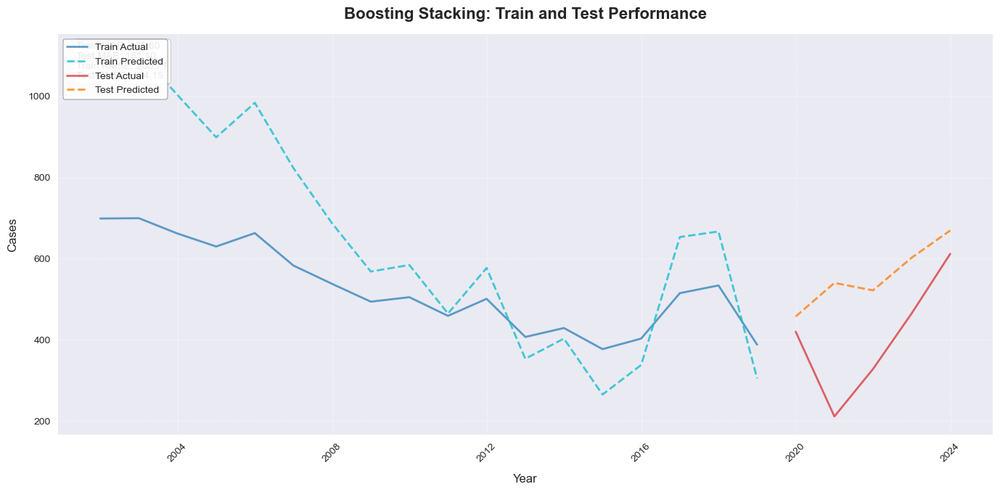

Training tree-based base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining tree-based base models on full training set...


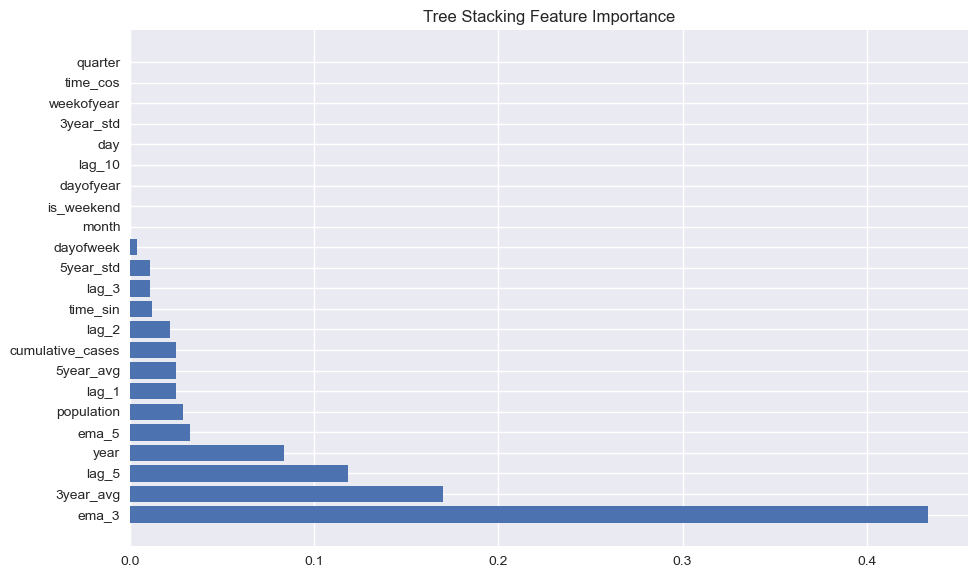


Tree Stacking Evaluation:
  MAE: 244.80
  MSE: 79018.35
  RMSE: 281.10
  MAPE: 69.84%
  SMAPE: 47.17%
  R2: -3.38
Tree Stacking - Train MAE: 183.96, Test MAE: 244.80
Tree Stacking - Train RMSE: 251.04, Test RMSE: 281.10


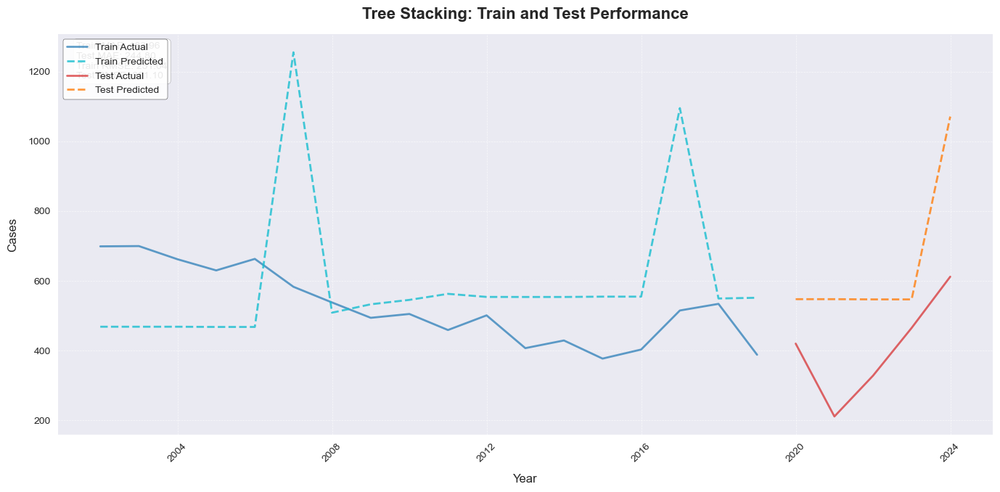

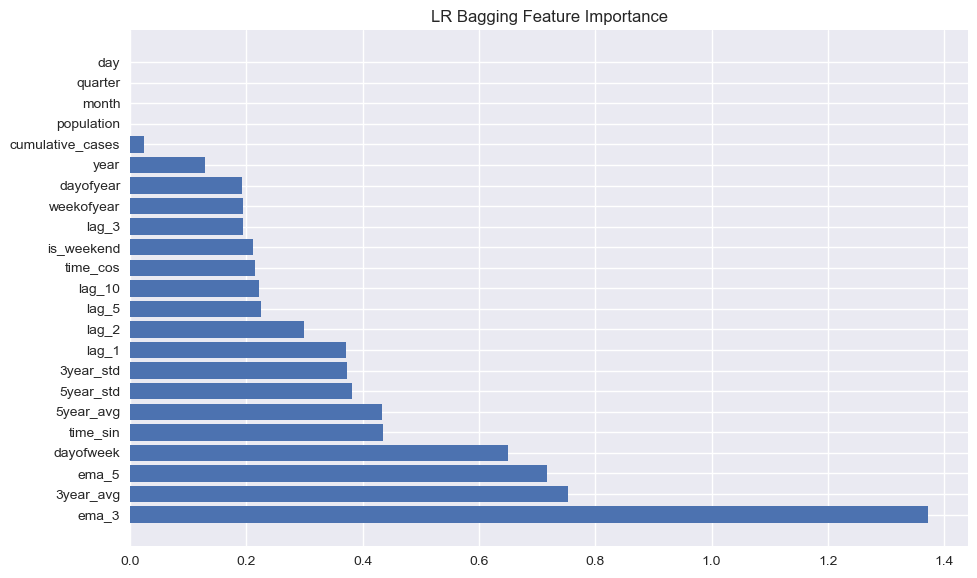


LR Bagging Evaluation:
  MAE: 107.67
  MSE: 12654.97
  RMSE: 112.49
  MAPE: 33.20%
  SMAPE: 27.10%
  R2: 0.30
LR Bagging - Train MAE: 6.49, Test MAE: 107.67
LR Bagging - Train RMSE: 9.05, Test RMSE: 112.49


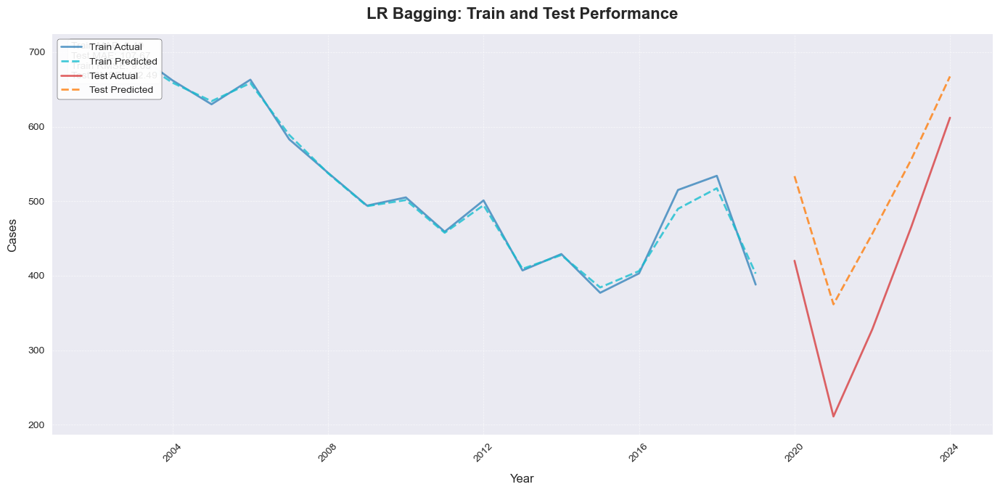

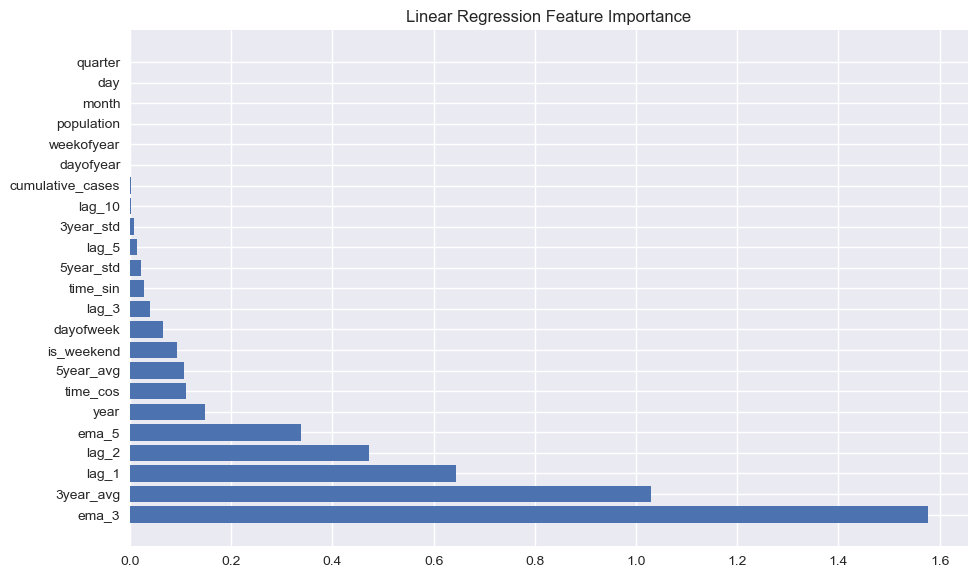

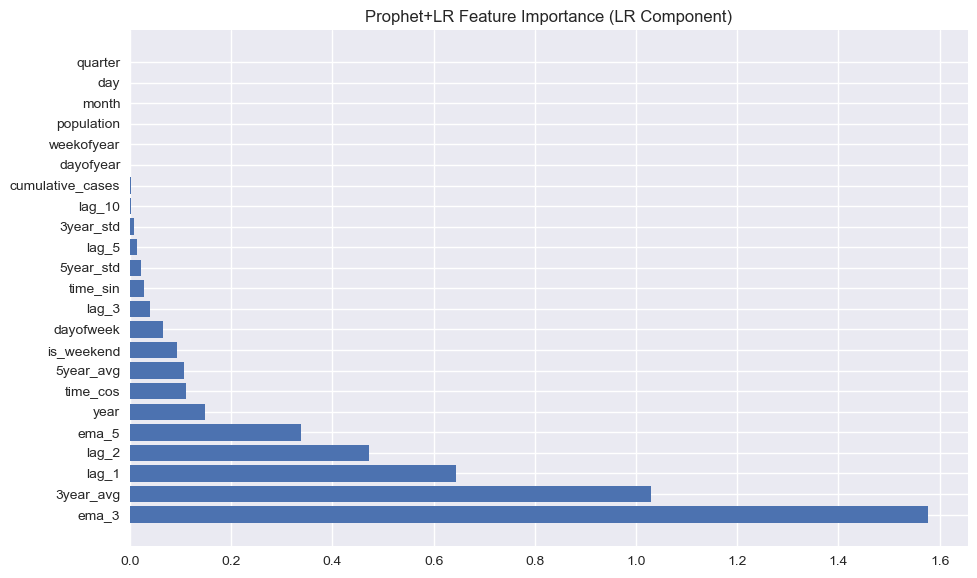


Prophet+LR Evaluation:
  MAE: 52.25
  MSE: 3902.37
  RMSE: 62.47
  MAPE: 12.55%
  SMAPE: 13.56%
  R2: 0.78
Prophet+LR - Train MAE: 2.94, Test MAE: 52.25
Prophet+LR - Train RMSE: 3.63, Test RMSE: 62.47


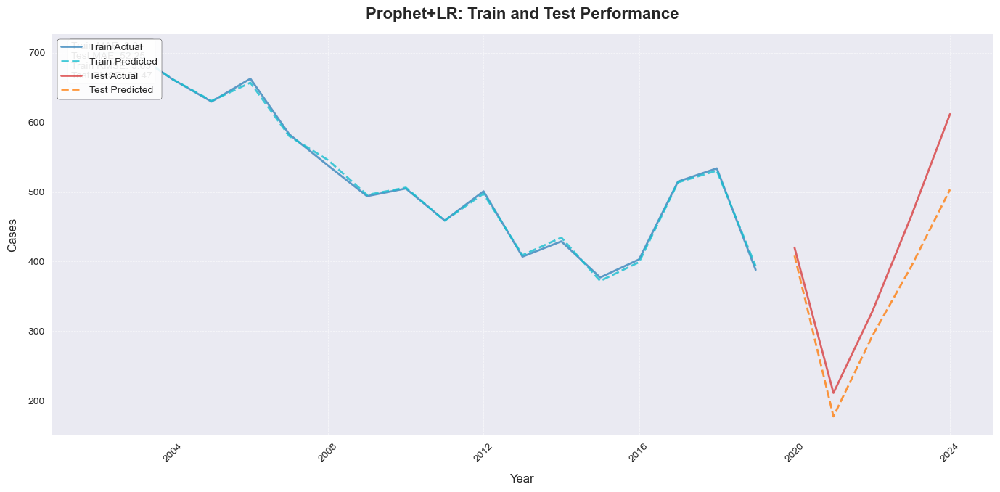


ANN Evaluation:
  MAE: 177.81
  MSE: 48948.03
  RMSE: 221.24
  MAPE: 59.00%
  SMAPE: 40.63%
  R2: -1.71
ANN - Train MAE: 120.88, Test MAE: 177.81
ANN - Train RMSE: 144.10, Test RMSE: 221.24


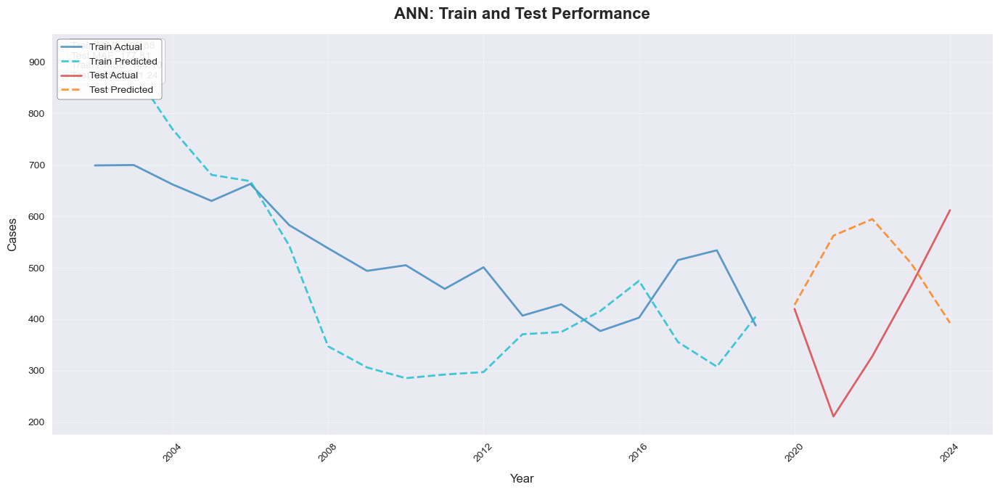

Running ACO for feature selection...
Iteration 0, Best MAE: 17.95
Iteration 10, Best MAE: 17.07
Iteration 20, Best MAE: 11.62
Iteration 30, Best MAE: 8.49
Iteration 40, Best MAE: 8.48


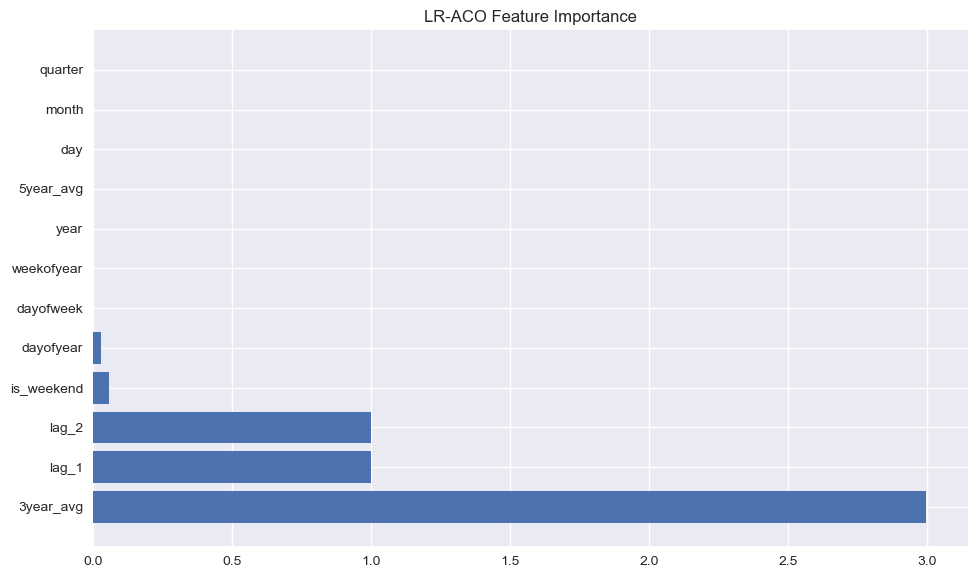


LR-ACO Evaluation:
  MAE: 20.91
  MSE: 2173.18
  RMSE: 46.62
  MAPE: 9.89%
  SMAPE: 13.13%
  R2: 0.88
LR-ACO - Train MAE: 0.04, Test MAE: 20.91
LR-ACO - Train RMSE: 0.07, Test RMSE: 46.62


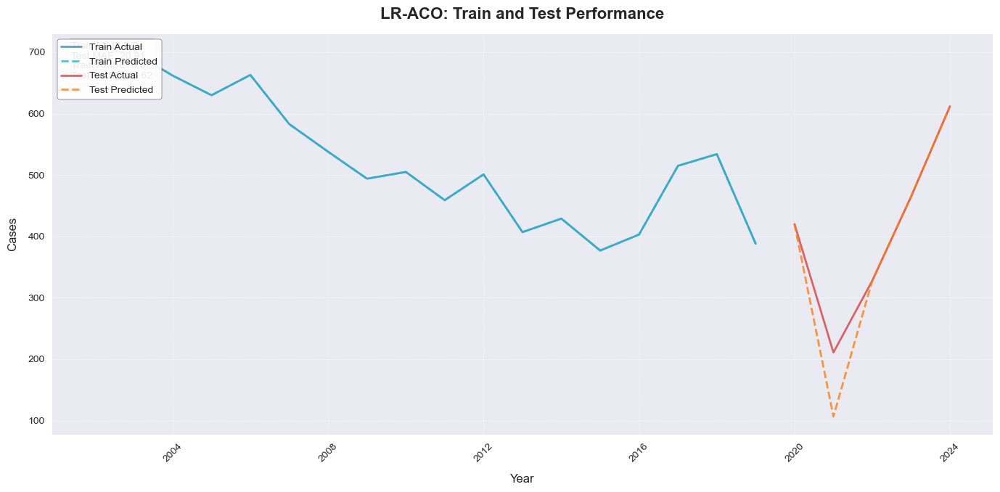

Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 42.62
Iteration 10, Best MAE: 40.61
Iteration 20, Best MAE: 40.61
Iteration 30, Best MAE: 40.61
Iteration 40, Best MAE: 40.61


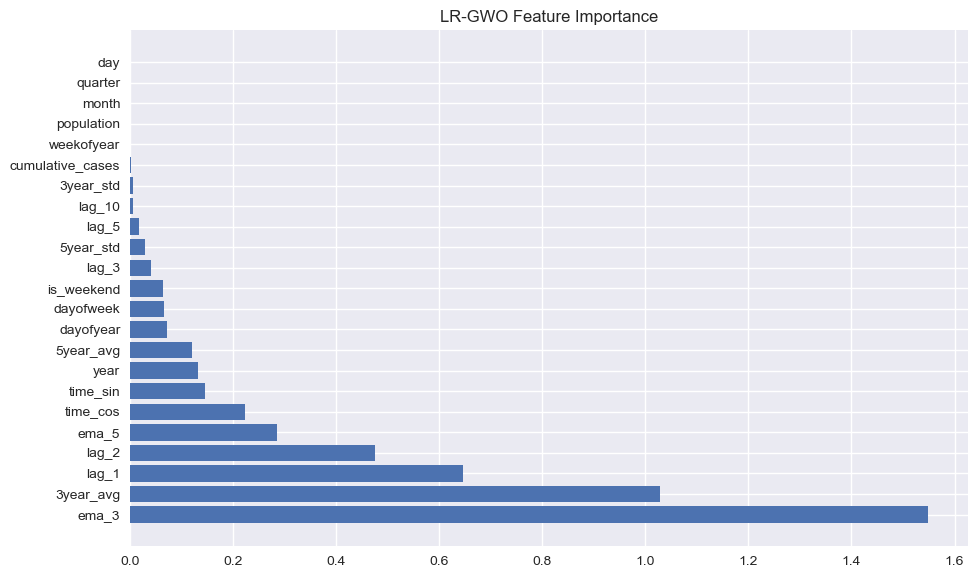


LR-GWO Evaluation:
  MAE: 8.69
  MSE: 217.02
  RMSE: 14.73
  MAPE: 3.58%
  SMAPE: 3.84%
  R2: 0.99
LR-GWO - Train MAE: 0.02, Test MAE: 8.69
LR-GWO - Train RMSE: 0.03, Test RMSE: 14.73


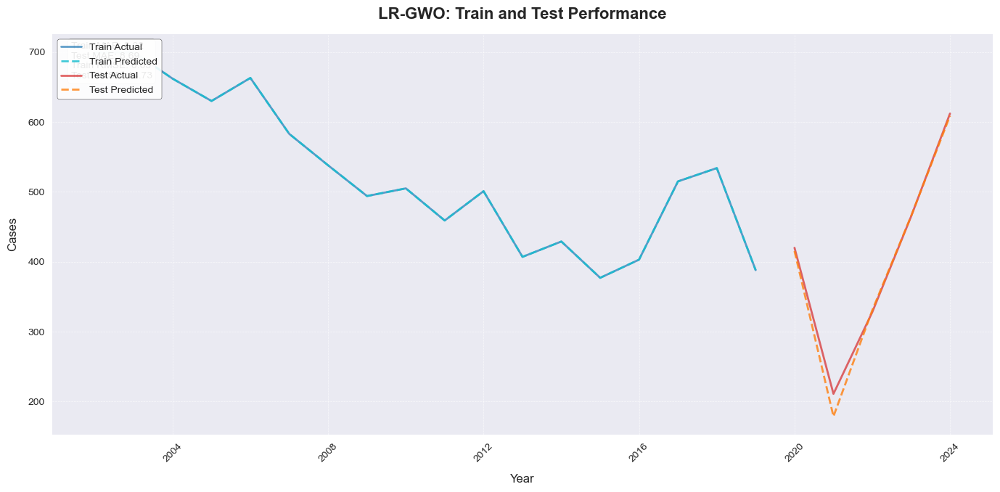

Running ACO for feature selection...
Iteration 0, Best MAE: 17.91
Iteration 10, Best MAE: 17.01
Iteration 20, Best MAE: 17.01
Iteration 30, Best MAE: 17.01
Iteration 40, Best MAE: 16.19
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 21.48
Iteration 10, Best MAE: 12.83
Iteration 20, Best MAE: 12.80
Iteration 30, Best MAE: 12.53
Iteration 40, Best MAE: 12.53


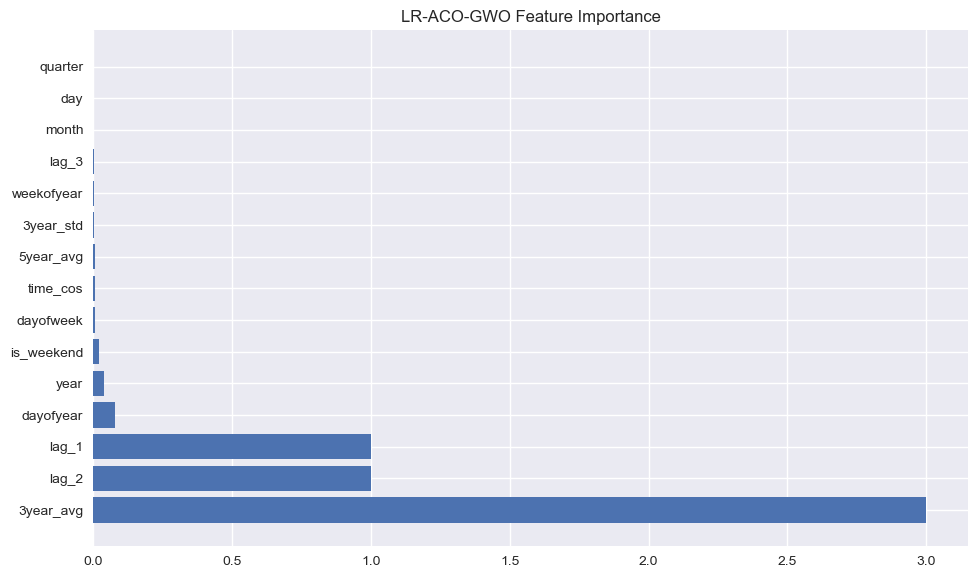


LR-ACO-GWO Evaluation:
  MAE: 20.96
  MSE: 2155.59
  RMSE: 46.43
  MAPE: 9.89%
  SMAPE: 13.10%
  R2: 0.88
LR-ACO-GWO - Train MAE: 0.04, Test MAE: 20.96
LR-ACO-GWO - Train RMSE: 0.07, Test RMSE: 46.43


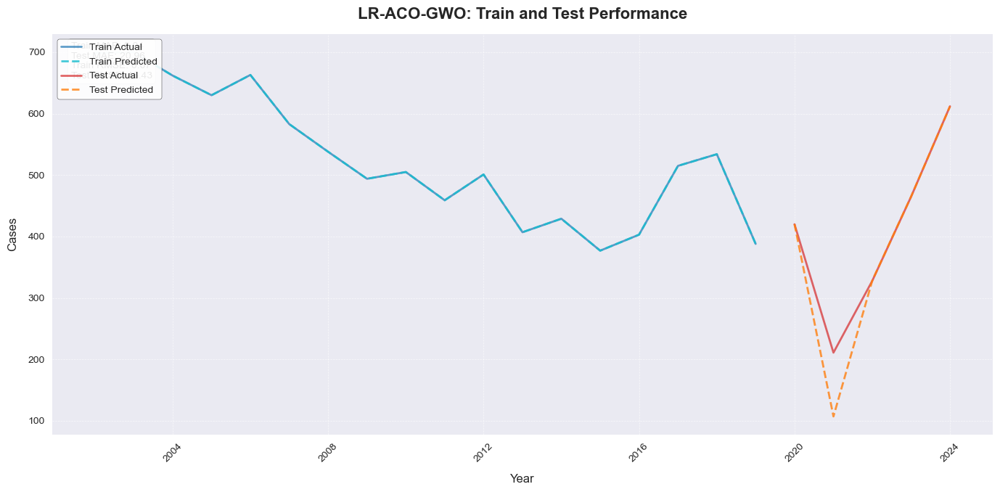

Running ACO for feature selection...
Iteration 0, Best MAE: 17.55
Iteration 10, Best MAE: 15.30
Iteration 20, Best MAE: 15.30
Iteration 30, Best MAE: 15.30
Iteration 40, Best MAE: 15.30
Selected features by ACO: ['year', 'month', 'day', 'lag_3', 'dayofweek', 'weekofyear', 'dayofyear', 'quarter', '3year_avg', 'is_weekend', '5year_std', 'lag_2', 'lag_1', '5year_avg']
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 21.90
Iteration 10, Best MAE: 16.39
Iteration 20, Best MAE: 16.39
Iteration 30, Best MAE: 16.39
Iteration 40, Best MAE: 16.39
Optimized hyperparameters: {'n_estimators': 19.788296897986594, 'max_samples': 1.0}


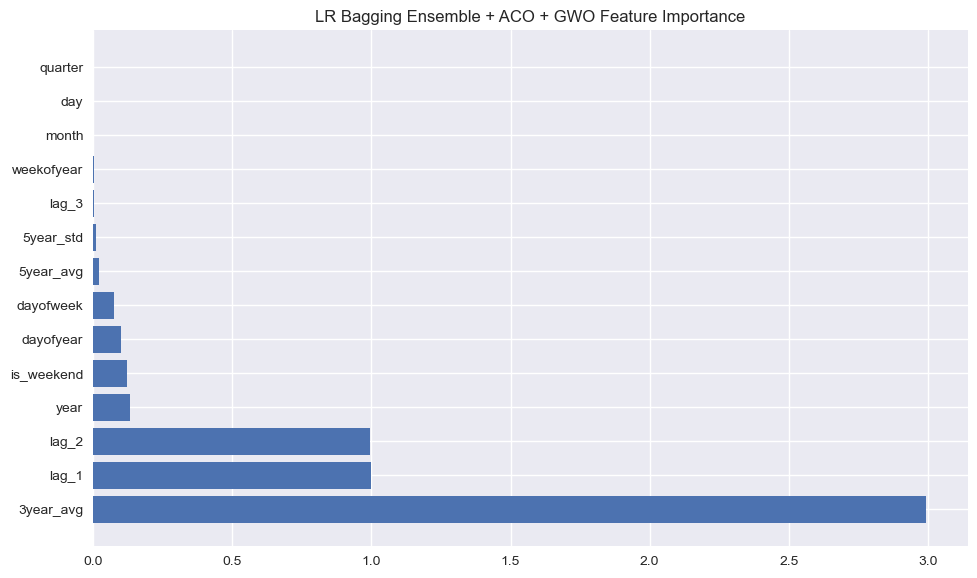


LR Bagging ACO GWO Evaluation:
  MAE: 20.88
  MSE: 2151.70
  RMSE: 46.39
  MAPE: 9.86%
  SMAPE: 13.06%
  R2: 0.88
LR Bagging ACO GWO - Train MAE: 0.08, Test MAE: 20.88
LR Bagging ACO GWO - Train RMSE: 0.12, Test RMSE: 46.39


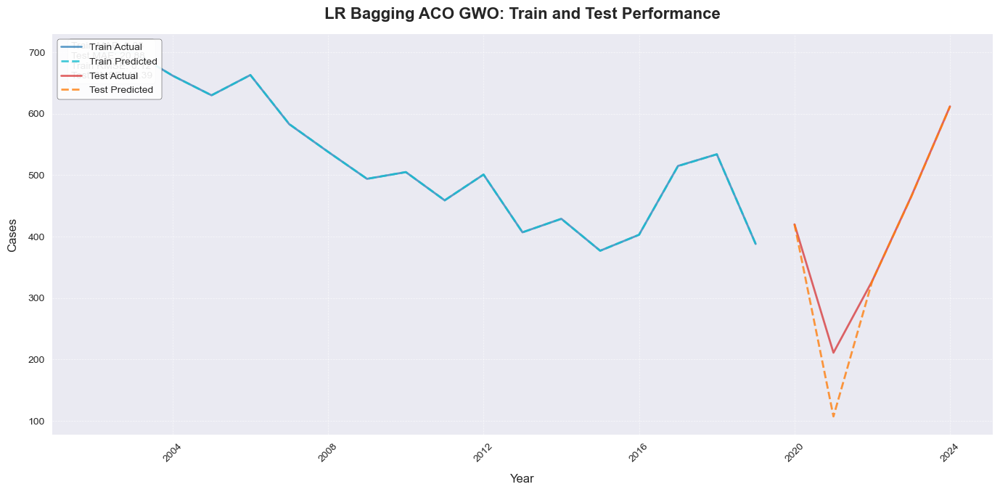


Model Performance Summary (sorted by MAE):
             Model        MAE          MSE       RMSE      MAPE     SMAPE        R2
 Linear Regression   8.420986   210.896393  14.522272  3.513067  3.762396  0.988311
            LR-GWO   8.692131   217.016495  14.731480  3.580164  3.835166  0.987972
  Voting Regressor  13.266400   181.689968  13.479242  3.752850  3.743482  0.989930
LR Bagging ACO GWO  20.876977  2151.704097  46.386465  9.858145 13.062096  0.880746
            LR-ACO  20.907200  2173.181545  46.617395  9.893439 13.134690  0.879555
        LR-ACO-GWO  20.955685  2155.594669  46.428382  9.888109 13.098757  0.880530
        Prophet+LR  52.245355  3902.365866  62.468919 12.549401 13.564633  0.783718
           XGBoost  80.300159 10144.654240 100.720674 27.890209 21.940055  0.437750
        XGBoost-LR  84.125714 12532.581585 111.949013 30.064548 22.709430  0.305403
     Decision Tree  90.285714 11385.868735 106.704586 29.550500 24.076724  0.368958
          CatBoost 104.339352 18

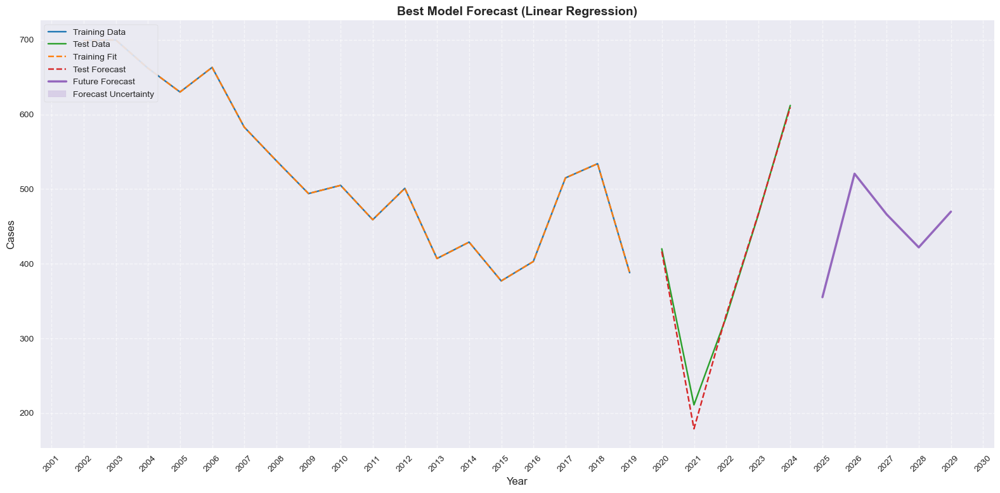

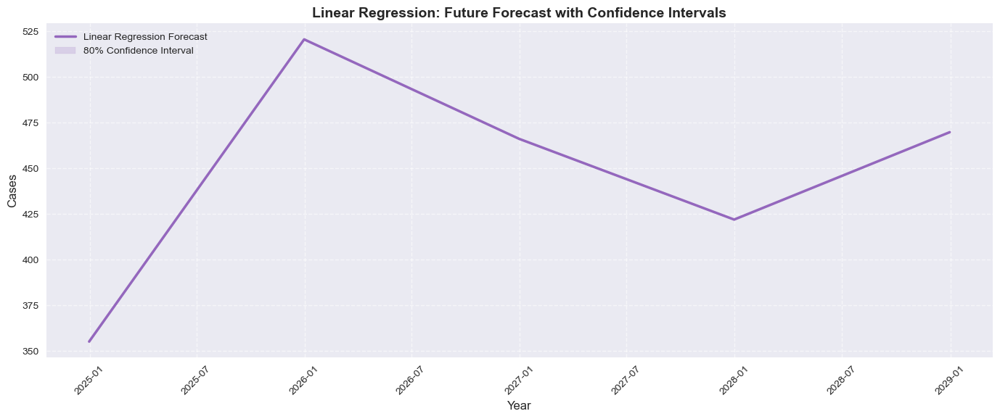


Best Model (Linear Regression) 5-Year Forecast Range:
  ds       yhat  yhat_lower  yhat_upper
2024 355.169164  354.799855  355.571728
2025 520.602989  520.233680  521.005552
2026 466.149958  465.780648  466.552521
2027 421.966397  421.597088  422.368960
2028 469.796494  469.427185  470.199057

Future Forecasts for All Models:

Prophet Forecast:
        ds        yhat
2024-12-31   35.137671
2025-12-31    0.293810
2026-12-31  -34.519313
2027-12-31  -65.900584
2028-12-31 -107.199067

Linear Regression Forecast:
        ds       yhat
2024-12-31 355.169164
2025-12-31 520.602989
2026-12-31 466.149958
2027-12-31 421.966397
2028-12-31 469.796494

Voting Regressor Forecast:
        ds       yhat
2024-12-31 372.984380
2025-12-31 522.043264
2026-12-31 470.109475
2027-12-31 433.509696
2028-12-31 471.250007

XGBoost-LR Forecast:
        ds       yhat
2024-12-31 527.309998
2025-12-31 527.531189
2026-12-31 527.800598
2027-12-31 525.612793
2028-12-31 524.028259

XGBoost Forecast:
        ds       yha

In [31]:
from sklearn.ensemble import AdaBoostRegressor
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from scipy.ndimage import gaussian_filter1d
from statsmodels.tsa.seasonal import STL
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import VotingRegressor, BaggingRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from datetime import timedelta
import matplotlib.dates as mdates


# Configure logging to suppress unnecessary warnings
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

# Define universal feature set for ML models (updated for annual data)
FEATURES = [
    'year', 'month', 'day', 'dayofweek', 'dayofyear', 'weekofyear', 'quarter', 'is_weekend',
    '3year_avg', '5year_avg', '3year_std', '5year_std', 'lag_1', 'lag_2', 'lag_3', 'lag_5',
    'lag_10', 'ema_3', 'ema_5', 'cumulative_cases', 'time_sin', 'time_cos', 'population'
]

# === DATA PREPROCESSING ===

def preprocess_data(df, frequency='Y', group_by_year=True):
    """Preprocess input DataFrame for annual forecasting, handling multiple rows per year."""
    try:
        if not isinstance(df, pd.DataFrame):
            raise ValueError("Input must be a pandas DataFrame")
        if 'Cases' not in df.columns:
            raise ValueError("DataFrame must contain 'Cases' column")
            
        df = df.copy()
        
        # Reset index if Year is the index
        if df.index.name == 'Year':
            df = df.reset_index()
        
        # Aggregate by year, summing cases and averaging population
        agg_dict = {
            'Cases': 'sum',
            'Population': 'mean'
        }
        
        # Ensure we have a Year column
        if 'Year' not in df.columns and df.index.name != 'Year':
            raise ValueError("Data must have either a 'Year' column or a 'Year' index")
        
        # Convert Year to datetime if it's not already
        if 'Year' in df.columns:
            df['ds'] = pd.to_datetime(df['Year'], format='%Y')
        else:
            df['ds'] = pd.to_datetime(df.index, format='%Y')
            
        if group_by_year:
            df_agg = df.groupby('ds').agg(agg_dict).reset_index()
        else:
            df_agg = df.copy()
            
        df_agg = df_agg.rename(columns={'Cases': 'y', 'Population': 'population'})
        df_agg.set_index('ds', inplace=True)
        
        # Handle resampling (though with annual data this may not change much)
        numeric_cols = ['y', 'population']
        
        df_numeric = df_agg[numeric_cols].resample(frequency).sum(numeric_only=True).fillna(0)
        df_agg = df_numeric
        
        # Ensure population is not all zeros or NaN
        df_agg['population'] = df_agg['population'].fillna(df_agg['population'].mean())
        if df_agg['population'].isna().all():
            print("Warning: Population column is all NaN after filling")
            df_agg['population'] = 1  # Fallback to avoid division by zero

        # Smooth and transform the target variable
        df_agg['y'] = df_agg['y'].replace(0, np.nan).interpolate(method='time').fillna(method='bfill')
        df_agg['y'] = df_agg['y'].clip(lower=df_agg['y'].quantile(0.01), upper=df_agg['y'].quantile(0.99))
        df_agg['y_log'] = np.log(df_agg['y'].clip(lower=df_agg['y'].quantile(0.01)))
        df_agg = df_agg.reset_index()

        return df_agg, {}
    except Exception as e:
        print(f"Error in preprocess_data: {e}")
        raise

def add_features(df, encoders=None, is_future=False, base_df=None):
    """Add time-series features to DataFrame for annual forecasting."""
    try:
        df = df.copy()
        if 'ds' not in df.columns:
            raise ValueError("DataFrame must contain 'ds' column with dates")
            
        df['ds'] = pd.to_datetime(df['ds'])
        
        # Extract year and basic time features
        df['year'] = df['ds'].dt.year
        df['month'] = df['ds'].dt.month
        df['day'] = df['ds'].dt.day
        df['dayofweek'] = df['ds'].dt.dayofweek
        df['dayofyear'] = df['ds'].dt.dayofyear
        df['weekofyear'] = df['ds'].dt.isocalendar().week
        df['quarter'] = df['ds'].dt.quarter
        df['is_weekend'] = df['dayofweek'].ge(5).astype(int)

        if not is_future:
            if 'y' not in df.columns:
                raise ValueError("Historical data must contain 'y' column")
                
            df.set_index('ds', inplace=True)
            
            # Annual rolling statistics (3 and 5 year windows)
            for window in [3, 5]:
                df[f'{window}year_avg'] = df['y'].rolling(window, min_periods=1).mean().fillna(method='bfill')
                df[f'{window}year_std'] = df['y'].rolling(window, min_periods=1).std().fillna(method='bfill')
            
            # Annual lags
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                df[f'lag_{lag}'] = df['y'].shift(lag).fillna(method='bfill')
                
            # Exponential moving averages
            df['ema_3'] = df['y'].ewm(span=3, adjust=False).mean().fillna(method='bfill')
            df['ema_5'] = df['y'].ewm(span=5, adjust=False).mean().fillna(method='bfill')
            
            # Cumulative cases
            df['cumulative_cases'] = df['y'].cumsum().fillna(method='bfill')
            
            # Time-based cyclical features
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            df = df.reset_index()
        else:
            if base_df is None:
                raise ValueError("base_df must be provided for future forecasting")
            
            # Use historical data to populate features for future forecasts
            lags = [1, 2, 3, 5, 10]
            latest_values = base_df.tail(max(lags)).copy()
            y_values = latest_values['y'].values if 'y' in latest_values.columns else np.zeros(len(latest_values))
            
            for window in [3, 5]:
                df[f'{window}year_avg'] = base_df[f'{window}year_avg'].iloc[-window:].mean()
                df[f'{window}year_std'] = base_df[f'{window}year_std'].iloc[-window:].mean()
            
            for lag in lags:
                if len(y_values) >= lag:
                    df[f'lag_{lag}'] = y_values[-lag]
                else:
                    df[f'lag_{lag}'] = y_values[-1] if len(y_values) > 0 else 0
            
            df['ema_3'] = base_df['ema_3'].iloc[-1] if 'ema_3' in base_df.columns else 0
            df['ema_5'] = base_df['ema_5'].iloc[-1] if 'ema_5' in base_df.columns else 0
            df['cumulative_cases'] = base_df['cumulative_cases'].iloc[-1] if 'cumulative_cases' in base_df.columns else 0
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            # Handle population
            if 'population' in base_df.columns:
                df['population'] = base_df['population'].iloc[-1]
            else:
                df['population'] = 0  # Default value if missing

        # Ensure all features exist, fill missing ones with reasonable defaults
        for feature in FEATURES:
            if feature not in df.columns:
                if 'lag_' in feature:
                    df[feature] = 0  # Default for lags
                elif 'avg' in feature or 'std' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                elif 'ema' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                else:
                    df[feature] = 0
                
        # Final check for missing values
        df[FEATURES] = df[FEATURES].fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        return df
    except Exception as e:
        print(f"Detailed error in add_features: {str(e)}")
        if 'df' in locals():
            print(f"DataFrame columns: {df.columns}")
            print(f"Missing features: {[f for f in FEATURES if f not in df.columns]}")
        raise

# === MODEL IMPLEMENTATIONS ===

def create_prophet_model():
    """Create and configure a Prophet model for annual forecasting."""
    model = Prophet(
        seasonality_mode='multiplicative',
        changepoint_prior_scale=0.05,
        yearly_seasonality=False,  # No yearly seasonality for annual data
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_range=0.9
    )
    # Add custom seasonalities for longer cycles
    model.add_seasonality(name='decadal', period=10, fourier_order=3)  # 10-year cycle
    model.add_seasonality(name='quinquennial', period=5, fourier_order=2)  # 5-year cycle
    
    # Add relevant regressors
    for reg in ['3year_avg', '5year_avg', 'population']:
        model.add_regressor(reg)
    return model

def run_linear_regression(train_df, test_df, target='y'):
    """Fit and forecast using Linear Regression model."""
    try:
        # Ensure we have valid data
        if len(train_df) == 0 or len(test_df) == 0:
            raise ValueError("Empty training or test data provided")
            
        # Handle missing values more carefully
        train_clean = train_df.copy()
        test_clean = test_df.copy()
        
        # Fill missing values with median for numeric features
        for feature in FEATURES:
            if feature in train_clean.columns:
                median_val = train_clean[feature].median()
                train_clean[feature] = train_clean[feature].fillna(median_val)
                test_clean[feature] = test_clean[feature].fillna(median_val)
        
        # Ensure we have at least one sample
        if len(train_clean) == 0:
            raise ValueError("No valid training samples after cleaning")
        if len(test_clean) == 0:
            raise ValueError("No valid test samples after cleaning")
            
        X_train = train_clean[FEATURES]
        y_train = train_clean[target]
        X_test = test_clean[FEATURES]
        
        # Verify shapes
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
            
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance plot
        if len(FEATURES) > 0:
            fi = pd.DataFrame({
                'feature': FEATURES,
                'importance': np.abs(model.coef_)
            }).sort_values('importance', ascending=False)
            plt.figure(figsize=(10, 6))
            plt.barh(fi['feature'], fi['importance'])
            plt.title('Linear Regression Feature Importance')
            plt.tight_layout()
            plt.show()
            plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Detailed error in run_linear_regression: {str(e)}")
        print(f"Train shape: {train_df.shape if isinstance(train_df, pd.DataFrame) else 'N/A'}")
        print(f"Test shape: {test_df.shape if isinstance(test_df, pd.DataFrame) else 'N/A'}")
        if 'train_clean' in locals():
            print(f"Train features after cleaning: {train_clean[FEATURES].shape if isinstance(train_clean, pd.DataFrame) else 'N/A'}")
        raise

def run_voting_regressor(train_df, test_df, target='y'):
    """Fit and forecast using Voting Regressor model."""
    try:
        # Ensure data is not empty
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        # Validate data shapes
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        estimators = [
            ('lr', LinearRegression()),
            ('ridge', Ridge(alpha=1.0)),
            ('lasso', Lasso(alpha=1.0))
        ]
        model = VotingRegressor(estimators=estimators, n_jobs=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance (average of base estimators' coefficients)
        feature_importance = np.zeros(len(FEATURES))
        for name, estimator in estimators:
            if hasattr(estimator, 'coef_'):
                estimator.fit(X_train, y_train)  # Fit individual estimator for coefficients
                feature_importance += np.abs(estimator.coef_)
        feature_importance /= len([e for e in estimators if hasattr(e[1], 'coef_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Voting Regressor Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_voting_regressor: {e}")
        raise

from sklearn.ensemble import StackingRegressor

def run_xgboost_lr(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost + Linear Regression stacked model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        # Define the base XGBoost model
        xgb_model = XGBRegressor(
            n_estimators=1000,
            learning_rate=0.01,
            max_depth=3,
            random_state=42,
            verbosity=0
        )
        
        # Define stacking model
        model = StackingRegressor(
            estimators=[('xgboost', xgb_model)],
            final_estimator=LinearRegression()
        )
        
        # Fit model
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)

        # Extract feature importances from XGBoost base model
        xgb_fitted_model = model.named_estimators_['xgboost']
        feature_importance = xgb_fitted_model.feature_importances_
        
        # Plot feature importances
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost-LR Feature Importance')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model

    except Exception as e:
        print(f"Error in run_xgboost_lr: {e}")
        raise

def run_xgboost(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost: {e}")
        raise

def run_lightgbm(train_df, test_df, target='y'):
    """Fit and forecast using LightGBM model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LightGBM Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lightgbm: {e}")
        raise

def run_catboost(train_df, test_df, target='y'):
    """Fit and forecast using CatBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.get_feature_importance()
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('CatBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_catboost: {e}")
        raise

def run_adaboost(train_df, test_df, target='y'):
    """Fit and forecast using AdaBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
            n_estimators=100,
            learning_rate=0.1,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('AdaBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_adaboost: {e}")
        raise

def run_svr(train_df, test_df, target='y'):
    """Fit and forecast using SVR model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = SVR(kernel='rbf', C=100, epsilon=0.1)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_svr: {e}")
        raise

def run_knn(train_df, test_df, target='y'):
    """Fit and forecast using KNN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_knn: {e}")
        raise

def run_decision_tree(train_df, test_df, target='y'):
    """Fit and forecast using Decision Tree model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Decision Tree Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_decision_tree: {e}")
        raise

def run_random_forest(train_df, test_df, target='y'):
    """Fit and forecast using Random Forest model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        # Ensure consistent sample sizes
        train_df = train_df.copy().dropna(subset=[target] + FEATURES)
        test_df = test_df.copy().dropna(subset=FEATURES)
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        # Validate shapes
        if X_train.shape[0] != y_train.shape[0]:
            raise ValueError(f"Inconsistent training data: X_train has {X_train.shape[0]} samples, y_train has {y_train.shape[0]} samples")
        if X_test.shape[0] == 0:
            raise ValueError("Empty test data after preprocessing")
        
        # print(f"Random Forest - X_train shape: {X_train.shape}, y_train shape: {y_train.shape}, X_test shape: {X_test.shape}")
        
        model = RandomForestRegressor(
            n_estimators=100,
            max_depth=5,
            min_samples_split=10,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Random Forest Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_random_forest: {e}")
        raise

# === NEW STACKING MODELS ===

class StackingModelWrapper:
    def __init__(self, base_models, meta_model):
        self.base_models = base_models
        self.meta_model = meta_model
        
    def predict(self, X):
        try:
            base_preds = []
            for name, model in self.base_models.items():
                base_preds.append(model.predict(X))
            stacked_X = np.column_stack(base_preds)
            return self.meta_model.predict(stacked_X)
        except Exception as e:
            print(f"Error in StackingModelWrapper predict: {e}")
            raise

def create_boosting_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with boosting models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'xgb': XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42),
            'lgbm': LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1),
            'catboost': CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training boosting base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining boosting base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        # Feature importance (average of base models' importance)
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Boosting Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_boosting_stacking_model: {e}")
        raise

def create_tree_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with tree-based models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'dt': DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42),
            'rf': RandomForestRegressor(
                n_estimators=100,
                max_depth=5,
                min_samples_split=10,
                min_samples_leaf=5,
                random_state=42,
                n_jobs=-1
            ),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training tree-based base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining tree-based base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        # Feature importance
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Tree Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_tree_stacking_model: {e}")
        raise

def create_lr_bagging_ensemble(train_df, test_df, target='y'):
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=100,
            max_samples=0.8,
            max_features=0.8,
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        # Feature importance with feature subsampling
        feature_importance = np.zeros(len(FEATURES))
        for estimator, features in zip(model.estimators_, model.estimators_features_):
            coefs = np.abs(estimator.coef_)
            for coef, feature_idx in zip(coefs, features):
                feature_importance[feature_idx] += coef
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in create_lr_bagging_ensemble: {e}")
        raise

def run_prophet_lr_ensemble(train_df, test_df, target='y'):
    """Create a simple averaging ensemble of Prophet and Linear Regression."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        prophet_model = create_prophet_model()
        prophet_model.fit(train_df)
        prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
        
        train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        prophet_train_pred = prophet_model.predict(train_input)['yhat'].values
        prophet_test_pred = prophet_model.predict(test_input)['yhat'].values
        
        lr_pred, lr_model = run_linear_regression(train_df, test_df, target=target)
        lr_train_pred = lr_model.predict(train_df[FEATURES])
        
        # Ensemble predictions
        ensemble_train_pred = 0.2 * prophet_train_pred + 0.8 * lr_train_pred
        ensemble_test_pred = 0.2 * prophet_test_pred + 0.8 * lr_pred
        
        # Feature importance (from Linear Regression component)
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(lr_model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Prophet+LR Feature Importance (LR Component)')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return ensemble_test_pred, {'prophet': prophet_model, 'lr': lr_model}
    except Exception as e:
        print(f"Error in run_prophet_lr_ensemble: {e}")
        raise

def create_neural_network(input_dim):
    """Create and configure a feedforward ANN for time series forecasting."""
    try:
        model = Sequential([
            Dense(128, activation='relu', input_dim=input_dim),
            Dropout(0.3),
            Dense(64, activation='relu'),
            Dropout(0.3),
            Dense(32, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model
    except Exception as e:
        print(f"Error in create_neural_network: {e}")
        raise

def run_neural_network(train_df, test_df, target='y', epochs=100, batch_size=32):
    """Fit and forecast using ANN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = create_neural_network(input_dim=len(FEATURES))
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        model.fit(
            X_train_scaled, y_train,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            validation_split=0.2,
            callbacks=[early_stopping]
        )
        predictions = model.predict(X_test_scaled, verbose=0).flatten()
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_neural_network: {e}")
        raise

# === ACO for Feature Selection ===

class AntColonyOptimization:
    def __init__(self, n_ants, n_features, n_iterations=50, alpha=1.0, beta=2.0, evaporation_rate=0.5, Q=100):
        self.n_ants = n_ants
        self.n_features = n_features
        self.n_iterations = n_iterations
        self.alpha = alpha
        self.beta = beta
        self.evaporation_rate = evaporation_rate
        self.Q = Q
        self.pheromones = np.ones(n_features)
        self.best_solution = None
        self.best_score = np.inf

    def _evaluate_solution(self, selected_features, train_df, target='y'):
        try:
            if not selected_features:
                return np.inf
            selected_feature_names = [FEATURES[i] for i in selected_features]
            X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
            y_train = train_df[target].fillna(train_df[target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = LinearRegression()
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in ACO evaluation: {e}")
            return np.inf

    def _construct_solution(self):
        selected_features = []
        available_features = list(range(self.n_features))
        n_select = np.random.randint(1, self.n_features + 1)
        for _ in range(n_select):
            if not available_features:
                break
            pheromones = self.pheromones[available_features]
            heuristic = 1.0 / (1.0 + np.arange(len(available_features)))
            probabilities = (pheromones ** self.alpha) * (heuristic ** self.beta)
            probabilities /= probabilities.sum()
            selected_idx = np.random.choice(len(available_features), p=probabilities)
            selected_feature = available_features.pop(selected_idx)
            selected_features.append(selected_feature)
        return selected_features

    def _update_pheromones(self, solutions, scores):
        self.pheromones *= (1 - self.evaporation_rate)
        for solution, score in zip(solutions, scores):
            for feature_idx in solution:
                self.pheromones[feature_idx] += self.Q / score
        best_idx = np.argmin(scores)
        if scores[best_idx] < self.best_score:
            self.best_score = scores[best_idx]
            self.best_solution = solutions[best_idx]

    def optimize(self, train_df, target='y'):
        print("Running ACO for feature selection...")
        for iteration in range(self.n_iterations):
            solutions = []
            scores = []
            for _ in range(self.n_ants):
                solution = self._construct_solution()
                score = self._evaluate_solution(solution, train_df, target)
                solutions.append(solution)
                scores.append(score)
            self._update_pheromones(solutions, scores)
            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {self.best_score:.2f}")
        return self.best_solution

def run_lr_aco(train_df, test_df, target='y', n_ants=20, n_iterations=50):
    """Fit and forecast using Linear Regression with ACO feature selection."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices
    except Exception as e:
        print(f"Error in run_lr_aco: {e}")
        raise

# === Grey Wolf Optimization ===

class GreyWolfOptimization:
    def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features=None, target='y'):
        self.n_wolves = n_wolves
        self.n_iterations = n_iterations
        self.search_space = search_space
        self.train_df = train_df
        self.selected_features = selected_features
        self.target = target
        self.best_alpha = None
        self.best_score = np.inf

    def _evaluate_solution(self, params):
        try:
            selected_feature_names = [FEATURES[i] for i in self.selected_features] if self.selected_features else FEATURES
            X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
            y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = Ridge(alpha=params['alpha'])
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in GWO evaluation: {e}")
            return np.inf

    def optimize(self):
        print("Running GWO for hyperparameter optimization...")
        wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                  for key, bounds in self.search_space.items()}
        alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
        alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

        for iteration in range(self.n_iterations):
            a = 2 - iteration * (2 / self.n_iterations)
            for i in range(self.n_wolves):
                params = {key: wolves[key][i] for key in self.search_space}
                score = self._evaluate_solution(params)
                if score < alpha_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = alpha_score, alpha_pos
                    alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < beta_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < delta_score:
                    delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

            for key in self.search_space:
                for i in range(self.n_wolves):
                    r1, r2 = np.random.random(2)
                    A1, C1 = 2 * a * r1 - a, 2 * r2
                    D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                    X1 = alpha_pos[key] - A1 * D_alpha
                    r1, r2 = np.random.random(2)
                    A2, C2 = 2 * a * r1 - a, 2 * r2
                    D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                    X2 = beta_pos[key] - A2 * D_beta
                    r1, r2 = np.random.random(2)
                    A3, C3 = 2 * a * r1 - a, 2 * r2
                    D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                    X3 = delta_pos[key] - A3 * D_delta
                    wolves[key][i] = (X1 + X2 + X3) / 3
                    wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
        self.best_alpha = alpha_pos
        self.best_score = alpha_score
        return alpha_pos

def run_lr_gwo(train_df, test_df, target='y', n_wolves=20, n_iterations=50):
    """Fit and forecast using Ridge Regression with GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations, search_space=search_space,
                                  train_df=train_df, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lr_gwo: {e}")
        raise

def run_lr_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Ridge Regression with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations_gwo, search_space=search_space,
                                  train_df=train_df, selected_features=selected_feature_indices, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices, best_params
    except Exception as e:
        print(f"Error in run_lr_aco_gwo: {e}")
        raise

def run_lr_bagging_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Bagging Regressor with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        # Step 1: ACO for feature selection
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        print(f"Selected features by ACO: {selected_feature_names}")
        
        # Step 2: GWO for hyperparameter optimization
        search_space = {
            'n_estimators': [10, 200],
            'max_samples': [0.5, 1.0]
        }
        
        class GreyWolfOptimizationBagging:
            def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features, target):
                self.n_wolves = n_wolves
                self.n_iterations = n_iterations
                self.search_space = search_space
                self.train_df = train_df
                self.selected_features = selected_features
                self.target = target
                self.best_alpha = None
                self.best_score = np.inf

            def _evaluate_solution(self, params):
                try:
                    selected_feature_names = [FEATURES[i] for i in self.selected_features]
                    X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
                    y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
                    tscv = TimeSeriesSplit(n_splits=5)
                    mae_scores = []
                    for train_idx, val_idx in tscv.split(X_train):
                        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                        model = BaggingRegressor(
                            estimator=LinearRegression(),
                            n_estimators=int(params['n_estimators']),
                            max_samples=params['max_samples'],
                            bootstrap=True,
                            random_state=42,
                            n_jobs=-1
                        )
                        model.fit(X_tr, y_tr)
                        y_pred = model.predict(X_val)
                        mae = mean_absolute_error(y_val, y_pred)
                        mae_scores.append(mae)
                    return np.mean(mae_scores)
                except Exception as e:
                    print(f"Error in GWO evaluation: {e}")
                    return np.inf

            def optimize(self):
                print("Running GWO for hyperparameter optimization...")
                wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                          for key, bounds in self.search_space.items()}
                alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
                alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

                for iteration in range(self.n_iterations):
                    a = 2 - iteration * (2 / self.n_iterations)
                    for i in range(self.n_wolves):
                        params = {key: wolves[key][i] for key in self.search_space}
                        score = self._evaluate_solution(params)
                        if score < alpha_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = alpha_score, alpha_pos
                            alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < beta_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < delta_score:
                            delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

                    for key in self.search_space:
                        for i in range(self.n_wolves):
                            r1, r2 = np.random.random(2)
                            A1, C1 = 2 * a * r1 - a, 2 * r2
                            D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                            X1 = alpha_pos[key] - A1 * D_alpha
                            r1, r2 = np.random.random(2)
                            A2, C2 = 2 * a * r1 - a, 2 * r2
                            D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                            X2 = beta_pos[key] - A2 * D_beta
                            r1, r2 = np.random.random(2)
                            A3, C3 = 2 * a * r1 - a, 2 * r2
                            D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                            X3 = delta_pos[key] - A3 * D_delta
                            wolves[key][i] = (X1 + X2 + X3) / 3
                            wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

                    if iteration % 10 == 0:
                        print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
                self.best_alpha = alpha_pos
                self.best_score = alpha_score
                return alpha_pos

        gwo = GreyWolfOptimizationBagging(
            n_wolves=n_wolves,
            n_iterations=n_iterations_gwo,
            search_space=search_space,
            train_df=train_df,
            selected_features=selected_feature_indices,
            target=target
        )
        best_params = gwo.optimize()
        print(f"Optimized hyperparameters: {best_params}")
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=int(best_params['n_estimators']),
            max_samples=best_params['max_samples'],
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(selected_feature_names))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Ensemble + ACO + GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, (model, selected_feature_indices), best_params
    except Exception as e:
        print(f"Error in run_lr_bagging_aco_gwo: {e}")
        raise

# === FORECASTING ===

def forecast_future_prophet(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for Prophet model."""
    try:
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        forecast = model.predict(future_df)
        recent_std = base_df['y'].iloc[-5:].std()  # 5-year std
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        forecast['yhat_smoothed'] = gaussian_filter1d(forecast['yhat'], sigma=sigma)
        return forecast
    except Exception as e:
        print(f"Error in forecast_future_prophet: {e}")
        raise

def estimate_ml_uncertainty(model, X, n_bootstraps=100, random_state=42):
    try:
        np.random.seed(random_state)
        predictions = []
        for _ in range(n_bootstraps):
            # Bootstrap sampling of training data
            indices = np.random.choice(len(X), size=len(X), replace=True)
            X_sample = X.iloc[indices] if isinstance(X, pd.DataFrame) else X[indices]
            # Add random noise to features to introduce variability
            noise = np.random.normal(0, 0.1, X_sample.shape)  # Adjust noise scale as needed
            X_sample_noisy = X_sample + noise if not isinstance(X, pd.DataFrame) else X_sample + noise
            pred = model.predict(X_sample_noisy)
            predictions.append(pred)
        
        predictions = np.array(predictions)
        # Calculate 2.5th and 97.5th percentiles for 95% confidence intervals
        yhat_lower = np.percentile(predictions, 2.5, axis=0)
        yhat_upper = np.percentile(predictions, 97.5, axis=0)
        yhat = np.mean(predictions, axis=0)
        return yhat, yhat_lower, yhat_upper
    except Exception as e:
        print(f"Error in estimate_ml_uncertainty: {e}")
        return np.array([]), np.array([]), np.array([])

def forecast_future_ml(model, base_df, periods=5, freq='Y'):
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates, 'is_future': True})
        hist_df = base_df.copy()
        hist_df['is_future'] = False
        full_df = pd.concat([hist_df, future_df], ignore_index=True)
        full_df = add_features(full_df, is_future=True, base_df=base_df)
        future_df = full_df[full_df['is_future']].copy()
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, row)
            if len(yhat) == 0:  # Fallback to single prediction if bootstrap fails
                yhat = model.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model.predict(base_df[FEATURES])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            
            # Update lags with noisy predictions to propagate uncertainty
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                if i + lag < len(future_df):
                    noise = np.random.normal(0, residual_std / 2) if 'residual_std' in locals() else 0
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0] + noise
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_ml: {e}")
        raise

def forecast_future_voting_regressor(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Voting Regressor model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_voting_regressor: {e}")
        raise

def forecast_future_xgboost_lr(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for XGBoost with Linear Regression model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_xgboost_lr: {e}")
        raise

def forecast_future_adaboost(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for AdaBoost model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_adaboost: {e}")
        raise

def forecast_future_svr(model_tuple, base_df, periods=5, freq='Y'):
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            yhat = model.predict(row)[0]
            # Bootstrap predictions for uncertainty
            bootstrap_preds = []
            for _ in range(100):
                noise = np.random.normal(0, 0.1, row.shape)
                noisy_row = row + noise
                bootstrap_preds.append(model.predict(noisy_row)[0])
            yhat_lower = np.percentile(bootstrap_preds, 2.5)  # 95% CI
            yhat_upper = np.percentile(bootstrap_preds, 97.5)  # 95% CI
            future_preds.append(yhat)
            future_lower.append(yhat_lower)
            future_upper.append(yhat_upper)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_svr: {e}")
        raise

def forecast_future_knn(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for KNN model with uncertainty bounds."""
    try:
        return forecast_future_svr(model_tuple, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_knn: {e}")
        raise

def forecast_future_decision_tree(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Decision Tree model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_decision_tree: {e}")
        raise

def forecast_future_random_forest(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Random Forest model with uncertainty bounds."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_random_forest: {e}")
        raise

def forecast_future_stacked(model_wrapper, base_df, periods=5, freq='Y'):
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model_wrapper, row)
            if len(yhat) == 0:  # Fallback to single prediction
                yhat = model_wrapper.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model_wrapper.predict(base_df[FEATURES])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0]
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_stacked: {e}")
        raise

def forecast_future_lr_aco(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    try:
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, row)
            if len(yhat) == 0:  # Fallback to single prediction
                yhat = model.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model.predict(base_df[selected_feature_names])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0]
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_lr_aco: {e}")
        raise

def forecast_future_lr_gwo(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-GWO model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_gwo: {e}")
        raise

def forecast_future_lr_aco_gwo(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-ACO-GWO model with uncertainty bounds."""
    try:
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_aco_gwo: {e}")
        raise

def forecast_future_lr_bagging(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Linear Regression Bagging Ensemble model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging: {e}")
        raise

def forecast_future_lr_bagging_aco_gwo(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR Bagging Ensemble + ACO + GWO model with uncertainty bounds."""
    try:
        model, selected_feature_indices = model_tuple
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging_aco_gwo: {e}")
        raise

def forecast_future_prophet_lr_ensemble(models, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Prophet + Linear Regression ensemble with uncertainty bounds."""
    try:
        prophet_forecast = forecast_future_prophet(models['prophet'], base_df, periods, freq)
        prophet_yhat = prophet_forecast['yhat'].values
        prophet_lower = prophet_forecast['yhat_lower'].values
        prophet_upper = prophet_forecast['yhat_upper'].values
        lr_forecast = forecast_future_ml(models['lr'], base_df, periods, freq)
        lr_yhat = lr_forecast['yhat'].values
        lr_lower = lr_forecast['yhat_lower'].values
        lr_upper = lr_forecast['yhat_upper'].values
        
        ensemble_yhat = 0.2 * prophet_yhat + 0.8 * lr_yhat
        ensemble_lower = 0.2 * prophet_lower + 0.8 * lr_lower
        ensemble_upper = 0.2 * prophet_upper + 0.8 * lr_upper
        
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        smoothed_yhat = gaussian_filter1d(ensemble_yhat, sigma=sigma)
        
        return pd.DataFrame({
            'ds': prophet_forecast['ds'],
            'yhat': ensemble_yhat,
            'yhat_lower': ensemble_lower,
            'yhat_upper': ensemble_upper,
            'yhat_smoothed': smoothed_yhat
        })
    except Exception as e:
        print(f"Error in forecast_future_prophet_lr_ensemble: {e}")
        raise

def forecast_future_neural_network(model_tuple, base_df, periods=5, freq='Y'):
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            yhat = model.predict(row, verbose=0)[0][0]
            # Monte Carlo dropout for uncertainty
            bootstrap_preds = []
            for _ in range(100):
                pred = model.predict(row, verbose=0)[0][0]
                bootstrap_preds.append(pred)
            yhat_lower = np.percentile(bootstrap_preds, 2.5)  # 95% CI
            yhat_upper = np.percentile(bootstrap_preds, 97.5)  # 95% CI
            future_preds.append(yhat)
            future_lower.append(yhat_lower)
            future_upper.append(yhat_upper)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_neural_network: {e}")
        raise
        
# === EVALUATION AND VISUALIZATION ===

from sklearn.metrics import r2_score  # Add import for R² score

def evaluate_predictions(true, pred, label=""):
    """Calculate and print evaluation metrics for predictions, including MSE, SMAPE, and R²."""
    try:
        true = np.array(true)
        pred = np.array(pred)
        mse = mean_squared_error(true, pred)
        rmse = np.sqrt(mse)
        metrics = {
            'MAE': mean_absolute_error(true, pred),
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mean_absolute_percentage_error(true, pred) * 100,
            'SMAPE': 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred) + 1e-10)),
            'R2': r2_score(true, pred)
        }
        print(f"\n{label} Evaluation:")
        for k, v in metrics.items():
            print(f"  {k}: {v:.2f}{'%' if k in ['MAPE', 'SMAPE'] else ''}")
        return metrics
    except Exception as e:
        print(f"Error in evaluate_predictions: {e}")
        return {}

def plot_train_test_performance(model, train_df, test_df, model_name):
    """Compare training and test performance with model-specific prediction handling."""
    try:
        train_pred = None
        test_pred = None
        if model_name == "Prophet":
            prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred = model.predict(train_input)['yhat'].values
            test_pred = model.predict(test_input)['yhat'].values
        elif model_name in ["SVR", "KNN", "ANN"]:
            actual_model, scaler = model
            train_scaled = scaler.transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_scaled = scaler.transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = actual_model.predict(train_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(train_scaled)
            test_pred = actual_model.predict(test_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(test_scaled)
        elif model_name in ["Boosting Stacking", "Tree Stacking"]:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
        elif model_name == "Prophet+LR":
            prophet_model = model['prophet']
            lr_model = model['lr']
            prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
            test_pred_prophet = prophet_model.predict(test_input)['yhat'].values
            train_pred_lr = lr_model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred_lr = lr_model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
            test_pred = 0.2 * test_pred_prophet + 0.8 * test_pred_lr
        elif model_name in ["LR-ACO", "LR-ACO-GWO", "LR Bagging ACO GWO"]:
            actual_model, selected_features = model
            selected_feature_names = [FEATURES[i] for i in selected_features]
            train_pred = actual_model.predict(train_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
            test_pred = actual_model.predict(test_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
        else:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))

        train_mae = mean_absolute_error(train_df['y'], train_pred)
        test_mae = mean_absolute_error(test_df['y'], test_pred)
        train_mse = mean_squared_error(train_df['y'], train_pred)
        test_mse = mean_squared_error(test_df['y'], test_pred)
        train_rmse = np.sqrt(train_mse)
        test_rmse = np.sqrt(test_mse)
        print(f"{model_name} - Train MAE: {train_mae:.2f}, Test MAE: {test_mae:.2f}")
        print(f"{model_name} - Train RMSE: {train_rmse:.2f}, Test RMSE: {test_rmse:.2f}")

        plt.style.use('seaborn-v0_8')
        plt.figure(figsize=(14, 7), facecolor='white')

        plt.plot(train_df['ds'], train_df['y'], label='Train Actual', color='#1f77b4', linewidth=2, alpha=0.7)
        plt.plot(train_df['ds'], train_pred, label='Train Predicted', color='#17becf', linewidth=2, linestyle='--', alpha=0.8)
        plt.plot(test_df['ds'], test_df['y'], label='Test Actual', color='#d62728', linewidth=2, alpha=0.7)
        plt.plot(test_df['ds'], test_pred, label='Test Predicted', color='#ff7f0e', linewidth=2, linestyle='--', alpha=0.8)

        plt.title(f"{model_name}: Train and Test Performance", fontsize=16, fontweight='bold', pad=15)
        plt.xlabel("Year", fontsize=12, labelpad=10)
        plt.ylabel("Cases", fontsize=12, labelpad=10)
        plt.legend(loc='upper left', fontsize=10, frameon=True, facecolor='white', edgecolor='black', framealpha=0.9)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

        metrics_text = f"Train MAE: {train_mae:.2f}\nTest MAE: {test_mae:.2f}\nTrain RMSE: {train_rmse:.2f}\nTest RMSE: {test_rmse:.2f}"
        plt.text(0.02, 0.98, metrics_text, transform=plt.gca().transAxes, fontsize=10, 
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))

        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.gca().spines['left'].set_color('gray')
        plt.gca().spines['bottom'].set_color('gray')
        plt.gca().tick_params(axis='both', which='major', labelsize=10)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot train-test performance for {model_name}: {e}")

def plot_combined_forecast(train_df, test_df, train_forecast, test_forecast, future_forecast, title="Combined Forecast"):
    """Plot training data, test data, and future forecasts with yearly x-ticks."""
    plt.figure(figsize=(16, 8))
    
    # Plot historical data
    plt.plot(train_df['ds'], train_df['y'], color='#1f77b4', linestyle='-', label='Training Data')         # Blue
    plt.plot(test_df['ds'], test_df['y'], color='#2ca02c', linestyle='-', label='Test Data')              # Green
    
    # Plot model fits
    if isinstance(train_forecast, pd.DataFrame):
        plt.plot(train_forecast['ds'], train_forecast['yhat'], color='#ff7f0e', linestyle='--', label='Training Fit')  # Orange
    if isinstance(test_forecast, pd.DataFrame):
        plt.plot(test_forecast['ds'], test_forecast['yhat'], color='#d62728', linestyle='--', label='Test Forecast')  # Red
    
    # Plot future forecast
    if isinstance(future_forecast, pd.DataFrame):
        plt.plot(future_forecast['ds'], future_forecast['yhat'], color='#9467bd', linestyle='-', linewidth=2.5, label='Future Forecast')  # Purple
        if 'yhat_lower' in future_forecast.columns and 'yhat_upper' in future_forecast.columns:
            plt.fill_between(
                future_forecast['ds'],
                future_forecast['yhat_lower'],
                future_forecast['yhat_upper'],
                color='#9467bd', alpha=0.2, label='Forecast Uncertainty'
            )
    
    # Customize x-axis
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    
    # Labels and title
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Cases', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    
    # Legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if handles:
        plt.legend(frameon=True, framealpha=0.9, fontsize=10, loc='upper left')
    
    # Grid and layout
    plt.grid(True, which='major', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

def plot_best_model_forecast(future_forecast, model_name):
    """Plot future forecast for the best model with uncertainty bounds."""
    try:
        plt.figure(figsize=(14, 6))
        plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'{model_name} Forecast', color='#9467bd', linewidth=2.5)
        plt.fill_between(
            future_forecast['ds'],
            future_forecast['yhat_lower'],
            future_forecast['yhat_upper'],
            color='#9467bd', alpha=0.2, label='80% Confidence Interval'
        )
        
        plt.title(f"{model_name}: Future Forecast with Confidence Intervals", fontsize=14, fontweight='bold')
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Cases", fontsize=12)
        plt.legend(loc='upper left', fontsize=10)
        plt.grid(True, which='major', linestyle='--', alpha=0.6)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot best model forecast for {model_name}: {e}")

# === MAIN EXECUTION ===

def main(df, periods=5, test_size=0.2, freq='Y'):
    try:
        # Preprocess data and split into train/test
        df_processed, encoders = preprocess_data(df, frequency=freq)
        df_processed = add_features(df_processed, encoders=encoders)
        
        required_cols = ['ds', 'y', '3year_avg', '5year_avg', 'population']
        missing_cols = [col for col in required_cols if col not in df_processed.columns]
        if missing_cols:
            raise ValueError(f"Missing required columns in df_processed: {missing_cols}")
            
        split_idx = int((1 - test_size) * len(df_processed))
        train_df, test_df = df_processed.iloc[:split_idx], df_processed.iloc[split_idx:]

        train_df = add_features(train_df, encoders=encoders)
        test_df = add_features(test_df, encoders=encoders, base_df=train_df)
        
        models = {
            'Prophet': create_prophet_model(),
            'Linear Regression': LinearRegression(),
            'Voting Regressor': None,
            'XGBoost-LR': None,
            'XGBoost': None,
            'LightGBM': None,
            'CatBoost': None,
            'AdaBoost': None,
            'SVR': None,
            'KNN': None,
            'Decision Tree': None,
            'Random Forest': None,
            'Boosting Stacking': None,
            'Tree Stacking': None,
            'LR Bagging': None,
            'Prophet+LR': None,
            'ANN': None,
            'LR-ACO': None,
            'LR-GWO': None,
            'LR-ACO-GWO': None,
            'LR Bagging ACO GWO': None
        }

        predictions_dict = {}
        train_predictions_dict = {}
        models_dict = {}
        future_forecasts = {}
        metrics_dict = {}

        # Run all models
        for model_name in models:
            try:
                if model_name == 'Prophet':
                    models[model_name].fit(train_df)
                    prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred = models[model_name].predict(train_input)['yhat'].values
                    test_forecast = models[model_name].predict(test_input)
                    test_pred = test_forecast['yhat'].values
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': test_pred,
                        'yhat_lower': test_forecast['yhat_lower'],
                        'yhat_upper': test_forecast['yhat_upper']
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = models[model_name]
                    future_forecasts[model_name] = forecast_future_prophet(models[model_name], df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], test_pred, model_name)
                    plot_train_test_performance(models[model_name], train_df, test_df, model_name)
                
                elif model_name == 'Linear Regression':
                    pred, model = run_linear_regression(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Voting Regressor':
                    pred, model = run_voting_regressor(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_voting_regressor(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost-LR':
                    pred, model = run_xgboost_lr(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_xgboost_lr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost':
                    pred, model = run_xgboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LightGBM':
                    pred, model = run_lightgbm(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'CatBoost':
                    pred, model = run_catboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'AdaBoost':
                    pred, model = run_adaboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_adaboost(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'SVR':
                    pred, model = run_svr(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    test_scaled = model[1].transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
                    bootstrap_preds = []
                    for _ in range(100):
                        noise = np.random.normal(0, 0.1, test_scaled.shape)
                        bootstrap_preds.append(model[0].predict(test_scaled + noise))
                    yhat_lower = np.percentile(bootstrap_preds, 10, axis=0)
                    yhat_upper = np.percentile(bootstrap_preds, 90, axis=0)
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_svr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'KNN':
                    pred, model = run_knn(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    test_scaled = model[1].transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
                    bootstrap_preds = []
                    for _ in range(100):
                        noise = np.random.normal(0, 0.1, test_scaled.shape)
                        bootstrap_preds.append(model[0].predict(test_scaled + noise))
                    yhat_lower = np.percentile(bootstrap_preds, 10, axis=0)
                    yhat_upper = np.percentile(bootstrap_preds, 90, axis=0)
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_knn(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Decision Tree':
                    pred, model = run_decision_tree(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_decision_tree(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Random Forest':
                    pred, model = run_random_forest(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_random_forest(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Boosting Stacking':
                    pred, model = create_boosting_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Tree Stacking':
                    pred, model = create_tree_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging':
                    pred, model = create_lr_bagging_ensemble(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_bagging(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Prophet+LR':
                    pred, model = run_prophet_lr_ensemble(train_df.copy(), test_df.copy())
                    prophet_model = model['prophet']
                    lr_model = model['lr']
                    prophet_cols = ['ds', '3year_avg', '5year_avg', 'population']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
                    train_pred_lr = lr_model.predict(train_df[FEATURES])
                    train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
                    test_forecast_prophet = prophet_model.predict(test_input)
                    _, lr_yhat_lower, lr_yhat_upper = estimate_ml_uncertainty(lr_model, test_df[FEATURES])
                    test_yhat_lower = 0.2 * test_forecast_prophet['yhat_lower'].values + 0.8 * lr_yhat_lower
                    test_yhat_upper = 0.2 * test_forecast_prophet['yhat_upper'].values + 0.8 * lr_yhat_upper
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': test_yhat_lower,
                        'yhat_upper': test_yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_prophet_lr_ensemble(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'ANN':
                    pred, model = run_neural_network(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled, verbose=0).flatten()
                    test_scaled = model[1].transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
                    bootstrap_preds = []
                    for _ in range(100):
                        bootstrap_preds.append(model[0].predict(test_scaled, verbose=0).flatten())
                    yhat_lower = np.percentile(bootstrap_preds, 10, axis=0)
                    yhat_upper = np.percentile(bootstrap_preds, 90, axis=0)
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_neural_network(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO':
                    pred, model, selected_features = run_lr_aco(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[selected_feature_names])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR-GWO':
                    pred, model = run_lr_gwo(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[FEATURES])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_gwo(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO-GWO':
                    pred, model, selected_features, _ = run_lr_aco_gwo(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[selected_feature_names])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco_gwo(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging ACO GWO':
                    pred, model_tuple, _ = run_lr_bagging_aco_gwo(train_df.copy(), test_df.copy())
                    model, selected_features = model_tuple
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    _, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, test_df[selected_feature_names])
                    predictions_dict[model_name] = pd.DataFrame({
                        'ds': test_df['ds'],
                        'yhat': pred,
                        'yhat_lower': yhat_lower,
                        'yhat_upper': yhat_upper
                    })
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model_tuple
                    future_forecasts[model_name] = forecast_future_lr_bagging_aco_gwo(model_tuple, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model_tuple, train_df, test_df, model_name)
                
            except Exception as e:
                print(f"{model_name} model failed: {e}")
                continue

        # Summarize performance
        results_data = []
        for model_name in metrics_dict:
            metrics = metrics_dict[model_name]
            results_data.append({
                'Model': model_name,
                'MAE': metrics.get('MAE', np.inf),
                'MSE': metrics.get('MSE', np.inf),
                'RMSE': metrics.get('RMSE', np.inf),
                'MAPE': metrics.get('MAPE', np.inf),
                'SMAPE': metrics.get('SMAPE', np.inf),
                'R2': metrics.get('R2', -np.inf)
            })
        
        results_df = pd.DataFrame(results_data)
        print("\nModel Performance Summary (sorted by MAE):")
        print(results_df.sort_values('MAE').to_string(index=False))

        # Plot best model forecasts
        if metrics_dict:
            best_model = min(metrics_dict, key=lambda x: metrics_dict[x].get('MAE', np.inf))
            print(f"\nBest performing model based on MAE: {best_model}")
            best_test_forecast = predictions_dict[best_model]
            best_train_forecast = train_predictions_dict[best_model]
            best_future_forecast = future_forecasts[best_model]
            
            try:
                plot_combined_forecast(
                    train_df, test_df, 
                    best_train_forecast, best_test_forecast, 
                    best_future_forecast,
                    title=f"Best Model Forecast ({best_model})"
                )
                plot_best_model_forecast(best_future_forecast, best_model)
                
                # Output forecast range for best model
                print(f"\nBest Model ({best_model}) 5-Year Forecast Range:")
                forecast_range = best_future_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].copy()
                forecast_range['ds'] = forecast_range['ds'].dt.strftime('%Y')
                print(forecast_range.to_string(index=False))
                
            except Exception as e:
                print(f"Failed to plot or output forecasts for best model ({best_model}): {e}")

        return predictions_dict, future_forecasts, best_model

    except Exception as e:
        print(f"Pipeline failed: {e}")
        return {}, {}, None

if __name__ == "__main__":
    # Run the forecasting
    predictions_dict, future_forecasts, best_model = main(malaria_df)
    
    print("\nFuture Forecasts for All Models:")
    for model_name, forecast in future_forecasts.items():
        print(f"\n{model_name} Forecast:")
        print(forecast[['ds', 'yhat']].to_string(index=False))

    if best_model:
        print(f"\nBest Model ({best_model}) Detailed Forecast:")
        print(future_forecasts[best_model].to_string(index=False))

In [32]:
# Engineered features only (without prediction range)


Prophet Evaluation:
  MAE: 213.58
  MSE: 81066.18
  RMSE: 284.72
  MAPE: 45.04%
  SMAPE: 69.13%
  R2: -3.49
Prophet - Train MAE: 15.49, Test MAE: 213.58
Prophet - Train RMSE: 18.66, Test RMSE: 284.72


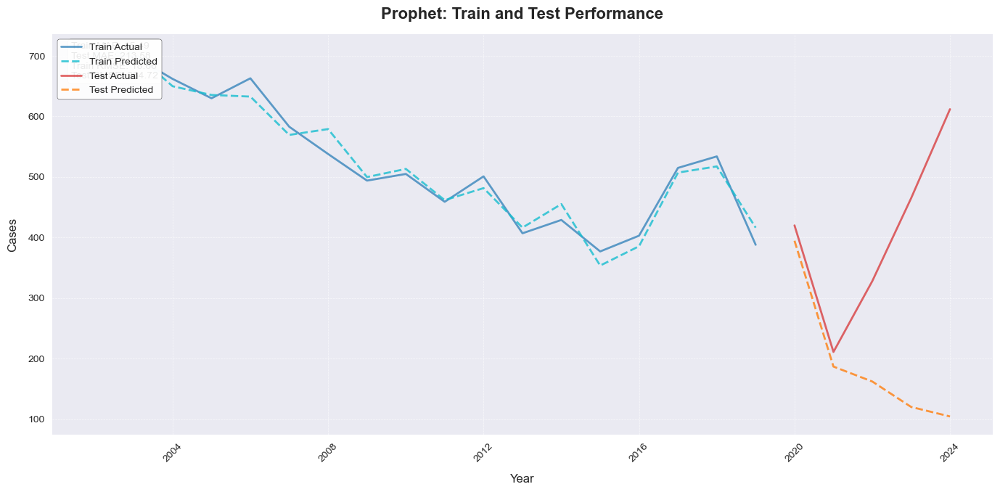

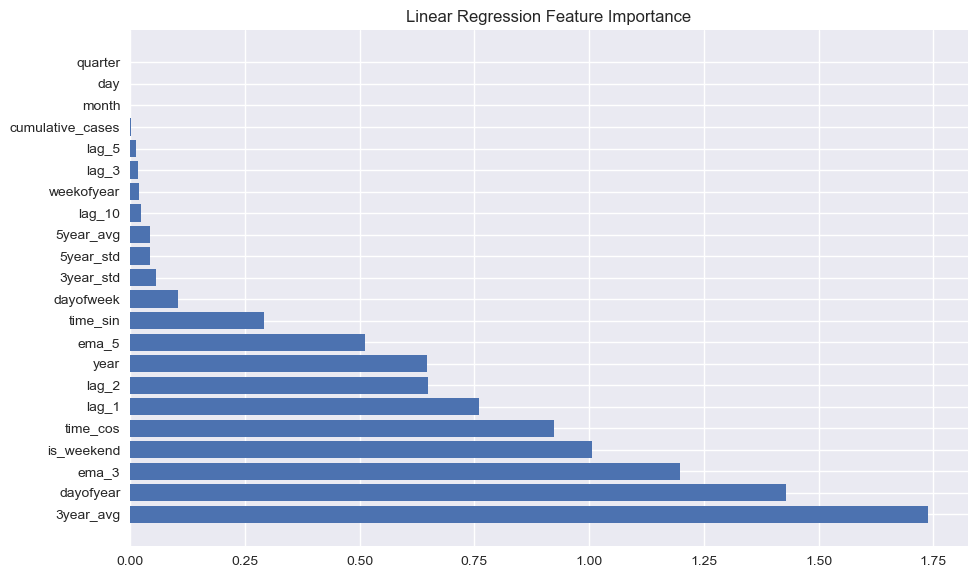


Linear Regression Evaluation:
  MAE: 26.36
  MSE: 1227.81
  RMSE: 35.04
  MAPE: 9.43%
  SMAPE: 10.88%
  R2: 0.93
Linear Regression - Train MAE: 0.00, Test MAE: 26.36
Linear Regression - Train RMSE: 0.00, Test RMSE: 35.04


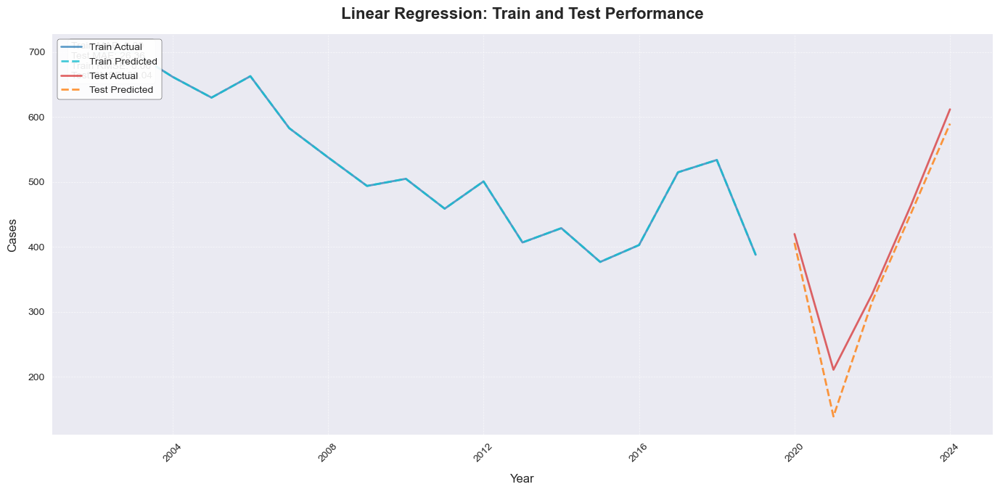

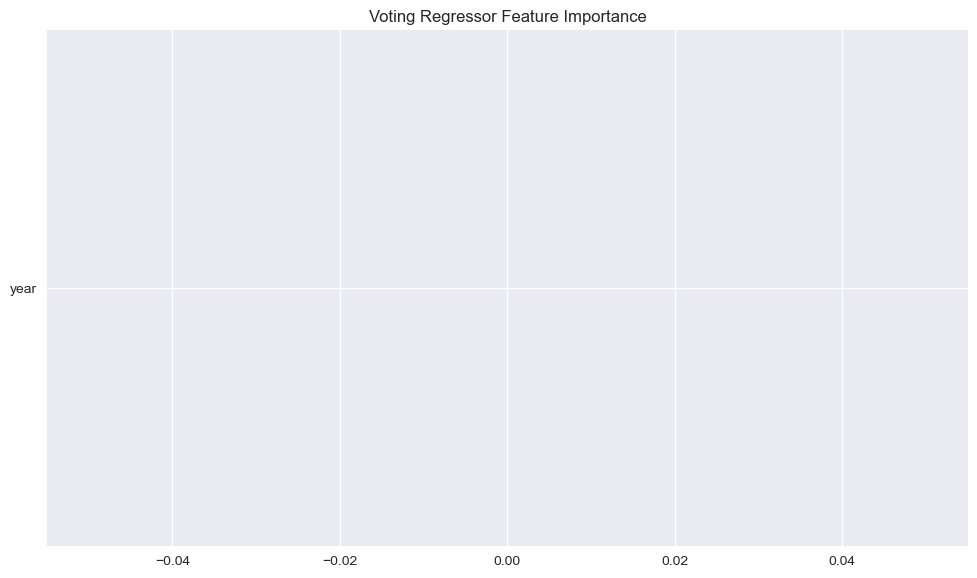


Voting Regressor Evaluation:
  MAE: 10.07
  MSE: 202.90
  RMSE: 14.24
  MAPE: 3.86%
  SMAPE: 4.06%
  R2: 0.99
Voting Regressor - Train MAE: 0.07, Test MAE: 10.07
Voting Regressor - Train RMSE: 0.08, Test RMSE: 14.24


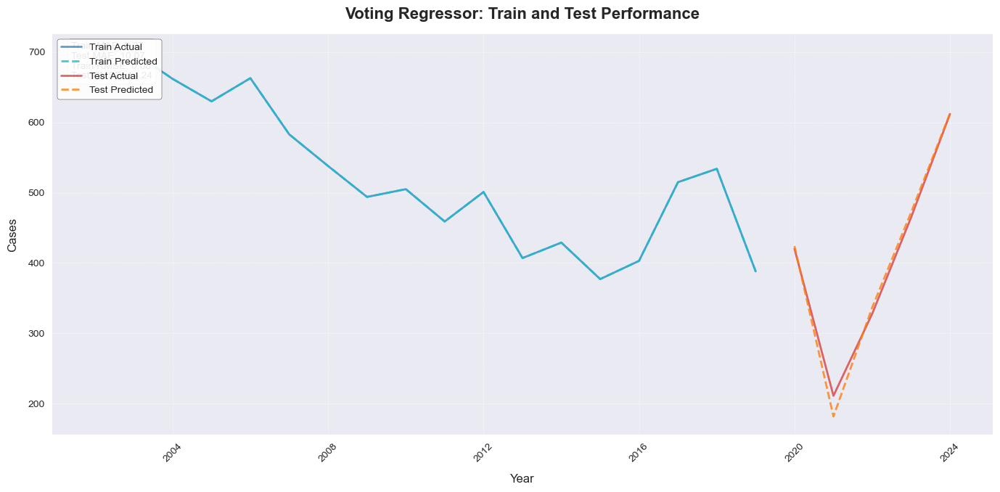

Error in run_xgboost_lr: 'XGBRegressor' object has no attribute 'estimators_'
XGBoost-LR model failed: 'XGBRegressor' object has no attribute 'estimators_'


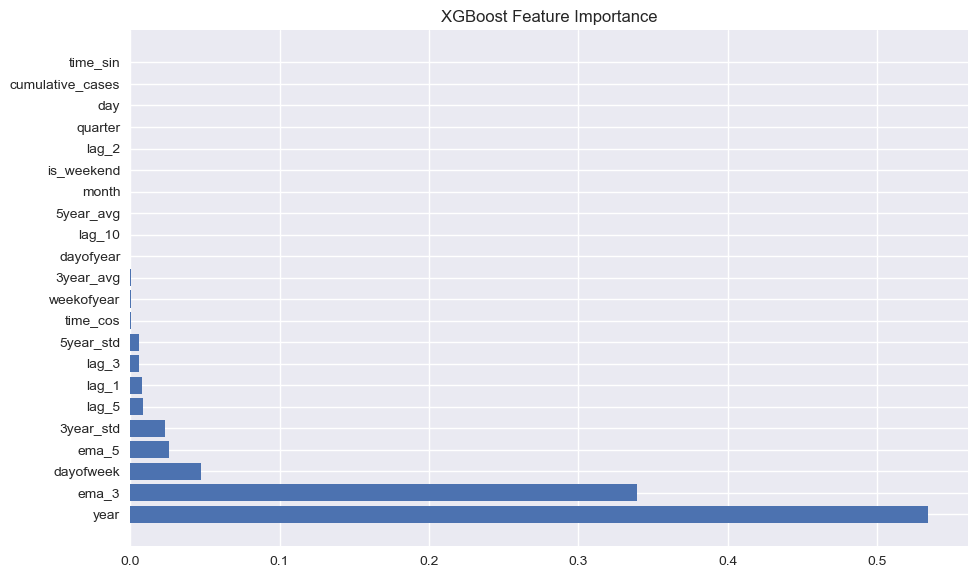


XGBoost Evaluation:
  MAE: 80.30
  MSE: 10144.65
  RMSE: 100.72
  MAPE: 27.89%
  SMAPE: 21.94%
  R2: 0.44
XGBoost - Train MAE: 0.17, Test MAE: 80.30
XGBoost - Train RMSE: 0.26, Test RMSE: 100.72


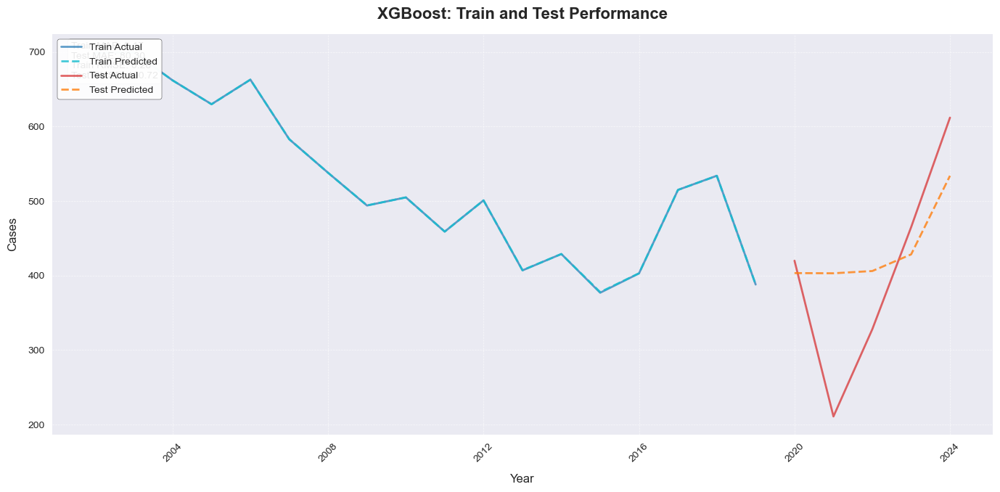

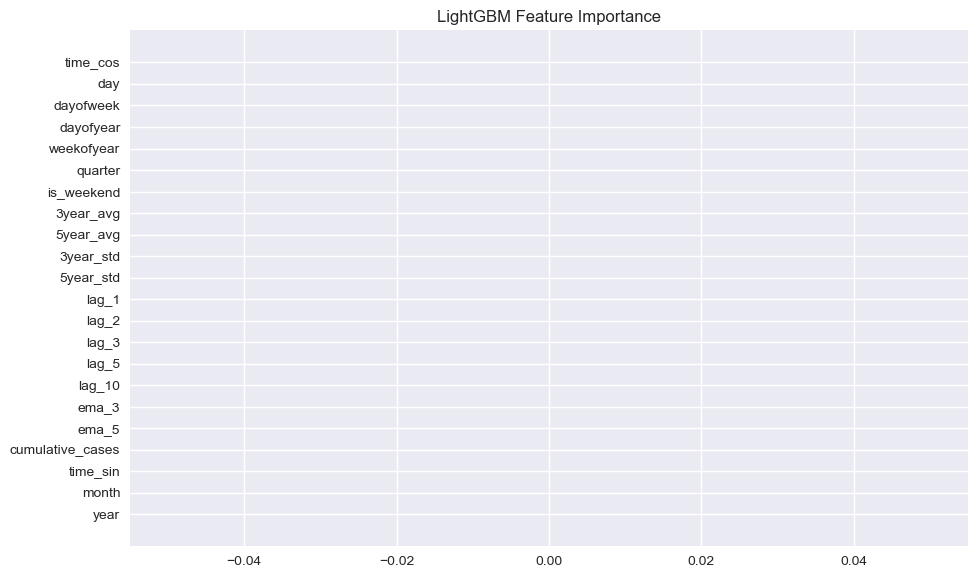


LightGBM Evaluation:
  MAE: 153.83
  MSE: 32405.38
  RMSE: 180.01
  MAPE: 52.64%
  SMAPE: 36.45%
  R2: -0.80
LightGBM - Train MAE: 88.05, Test MAE: 153.83
LightGBM - Train RMSE: 104.96, Test RMSE: 180.01


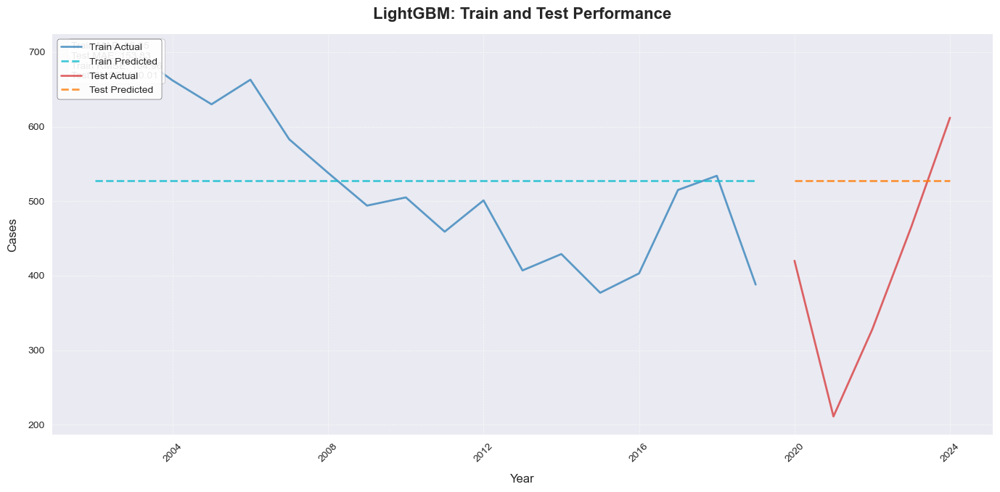

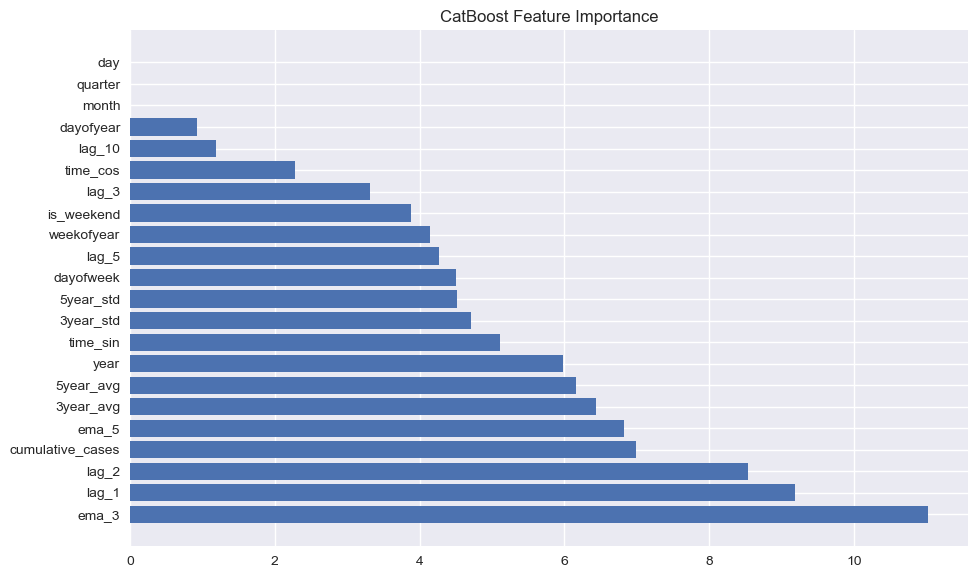


CatBoost Evaluation:
  MAE: 107.51
  MSE: 19396.34
  RMSE: 139.27
  MAPE: 38.30%
  SMAPE: 27.55%
  R2: -0.08
CatBoost - Train MAE: 2.76, Test MAE: 107.51
CatBoost - Train RMSE: 3.53, Test RMSE: 139.27


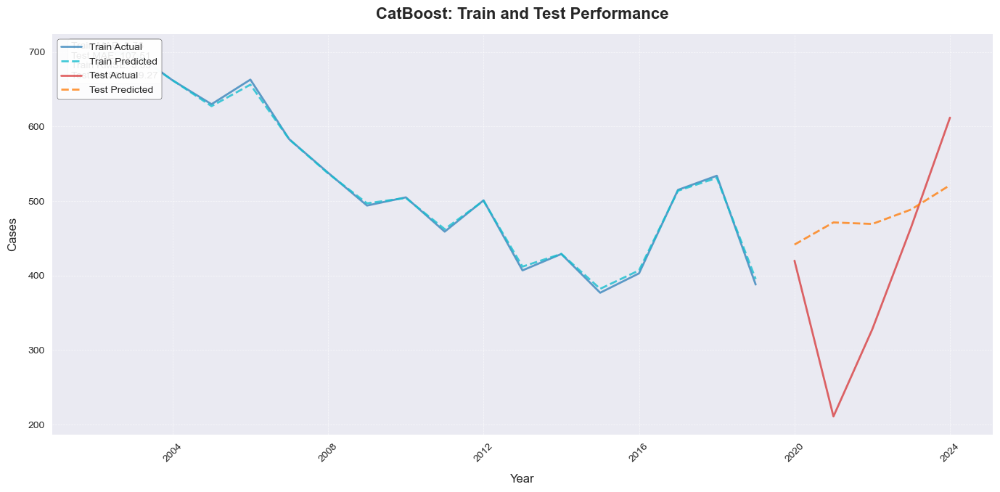

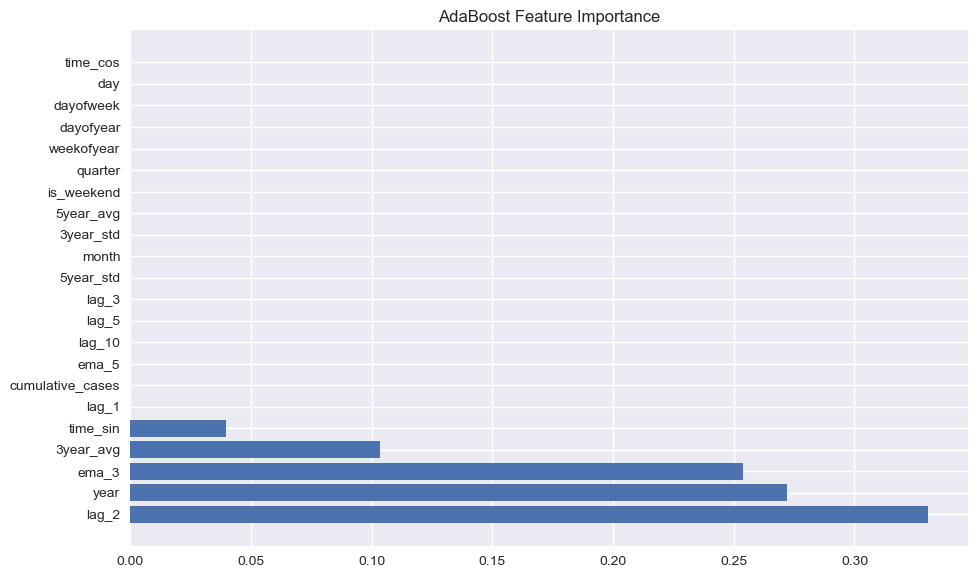


AdaBoost Evaluation:
  MAE: 109.96
  MSE: 18043.96
  RMSE: 134.33
  MAPE: 33.25%
  SMAPE: 28.26%
  R2: -0.00
AdaBoost - Train MAE: 29.28, Test MAE: 109.96
AdaBoost - Train RMSE: 38.14, Test RMSE: 134.33


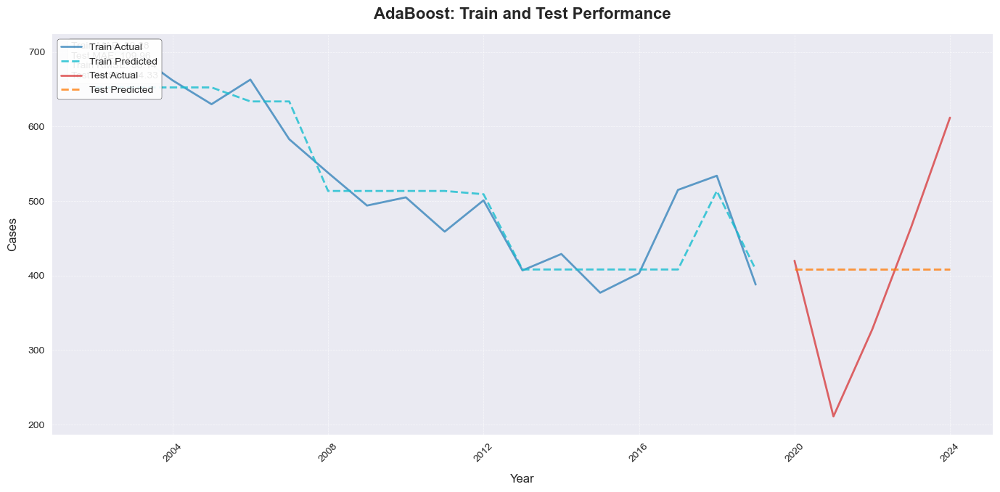


SVR Evaluation:
  MAE: 157.66
  MSE: 33981.22
  RMSE: 184.34
  MAPE: 54.00%
  SMAPE: 37.11%
  R2: -0.88
SVR - Train MAE: 6.69, Test MAE: 157.66
SVR - Train RMSE: 13.54, Test RMSE: 184.34


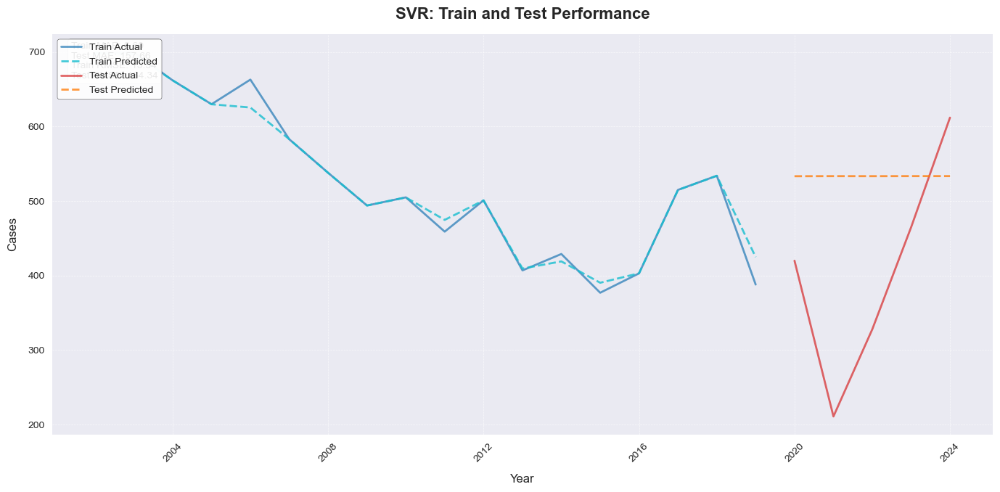


KNN Evaluation:
  MAE: 114.36
  MSE: 19896.28
  RMSE: 141.05
  MAPE: 37.36%
  SMAPE: 29.05%
  R2: -0.10
KNN - Train MAE: 29.60, Test MAE: 114.36
KNN - Train RMSE: 35.80, Test RMSE: 141.05


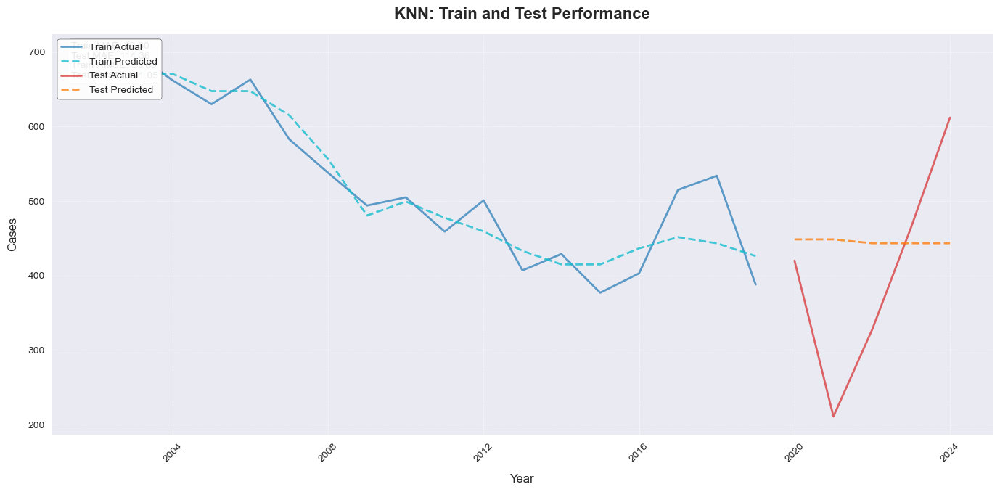

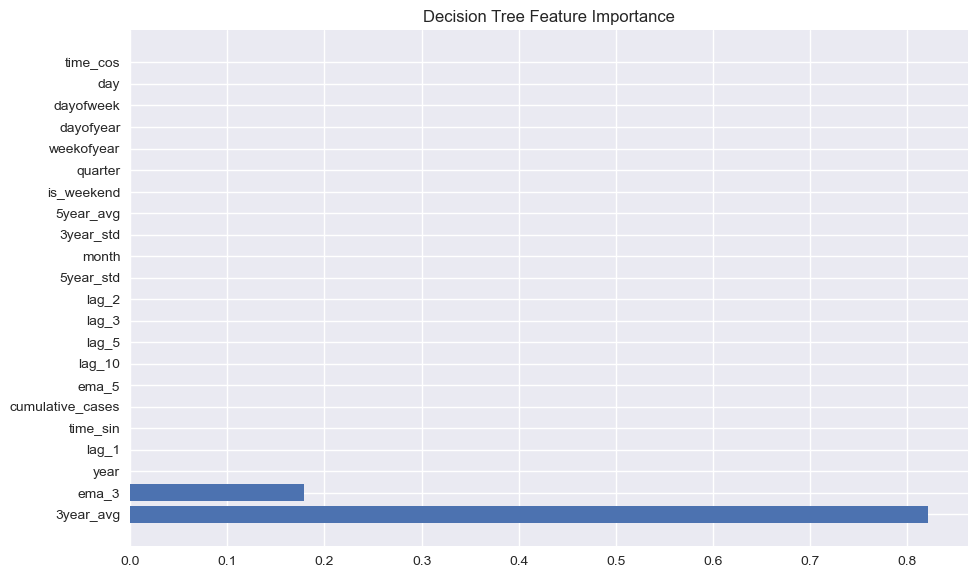


Decision Tree Evaluation:
  MAE: 90.29
  MSE: 11385.87
  RMSE: 106.70
  MAPE: 29.55%
  SMAPE: 24.08%
  R2: 0.37
Decision Tree - Train MAE: 22.57, Test MAE: 90.29
Decision Tree - Train RMSE: 29.52, Test RMSE: 106.70


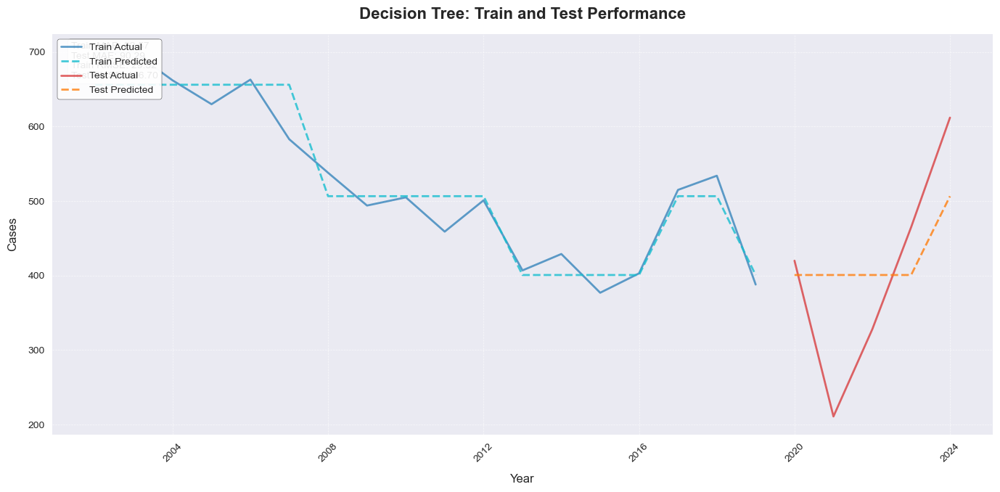

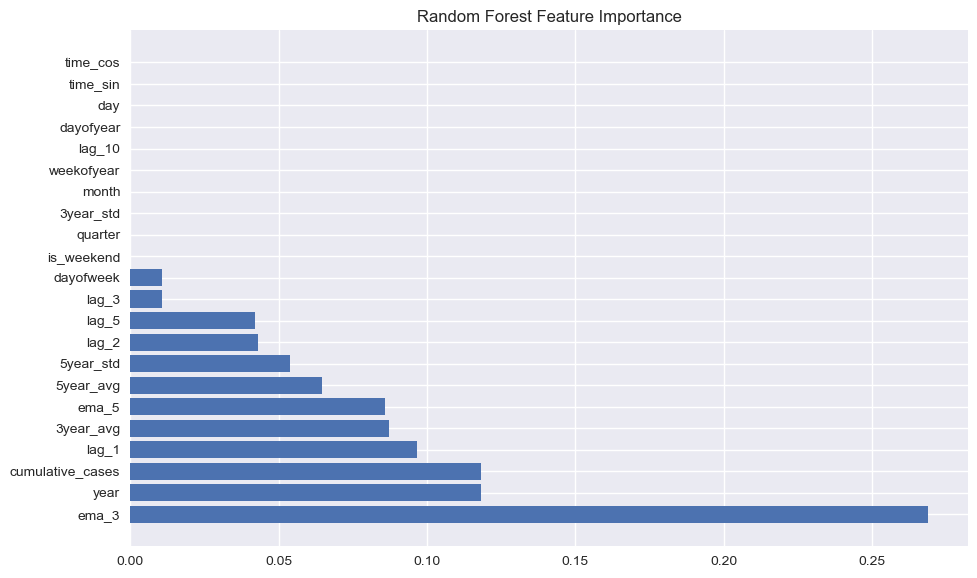


Random Forest Evaluation:
  MAE: 115.99
  MSE: 21002.34
  RMSE: 144.92
  MAPE: 40.37%
  SMAPE: 29.31%
  R2: -0.16
Random Forest - Train MAE: 43.77, Test MAE: 115.99
Random Forest - Train RMSE: 51.02, Test RMSE: 144.92


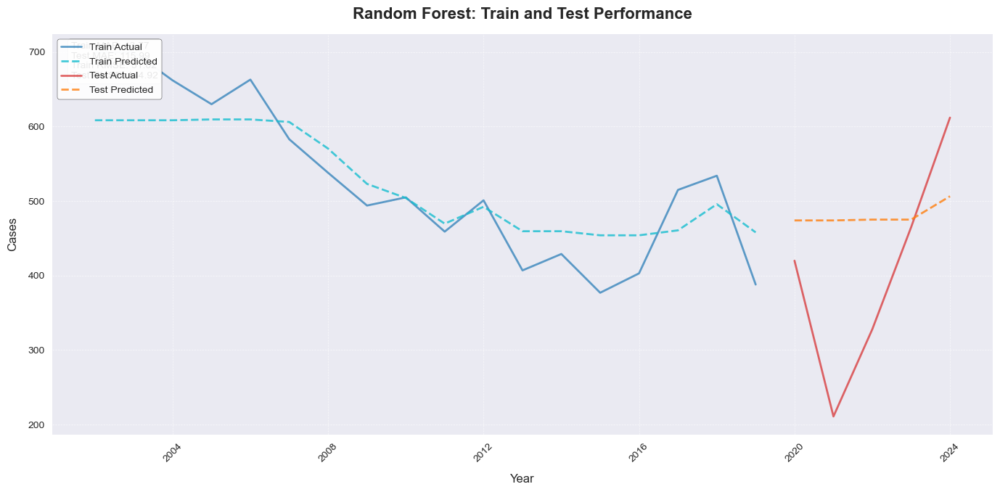

Training boosting base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining boosting base models on full training set...


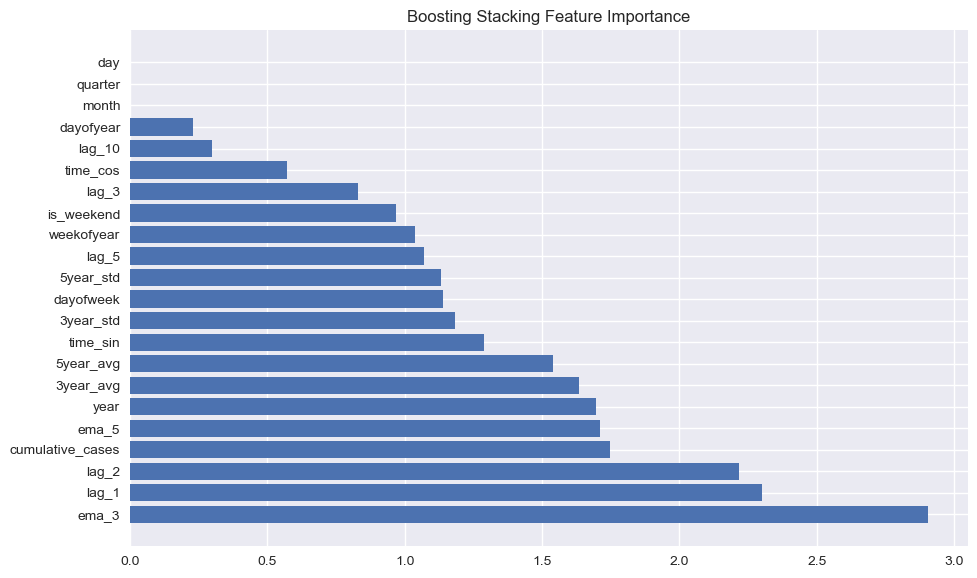


Boosting Stacking Evaluation:
  MAE: 161.36
  MSE: 40336.58
  RMSE: 200.84
  MAPE: 56.41%
  SMAPE: 36.70%
  R2: -1.24
Boosting Stacking - Train MAE: 205.38, Test MAE: 161.36
Boosting Stacking - Train RMSE: 256.98, Test RMSE: 200.84


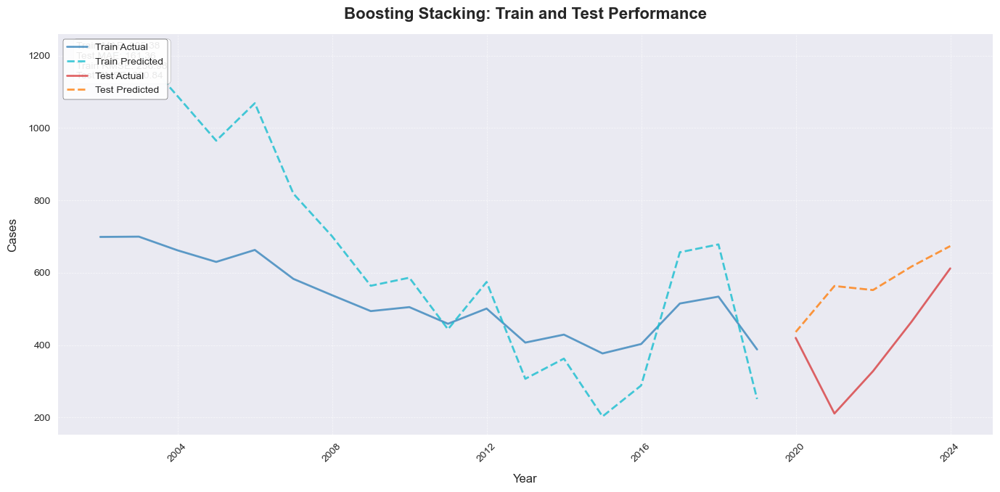

Training tree-based base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining tree-based base models on full training set...


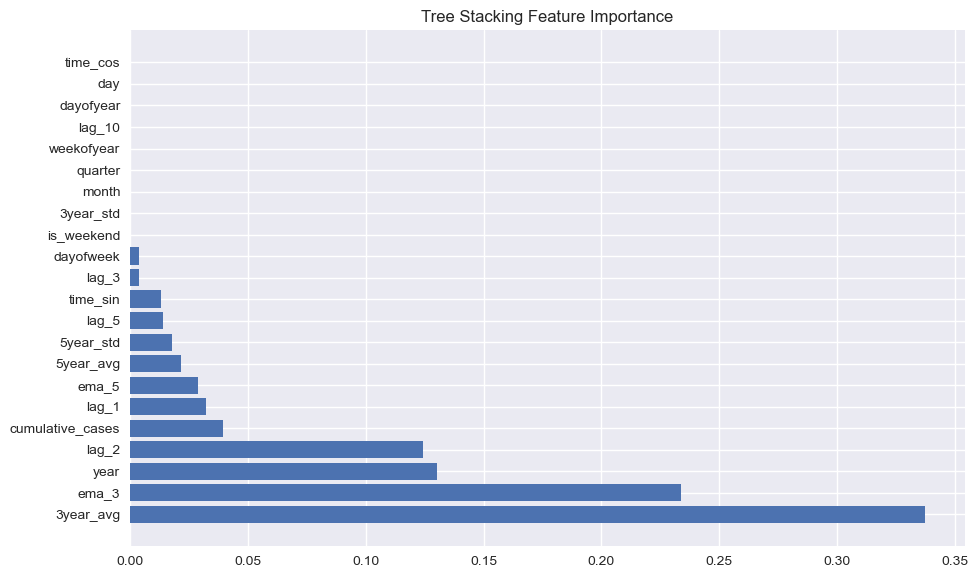


Tree Stacking Evaluation:
  MAE: 232.59
  MSE: 73453.40
  RMSE: 271.02
  MAPE: 66.36%
  SMAPE: 45.23%
  R2: -3.07
Tree Stacking - Train MAE: 114.62, Test MAE: 232.59
Tree Stacking - Train RMSE: 166.09, Test RMSE: 271.02


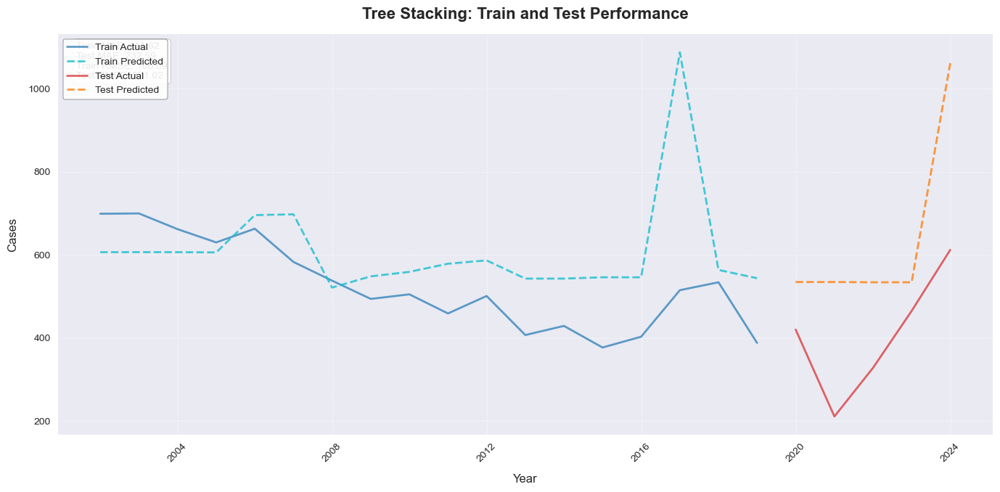

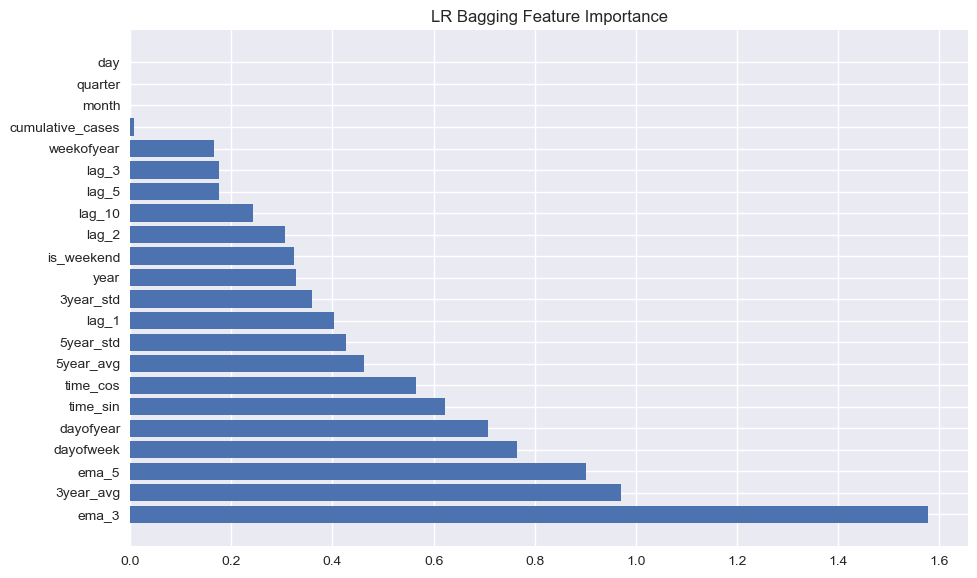


LR Bagging Evaluation:
  MAE: 63.07
  MSE: 4596.70
  RMSE: 67.80
  MAPE: 19.96%
  SMAPE: 17.43%
  R2: 0.75
LR Bagging - Train MAE: 4.33, Test MAE: 63.07
LR Bagging - Train RMSE: 7.57, Test RMSE: 67.80


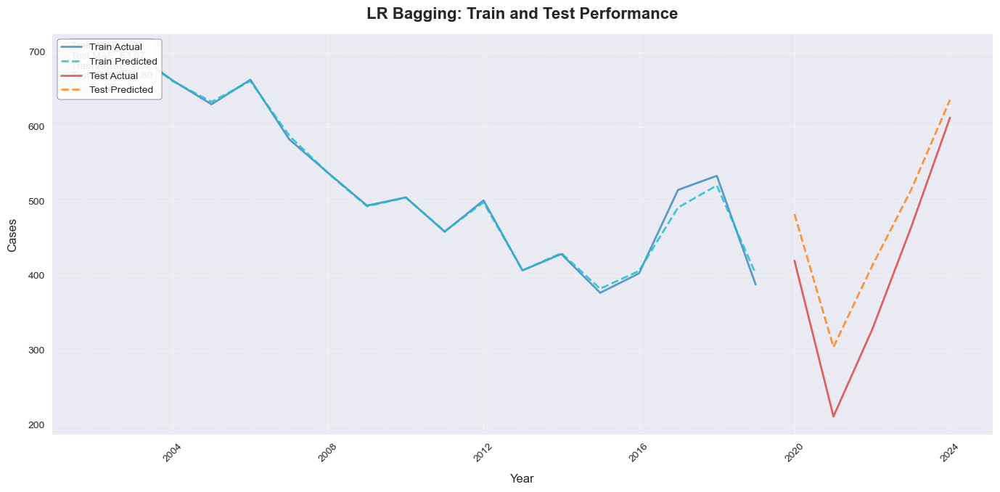

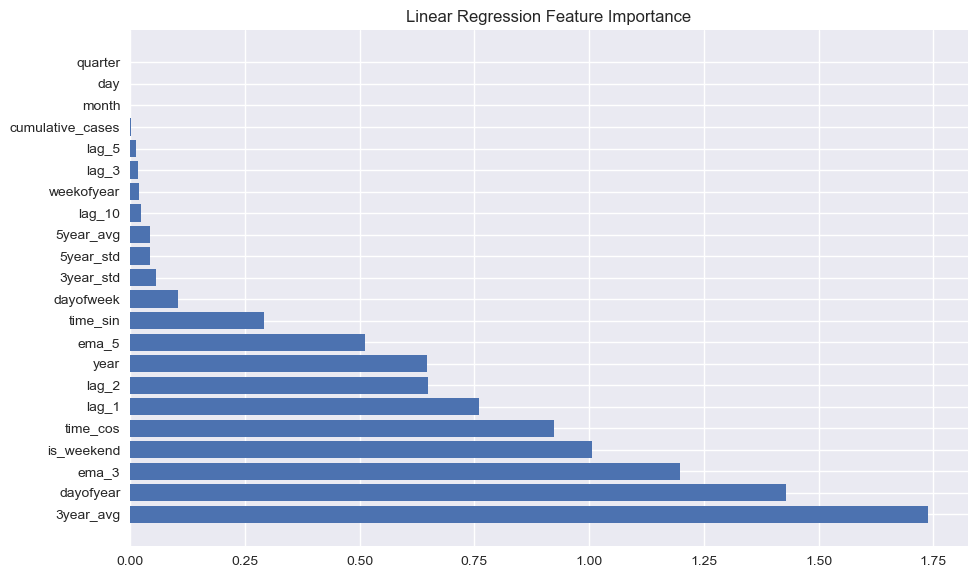

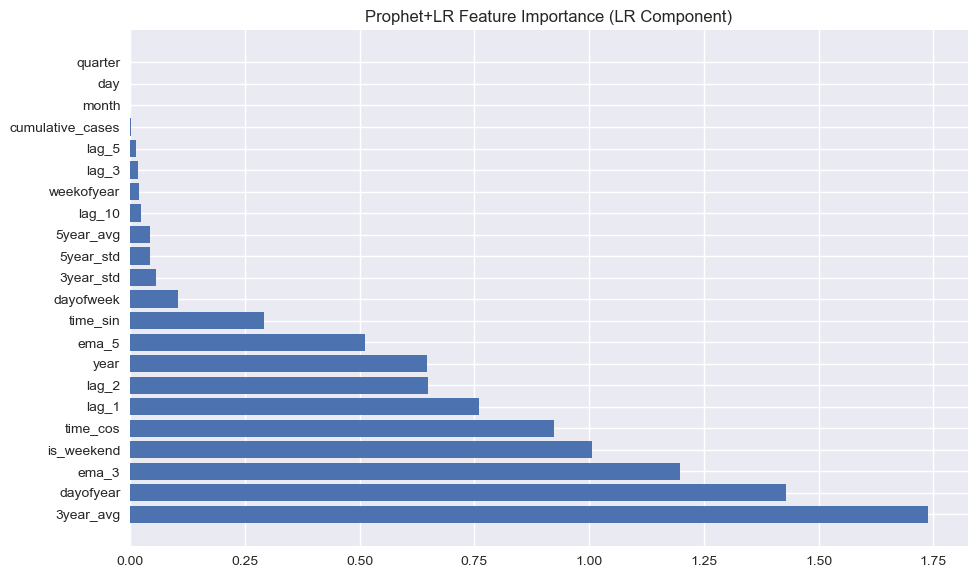


Prophet+LR Evaluation:
  MAE: 63.81
  MSE: 5281.74
  RMSE: 72.68
  MAPE: 16.55%
  SMAPE: 18.51%
  R2: 0.71
Prophet+LR - Train MAE: 3.10, Test MAE: 63.81
Prophet+LR - Train RMSE: 3.73, Test RMSE: 72.68


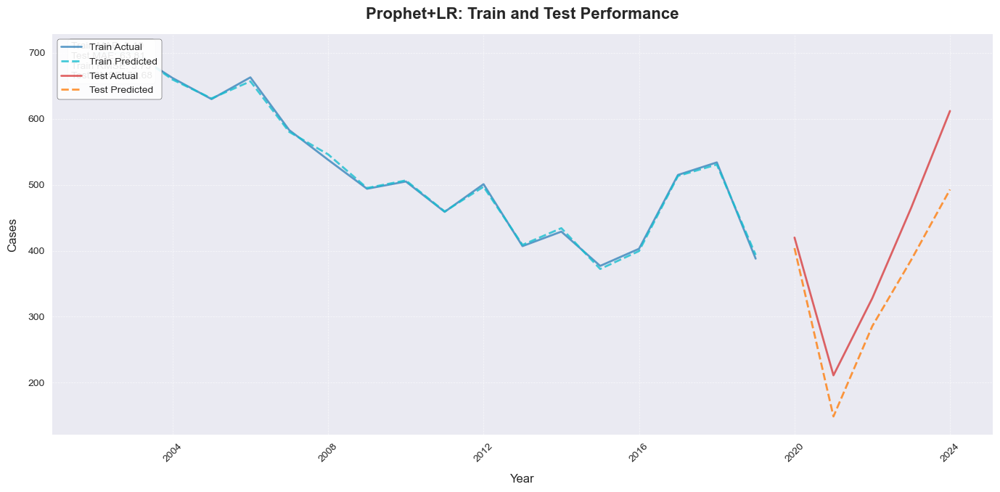


ANN Evaluation:
  MAE: 169.53
  MSE: 43493.37
  RMSE: 208.55
  MAPE: 38.84%
  SMAPE: 46.47%
  R2: -1.41
ANN - Train MAE: 201.57, Test MAE: 169.53
ANN - Train RMSE: 229.79, Test RMSE: 208.55


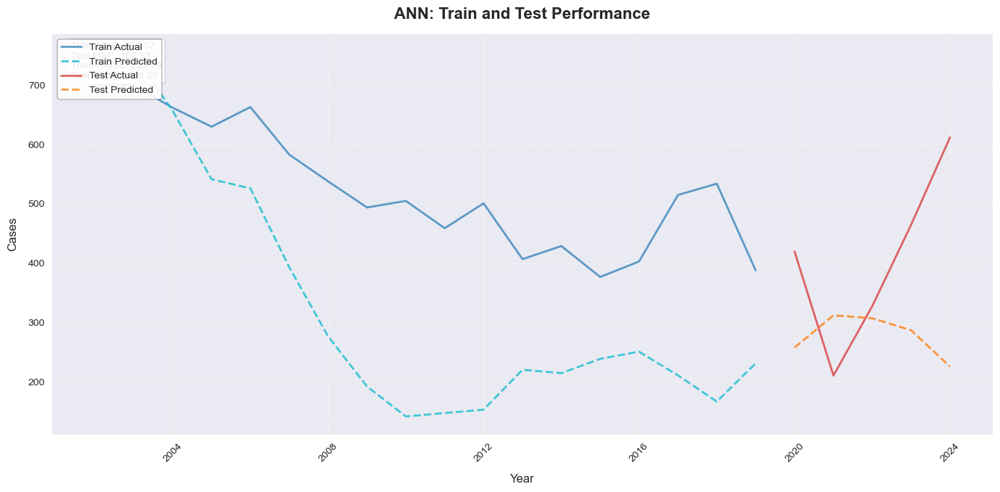

Running ACO for feature selection...
Iteration 0, Best MAE: 17.10
Iteration 10, Best MAE: 17.10
Iteration 20, Best MAE: 17.10
Iteration 30, Best MAE: 8.49
Iteration 40, Best MAE: 8.49


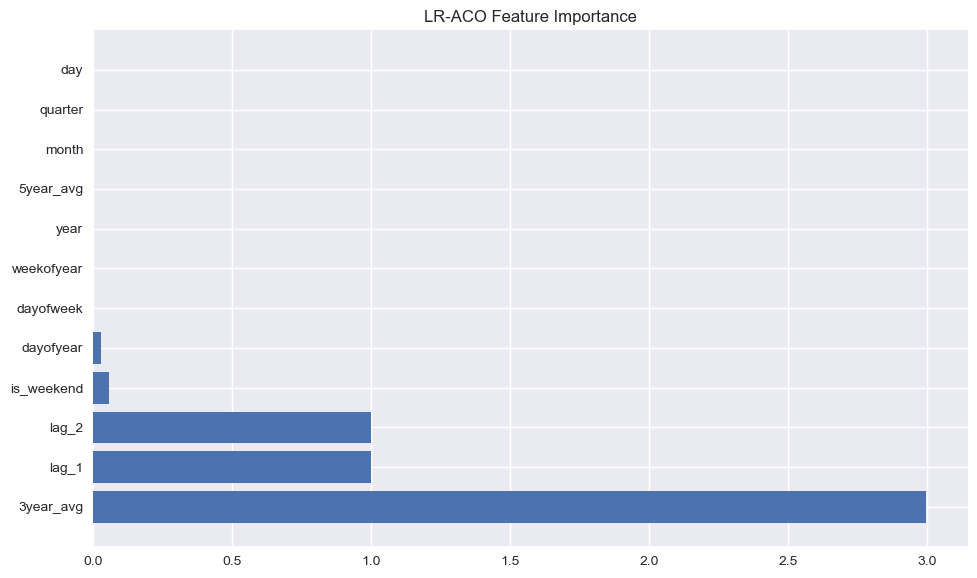


LR-ACO Evaluation:
  MAE: 20.91
  MSE: 2173.18
  RMSE: 46.62
  MAPE: 9.89%
  SMAPE: 13.13%
  R2: 0.88
LR-ACO - Train MAE: 0.04, Test MAE: 20.91
LR-ACO - Train RMSE: 0.07, Test RMSE: 46.62


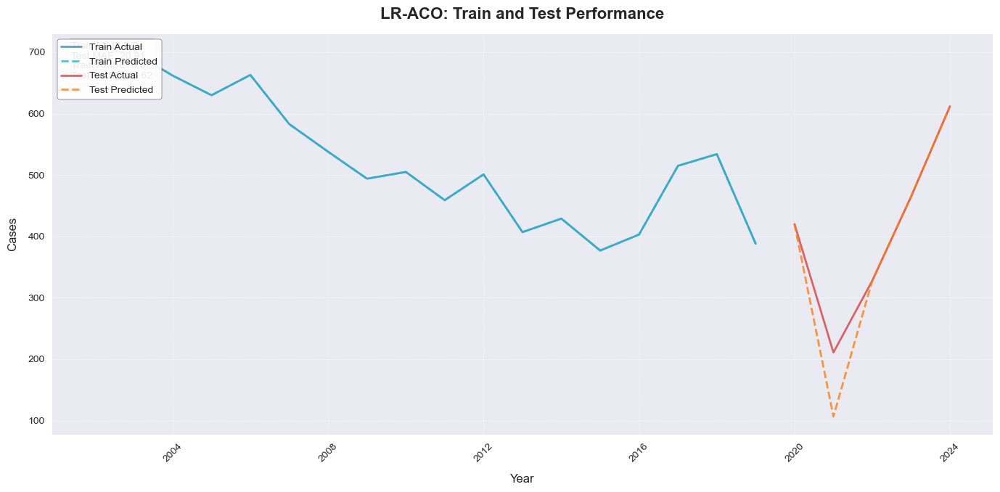

Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 19.74
Iteration 10, Best MAE: 18.59
Iteration 20, Best MAE: 18.59
Iteration 30, Best MAE: 18.59
Iteration 40, Best MAE: 18.59


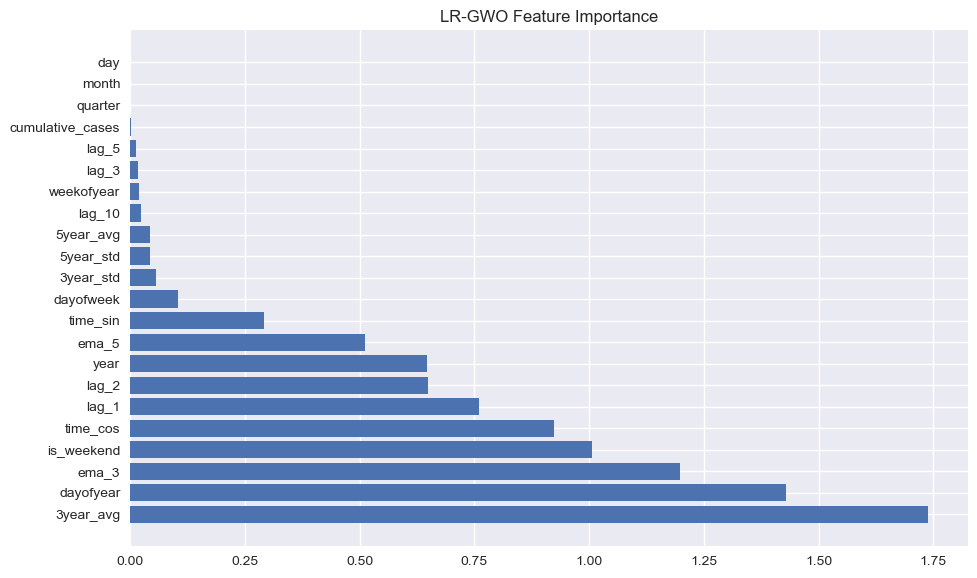


LR-GWO Evaluation:
  MAE: 26.36
  MSE: 1227.52
  RMSE: 35.04
  MAPE: 9.43%
  SMAPE: 10.88%
  R2: 0.93
LR-GWO - Train MAE: 0.00, Test MAE: 26.36
LR-GWO - Train RMSE: 0.00, Test RMSE: 35.04


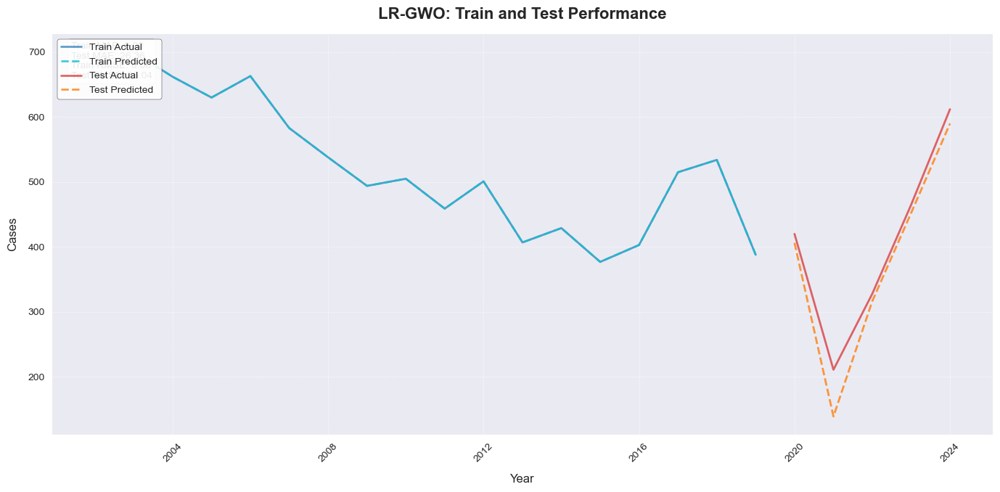

Running ACO for feature selection...
Iteration 0, Best MAE: 18.56
Iteration 10, Best MAE: 11.62
Iteration 20, Best MAE: 11.62
Iteration 30, Best MAE: 11.62
Iteration 40, Best MAE: 8.49
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 15.18
Iteration 10, Best MAE: 13.64
Iteration 20, Best MAE: 13.62
Iteration 30, Best MAE: 13.49
Iteration 40, Best MAE: 13.49


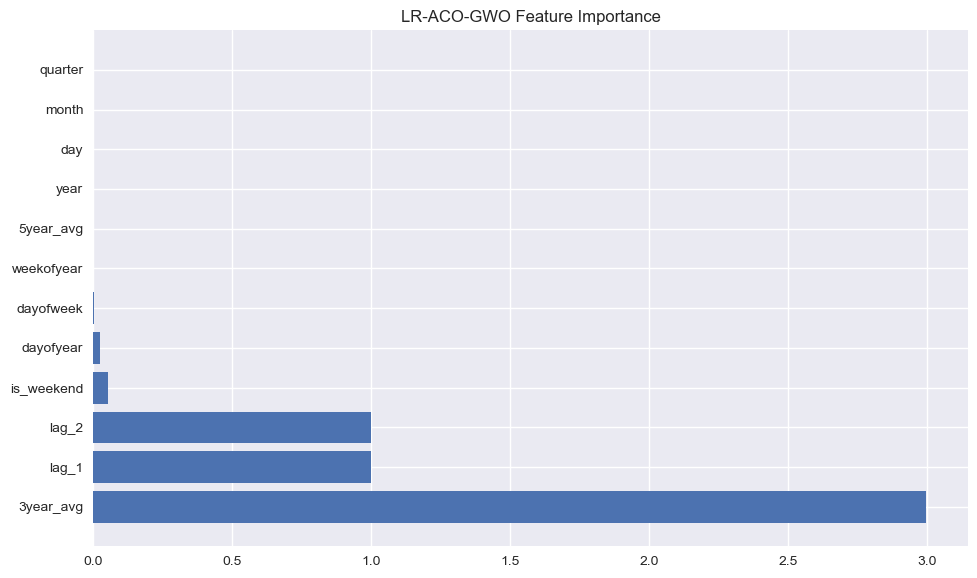


LR-ACO-GWO Evaluation:
  MAE: 20.91
  MSE: 2173.03
  RMSE: 46.62
  MAPE: 9.89%
  SMAPE: 13.13%
  R2: 0.88
LR-ACO-GWO - Train MAE: 0.04, Test MAE: 20.91
LR-ACO-GWO - Train RMSE: 0.07, Test RMSE: 46.62


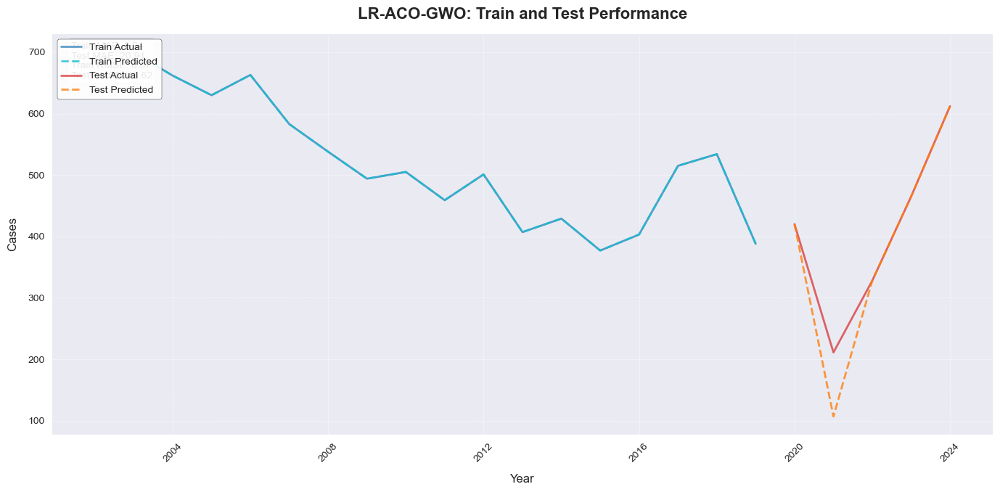

Running ACO for feature selection...
Iteration 0, Best MAE: 18.15
Iteration 10, Best MAE: 17.87
Iteration 20, Best MAE: 12.19
Iteration 30, Best MAE: 8.43
Iteration 40, Best MAE: 8.43
Selected features by ACO: ['month', 'day', 'year', 'dayofweek', 'lag_2', 'dayofyear', 'weekofyear', 'is_weekend', 'quarter', '5year_avg', 'lag_5', '3year_avg', 'lag_1']
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 17.63
Iteration 10, Best MAE: 14.15
Iteration 20, Best MAE: 14.15
Iteration 30, Best MAE: 14.15
Iteration 40, Best MAE: 14.15
Optimized hyperparameters: {'n_estimators': 41.141269411968956, 'max_samples': 1.0}


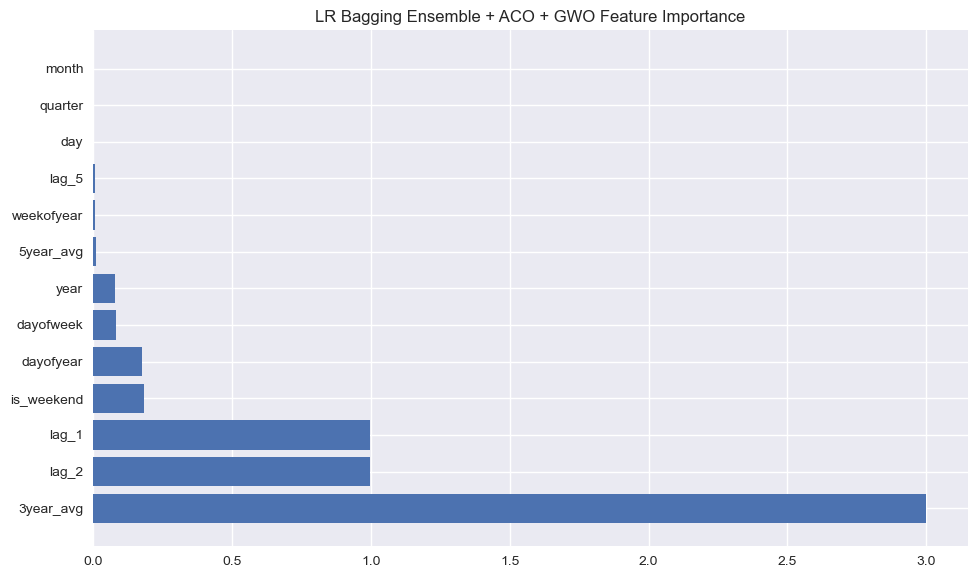


LR Bagging ACO GWO Evaluation:
  MAE: 21.65
  MSE: 2190.17
  RMSE: 46.80
  MAPE: 10.08%
  SMAPE: 13.35%
  R2: 0.88
LR Bagging ACO GWO - Train MAE: 0.11, Test MAE: 21.65
LR Bagging ACO GWO - Train RMSE: 0.13, Test RMSE: 46.80


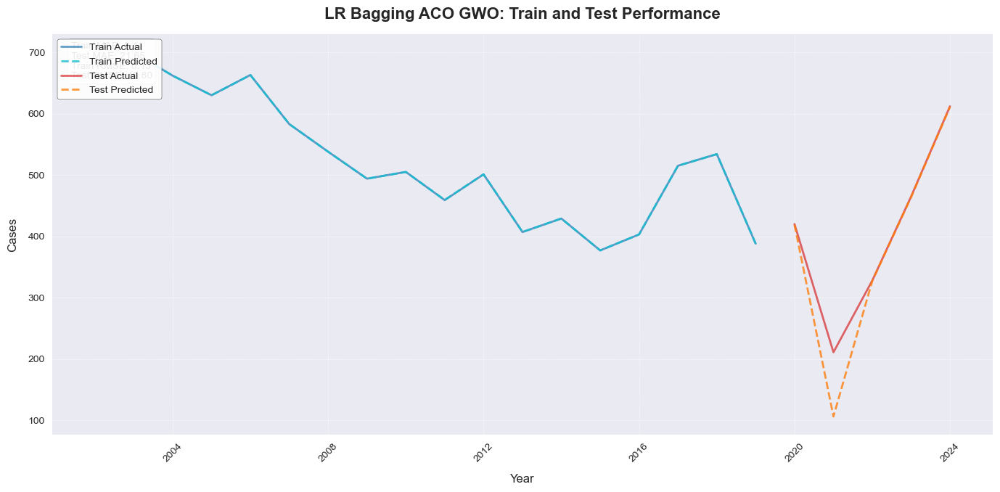


Model Performance Summary (sorted by MAE):
             Model        MAE          MSE       RMSE      MAPE     SMAPE        R2
  Voting Regressor  10.066811   202.903237  14.244411  3.860781  4.059174  0.988754
        LR-ACO-GWO  20.906924  2173.028295  46.615752  9.893151 13.134136  0.879564
            LR-ACO  20.907200  2173.181545  46.617395  9.893439 13.134690  0.879555
LR Bagging ACO GWO  21.652314  2190.166636  46.799216 10.080206 13.349966  0.878614
            LR-GWO  26.358915  1227.517603  35.035947  9.432052 10.875973  0.931967
 Linear Regression  26.363248  1227.812851  35.040161  9.433391 10.877642  0.931951
        LR Bagging  63.068352  4596.699826  67.798966 19.960720 17.432016  0.745236
        Prophet+LR  63.805920  5281.742454  72.675597 16.553840 18.508811  0.707269
           XGBoost  80.300159 10144.654240 100.720674 27.890209 21.940055  0.437750
     Decision Tree  90.285714 11385.868735 106.704586 29.550500 24.076724  0.368958
          CatBoost 107.511272 19

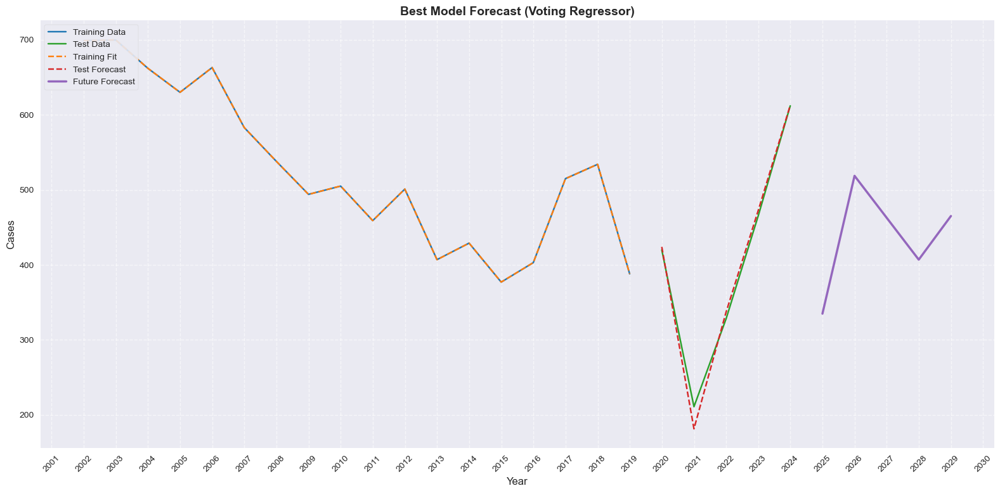

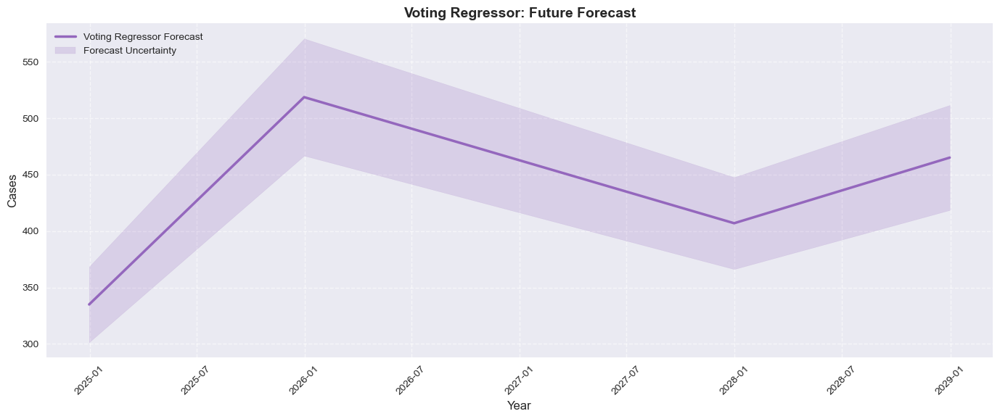


Future Forecasts for All Models:

Prophet Forecast:
        ds       yhat
2024-12-31  64.871093
2025-12-31  31.525275
2026-12-31   1.740052
2027-12-31 -28.231195
2028-12-31 -62.145907

Linear Regression Forecast:
        ds       yhat
2024-12-31 239.553257
2025-12-31 523.191348
2026-12-31 455.101173
2027-12-31 321.171230
2028-12-31 469.477138

Voting Regressor Forecast:
        ds       yhat
2024-12-31 334.960878
2025-12-31 518.696167
2026-12-31 462.835245
2027-12-31 406.967019
2028-12-31 465.118009

XGBoost Forecast:
        ds       yhat
2024-12-31 532.364319
2025-12-31 532.851868
2026-12-31 533.542664
2027-12-31 530.441345
2028-12-31 526.781799

LightGBM Forecast:
        ds       yhat
2024-12-31 527.043335
2025-12-31 527.043335
2026-12-31 527.043335
2027-12-31 527.043335
2028-12-31 527.043335

CatBoost Forecast:
        ds       yhat
2024-12-31 481.303544
2025-12-31 471.726057
2026-12-31 488.986850
2027-12-31 493.254734
2028-12-31 511.490499

AdaBoost Forecast:
        ds  yhat
20

In [33]:
from sklearn.ensemble import AdaBoostRegressor
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from scipy.ndimage import gaussian_filter1d
from statsmodels.tsa.seasonal import STL
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import VotingRegressor, BaggingRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from datetime import timedelta
import matplotlib.dates as mdates

# Configure logging to suppress unnecessary warnings
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

# Define universal feature set for ML models (updated for annual data, removed population)
FEATURES = [
    'year', 'month', 'day', 'dayofweek', 'dayofyear', 'weekofyear', 'quarter', 'is_weekend',
    '3year_avg', '5year_avg', '3year_std', '5year_std', 'lag_1', 'lag_2', 'lag_3', 'lag_5',
    'lag_10', 'ema_3', 'ema_5', 'cumulative_cases', 'time_sin', 'time_cos'
]

# === DATA PREPROCESSING ===

def preprocess_data(df, frequency='Y', group_by_year=True):
    """Preprocess input DataFrame for annual forecasting, handling multiple rows per year."""
    try:
        if not isinstance(df, pd.DataFrame):
            raise ValueError("Input must be a pandas DataFrame")
        if 'Cases' not in df.columns:
            raise ValueError("DataFrame must contain 'Cases' column")
            
        df = df.copy()
        
        # Reset index if Year is the index
        if df.index.name == 'Year':
            df = df.reset_index()
        
        # Aggregate by year, summing cases
        agg_dict = {'Cases': 'sum'}
        
        # Ensure we have a Year column
        if 'Year' not in df.columns and df.index.name != 'Year':
            raise ValueError("Data must have either a 'Year' column or a 'Year' index")
        
        # Convert Year to datetime
        if 'Year' in df.columns:
            df['ds'] = pd.to_datetime(df['Year'], format='%Y')
        else:
            df['ds'] = pd.to_datetime(df.index, format='%Y')
            
        if group_by_year:
            df_agg = df.groupby('ds').agg(agg_dict).reset_index()
        else:
            df_agg = df.copy()
            
        df_agg = df_agg.rename(columns={'Cases': 'y'})
        df_agg.set_index('ds', inplace=True)
        
        # Handle resampling
        numeric_cols = ['y']
        df_numeric = df_agg[numeric_cols].resample(frequency).sum(numeric_only=True).fillna(0)
        df_agg = df_numeric
        
        # Smooth and transform the target variable
        df_agg['y'] = df_agg['y'].replace(0, np.nan).interpolate(method='time').fillna(method='bfill')
        df_agg['y'] = df_agg['y'].clip(lower=df_agg['y'].quantile(0.01), upper=df_agg['y'].quantile(0.99))
        df_agg['y_log'] = np.log(df_agg['y'].clip(lower=df_agg['y'].quantile(0.01)))
        df_agg = df_agg.reset_index()

        return df_agg, {}
    except Exception as e:
        print(f"Error in preprocess_data: {e}")
        raise

def add_features(df, encoders=None, is_future=False, base_df=None):
    """Add time-series features to DataFrame for annual forecasting."""
    try:
        df = df.copy()
        if 'ds' not in df.columns:
            raise ValueError("DataFrame must contain 'ds' column with dates")
            
        df['ds'] = pd.to_datetime(df['ds'])
        
        # Extract year and basic time features
        df['year'] = df['ds'].dt.year
        df['month'] = df['ds'].dt.month
        df['day'] = df['ds'].dt.day
        df['dayofweek'] = df['ds'].dt.dayofweek
        df['dayofyear'] = df['ds'].dt.dayofyear
        df['weekofyear'] = df['ds'].dt.isocalendar().week
        df['quarter'] = df['ds'].dt.quarter
        df['is_weekend'] = df['dayofweek'].ge(5).astype(int)

        if not is_future:
            if 'y' not in df.columns:
                raise ValueError("Historical data must contain 'y' column")
                
            df.set_index('ds', inplace=True)
            
            # Annual rolling statistics
            for window in [3, 5]:
                df[f'{window}year_avg'] = df['y'].rolling(window, min_periods=1).mean().fillna(method='bfill')
                df[f'{window}year_std'] = df['y'].rolling(window, min_periods=1).std().fillna(method='bfill')
            
            # Annual lags
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                df[f'lag_{lag}'] = df['y'].shift(lag).fillna(method='bfill')
                
            # Exponential moving averages
            df['ema_3'] = df['y'].ewm(span=3, adjust=False).mean().fillna(method='bfill')
            df['ema_5'] = df['y'].ewm(span=5, adjust=False).mean().fillna(method='bfill')
            
            # Cumulative cases
            df['cumulative_cases'] = df['y'].cumsum().fillna(method='bfill')
            
            # Time-based cyclical features
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            df = df.reset_index()
        else:
            if base_df is None:
                raise ValueError("base_df must be provided for future forecasting")
            
            # Use historical data to populate features for future forecasts
            lags = [1, 2, 3, 5, 10]
            latest_values = base_df.tail(max(lags)).copy()
            y_values = latest_values['y'].values if 'y' in latest_values.columns else np.zeros(len(latest_values))
            
            for window in [3, 5]:
                df[f'{window}year_avg'] = base_df[f'{window}year_avg'].iloc[-window:].mean()
                df[f'{window}year_std'] = base_df[f'{window}year_std'].iloc[-window:].mean()
            
            for lag in lags:
                if len(y_values) >= lag:
                    df[f'lag_{lag}'] = y_values[-lag]
                else:
                    df[f'lag_{lag}'] = y_values[-1] if len(y_values) > 0 else 0
            
            df['ema_3'] = base_df['ema_3'].iloc[-1] if 'ema_3' in base_df.columns else 0
            df['ema_5'] = base_df['ema_5'].iloc[-1] if 'ema_5' in base_df.columns else 0
            df['cumulative_cases'] = base_df['cumulative_cases'].iloc[-1] if 'cumulative_cases' in base_df.columns else 0
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)

        # Ensure all features exist, fill missing ones with reasonable defaults
        for feature in FEATURES:
            if feature not in df.columns:
                if 'lag_' in feature:
                    df[feature] = 0  # Default for lags
                elif 'avg' in feature or 'std' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                elif 'ema' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                else:
                    df[feature] = 0
                
        # Final check for missing values
        df[FEATURES] = df[FEATURES].fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        return df
    except Exception as e:
        print(f"Detailed error in add_features: {str(e)}")
        if 'df' in locals():
            print(f"DataFrame columns: {df.columns}")
            print(f"Missing features: {[f for f in FEATURES if f not in df.columns]}")
        raise

# === MODEL IMPLEMENTATIONS ===

def create_prophet_model():
    """Create and configure a Prophet model for annual forecasting."""
    model = Prophet(
        seasonality_mode='multiplicative',
        changepoint_prior_scale=0.05,
        yearly_seasonality=False,
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_range=0.9
    )
    # Add custom seasonalities for longer cycles
    model.add_seasonality(name='decadal', period=10, fourier_order=3)
    model.add_seasonality(name='quinquennial', period=5, fourier_order=2)
    
    # Add relevant regressors
    for reg in ['3year_avg', '5year_avg']:
        model.add_regressor(reg)
    return model

def run_linear_regression(train_df, test_df, target='y'):
    """Fit and forecast using Linear Regression model."""
    try:
        if len(train_df) == 0 or len(test_df) == 0:
            raise ValueError("Empty training or test data provided")
            
        train_clean = train_df.copy()
        test_clean = test_df.copy()
        
        for feature in FEATURES:
            if feature in train_clean.columns:
                median_val = train_clean[feature].median()
                train_clean[feature] = train_clean[feature].fillna(median_val)
                test_clean[feature] = test_clean[feature].fillna(median_val)
        
        if len(train_clean) == 0:
            raise ValueError("No valid training samples after cleaning")
        if len(test_clean) == 0:
            raise ValueError("No valid test samples after cleaning")
            
        X_train = train_clean[FEATURES]
        y_train = train_clean[target]
        X_test = test_clean[FEATURES]
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
            
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Linear Regression Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Detailed error in run_linear_regression: {str(e)}")
        print(f"Train shape: {train_df.shape if isinstance(train_df, pd.DataFrame) else 'N/A'}")
        print(f"Test shape: {test_df.shape if isinstance(test_df, pd.DataFrame) else 'N/A'}")
        if 'train_clean' in locals():
            print(f"Train features after cleaning: {train_clean[FEATURES].shape if isinstance(train_clean, pd.DataFrame) else 'N/A'}")
        raise

def run_voting_regressor(train_df, test_df, target='y'):
    """Fit and forecast using Voting Regressor model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        estimators = [
            ('lr', LinearRegression()),
            ('ridge', Ridge(alpha=1.0)),
            ('lasso', Lasso(alpha=1.0))
        ]
        model = VotingRegressor(estimators=estimators, n_jobs=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, estimator in estimators:
            if hasattr(estimator, 'coef_'):
                estimator.fit(X_train, y_train)
                feature_importance += np.abs(estimator.coef_)
        feature_importance /= len([e for e in estimators if hasattr(e[1], 'coef_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Voting Regressor Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_voting_regressor: {e}")
        raise

def run_xgboost_lr(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost with Linear Regression base estimator."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(
            estimator=LinearRegression(),
            n_estimators=1000,
            learning_rate=0.01,
            max_depth=3,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(FEATURES))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost-LR Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost_lr: {e}")
        raise

def run_xgboost(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost: {e}")
        raise

def run_lightgbm(train_df, test_df, target='y'):
    """Fit and forecast using LightGBM model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LightGBM Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lightgbm: {e}")
        raise

def run_catboost(train_df, test_df, target='y'):
    """Fit and forecast using CatBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.get_feature_importance()
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('CatBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_catboost: {e}")
        raise

def run_adaboost(train_df, test_df, target='y'):
    """Fit and forecast using AdaBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
            n_estimators=100,
            learning_rate=0.1,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('AdaBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_adaboost: {e}")
        raise

def run_svr(train_df, test_df, target='y'):
    """Fit and forecast using SVR model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = SVR(kernel='rbf', C=100, epsilon=0.1)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_svr: {e}")
        raise

def run_knn(train_df, test_df, target='y'):
    """Fit and forecast using KNN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_knn: {e}")
        raise

def run_decision_tree(train_df, test_df, target='y'):
    """Fit and forecast using Decision Tree model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Decision Tree Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_decision_tree: {e}")
        raise

def run_random_forest(train_df, test_df, target='y'):
    """Fit and forecast using Random Forest model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        train_df = train_df.copy().dropna(subset=[target] + FEATURES)
        test_df = test_df.copy().dropna(subset=FEATURES)
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] != y_train.shape[0]:
            raise ValueError(f"Inconsistent training data: X_train has {X_train.shape[0]} samples, y_train has {y_train.shape[0]} samples")
        if X_test.shape[0] == 0:
            raise ValueError("Empty test data after preprocessing")
        
        model = RandomForestRegressor(
            n_estimators=100,
            max_depth=5,
            min_samples_split=10,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Random Forest Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_random_forest: {e}")
        raise

# === NEW STACKING MODELS ===

class StackingModelWrapper:
    def __init__(self, base_models, meta_model):
        self.base_models = base_models
        self.meta_model = meta_model
        
    def predict(self, X):
        try:
            base_preds = []
            for name, model in self.base_models.items():
                base_preds.append(model.predict(X))
            stacked_X = np.column_stack(base_preds)
            return self.meta_model.predict(stacked_X)
        except Exception as e:
            print(f"Error in StackingModelWrapper predict: {e}")
            raise

def create_boosting_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with boosting models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'xgb': XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42),
            'lgbm': LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1),
            'catboost': CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training boosting base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining boosting base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Boosting Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_boosting_stacking_model: {e}")
        raise

def create_tree_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with tree-based models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'dt': DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42),
            'rf': RandomForestRegressor(
                n_estimators=100,
                max_depth=5,
                min_samples_split=10,
                min_samples_leaf=5,
                random_state=42,
                n_jobs=-1
            ),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training tree-based base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining tree-based base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Tree Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_tree_stacking_model: {e}")
        raise

def create_lr_bagging_ensemble(train_df, test_df, target='y'):
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=100,
            max_samples=0.8,
            max_features=0.8,
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(FEATURES))
        for estimator, features in zip(model.estimators_, model.estimators_features_):
            coefs = np.abs(estimator.coef_)
            for coef, feature_idx in zip(coefs, features):
                feature_importance[feature_idx] += coef
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in create_lr_bagging_ensemble: {e}")
        raise

def run_prophet_lr_ensemble(train_df, test_df, target='y'):
    """Create a simple averaging ensemble of Prophet and Linear Regression."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        prophet_model = create_prophet_model()
        prophet_model.fit(train_df)
        prophet_cols = ['ds', '3year_avg', '5year_avg']
        
        train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        prophet_train_pred = prophet_model.predict(train_input)['yhat'].values
        prophet_test_pred = prophet_model.predict(test_input)['yhat'].values
        
        lr_pred, lr_model = run_linear_regression(train_df, test_df, target=target)
        lr_train_pred = lr_model.predict(train_df[FEATURES])
        
        ensemble_train_pred = 0.2 * prophet_train_pred + 0.8 * lr_train_pred
        ensemble_test_pred = 0.2 * prophet_test_pred + 0.8 * lr_pred
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(lr_model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Prophet+LR Feature Importance (LR Component)')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return ensemble_test_pred, {'prophet': prophet_model, 'lr': lr_model}
    except Exception as e:
        print(f"Error in run_prophet_lr_ensemble: {e}")
        raise

def create_neural_network(input_dim):
    """Create and configure a feedforward ANN for time series forecasting."""
    try:
        model = Sequential([
            Dense(128, activation='relu', input_dim=input_dim),
            Dropout(0.3),
            Dense(64, activation='relu'),
            Dropout(0.3),
            Dense(32, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model
    except Exception as e:
        print(f"Error in create_neural_network: {e}")
        raise

def run_neural_network(train_df, test_df, target='y', epochs=100, batch_size=32):
    """Fit and forecast using ANN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = create_neural_network(input_dim=len(FEATURES))
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        model.fit(
            X_train_scaled, y_train,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            validation_split=0.2,
            callbacks=[early_stopping]
        )
        predictions = model.predict(X_test_scaled, verbose=0).flatten()
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_neural_network: {e}")
        raise

# === ACO for Feature Selection ===

class AntColonyOptimization:
    def __init__(self, n_ants, n_features, n_iterations=50, alpha=1.0, beta=2.0, evaporation_rate=0.5, Q=100):
        self.n_ants = n_ants
        self.n_features = n_features
        self.n_iterations = n_iterations
        self.alpha = alpha
        self.beta = beta
        self.evaporation_rate = evaporation_rate
        self.Q = Q
        self.pheromones = np.ones(n_features)
        self.best_solution = None
        self.best_score = np.inf

    def _evaluate_solution(self, selected_features, train_df, target='y'):
        try:
            if not selected_features:
                return np.inf
            selected_feature_names = [FEATURES[i] for i in selected_features]
            X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
            y_train = train_df[target].fillna(train_df[target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = LinearRegression()
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in ACO evaluation: {e}")
            return np.inf

    def _construct_solution(self):
        selected_features = []
        available_features = list(range(self.n_features))
        n_select = np.random.randint(1, self.n_features + 1)
        for _ in range(n_select):
            if not available_features:
                break
            pheromones = self.pheromones[available_features]
            heuristic = 1.0 / (1.0 + np.arange(len(available_features)))
            probabilities = (pheromones ** self.alpha) * (heuristic ** self.beta)
            probabilities /= probabilities.sum()
            selected_idx = np.random.choice(len(available_features), p=probabilities)
            selected_feature = available_features.pop(selected_idx)
            selected_features.append(selected_feature)
        return selected_features

    def _update_pheromones(self, solutions, scores):
        self.pheromones *= (1 - self.evaporation_rate)
        for solution, score in zip(solutions, scores):
            for feature_idx in solution:
                self.pheromones[feature_idx] += self.Q / score
        best_idx = np.argmin(scores)
        if scores[best_idx] < self.best_score:
            self.best_score = scores[best_idx]
            self.best_solution = solutions[best_idx]

    def optimize(self, train_df, target='y'):
        print("Running ACO for feature selection...")
        for iteration in range(self.n_iterations):
            solutions = []
            scores = []
            for _ in range(self.n_ants):
                solution = self._construct_solution()
                score = self._evaluate_solution(solution, train_df, target)
                solutions.append(solution)
                scores.append(score)
            self._update_pheromones(solutions, scores)
            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {self.best_score:.2f}")
        return self.best_solution

def run_lr_aco(train_df, test_df, target='y', n_ants=20, n_iterations=50):
    """Fit and forecast using Linear Regression with ACO feature selection."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices
    except Exception as e:
        print(f"Error in run_lr_aco: {e}")
        raise

# === Grey Wolf Optimization ===

class GreyWolfOptimization:
    def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features=None, target='y'):
        self.n_wolves = n_wolves
        self.n_iterations = n_iterations
        self.search_space = search_space
        self.train_df = train_df
        self.selected_features = selected_features
        self.target = target
        self.best_alpha = None
        self.best_score = np.inf

    def _evaluate_solution(self, params):
        try:
            selected_feature_names = [FEATURES[i] for i in self.selected_features] if self.selected_features else FEATURES
            X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
            y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = Ridge(alpha=params['alpha'])
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in GWO evaluation: {e}")
            return np.inf

    def optimize(self):
        print("Running GWO for hyperparameter optimization...")
        wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                  for key, bounds in self.search_space.items()}
        alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
        alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

        for iteration in range(self.n_iterations):
            a = 2 - iteration * (2 / self.n_iterations)
            for i in range(self.n_wolves):
                params = {key: wolves[key][i] for key in self.search_space}
                score = self._evaluate_solution(params)
                if score < alpha_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = alpha_score, alpha_pos
                    alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < beta_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < delta_score:
                    delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

            for key in self.search_space:
                for i in range(self.n_wolves):
                    r1, r2 = np.random.random(2)
                    A1, C1 = 2 * a * r1 - a, 2 * r2
                    D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                    X1 = alpha_pos[key] - A1 * D_alpha
                    r1, r2 = np.random.random(2)
                    A2, C2 = 2 * a * r1 - a, 2 * r2
                    D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                    X2 = beta_pos[key] - A2 * D_beta
                    r1, r2 = np.random.random(2)
                    A3, C3 = 2 * a * r1 - a, 2 * r2
                    D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                    X3 = delta_pos[key] - A3 * D_delta
                    wolves[key][i] = (X1 + X2 + X3) / 3
                    wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
        self.best_alpha = alpha_pos
        self.best_score = alpha_score
        return alpha_pos

def run_lr_gwo(train_df, test_df, target='y', n_wolves=20, n_iterations=50):
    """Fit and forecast using Ridge Regression with GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations, search_space=search_space,
                                  train_df=train_df, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lr_gwo: {e}")
        raise

def run_lr_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Ridge Regression with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations_gwo, search_space=search_space,
                                  train_df=train_df, selected_features=selected_feature_indices, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices, best_params
    except Exception as e:
        print(f"Error in run_lr_aco_gwo: {e}")
        raise

def run_lr_bagging_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Bagging Regressor with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        print(f"Selected features by ACO: {selected_feature_names}")
        
        search_space = {
            'n_estimators': [10, 200],
            'max_samples': [0.5, 1.0]
        }
        
        class GreyWolfOptimizationBagging:
            def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features, target):
                self.n_wolves = n_wolves
                self.n_iterations = n_iterations
                self.search_space = search_space
                self.train_df = train_df
                self.selected_features = selected_features
                self.target = target
                self.best_alpha = None
                self.best_score = np.inf

            def _evaluate_solution(self, params):
                try:
                    selected_feature_names = [FEATURES[i] for i in self.selected_features]
                    X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
                    y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
                    tscv = TimeSeriesSplit(n_splits=5)
                    mae_scores = []
                    for train_idx, val_idx in tscv.split(X_train):
                        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                        model = BaggingRegressor(
                            estimator=LinearRegression(),
                            n_estimators=int(params['n_estimators']),
                            max_samples=params['max_samples'],
                            bootstrap=True,
                            random_state=42,
                            n_jobs=-1
                        )
                        model.fit(X_tr, y_tr)
                        y_pred = model.predict(X_val)
                        mae = mean_absolute_error(y_val, y_pred)
                        mae_scores.append(mae)
                    return np.mean(mae_scores)
                except Exception as e:
                    print(f"Error in GWO evaluation: {e}")
                    return np.inf

            def optimize(self):
                print("Running GWO for hyperparameter optimization...")
                wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                          for key, bounds in self.search_space.items()}
                alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
                alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

                for iteration in range(self.n_iterations):
                    a = 2 - iteration * (2 / self.n_iterations)
                    for i in range(self.n_wolves):
                        params = {key: wolves[key][i] for key in self.search_space}
                        score = self._evaluate_solution(params)
                        if score < alpha_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = alpha_score, alpha_pos
                            alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < beta_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < delta_score:
                            delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

                    for key in self.search_space:
                        for i in range(self.n_wolves):
                            r1, r2 = np.random.random(2)
                            A1, C1 = 2 * a * r1 - a, 2 * r2
                            D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                            X1 = alpha_pos[key] - A1 * D_alpha
                            r1, r2 = np.random.random(2)
                            A2, C2 = 2 * a * r1 - a, 2 * r2
                            D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                            X2 = beta_pos[key] - A2 * D_beta
                            r1, r2 = np.random.random(2)
                            A3, C3 = 2 * a * r1 - a, 2 * r2
                            D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                            X3 = delta_pos[key] - A3 * D_delta
                            wolves[key][i] = (X1 + X2 + X3) / 3
                            wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

                    if iteration % 10 == 0:
                        print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
                self.best_alpha = alpha_pos
                self.best_score = alpha_score
                return alpha_pos

        gwo = GreyWolfOptimizationBagging(
            n_wolves=n_wolves,
            n_iterations=n_iterations_gwo,
            search_space=search_space,
            train_df=train_df,
            selected_features=selected_feature_indices,
            target=target
        )
        best_params = gwo.optimize()
        print(f"Optimized hyperparameters: {best_params}")
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=int(best_params['n_estimators']),
            max_samples=best_params['max_samples'],
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(selected_feature_names))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Ensemble + ACO + GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, (model, selected_feature_indices), best_params
    except Exception as e:
        print(f"Error in run_lr_bagging_aco_gwo: {e}")
        raise

# === FORECASTING ===

def forecast_future_prophet(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for Prophet model."""
    try:
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        forecast = model.predict(future_df)
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        forecast['yhat_smoothed'] = gaussian_filter1d(forecast['yhat'], sigma=sigma)
        return forecast
    except Exception as e:
        print(f"Error in forecast_future_prophet: {e}")
        raise

def forecast_future_ml(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for ML models."""
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates, 'is_future': True})
        hist_df = base_df.copy()
        hist_df['is_future'] = False
        full_df = pd.concat([hist_df, future_df], ignore_index=True)
        full_df = add_features(full_df, is_future=True, base_df=base_df)
        future_df = full_df[full_df['is_future']].copy()
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                if i + lag < len(future_df):
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_ml: {e}")
        raise

def forecast_future_voting_regressor(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Voting Regressor model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_voting_regressor: {e}")
        raise

def forecast_future_xgboost_lr(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for XGBoost with Linear Regression model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_xgboost_lr: {e}")
        raise

def forecast_future_adaboost(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for AdaBoost model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_adaboost: {e}")
        raise

def forecast_future_svr(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for SVR model."""
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_svr: {e}")
        raise

def forecast_future_knn(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for KNN model."""
    try:
        return forecast_future_svr(model_tuple, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_knn: {e}")
        raise

def forecast_future_decision_tree(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Decision Tree model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_decision_tree: {e}")
        raise

def forecast_future_random_forest(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Random Forest model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_random_forest: {e}")
        raise

def forecast_future_stacked(model_wrapper, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Stacked model."""
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            pred = model_wrapper.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_stacked: {e}")
        raise

def forecast_future_lr_aco(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-ACO model."""
    try:
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_lr_aco: {e}")
        raise

def forecast_future_lr_gwo(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-GWO model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_gwo: {e}")
        raise

def forecast_future_lr_aco_gwo(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-ACO-GWO model."""
    try:
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_aco_gwo: {e}")
        raise

def forecast_future_lr_bagging(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Linear Regression Bagging Ensemble model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging: {e}")
        raise

def forecast_future_lr_bagging_aco_gwo(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR Bagging Ensemble + ACO + GWO model."""
    try:
        model, selected_feature_indices = model_tuple
        return forecast_future_lr_aco(model, selected_feature_indices, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging_aco_gwo: {e}")
        raise

def forecast_future_prophet_lr_ensemble(models, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Prophet + Linear Regression ensemble."""
    try:
        prophet_forecast = forecast_future_prophet(models['prophet'], base_df, periods, freq)
        prophet_yhat = prophet_forecast['yhat'].values
        lr_forecast = forecast_future_ml(models['lr'], base_df, periods, freq)
        lr_yhat = lr_forecast['yhat'].values
        ensemble_yhat = 0.2 * prophet_yhat + 0.8 * lr_yhat
        
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        smoothed_yhat = gaussian_filter1d(ensemble_yhat, sigma=sigma)
        
        return pd.DataFrame({
            'ds': prophet_forecast['ds'],
            'yhat': ensemble_yhat,
            'yhat_smoothed': smoothed_yhat
        })
    except Exception as e:
        print(f"Error in forecast_future_prophet_lr_ensemble: {e}")
        raise

def forecast_future_neural_network(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for ANN model."""
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            pred = model.predict(row, verbose=0)[0][0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({'ds': future_dates, 'yhat': future_preds})
    except Exception as e:
        print(f"Error in forecast_future_neural_network: {e}")
        raise
        
# === EVALUATION AND VISUALIZATION ===

from sklearn.metrics import r2_score  # Add import for R² score

def evaluate_predictions(true, pred, label=""):
    """Calculate and print evaluation metrics for predictions, including MSE, SMAPE, and R²."""
    try:
        true = np.array(true)
        pred = np.array(pred)
        mse = mean_squared_error(true, pred)
        rmse = np.sqrt(mse)
        metrics = {
            'MAE': mean_absolute_error(true, pred),
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mean_absolute_percentage_error(true, pred) * 100,
            'SMAPE': 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred) + 1e-10)),
            'R2': r2_score(true, pred)
        }
        print(f"\n{label} Evaluation:")
        for k, v in metrics.items():
            print(f"  {k}: {v:.2f}{'%' if k in ['MAPE', 'SMAPE'] else ''}")
        return metrics
    except Exception as e:
        print(f"Error in evaluate_predictions: {e}")
        return {}

def plot_train_test_performance(model, train_df, test_df, model_name):
    """Compare training and test performance with model-specific prediction handling."""
    try:
        train_pred = None
        test_pred = None
        if model_name == "Prophet":
            prophet_cols = ['ds', '3year_avg', '5year_avg']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred = model.predict(train_input)['yhat'].values
            test_pred = model.predict(test_input)['yhat'].values
        elif model_name in ["SVR", "KNN", "ANN"]:
            actual_model, scaler = model
            train_scaled = scaler.transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_scaled = scaler.transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = actual_model.predict(train_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(train_scaled)
            test_pred = actual_model.predict(test_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(test_scaled)
        elif model_name in ["Boosting Stacking", "Tree Stacking"]:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
        elif model_name == "Prophet+LR":
            prophet_model = model['prophet']
            lr_model = model['lr']
            prophet_cols = ['ds', '3year_avg', '5year_avg']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
            test_pred_prophet = prophet_model.predict(test_input)['yhat'].values
            train_pred_lr = lr_model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred_lr = lr_model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
            test_pred = 0.2 * test_pred_prophet + 0.8 * test_pred_lr
        elif model_name in ["LR-ACO", "LR-ACO-GWO", "LR Bagging ACO GWO"]:
            actual_model, selected_features = model
            selected_feature_names = [FEATURES[i] for i in selected_features]
            train_pred = actual_model.predict(train_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
            test_pred = actual_model.predict(test_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
        else:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))

        train_mae = mean_absolute_error(train_df['y'], train_pred)
        test_mae = mean_absolute_error(test_df['y'], test_pred)
        train_mse = mean_squared_error(train_df['y'], train_pred)
        test_mse = mean_squared_error(test_df['y'], test_pred)
        train_rmse = np.sqrt(train_mse)
        test_rmse = np.sqrt(test_mse)
        print(f"{model_name} - Train MAE: {train_mae:.2f}, Test MAE: {test_mae:.2f}")
        print(f"{model_name} - Train RMSE: {train_rmse:.2f}, Test RMSE: {test_rmse:.2f}")

        plt.style.use('seaborn-v0_8')
        plt.figure(figsize=(14, 7), facecolor='white')

        plt.plot(train_df['ds'], train_df['y'], label='Train Actual', color='#1f77b4', linewidth=2, alpha=0.7)
        plt.plot(train_df['ds'], train_pred, label='Train Predicted', color='#17becf', linewidth=2, linestyle='--', alpha=0.8)
        plt.plot(test_df['ds'], test_df['y'], label='Test Actual', color='#d62728', linewidth=2, alpha=0.7)
        plt.plot(test_df['ds'], test_pred, label='Test Predicted', color='#ff7f0e', linewidth=2, linestyle='--', alpha=0.8)

        plt.title(f"{model_name}: Train and Test Performance", fontsize=16, fontweight='bold', pad=15)
        plt.xlabel("Year", fontsize=12, labelpad=10)
        plt.ylabel("Cases", fontsize=12, labelpad=10)
        plt.legend(loc='upper left', fontsize=10, frameon=True, facecolor='white', edgecolor='black', framealpha=0.9)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

        metrics_text = f"Train MAE: {train_mae:.2f}\nTest MAE: {test_mae:.2f}\nTrain RMSE: {train_rmse:.2f}\nTest RMSE: {test_rmse:.2f}"
        plt.text(0.02, 0.98, metrics_text, transform=plt.gca().transAxes, fontsize=10, 
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))

        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.gca().spines['left'].set_color('gray')
        plt.gca().spines['bottom'].set_color('gray')
        plt.gca().tick_params(axis='both', which='major', labelsize=10)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot train-test performance for {model_name}: {e}")

def plot_combined_forecast(train_df, test_df, train_forecast, test_forecast, future_forecast, title="Combined Forecast"):
    """Plot training data, test data, and future forecasts with yearly x-ticks."""
    plt.figure(figsize=(16, 8))
    
    # Plot historical data
    plt.plot(train_df['ds'], train_df['y'], color='#1f77b4', linestyle='-', label='Training Data')         # Blue
    plt.plot(test_df['ds'], test_df['y'], color='#2ca02c', linestyle='-', label='Test Data')              # Green
    
    # Plot model fits
    if isinstance(train_forecast, pd.DataFrame):
        plt.plot(train_forecast['ds'], train_forecast['yhat'], color='#ff7f0e', linestyle='--', label='Training Fit')  # Orange
    if isinstance(test_forecast, pd.DataFrame):
        plt.plot(test_forecast['ds'], test_forecast['yhat'], color='#d62728', linestyle='--', label='Test Forecast')  # Red
    
    # Plot future forecast
    if isinstance(future_forecast, pd.DataFrame):
        plt.plot(future_forecast['ds'], future_forecast['yhat'], color='#9467bd', linestyle='-', linewidth=2.5, label='Future Forecast')  # Purple
        if 'yhat_lower' in future_forecast.columns and 'yhat_upper' in future_forecast.columns:
            plt.fill_between(
                future_forecast['ds'],
                future_forecast['yhat_lower'],
                future_forecast['yhat_upper'],
                color='#9467bd', alpha=0.2, label='Forecast Uncertainty'
            )
    
    # Customize x-axis
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    
    # Labels and title
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Cases', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    
    # Legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if handles:
        plt.legend(frameon=True, framealpha=0.9, fontsize=10, loc='upper left')
    
    # Grid and layout
    plt.grid(True, which='major', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

def plot_best_model_forecast(future_forecast, model_name):
    """Plot future forecast for the best model."""
    try:
        plt.figure(figsize=(14, 6))
        plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'{model_name} Forecast', color='#9467bd', linewidth=2.5)
        # Approximate uncertainty bounds if not provided
        yhat_lower = future_forecast.get('yhat_lower', future_forecast['yhat'] * 0.9)
        yhat_upper = future_forecast.get('yhat_upper', future_forecast['yhat'] * 1.1)
        plt.fill_between(future_forecast['ds'], yhat_lower, yhat_upper, color='#9467bd', alpha=0.2, label='Forecast Uncertainty')
        
        plt.title(f"{model_name}: Future Forecast", fontsize=14, fontweight='bold')
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Cases", fontsize=12)
        plt.legend(loc='upper left', fontsize=10)
        plt.grid(True, which='major', linestyle='--', alpha=0.6)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot best model forecast for {model_name}: {e}")

# === MAIN EXECUTION ===

def main(df, periods=5, test_size=0.2, freq='Y'):
    try:
        # Preprocess data and split into train/test
        df_processed, encoders = preprocess_data(df, frequency=freq)
        df_processed = add_features(df_processed, encoders=encoders)
        
        required_cols = ['ds', 'y', '3year_avg', '5year_avg']
        missing_cols = [col for col in required_cols if col not in df_processed.columns]
        if missing_cols:
            raise ValueError(f"Missing required columns in df_processed: {missing_cols}")
            
        split_idx = int((1 - test_size) * len(df_processed))
        train_df, test_df = df_processed.iloc[:split_idx], df_processed.iloc[split_idx:]

        train_df = add_features(train_df, encoders=encoders)
        test_df = add_features(test_df, encoders=encoders, base_df=train_df)
        
        models = {
            'Prophet': create_prophet_model(),
            'Linear Regression': LinearRegression(),
            'Voting Regressor': None,  # Will be set in run_voting_regressor
            'XGBoost-LR': None,
            'XGBoost': None,
            'LightGBM': None,
            'CatBoost': None,
            'AdaBoost': None,
            'SVR': None,
            'KNN': None,
            'Decision Tree': None,
            'Random Forest': None,
            'Boosting Stacking': None,
            'Tree Stacking': None,
            'LR Bagging': None,
            'Prophet+LR': None,
            'ANN': None,
            'LR-ACO': None,
            'LR-GWO': None,
            'LR-ACO-GWO': None,
            'LR Bagging ACO GWO': None
        }

        predictions_dict = {}
        train_predictions_dict = {}
        models_dict = {}
        future_forecasts = {}
        metrics_dict = {}  # Store metrics for all models

        # Run all models
        for model_name in models:
            try:
                if model_name == 'Prophet':
                    models[model_name].fit(train_df)
                    prophet_cols = ['ds', '3year_avg', '5year_avg']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred = models[model_name].predict(train_input)['yhat'].values
                    test_forecast = models[model_name].predict(test_input)
                    test_pred = test_forecast['yhat'].values  # Extract yhat as NumPy array
                    predictions_dict[model_name] = test_forecast['yhat'].values
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = models[model_name]
                    future_forecasts[model_name] = forecast_future_prophet(models[model_name], df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], test_pred, model_name)                    
                    plot_train_test_performance(models[model_name], train_df, test_df, model_name)
                
                elif model_name == 'Linear Regression':
                    pred, model = run_linear_regression(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Voting Regressor':
                    pred, model = run_voting_regressor(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_voting_regressor(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost-LR':
                    pred, model = run_xgboost_lr(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_xgboost_lr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost':
                    pred, model = run_xgboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LightGBM':
                    pred, model = run_lightgbm(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'CatBoost':
                    pred, model = run_catboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'AdaBoost':
                    pred, model = run_adaboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_adaboost(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'SVR':
                    pred, model = run_svr(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_svr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'KNN':
                    pred, model = run_knn(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_knn(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                                    
                elif model_name == 'Decision Tree':
                    pred, model = run_decision_tree(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_decision_tree(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Random Forest':
                    pred, model = run_random_forest(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_random_forest(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Boosting Stacking':
                    pred, model = create_boosting_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Tree Stacking':
                    pred, model = create_tree_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging':
                    pred, model = create_lr_bagging_ensemble(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_bagging(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Prophet+LR':
                    pred, model = run_prophet_lr_ensemble(train_df.copy(), test_df.copy())
                    prophet_model = model['prophet']
                    lr_model = model['lr']
                    prophet_cols = ['ds', '3year_avg', '5year_avg']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
                    train_pred_lr = lr_model.predict(train_df[FEATURES])
                    train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_prophet_lr_ensemble(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'ANN':
                    pred, model = run_neural_network(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled, verbose=0).flatten()
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_neural_network(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO':
                    pred, model, selected_features = run_lr_aco(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR-GWO':
                    pred, model = run_lr_gwo(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_gwo(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO-GWO':
                    pred, model, selected_features, _ = run_lr_aco_gwo(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco_gwo(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging ACO GWO':
                    pred, model_tuple, _ = run_lr_bagging_aco_gwo(train_df.copy(), test_df.copy())
                    model, selected_features = model_tuple
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model_tuple
                    future_forecasts[model_name] = forecast_future_lr_bagging_aco_gwo(model_tuple, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)                    
                    plot_train_test_performance(model_tuple, train_df, test_df, model_name)
                
            except Exception as e:
                print(f"{model_name} model failed: {e}")
                continue

        # Summarize performance
        results_data = []
        for model_name in metrics_dict:
            metrics = metrics_dict[model_name]
            results_data.append({
                'Model': model_name,
                'MAE': metrics.get('MAE', np.inf),
                'MSE': metrics.get('MSE', np.inf),
                'RMSE': metrics.get('RMSE', np.inf),
                'MAPE': metrics.get('MAPE', np.inf),
                'SMAPE': metrics.get('SMAPE', np.inf),
                'R2': metrics.get('R2', -np.inf)
            })
        
        results_df = pd.DataFrame(results_data)
        print("\nModel Performance Summary (sorted by MAE):")
        print(results_df.sort_values('MAE').to_string(index=False))

        # Plot best model forecasts
        if metrics_dict:
            best_model = min(metrics_dict, key=lambda x: metrics_dict[x].get('MAE', np.inf))
            print(f"\nBest performing model based on MAE: {best_model}")
            best_test_forecast = pd.DataFrame({
                'ds': test_df['ds'],
                'yhat': predictions_dict[best_model],
                'yhat_lower': predictions_dict[best_model] * 0.9,
                'yhat_upper': predictions_dict[best_model] * 1.1
            })
            best_train_forecast = train_predictions_dict[best_model]
            print(f"Note: Uncertainty bounds for {best_model} are approximated (±10%)")
            best_future_forecast = future_forecasts[best_model]
            
            try:
                plot_combined_forecast(
                    train_df, test_df, 
                    best_train_forecast, best_test_forecast, 
                    best_future_forecast,
                    title=f"Best Model Forecast ({best_model})"
                )
                plot_best_model_forecast(best_future_forecast, best_model)
            except Exception as e:
                print(f"Failed to plot forecasts for best model ({best_model}): {e}")

        return predictions_dict, future_forecasts, best_model

    except Exception as e:
        print(f"Pipeline failed: {e}")
        return {}, {}, None

if __name__ == "__main__":
    # Run the forecasting
    predictions_dict, future_forecasts, best_model = main(malaria_df)
    
    print("\nFuture Forecasts for All Models:")
    for model_name, forecast in future_forecasts.items():
        print(f"\n{model_name} Forecast:")
        print(forecast[['ds', 'yhat']].to_string(index=False))

    if best_model:
        print(f"\nBest Model ({best_model}) Detailed Forecast:")
        print(future_forecasts[best_model].to_string(index=False))

In [34]:
# Engineered features only (with prediction range)


Prophet Evaluation:
  MAE: 213.58
  MSE: 81066.18
  RMSE: 284.72
  MAPE: 45.04%
  SMAPE: 69.13%
  R2: -3.49
Prophet - Train MAE: 15.49, Test MAE: 213.58
Prophet - Train RMSE: 18.66, Test RMSE: 284.72


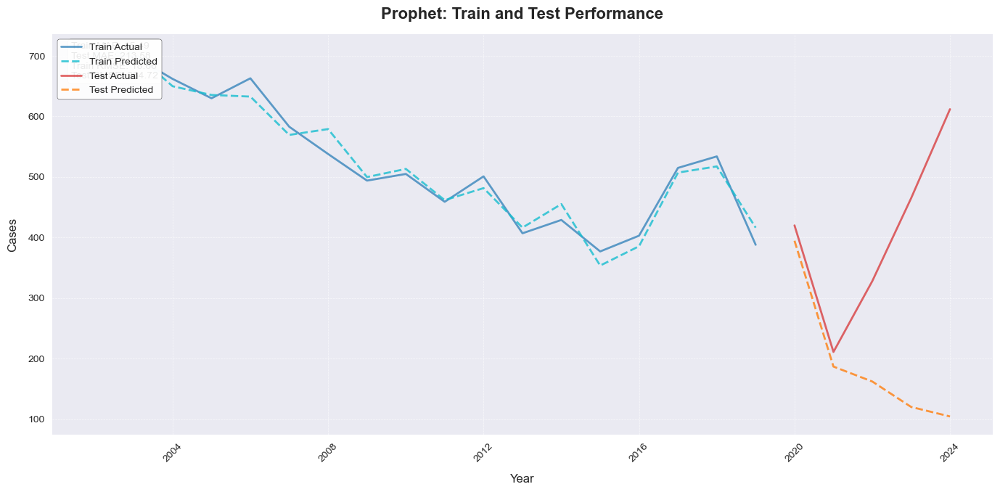

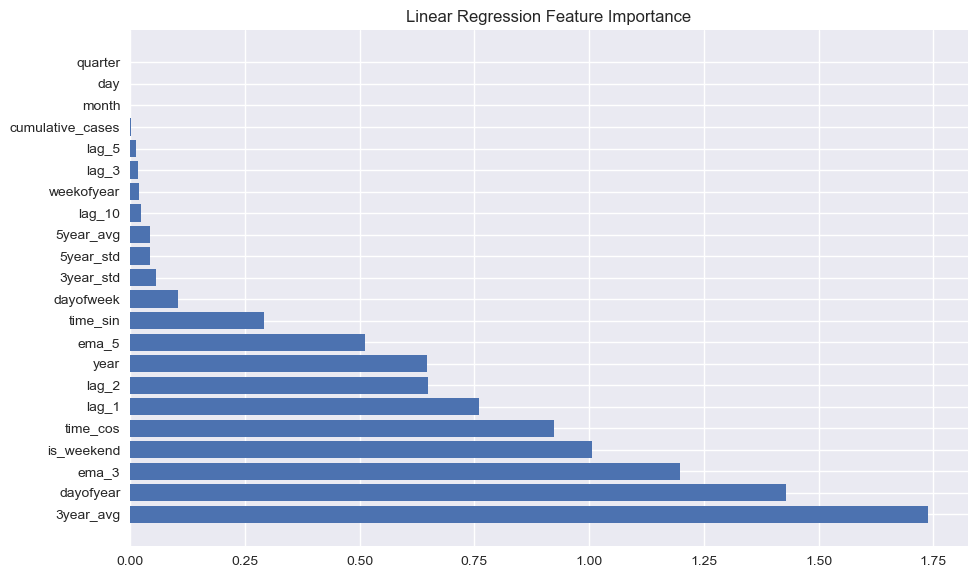


Linear Regression Evaluation:
  MAE: 26.36
  MSE: 1227.81
  RMSE: 35.04
  MAPE: 9.43%
  SMAPE: 10.88%
  R2: 0.93
Linear Regression - Train MAE: 0.00, Test MAE: 26.36
Linear Regression - Train RMSE: 0.00, Test RMSE: 35.04


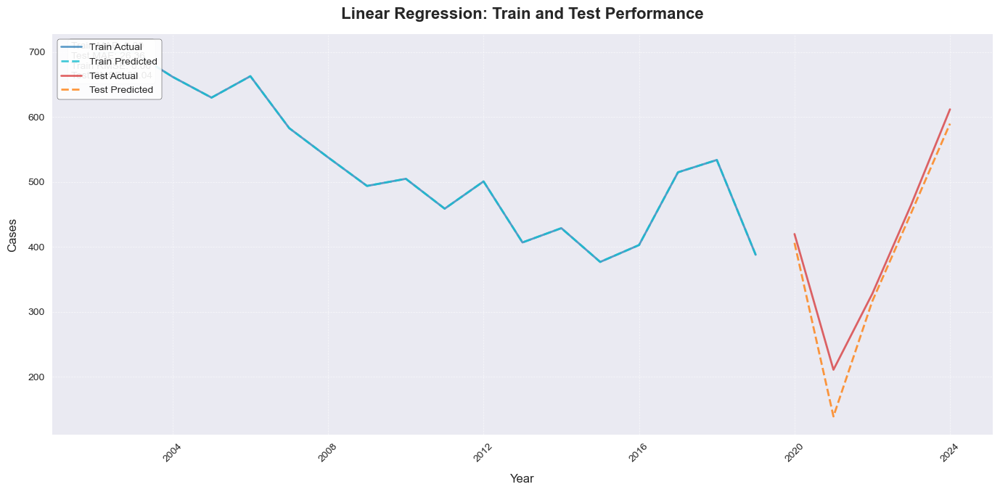

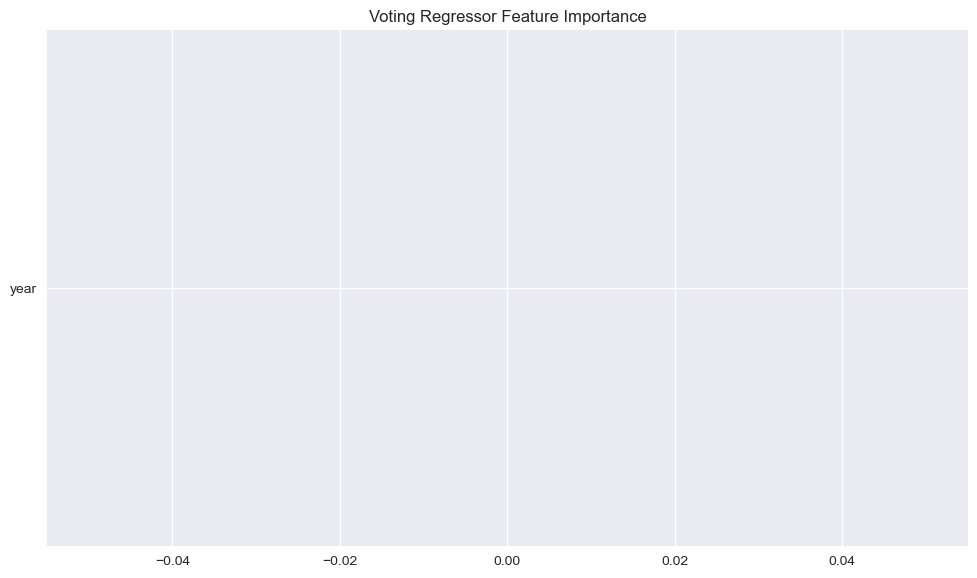


Voting Regressor Evaluation:
  MAE: 10.07
  MSE: 202.90
  RMSE: 14.24
  MAPE: 3.86%
  SMAPE: 4.06%
  R2: 0.99
Voting Regressor - Train MAE: 0.07, Test MAE: 10.07
Voting Regressor - Train RMSE: 0.08, Test RMSE: 14.24


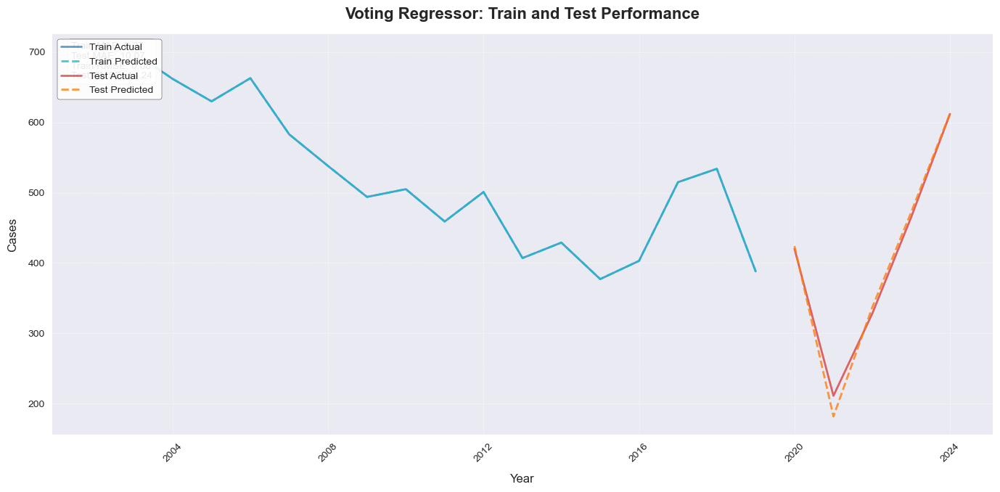

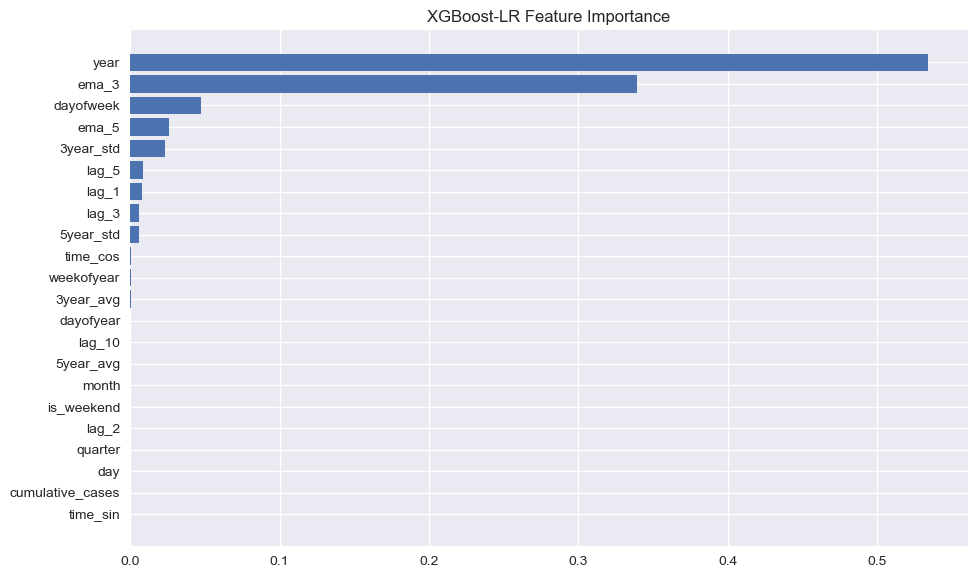


XGBoost-LR Evaluation:
  MAE: 84.13
  MSE: 12532.58
  RMSE: 111.95
  MAPE: 30.06%
  SMAPE: 22.71%
  R2: 0.31
XGBoost-LR - Train MAE: 17.80, Test MAE: 84.13
XGBoost-LR - Train RMSE: 21.95, Test RMSE: 111.95


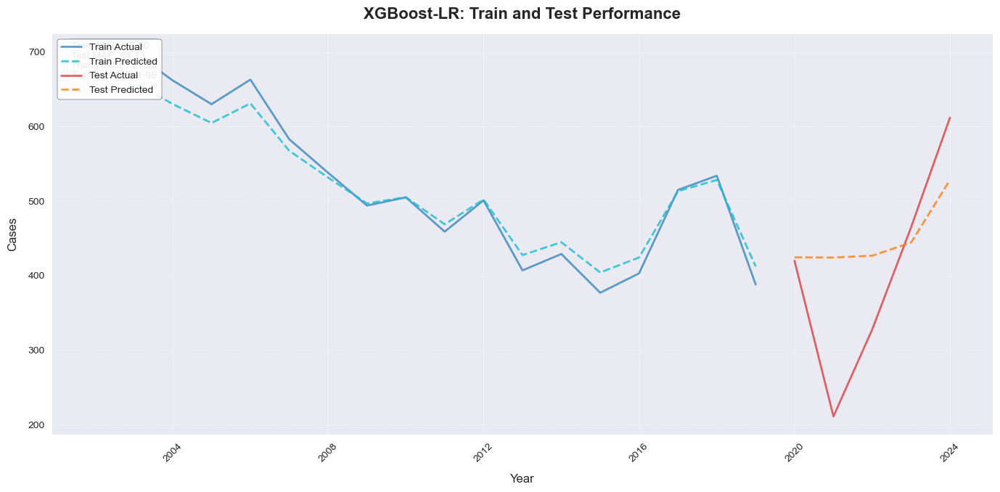

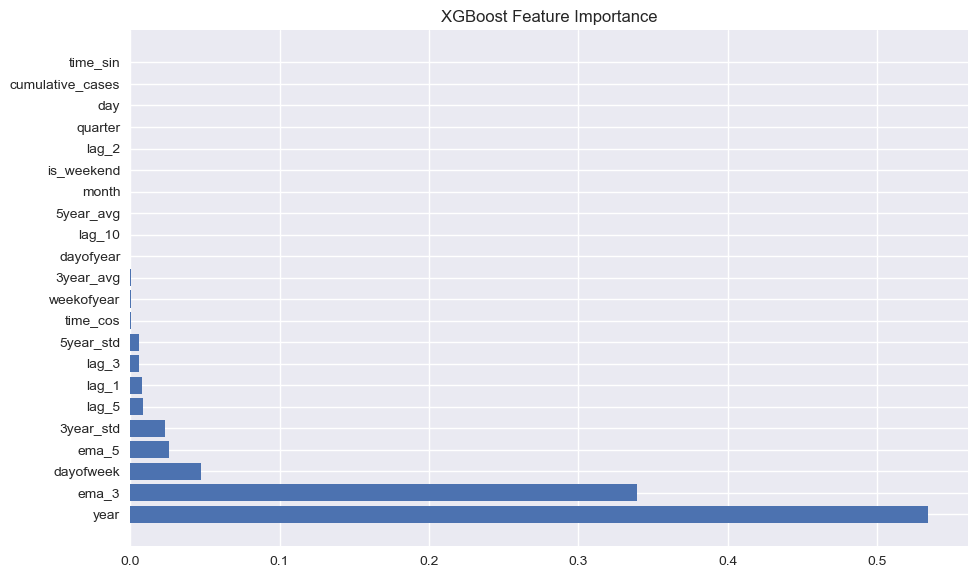


XGBoost Evaluation:
  MAE: 80.30
  MSE: 10144.65
  RMSE: 100.72
  MAPE: 27.89%
  SMAPE: 21.94%
  R2: 0.44
XGBoost - Train MAE: 0.17, Test MAE: 80.30
XGBoost - Train RMSE: 0.26, Test RMSE: 100.72


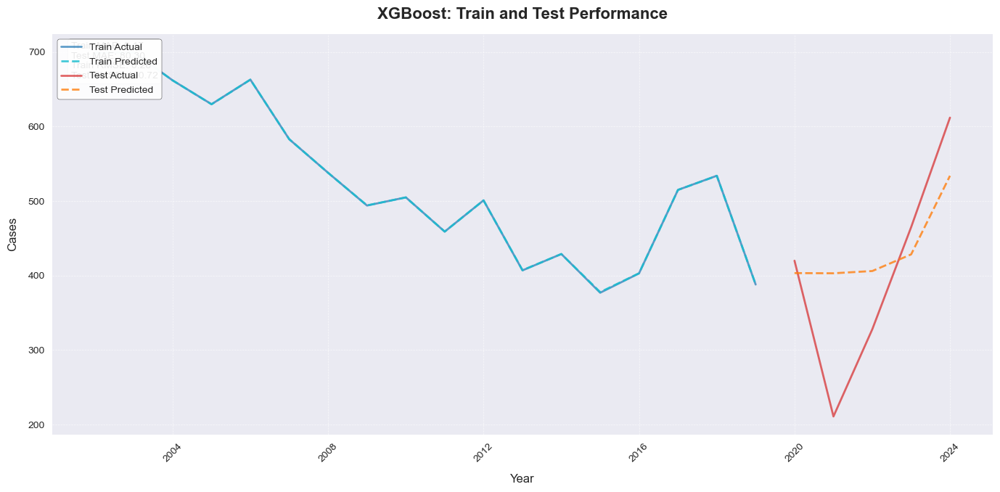

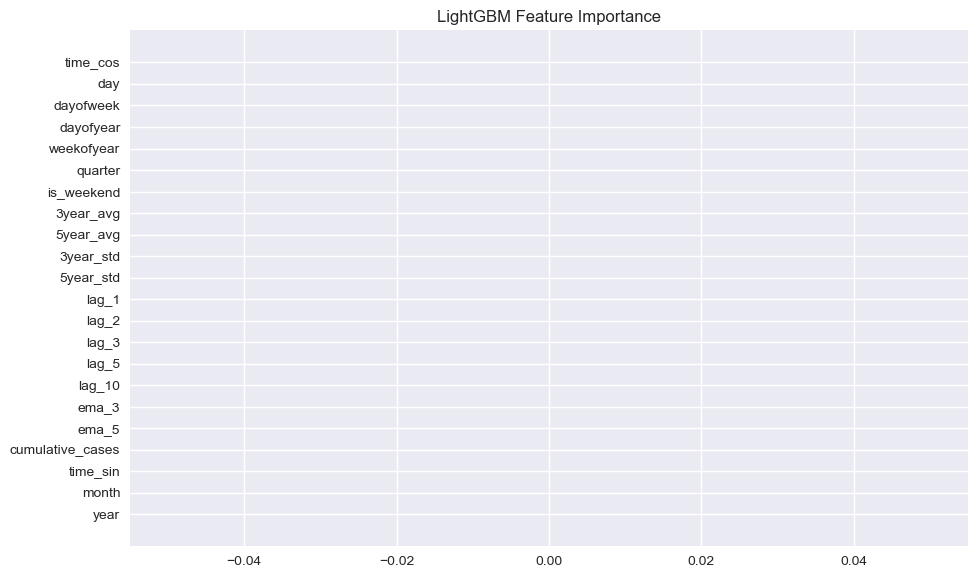


LightGBM Evaluation:
  MAE: 153.83
  MSE: 32405.38
  RMSE: 180.01
  MAPE: 52.64%
  SMAPE: 36.45%
  R2: -0.80
LightGBM - Train MAE: 88.05, Test MAE: 153.83
LightGBM - Train RMSE: 104.96, Test RMSE: 180.01


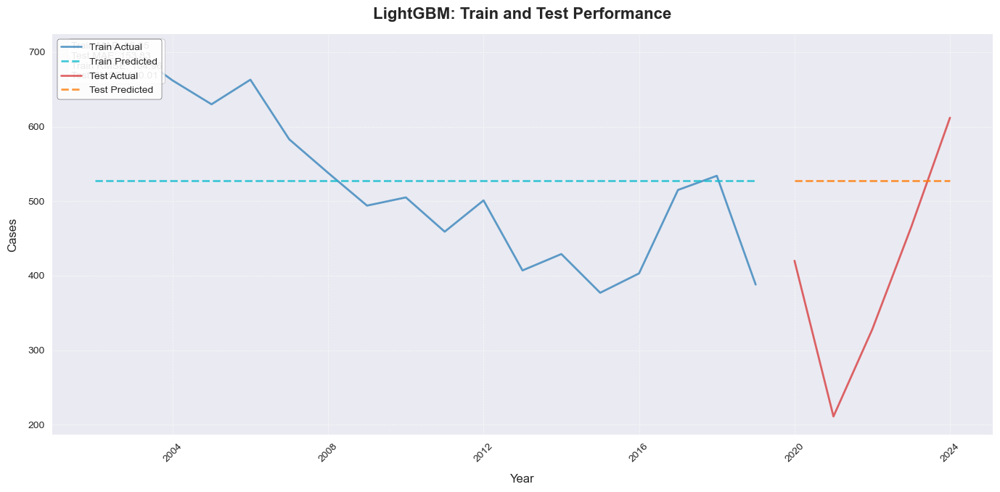

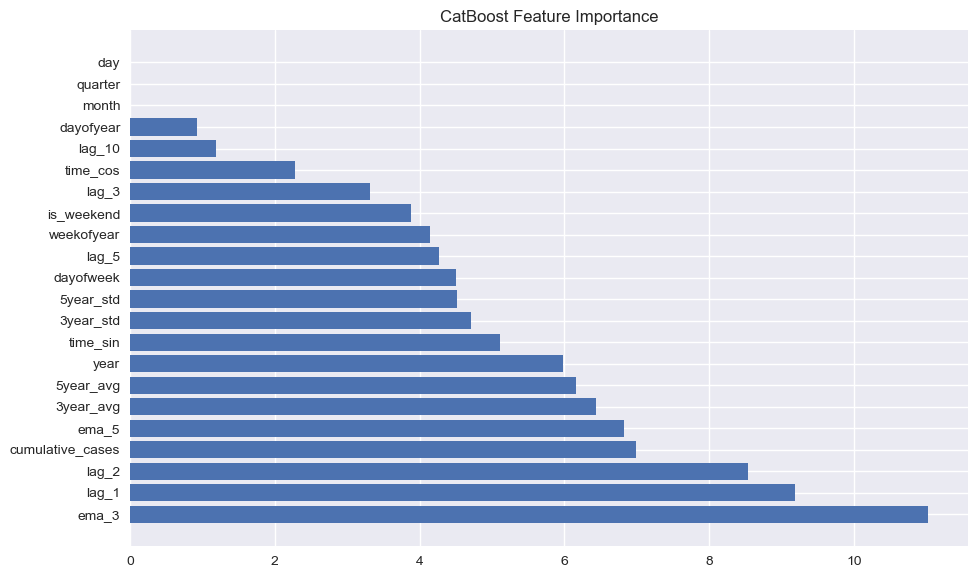


CatBoost Evaluation:
  MAE: 107.51
  MSE: 19396.34
  RMSE: 139.27
  MAPE: 38.30%
  SMAPE: 27.55%
  R2: -0.08
CatBoost - Train MAE: 2.76, Test MAE: 107.51
CatBoost - Train RMSE: 3.53, Test RMSE: 139.27


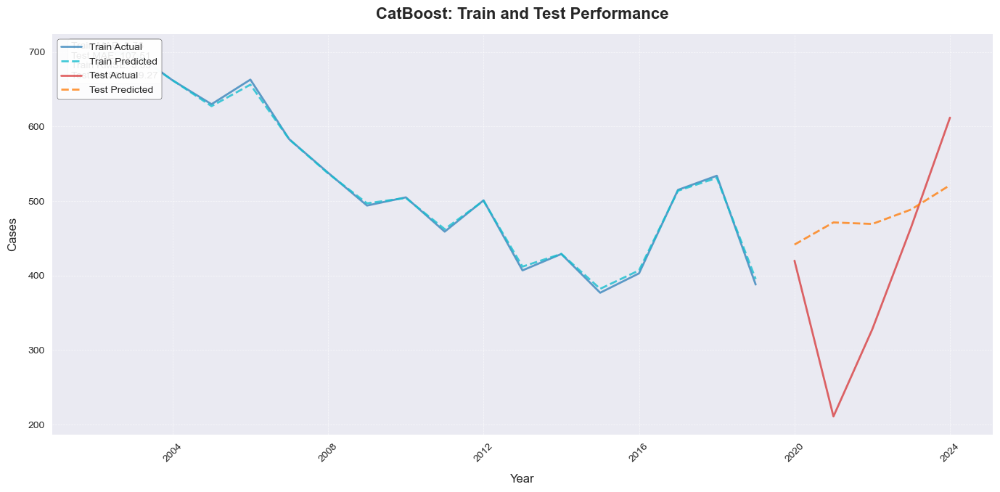

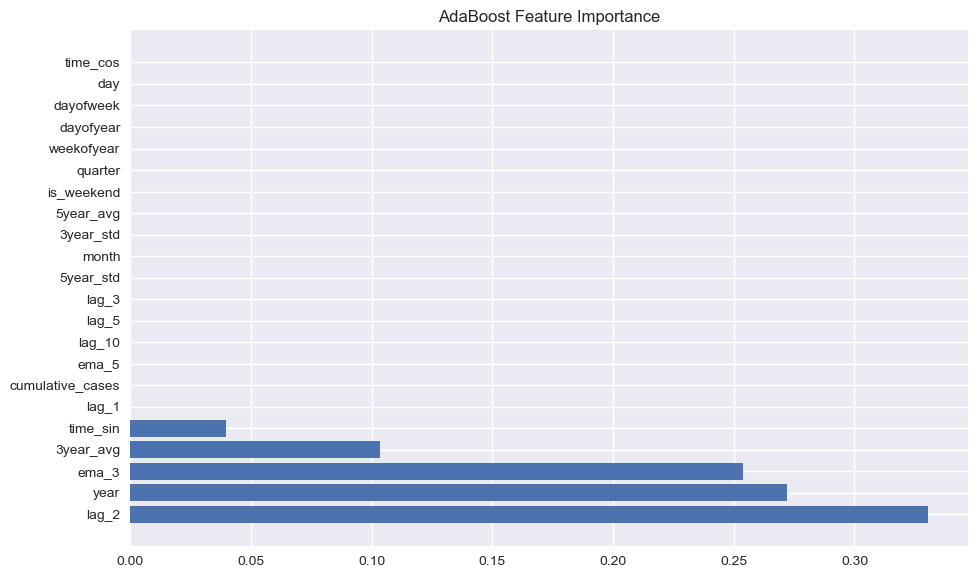


AdaBoost Evaluation:
  MAE: 109.96
  MSE: 18043.96
  RMSE: 134.33
  MAPE: 33.25%
  SMAPE: 28.26%
  R2: -0.00
AdaBoost - Train MAE: 29.28, Test MAE: 109.96
AdaBoost - Train RMSE: 38.14, Test RMSE: 134.33


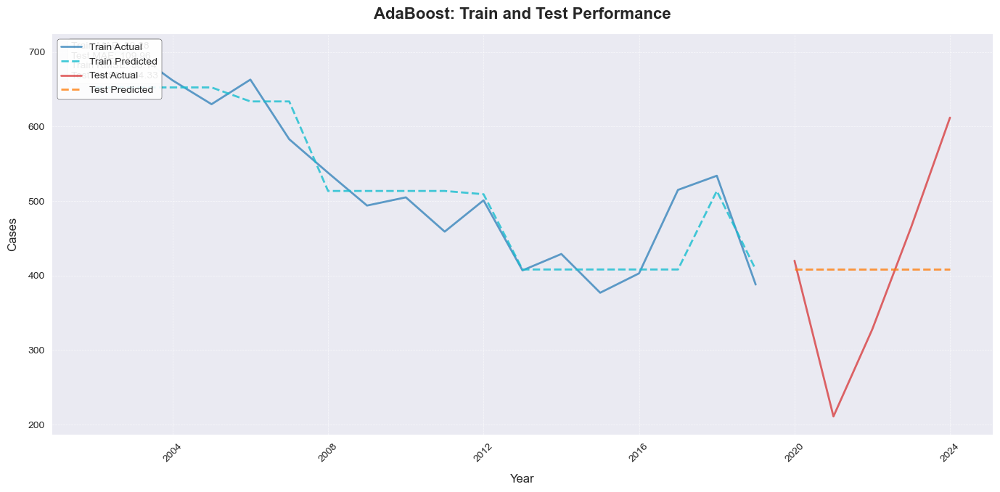


SVR Evaluation:
  MAE: 157.66
  MSE: 33981.22
  RMSE: 184.34
  MAPE: 54.00%
  SMAPE: 37.11%
  R2: -0.88
SVR - Train MAE: 6.69, Test MAE: 157.66
SVR - Train RMSE: 13.54, Test RMSE: 184.34


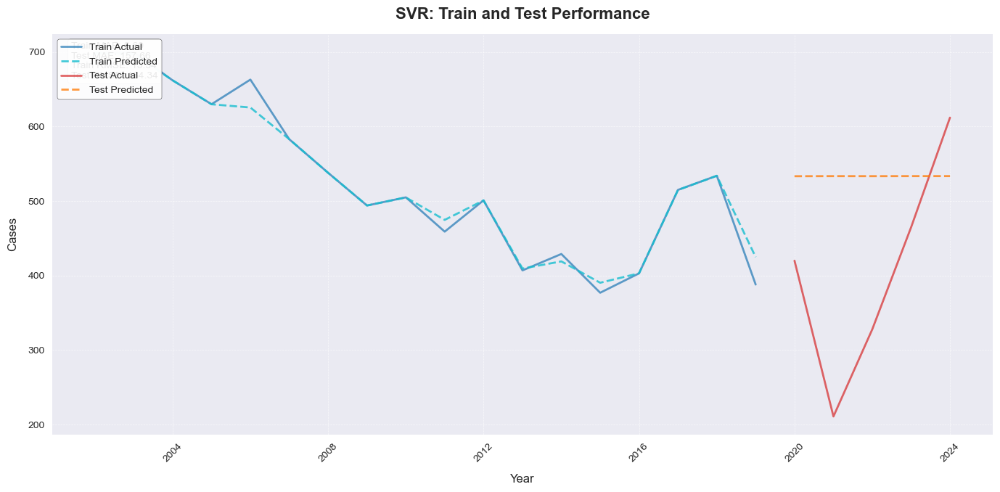


KNN Evaluation:
  MAE: 114.36
  MSE: 19896.28
  RMSE: 141.05
  MAPE: 37.36%
  SMAPE: 29.05%
  R2: -0.10
KNN - Train MAE: 29.60, Test MAE: 114.36
KNN - Train RMSE: 35.80, Test RMSE: 141.05


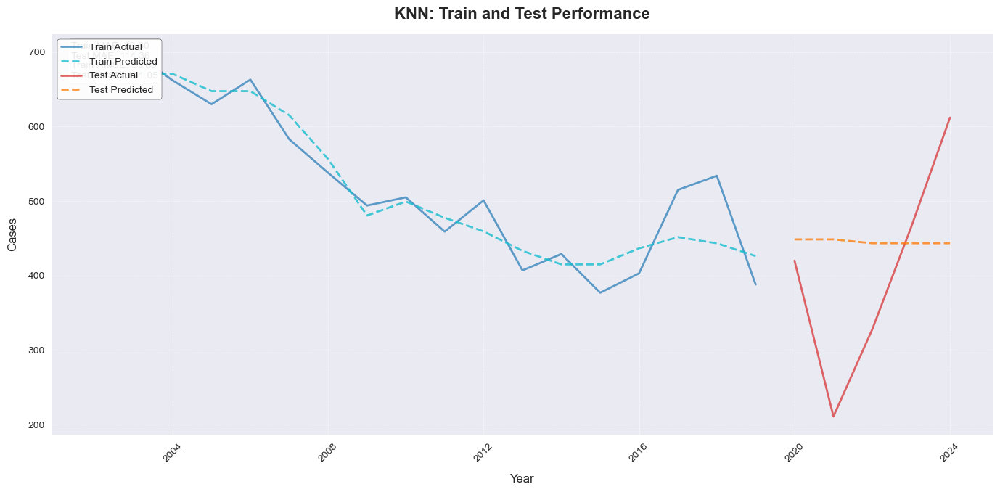

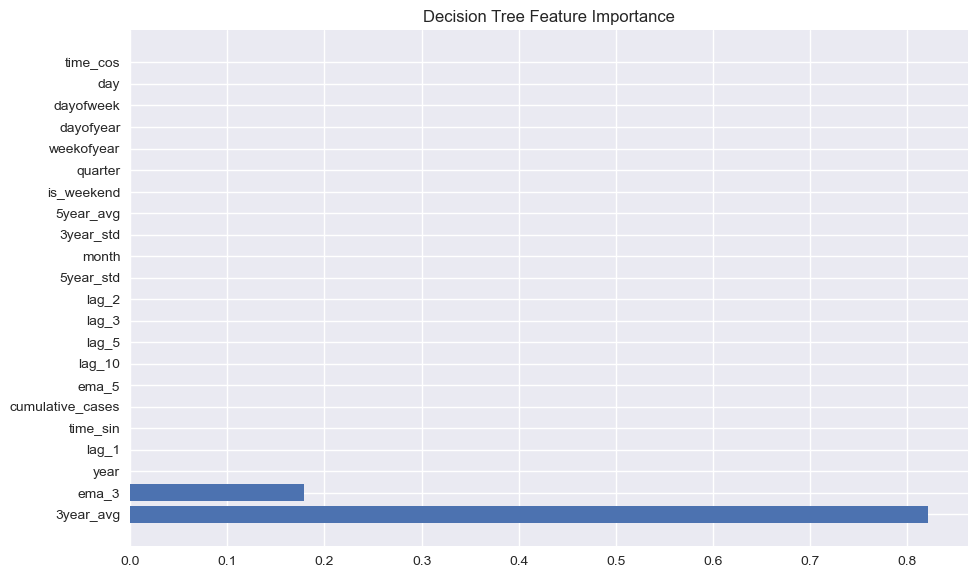


Decision Tree Evaluation:
  MAE: 90.29
  MSE: 11385.87
  RMSE: 106.70
  MAPE: 29.55%
  SMAPE: 24.08%
  R2: 0.37
Decision Tree - Train MAE: 22.57, Test MAE: 90.29
Decision Tree - Train RMSE: 29.52, Test RMSE: 106.70


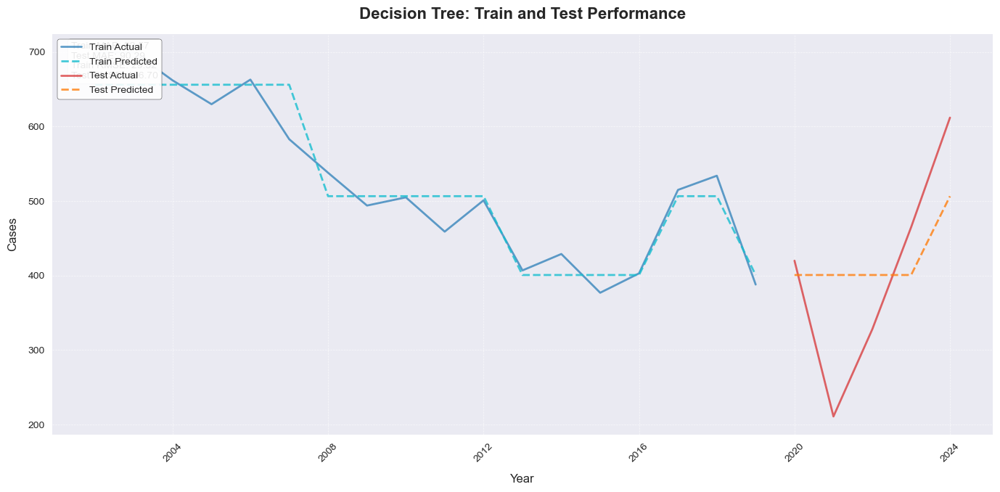

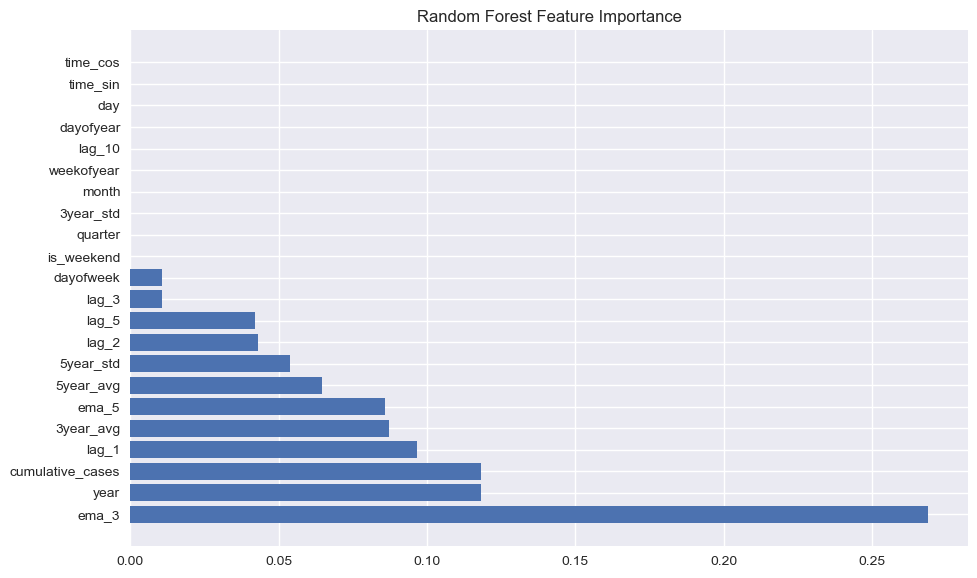


Random Forest Evaluation:
  MAE: 115.99
  MSE: 21002.34
  RMSE: 144.92
  MAPE: 40.37%
  SMAPE: 29.31%
  R2: -0.16
Random Forest - Train MAE: 43.77, Test MAE: 115.99
Random Forest - Train RMSE: 51.02, Test RMSE: 144.92


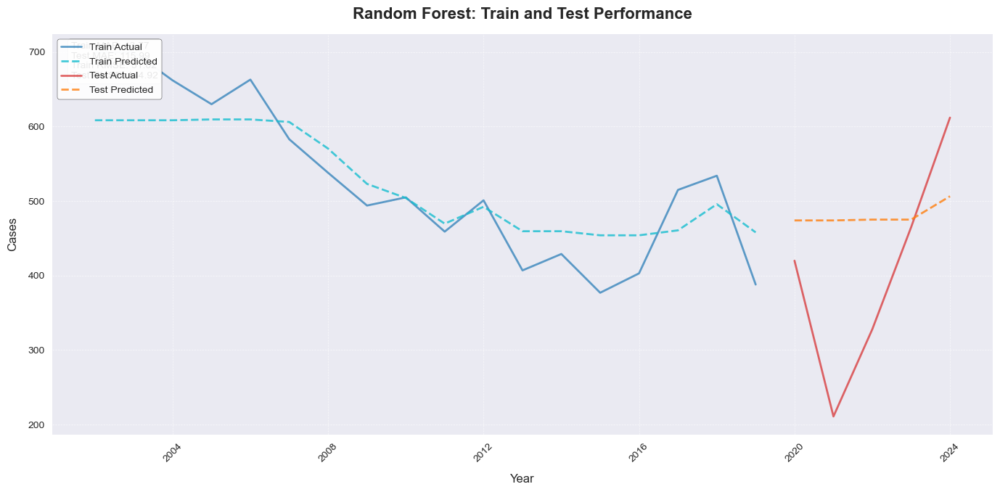

Training boosting base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining boosting base models on full training set...


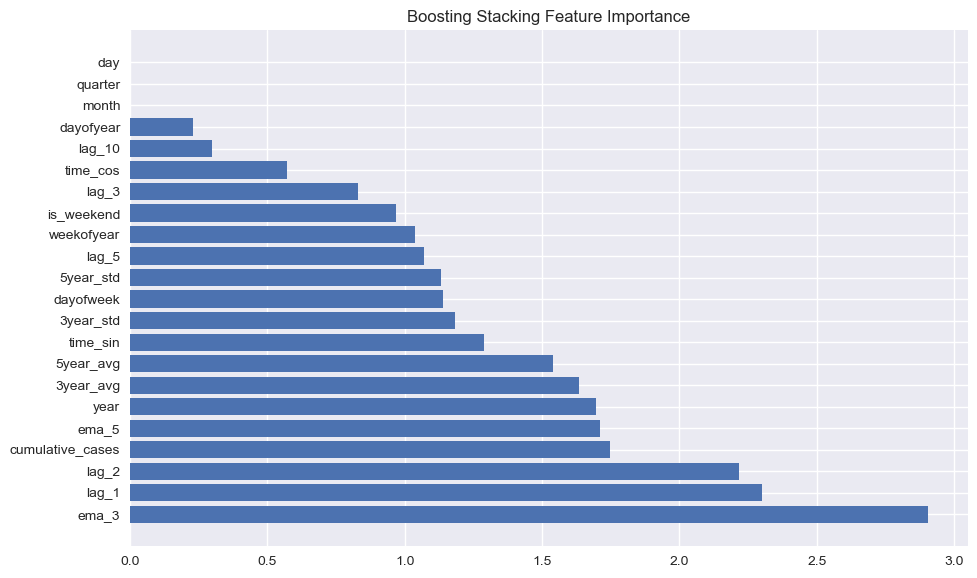


Boosting Stacking Evaluation:
  MAE: 161.36
  MSE: 40336.58
  RMSE: 200.84
  MAPE: 56.41%
  SMAPE: 36.70%
  R2: -1.24
Boosting Stacking - Train MAE: 205.38, Test MAE: 161.36
Boosting Stacking - Train RMSE: 256.98, Test RMSE: 200.84


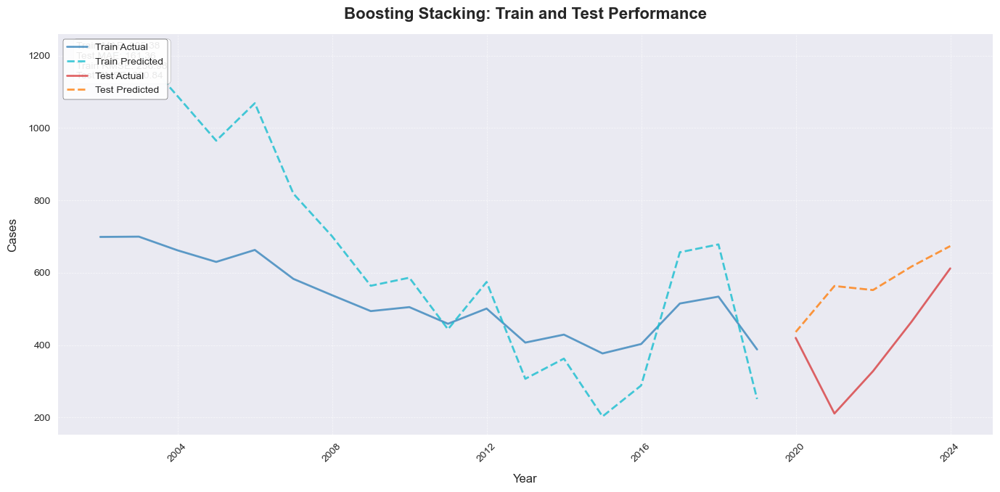

Training tree-based base models with time-series cross-validation...
Fold 1: Train size 3, Validation size 3
Fold 2: Train size 6, Validation size 3
Fold 3: Train size 9, Validation size 3
Fold 4: Train size 12, Validation size 3
Fold 5: Train size 15, Validation size 3
Retraining tree-based base models on full training set...


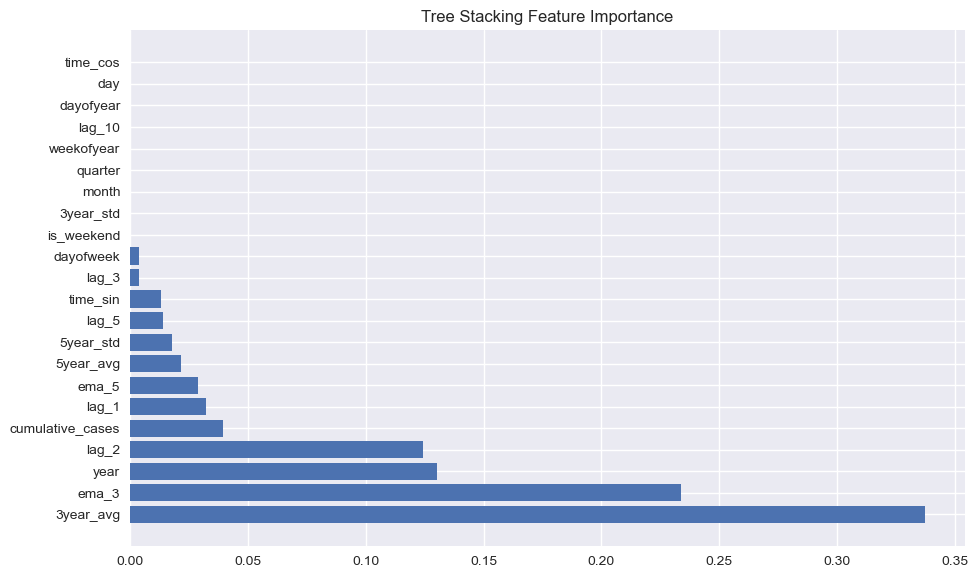


Tree Stacking Evaluation:
  MAE: 232.59
  MSE: 73453.40
  RMSE: 271.02
  MAPE: 66.36%
  SMAPE: 45.23%
  R2: -3.07
Tree Stacking - Train MAE: 114.62, Test MAE: 232.59
Tree Stacking - Train RMSE: 166.09, Test RMSE: 271.02


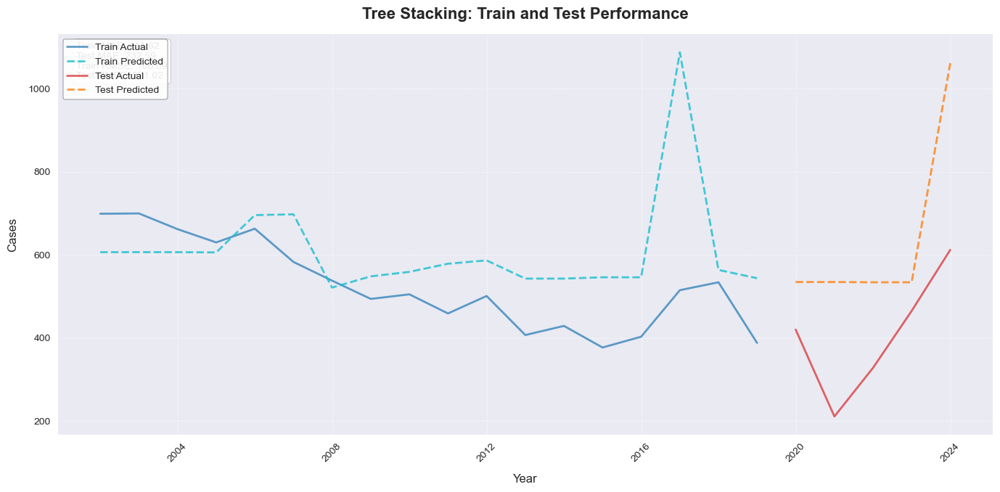

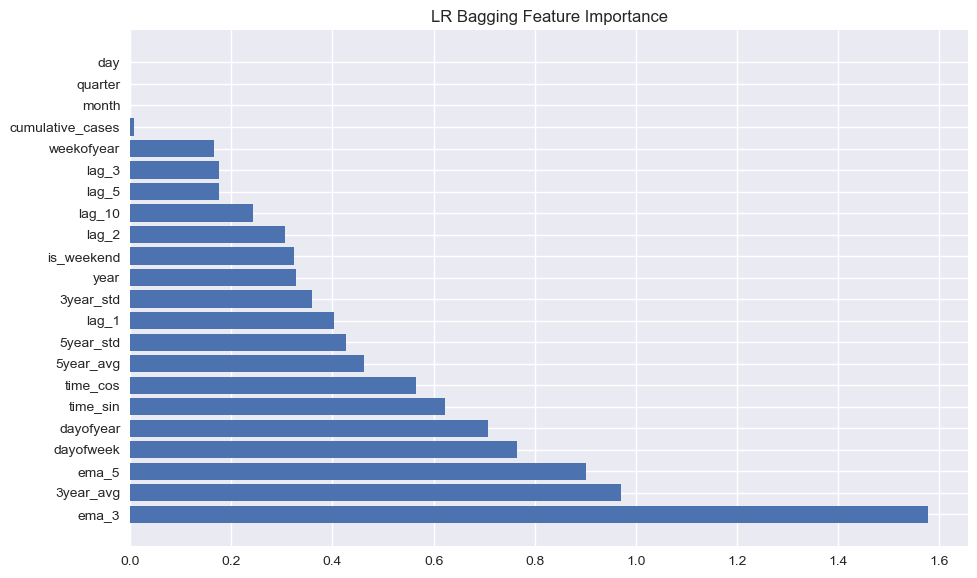


LR Bagging Evaluation:
  MAE: 63.07
  MSE: 4596.70
  RMSE: 67.80
  MAPE: 19.96%
  SMAPE: 17.43%
  R2: 0.75
LR Bagging - Train MAE: 4.33, Test MAE: 63.07
LR Bagging - Train RMSE: 7.57, Test RMSE: 67.80


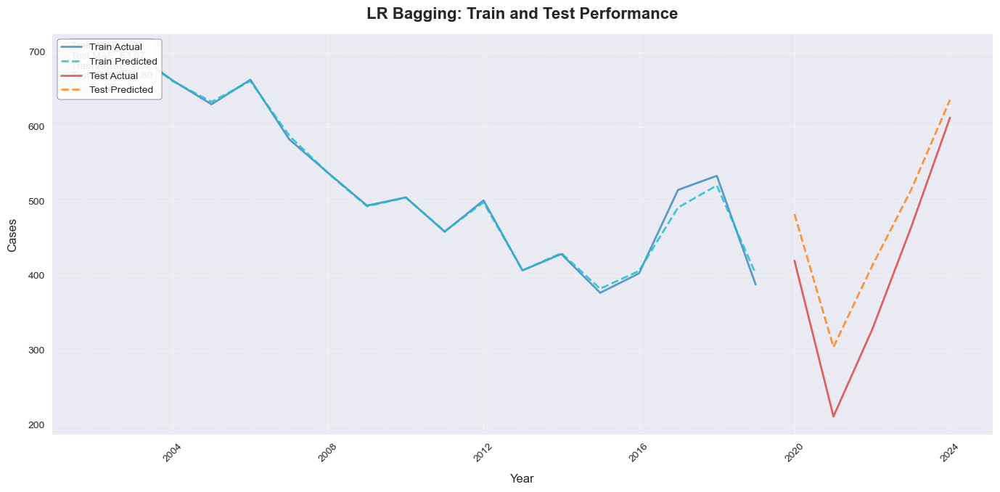

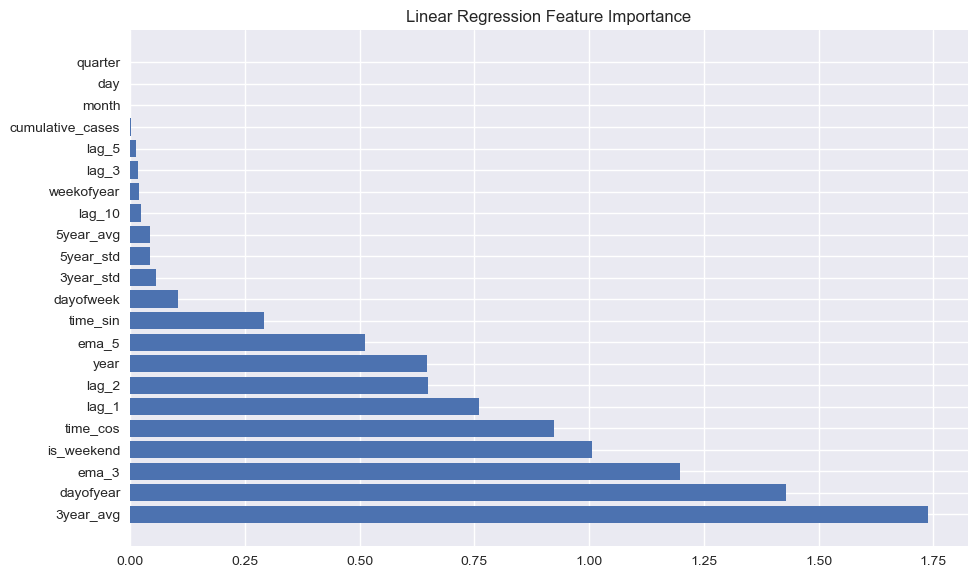

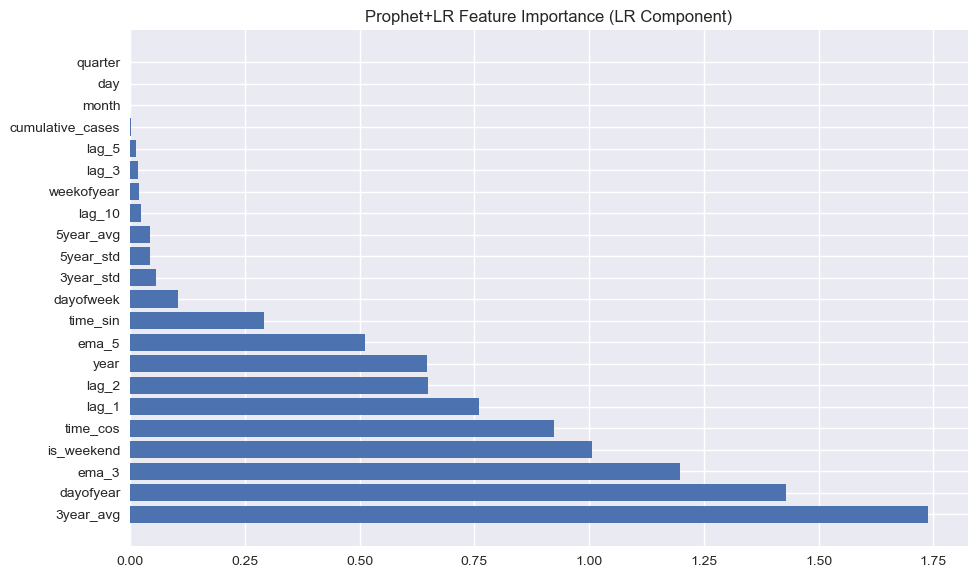


Prophet+LR Evaluation:
  MAE: 63.81
  MSE: 5281.74
  RMSE: 72.68
  MAPE: 16.55%
  SMAPE: 18.51%
  R2: 0.71
Prophet+LR - Train MAE: 3.10, Test MAE: 63.81
Prophet+LR - Train RMSE: 3.73, Test RMSE: 72.68


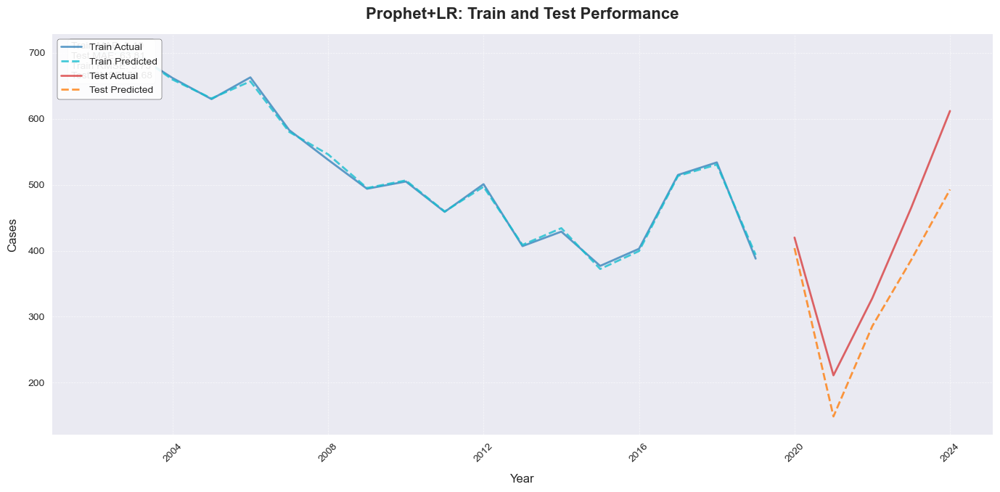


ANN Evaluation:
  MAE: 191.68
  MSE: 56137.98
  RMSE: 236.93
  MAPE: 40.74%
  SMAPE: 54.73%
  R2: -2.11
ANN - Train MAE: 217.31, Test MAE: 191.68
ANN - Train RMSE: 247.39, Test RMSE: 236.93


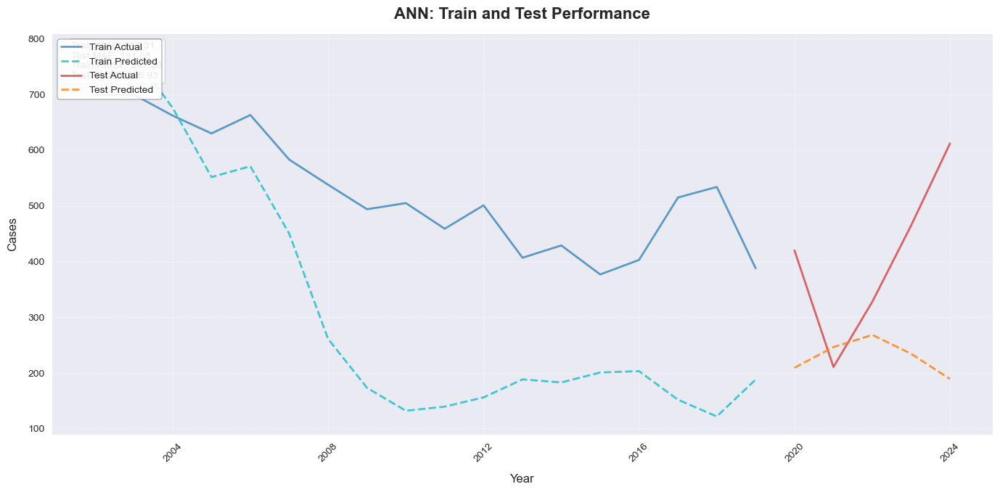

Running ACO for feature selection...
Iteration 0, Best MAE: 16.32
Iteration 10, Best MAE: 8.49
Iteration 20, Best MAE: 8.49
Iteration 30, Best MAE: 8.49
Iteration 40, Best MAE: 8.48


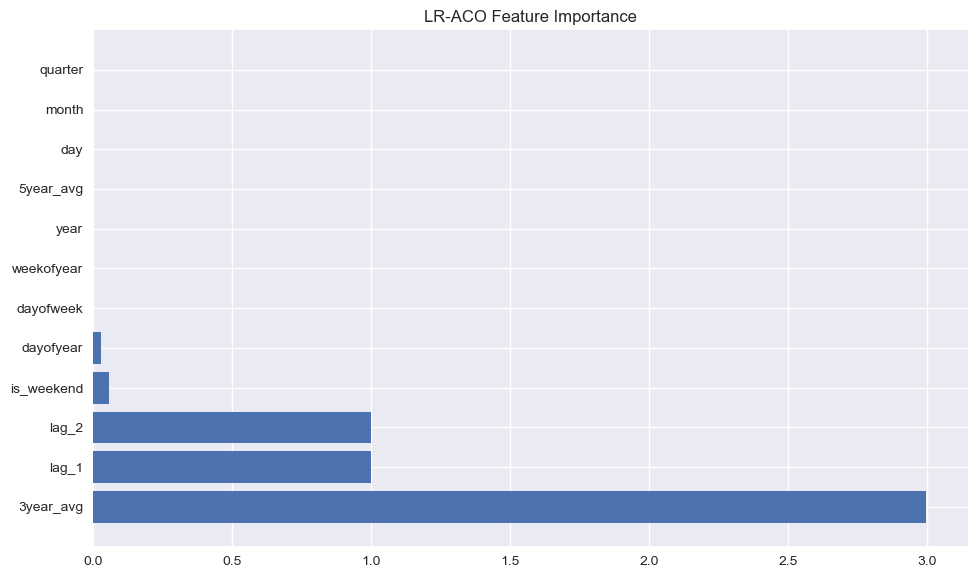


LR-ACO Evaluation:
  MAE: 20.91
  MSE: 2173.18
  RMSE: 46.62
  MAPE: 9.89%
  SMAPE: 13.13%
  R2: 0.88
LR-ACO - Train MAE: 0.04, Test MAE: 20.91
LR-ACO - Train RMSE: 0.07, Test RMSE: 46.62


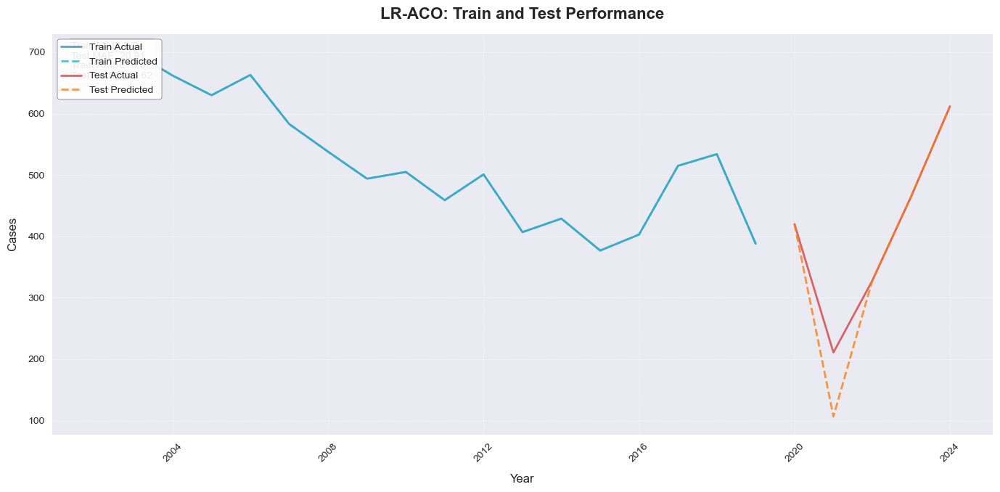

Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 19.79
Iteration 10, Best MAE: 18.59
Iteration 20, Best MAE: 18.59
Iteration 30, Best MAE: 18.59
Iteration 40, Best MAE: 18.59


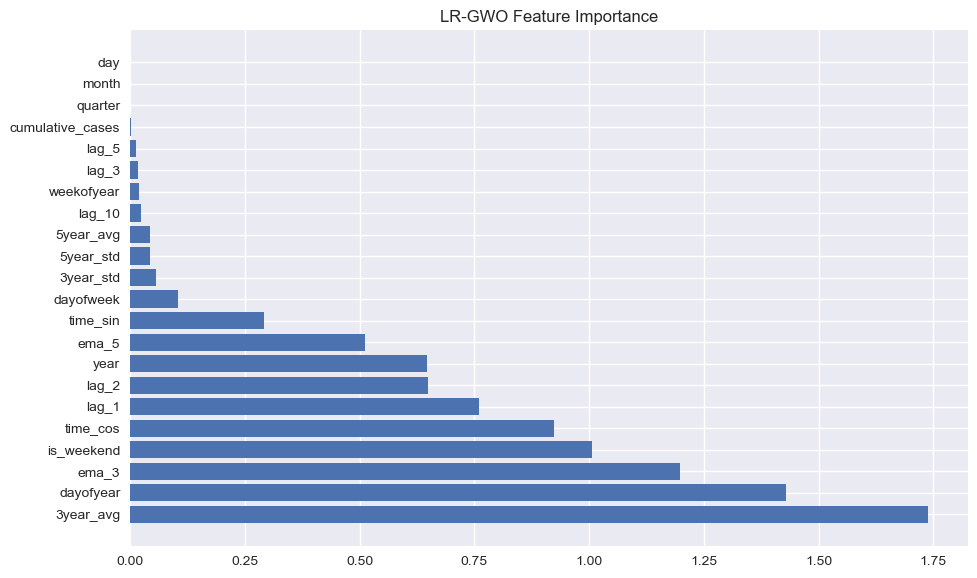


LR-GWO Evaluation:
  MAE: 26.36
  MSE: 1227.52
  RMSE: 35.04
  MAPE: 9.43%
  SMAPE: 10.88%
  R2: 0.93
LR-GWO - Train MAE: 0.00, Test MAE: 26.36
LR-GWO - Train RMSE: 0.00, Test RMSE: 35.04


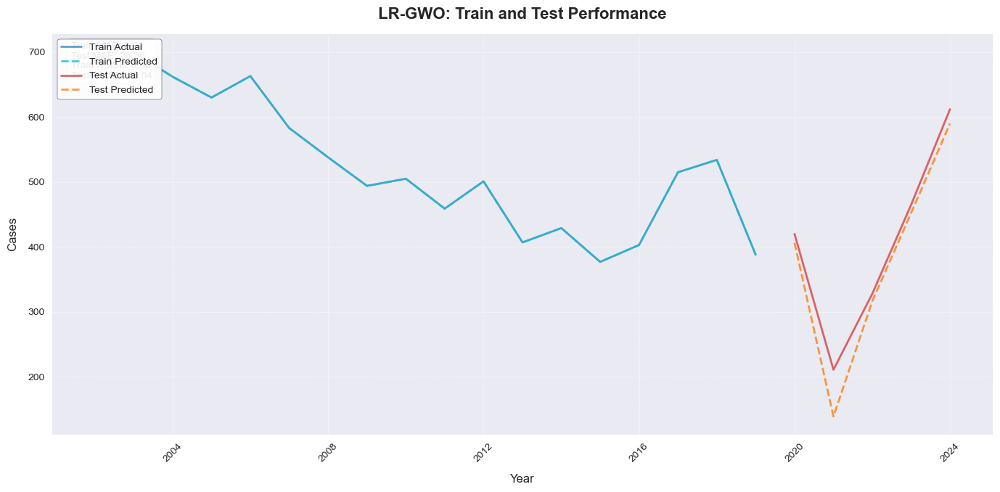

Running ACO for feature selection...
Iteration 0, Best MAE: 17.95
Iteration 10, Best MAE: 17.01
Iteration 20, Best MAE: 16.19
Iteration 30, Best MAE: 16.19
Iteration 40, Best MAE: 16.19
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 17.86
Iteration 10, Best MAE: 16.19
Iteration 20, Best MAE: 16.19
Iteration 30, Best MAE: 16.19
Iteration 40, Best MAE: 16.19


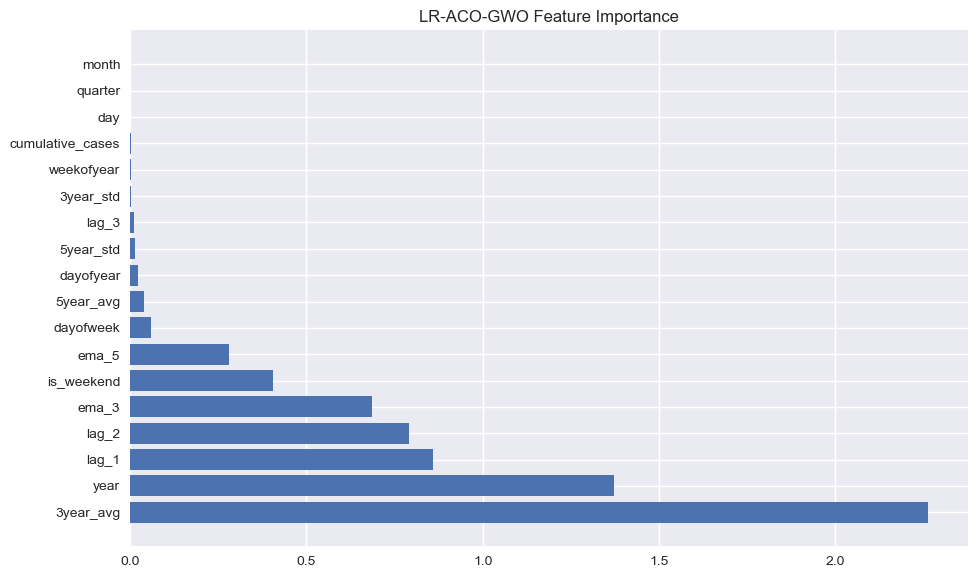


LR-ACO-GWO Evaluation:
  MAE: 31.80
  MSE: 1930.52
  RMSE: 43.94
  MAPE: 11.80%
  SMAPE: 14.31%
  R2: 0.89
LR-ACO-GWO - Train MAE: 0.03, Test MAE: 31.80
LR-ACO-GWO - Train RMSE: 0.03, Test RMSE: 43.94


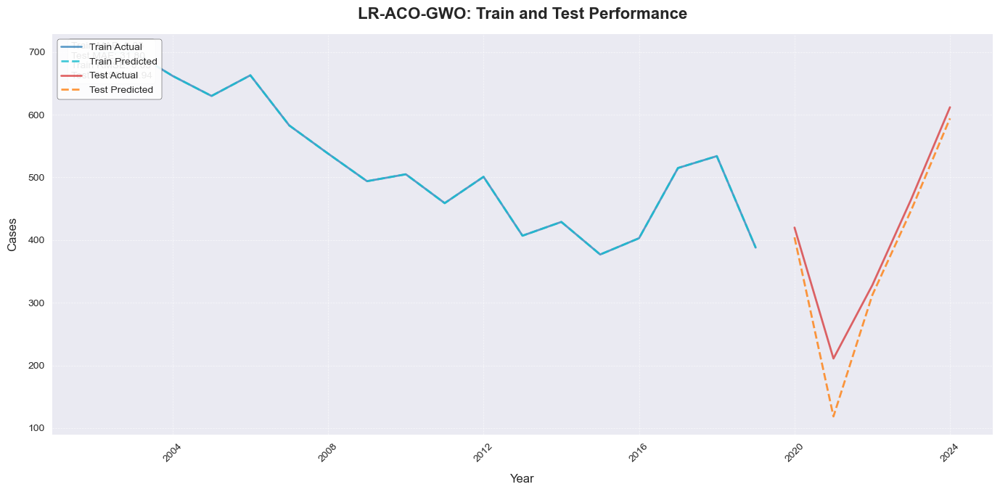

Running ACO for feature selection...
Iteration 0, Best MAE: 18.13
Iteration 10, Best MAE: 8.49
Iteration 20, Best MAE: 8.49
Iteration 30, Best MAE: 8.49
Iteration 40, Best MAE: 8.49
Selected features by ACO: ['year', 'month', 'day', 'dayofweek', 'dayofyear', 'quarter', 'weekofyear', 'is_weekend', '3year_avg', '5year_avg', 'lag_2', 'lag_1']
Running GWO for hyperparameter optimization...
Iteration 0, Best MAE: 15.76
Iteration 10, Best MAE: 11.61
Iteration 20, Best MAE: 11.61
Iteration 30, Best MAE: 11.61
Iteration 40, Best MAE: 11.61
Optimized hyperparameters: {'n_estimators': 45.828600316703394, 'max_samples': 1.0}


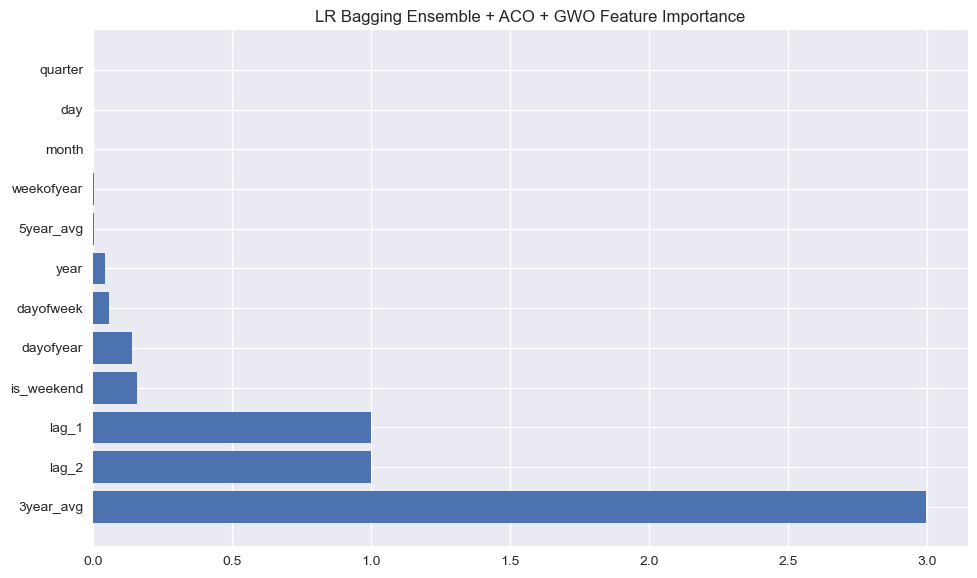


LR Bagging ACO GWO Evaluation:
  MAE: 20.83
  MSE: 2164.31
  RMSE: 46.52
  MAPE: 9.86%
  SMAPE: 13.09%
  R2: 0.88
LR Bagging ACO GWO - Train MAE: 0.07, Test MAE: 20.83
LR Bagging ACO GWO - Train RMSE: 0.09, Test RMSE: 46.52


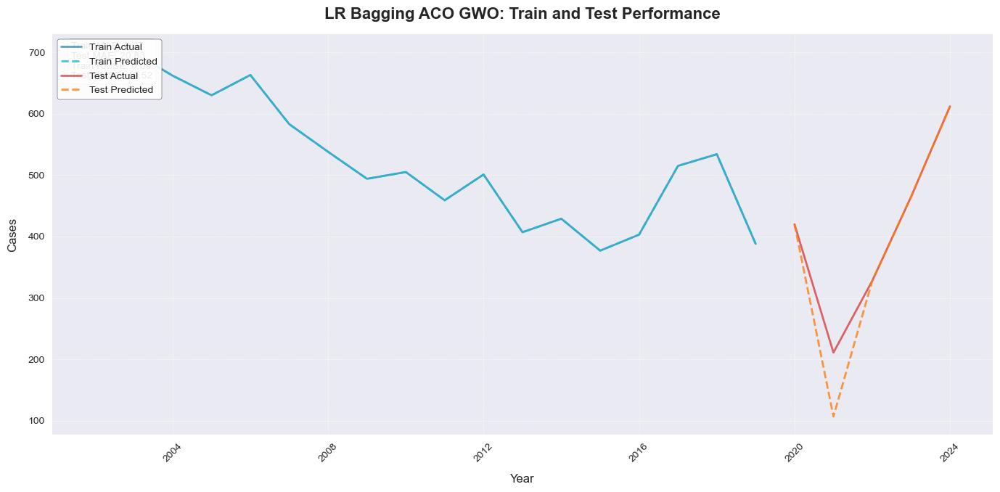


Model Performance Summary (sorted by MAE):
             Model        MAE          MSE       RMSE      MAPE     SMAPE        R2
  Voting Regressor  10.066811   202.903237  14.244411  3.860781  4.059174  0.988754
LR Bagging ACO GWO  20.826034  2164.312736  46.522175  9.864861 13.090731  0.880047
            LR-ACO  20.907200  2173.181545  46.617395  9.893439 13.134690  0.879555
            LR-GWO  26.358909  1227.517193  35.035941  9.432050 10.875971  0.931967
 Linear Regression  26.363248  1227.812851  35.040161  9.433391 10.877642  0.931951
        LR-ACO-GWO  31.801164  1930.520950  43.937694 11.795868 14.312678  0.893004
        LR Bagging  63.068352  4596.699826  67.798966 19.960720 17.432016  0.745236
        Prophet+LR  63.805920  5281.742454  72.675597 16.553840 18.508811  0.707269
           XGBoost  80.300159 10144.654240 100.720674 27.890209 21.940055  0.437750
        XGBoost-LR  84.125714 12532.581585 111.949013 30.064548 22.709430  0.305403
     Decision Tree  90.285714 11

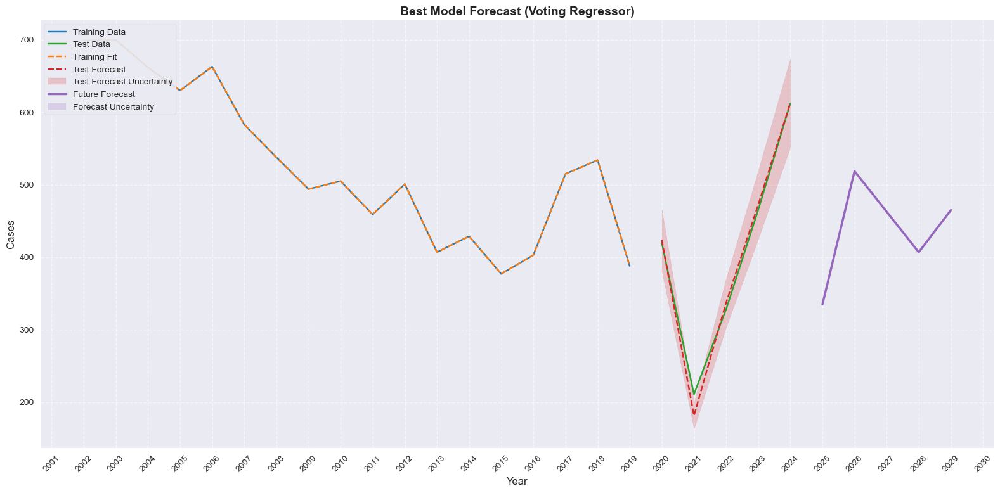

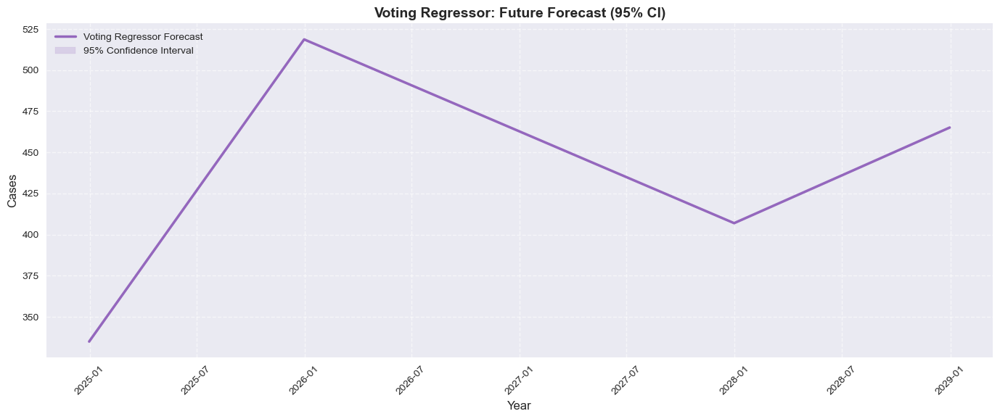


Future Forecast Ranges for Best Model (Voting Regressor) (95% CI):
  ds       yhat  yhat_lower  yhat_upper
2024 334.940598  334.517113  335.415545
2025 518.689316  518.265831  519.164263
2026 462.829725  462.406241  463.304672
2027 406.954532  406.531048  407.429479
2028 465.109011  464.685526  465.583958

Future Forecasts for All Models:

Prophet Forecast:
        ds       yhat
2024-12-31  64.871093
2025-12-31  31.525275
2026-12-31   1.740052
2027-12-31 -28.231195
2028-12-31 -62.145907

Linear Regression Forecast:
        ds       yhat
2024-12-31 239.525929
2025-12-31 523.184767
2026-12-31 455.096584
2027-12-31 321.151204
2028-12-31 469.467884

Voting Regressor Forecast:
        ds       yhat
2024-12-31 334.940598
2025-12-31 518.689316
2026-12-31 462.829725
2027-12-31 406.954532
2028-12-31 465.109011

XGBoost-LR Forecast:
        ds       yhat
2024-12-31 527.344910
2025-12-31 527.531189
2026-12-31 527.800598
2027-12-31 525.612793
2028-12-31 524.012756

XGBoost Forecast:
        ds   

In [35]:
from sklearn.ensemble import AdaBoostRegressor
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from scipy.ndimage import gaussian_filter1d
from statsmodels.tsa.seasonal import STL
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import VotingRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from datetime import timedelta
import matplotlib.dates as mdates

# Configure logging to suppress unnecessary warnings
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

# Define universal feature set for ML models (updated for annual data, removed population)
FEATURES = [
    'year', 'month', 'day', 'dayofweek', 'dayofyear', 'weekofyear', 'quarter', 'is_weekend',
    '3year_avg', '5year_avg', '3year_std', '5year_std', 'lag_1', 'lag_2', 'lag_3', 'lag_5',
    'lag_10', 'ema_3', 'ema_5', 'cumulative_cases', 'time_sin', 'time_cos'
]

# === DATA PREPROCESSING ===

def preprocess_data(df, frequency='Y', group_by_year=True):
    """Preprocess input DataFrame for annual forecasting, handling multiple rows per year."""
    try:
        if not isinstance(df, pd.DataFrame):
            raise ValueError("Input must be a pandas DataFrame")
        if 'Cases' not in df.columns:
            raise ValueError("DataFrame must contain 'Cases' column")
            
        df = df.copy()
        
        # Reset index if Year is the index
        if df.index.name == 'Year':
            df = df.reset_index()
        
        # Aggregate by year, summing cases
        agg_dict = {'Cases': 'sum'}
        
        # Ensure we have a Year column
        if 'Year' not in df.columns and df.index.name != 'Year':
            raise ValueError("Data must have either a 'Year' column or a 'Year' index")
        
        # Convert Year to datetime
        if 'Year' in df.columns:
            df['ds'] = pd.to_datetime(df['Year'], format='%Y')
        else:
            df['ds'] = pd.to_datetime(df.index, format='%Y')
            
        if group_by_year:
            df_agg = df.groupby('ds').agg(agg_dict).reset_index()
        else:
            df_agg = df.copy()
            
        df_agg = df_agg.rename(columns={'Cases': 'y'})
        df_agg.set_index('ds', inplace=True)
        
        # Handle resampling
        numeric_cols = ['y']
        df_numeric = df_agg[numeric_cols].resample(frequency).sum(numeric_only=True).fillna(0)
        df_agg = df_numeric
        
        # Smooth and transform the target variable
        df_agg['y'] = df_agg['y'].replace(0, np.nan).interpolate(method='time').fillna(method='bfill')
        df_agg['y'] = df_agg['y'].clip(lower=df_agg['y'].quantile(0.01), upper=df_agg['y'].quantile(0.99))
        df_agg['y_log'] = np.log(df_agg['y'].clip(lower=df_agg['y'].quantile(0.01)))
        df_agg = df_agg.reset_index()

        return df_agg, {}
    except Exception as e:
        print(f"Error in preprocess_data: {e}")
        raise

def add_features(df, encoders=None, is_future=False, base_df=None):
    """Add time-series features to DataFrame for annual forecasting."""
    try:
        df = df.copy()
        if 'ds' not in df.columns:
            raise ValueError("DataFrame must contain 'ds' column with dates")
            
        df['ds'] = pd.to_datetime(df['ds'])
        
        # Extract year and basic time features
        df['year'] = df['ds'].dt.year
        df['month'] = df['ds'].dt.month
        df['day'] = df['ds'].dt.day
        df['dayofweek'] = df['ds'].dt.dayofweek
        df['dayofyear'] = df['ds'].dt.dayofyear
        df['weekofyear'] = df['ds'].dt.isocalendar().week
        df['quarter'] = df['ds'].dt.quarter
        df['is_weekend'] = df['dayofweek'].ge(5).astype(int)

        if not is_future:
            if 'y' not in df.columns:
                raise ValueError("Historical data must contain 'y' column")
                
            df.set_index('ds', inplace=True)
            
            # Annual rolling statistics
            for window in [3, 5]:
                df[f'{window}year_avg'] = df['y'].rolling(window, min_periods=1).mean().fillna(method='bfill')
                df[f'{window}year_std'] = df['y'].rolling(window, min_periods=1).std().fillna(method='bfill')
            
            # Annual lags
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                df[f'lag_{lag}'] = df['y'].shift(lag).fillna(method='bfill')
                
            # Exponential moving averages
            df['ema_3'] = df['y'].ewm(span=3, adjust=False).mean().fillna(method='bfill')
            df['ema_5'] = df['y'].ewm(span=5, adjust=False).mean().fillna(method='bfill')
            
            # Cumulative cases
            df['cumulative_cases'] = df['y'].cumsum().fillna(method='bfill')
            
            # Time-based cyclical features
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)
            
            df = df.reset_index()
        else:
            if base_df is None:
                raise ValueError("base_df must be provided for future forecasting")
            
            # Use historical data to populate features for future forecasts
            lags = [1, 2, 3, 5, 10]
            latest_values = base_df.tail(max(lags)).copy()
            y_values = latest_values['y'].values if 'y' in latest_values.columns else np.zeros(len(latest_values))
            
            for window in [3, 5]:
                df[f'{window}year_avg'] = base_df[f'{window}year_avg'].iloc[-window:].mean()
                df[f'{window}year_std'] = base_df[f'{window}year_std'].iloc[-window:].mean()
            
            for lag in lags:
                if len(y_values) >= lag:
                    df[f'lag_{lag}'] = y_values[-lag]
                else:
                    df[f'lag_{lag}'] = y_values[-1] if len(y_values) > 0 else 0
            
            df['ema_3'] = base_df['ema_3'].iloc[-1] if 'ema_3' in base_df.columns else 0
            df['ema_5'] = base_df['ema_5'].iloc[-1] if 'ema_5' in base_df.columns else 0
            df['cumulative_cases'] = base_df['cumulative_cases'].iloc[-1] if 'cumulative_cases' in base_df.columns else 0
            df['time_sin'] = np.sin(2 * np.pi * df['year'] / 10)
            df['time_cos'] = np.cos(2 * np.pi * df['year'] / 10)

        # Ensure all features exist, fill missing ones with reasonable defaults
        for feature in FEATURES:
            if feature not in df.columns:
                if 'lag_' in feature:
                    df[feature] = 0  # Default for lags
                elif 'avg' in feature or 'std' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                elif 'ema' in feature:
                    df[feature] = df['y'].mean() if 'y' in df.columns else 0
                else:
                    df[feature] = 0
                
        # Final check for missing values
        df[FEATURES] = df[FEATURES].fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        return df
    except Exception as e:
        print(f"Detailed error in add_features: {str(e)}")
        if 'df' in locals():
            print(f"DataFrame columns: {df.columns}")
            print(f"Missing features: {[f for f in FEATURES if f not in df.columns]}")
        raise

# === MODEL IMPLEMENTATIONS ===

def create_prophet_model():
    """Create and configure a Prophet model for annual forecasting."""
    model = Prophet(
        seasonality_mode='multiplicative',
        changepoint_prior_scale=0.05,
        yearly_seasonality=False,
        weekly_seasonality=False,
        daily_seasonality=False,
        changepoint_range=0.9
    )
    # Add custom seasonalities for longer cycles
    model.add_seasonality(name='decadal', period=10, fourier_order=3)
    model.add_seasonality(name='quinquennial', period=5, fourier_order=2)
    
    # Add relevant regressors
    for reg in ['3year_avg', '5year_avg']:
        model.add_regressor(reg)
    return model

def run_linear_regression(train_df, test_df, target='y'):
    """Fit and forecast using Linear Regression model."""
    try:
        if len(train_df) == 0 or len(test_df) == 0:
            raise ValueError("Empty training or test data provided")
            
        train_clean = train_df.copy()
        test_clean = test_df.copy()
        
        for feature in FEATURES:
            if feature in train_clean.columns:
                median_val = train_clean[feature].median()
                train_clean[feature] = train_clean[feature].fillna(median_val)
                test_clean[feature] = test_clean[feature].fillna(median_val)
        
        if len(train_clean) == 0:
            raise ValueError("No valid training samples after cleaning")
        if len(test_clean) == 0:
            raise ValueError("No valid test samples after cleaning")
            
        X_train = train_clean[FEATURES]
        y_train = train_clean[target]
        X_test = test_clean[FEATURES]
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
            
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Linear Regression Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Detailed error in run_linear_regression: {str(e)}")
        print(f"Train shape: {train_df.shape if isinstance(train_df, pd.DataFrame) else 'N/A'}")
        print(f"Test shape: {test_df.shape if isinstance(test_df, pd.DataFrame) else 'N/A'}")
        if 'train_clean' in locals():
            print(f"Train features after cleaning: {train_clean[FEATURES].shape if isinstance(train_clean, pd.DataFrame) else 'N/A'}")
        raise

def run_voting_regressor(train_df, test_df, target='y'):
    """Fit and forecast using Voting Regressor model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        estimators = [
            ('lr', LinearRegression()),
            ('ridge', Ridge(alpha=1.0)),
            ('lasso', Lasso(alpha=1.0))
        ]
        model = VotingRegressor(estimators=estimators, n_jobs=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, estimator in estimators:
            if hasattr(estimator, 'coef_'):
                estimator.fit(X_train, y_train)
                feature_importance += np.abs(estimator.coef_)
        feature_importance /= len([e for e in estimators if hasattr(e[1], 'coef_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Voting Regressor Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_voting_regressor: {e}")
        raise

def run_xgboost_lr(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost + Linear Regression stacked model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        # Define the base XGBoost model
        xgb_model = XGBRegressor(
            n_estimators=1000,
            learning_rate=0.01,
            max_depth=3,
            random_state=42,
            verbosity=0
        )
        
        # Define stacking model
        model = StackingRegressor(
            estimators=[('xgboost', xgb_model)],
            final_estimator=LinearRegression()
        )
        
        # Fit model
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)

        # Extract feature importances from XGBoost base model
        xgb_fitted_model = model.named_estimators_['xgboost']
        feature_importance = xgb_fitted_model.feature_importances_
        
        # Plot feature importances
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost-LR Feature Importance')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model

    except Exception as e:
        print(f"Error in run_xgboost_lr: {e}")
        raise


def run_xgboost(train_df, test_df, target='y'):
    """Fit and forecast using XGBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('XGBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_xgboost: {e}")
        raise

def run_lightgbm(train_df, test_df, target='y'):
    """Fit and forecast using LightGBM model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LightGBM Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lightgbm: {e}")
        raise

def run_catboost(train_df, test_df, target='y'):
    """Fit and forecast using CatBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.get_feature_importance()
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('CatBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_catboost: {e}")
        raise

def run_adaboost(train_df, test_df, target='y'):
    """Fit and forecast using AdaBoost model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
            n_estimators=100,
            learning_rate=0.1,
            random_state=42
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('AdaBoost Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_adaboost: {e}")
        raise

def run_svr(train_df, test_df, target='y'):
    """Fit and forecast using SVR model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = SVR(kernel='rbf', C=100, epsilon=0.1)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_svr: {e}")
        raise

def run_knn(train_df, test_df, target='y'):
    """Fit and forecast using KNN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_knn: {e}")
        raise

def run_decision_tree(train_df, test_df, target='y'):
    """Fit and forecast using Decision Tree model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Decision Tree Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_decision_tree: {e}")
        raise

def run_random_forest(train_df, test_df, target='y'):
    """Fit and forecast using Random Forest model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        train_df = train_df.copy().dropna(subset=[target] + FEATURES)
        test_df = test_df.copy().dropna(subset=FEATURES)
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] != y_train.shape[0]:
            raise ValueError(f"Inconsistent training data: X_train has {X_train.shape[0]} samples, y_train has {y_train.shape[0]} samples")
        if X_test.shape[0] == 0:
            raise ValueError("Empty test data after preprocessing")
        
        model = RandomForestRegressor(
            n_estimators=100,
            max_depth=5,
            min_samples_split=10,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Random Forest Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_random_forest: {e}")
        raise

# === NEW STACKING MODELS ===

class StackingModelWrapper:
    def __init__(self, base_models, meta_model):
        self.base_models = base_models
        self.meta_model = meta_model
        
    def predict(self, X):
        try:
            base_preds = []
            for name, model in self.base_models.items():
                base_preds.append(model.predict(X))
            stacked_X = np.column_stack(base_preds)
            return self.meta_model.predict(stacked_X)
        except Exception as e:
            print(f"Error in StackingModelWrapper predict: {e}")
            raise

def create_boosting_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with boosting models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'xgb': XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42),
            'lgbm': LGBMRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, random_state=42, verbose=-1),
            'catboost': CatBoostRegressor(n_estimators=1000, learning_rate=0.01, depth=6, random_state=42, verbose=0),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training boosting base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining boosting base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Boosting Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_boosting_stacking_model: {e}")
        raise

def create_tree_stacking_model(train_df, test_df, target='y'):
    """Create a stacking ensemble with tree-based models and Linear Regression as meta-model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        base_models = {
            'dt': DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42),
            'rf': RandomForestRegressor(
                n_estimators=100,
                max_depth=5,
                min_samples_split=10,
                min_samples_leaf=5,
                random_state=42,
                n_jobs=-1
            ),
            'adaboost': AdaBoostRegressor(
                estimator=DecisionTreeRegressor(max_depth=5, min_samples_split=10, min_samples_leaf=5),
                n_estimators=100,
                learning_rate=0.1,
                random_state=42
            )
        }
        
        tscv = TimeSeriesSplit(n_splits=5)
        oof_preds = np.zeros((len(X_train), len(base_models)))
        
        print("Training tree-based base models with time-series cross-validation...")
        for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            print(f"Fold {i+1}: Train size {len(train_idx)}, Validation size {len(val_idx)}")
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr = y_train.iloc[train_idx]
            
            for j, (name, model) in enumerate(base_models.items()):
                model.fit(X_tr, y_tr)
                oof_preds[val_idx, j] = model.predict(X_val)
        
        meta_model = LinearRegression()
        meta_model.fit(oof_preds, y_train)
        
        print("Retraining tree-based base models on full training set...")
        final_base_models = {}
        for name, model in base_models.items():
            model.fit(X_train, y_train)
            final_base_models[name] = model
        
        test_base_preds = np.column_stack([model.predict(X_test) for model in final_base_models.values()])
        predictions = meta_model.predict(test_base_preds)
        
        feature_importance = np.zeros(len(FEATURES))
        for name, model in final_base_models.items():
            if hasattr(model, 'feature_importances_'):
                feature_importance += model.feature_importances_
        feature_importance /= len([m for m in final_base_models.values() if hasattr(m, 'feature_importances_')])
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Tree Stacking Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, StackingModelWrapper(final_base_models, meta_model)
    except Exception as e:
        print(f"Error in create_tree_stacking_model: {e}")
        raise

def create_lr_bagging_ensemble(train_df, test_df, target='y'):
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=100,
            max_samples=0.8,
            max_features=0.8,
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(FEATURES))
        for estimator, features in zip(model.estimators_, model.estimators_features_):
            coefs = np.abs(estimator.coef_)
            for coef, feature_idx in zip(coefs, features):
                feature_importance[feature_idx] += coef
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in create_lr_bagging_ensemble: {e}")
        raise

def run_prophet_lr_ensemble(train_df, test_df, target='y'):
    """Create a simple averaging ensemble of Prophet and Linear Regression."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        prophet_model = create_prophet_model()
        prophet_model.fit(train_df)
        prophet_cols = ['ds', '3year_avg', '5year_avg']
        
        train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
        prophet_train_pred = prophet_model.predict(train_input)['yhat'].values
        prophet_test_pred = prophet_model.predict(test_input)['yhat'].values
        
        lr_pred, lr_model = run_linear_regression(train_df, test_df, target=target)
        lr_train_pred = lr_model.predict(train_df[FEATURES])
        
        ensemble_train_pred = 0.2 * prophet_train_pred + 0.8 * lr_train_pred
        ensemble_test_pred = 0.2 * prophet_test_pred + 0.8 * lr_pred
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(lr_model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('Prophet+LR Feature Importance (LR Component)')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return ensemble_test_pred, {'prophet': prophet_model, 'lr': lr_model}
    except Exception as e:
        print(f"Error in run_prophet_lr_ensemble: {e}")
        raise

def create_neural_network(input_dim):
    """Create and configure a feedforward ANN for time series forecasting."""
    try:
        model = Sequential([
            Dense(128, activation='relu', input_dim=input_dim),
            Dropout(0.3),
            Dense(64, activation='relu'),
            Dropout(0.3),
            Dense(32, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model
    except Exception as e:
        print(f"Error in create_neural_network: {e}")
        raise

def run_neural_network(train_df, test_df, target='y', epochs=100, batch_size=32):
    """Fit and forecast using ANN model."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model = create_neural_network(input_dim=len(FEATURES))
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        model.fit(
            X_train_scaled, y_train,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            validation_split=0.2,
            callbacks=[early_stopping]
        )
        predictions = model.predict(X_test_scaled, verbose=0).flatten()
        
        return predictions, (model, scaler)
    except Exception as e:
        print(f"Error in run_neural_network: {e}")
        raise

# === ACO for Feature Selection ===

class AntColonyOptimization:
    def __init__(self, n_ants, n_features, n_iterations=50, alpha=1.0, beta=2.0, evaporation_rate=0.5, Q=100):
        self.n_ants = n_ants
        self.n_features = n_features
        self.n_iterations = n_iterations
        self.alpha = alpha
        self.beta = beta
        self.evaporation_rate = evaporation_rate
        self.Q = Q
        self.pheromones = np.ones(n_features)
        self.best_solution = None
        self.best_score = np.inf

    def _evaluate_solution(self, selected_features, train_df, target='y'):
        try:
            if not selected_features:
                return np.inf
            selected_feature_names = [FEATURES[i] for i in selected_features]
            X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
            y_train = train_df[target].fillna(train_df[target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = LinearRegression()
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in ACO evaluation: {e}")
            return np.inf

    def _construct_solution(self):
        selected_features = []
        available_features = list(range(self.n_features))
        n_select = np.random.randint(1, self.n_features + 1)
        for _ in range(n_select):
            if not available_features:
                break
            pheromones = self.pheromones[available_features]
            heuristic = 1.0 / (1.0 + np.arange(len(available_features)))
            probabilities = (pheromones ** self.alpha) * (heuristic ** self.beta)
            probabilities /= probabilities.sum()
            selected_idx = np.random.choice(len(available_features), p=probabilities)
            selected_feature = available_features.pop(selected_idx)
            selected_features.append(selected_feature)
        return selected_features

    def _update_pheromones(self, solutions, scores):
        self.pheromones *= (1 - self.evaporation_rate)
        for solution, score in zip(solutions, scores):
            for feature_idx in solution:
                self.pheromones[feature_idx] += self.Q / score
        best_idx = np.argmin(scores)
        if scores[best_idx] < self.best_score:
            self.best_score = scores[best_idx]
            self.best_solution = solutions[best_idx]

    def optimize(self, train_df, target='y'):
        print("Running ACO for feature selection...")
        for iteration in range(self.n_iterations):
            solutions = []
            scores = []
            for _ in range(self.n_ants):
                solution = self._construct_solution()
                score = self._evaluate_solution(solution, train_df, target)
                solutions.append(solution)
                scores.append(score)
            self._update_pheromones(solutions, scores)
            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {self.best_score:.2f}")
        return self.best_solution

def run_lr_aco(train_df, test_df, target='y', n_ants=20, n_iterations=50):
    """Fit and forecast using Linear Regression with ACO feature selection."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices
    except Exception as e:
        print(f"Error in run_lr_aco: {e}")
        raise

# === Grey Wolf Optimization ===

class GreyWolfOptimization:
    def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features=None, target='y'):
        self.n_wolves = n_wolves
        self.n_iterations = n_iterations
        self.search_space = search_space
        self.train_df = train_df
        self.selected_features = selected_features
        self.target = target
        self.best_alpha = None
        self.best_score = np.inf

    def _evaluate_solution(self, params):
        try:
            selected_feature_names = [FEATURES[i] for i in self.selected_features] if self.selected_features else FEATURES
            X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
            y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
            tscv = TimeSeriesSplit(n_splits=5)
            mae_scores = []
            for train_idx, val_idx in tscv.split(X_train):
                X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                model = Ridge(alpha=params['alpha'])
                model.fit(X_tr, y_tr)
                y_pred = model.predict(X_val)
                mae = mean_absolute_error(y_val, y_pred)
                mae_scores.append(mae)
            return np.mean(mae_scores)
        except Exception as e:
            print(f"Error in GWO evaluation: {e}")
            return np.inf

    def optimize(self):
        print("Running GWO for hyperparameter optimization...")
        wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                  for key, bounds in self.search_space.items()}
        alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
        alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

        for iteration in range(self.n_iterations):
            a = 2 - iteration * (2 / self.n_iterations)
            for i in range(self.n_wolves):
                params = {key: wolves[key][i] for key in self.search_space}
                score = self._evaluate_solution(params)
                if score < alpha_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = alpha_score, alpha_pos
                    alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < beta_score:
                    delta_score, delta_pos = beta_score, beta_pos
                    beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                elif score < delta_score:
                    delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

            for key in self.search_space:
                for i in range(self.n_wolves):
                    r1, r2 = np.random.random(2)
                    A1, C1 = 2 * a * r1 - a, 2 * r2
                    D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                    X1 = alpha_pos[key] - A1 * D_alpha
                    r1, r2 = np.random.random(2)
                    A2, C2 = 2 * a * r1 - a, 2 * r2
                    D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                    X2 = beta_pos[key] - A2 * D_beta
                    r1, r2 = np.random.random(2)
                    A3, C3 = 2 * a * r1 - a, 2 * r2
                    D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                    X3 = delta_pos[key] - A3 * D_delta
                    wolves[key][i] = (X1 + X2 + X3) / 3
                    wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

            if iteration % 10 == 0:
                print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
        self.best_alpha = alpha_pos
        self.best_score = alpha_score
        return alpha_pos

def run_lr_gwo(train_df, test_df, target='y', n_wolves=20, n_iterations=50):
    """Fit and forecast using Ridge Regression with GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations, search_space=search_space,
                                  train_df=train_df, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[FEATURES].fillna(train_df[FEATURES].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[FEATURES].fillna(train_df[FEATURES].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': FEATURES,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model
    except Exception as e:
        print(f"Error in run_lr_gwo: {e}")
        raise

def run_lr_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Ridge Regression with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        
        search_space = {'alpha': [1e-6, 1e2]}
        gwo = GreyWolfOptimization(n_wolves=n_wolves, n_iterations=n_iterations_gwo, search_space=search_space,
                                  train_df=train_df, selected_features=selected_feature_indices, target=target)
        best_params = gwo.optimize()
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = Ridge(alpha=best_params['alpha'])
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': np.abs(model.coef_)
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR-ACO-GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, model, selected_feature_indices, best_params
    except Exception as e:
        print(f"Error in run_lr_aco_gwo: {e}")
        raise

def run_lr_bagging_aco_gwo(train_df, test_df, target='y', n_ants=20, n_iterations_aco=50, n_wolves=20, n_iterations_gwo=50):
    """Fit and forecast using Bagging Regressor with ACO feature selection and GWO hyperparameter optimization."""
    try:
        if train_df.empty or test_df.empty:
            raise ValueError("Empty training or test data provided")
        
        aco = AntColonyOptimization(n_ants=n_ants, n_features=len(FEATURES), n_iterations=n_iterations_aco)
        selected_feature_indices = aco.optimize(train_df, target)
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        print(f"Selected features by ACO: {selected_feature_names}")
        
        search_space = {
            'n_estimators': [10, 200],
            'max_samples': [0.5, 1.0]
        }
        
        class GreyWolfOptimizationBagging:
            def __init__(self, n_wolves, n_iterations, search_space, train_df, selected_features, target):
                self.n_wolves = n_wolves
                self.n_iterations = n_iterations
                self.search_space = search_space
                self.train_df = train_df
                self.selected_features = selected_features
                self.target = target
                self.best_alpha = None
                self.best_score = np.inf

            def _evaluate_solution(self, params):
                try:
                    selected_feature_names = [FEATURES[i] for i in self.selected_features]
                    X_train = self.train_df[selected_feature_names].fillna(self.train_df[selected_feature_names].median())
                    y_train = self.train_df[self.target].fillna(self.train_df[self.target].median())
                    tscv = TimeSeriesSplit(n_splits=5)
                    mae_scores = []
                    for train_idx, val_idx in tscv.split(X_train):
                        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
                        model = BaggingRegressor(
                            estimator=LinearRegression(),
                            n_estimators=int(params['n_estimators']),
                            max_samples=params['max_samples'],
                            bootstrap=True,
                            random_state=42,
                            n_jobs=-1
                        )
                        model.fit(X_tr, y_tr)
                        y_pred = model.predict(X_val)
                        mae = mean_absolute_error(y_val, y_pred)
                        mae_scores.append(mae)
                    return np.mean(mae_scores)
                except Exception as e:
                    print(f"Error in GWO evaluation: {e}")
                    return np.inf

            def optimize(self):
                print("Running GWO for hyperparameter optimization...")
                wolves = {key: np.random.uniform(low=bounds[0], high=bounds[1], size=self.n_wolves)
                          for key, bounds in self.search_space.items()}
                alpha_pos, beta_pos, delta_pos = {key: None for key in self.search_space}, {key: None for key in self.search_space}, {key: None for key in self.search_space}
                alpha_score, beta_score, delta_score = np.inf, np.inf, np.inf

                for iteration in range(self.n_iterations):
                    a = 2 - iteration * (2 / self.n_iterations)
                    for i in range(self.n_wolves):
                        params = {key: wolves[key][i] for key in self.search_space}
                        score = self._evaluate_solution(params)
                        if score < alpha_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = alpha_score, alpha_pos
                            alpha_score, alpha_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < beta_score:
                            delta_score, delta_pos = beta_score, beta_pos
                            beta_score, beta_pos = score, {key: wolves[key][i] for key in self.search_space}
                        elif score < delta_score:
                            delta_score, delta_pos = score, {key: wolves[key][i] for key in self.search_space}

                    for key in self.search_space:
                        for i in range(self.n_wolves):
                            r1, r2 = np.random.random(2)
                            A1, C1 = 2 * a * r1 - a, 2 * r2
                            D_alpha = abs(C1 * alpha_pos[key] - wolves[key][i])
                            X1 = alpha_pos[key] - A1 * D_alpha
                            r1, r2 = np.random.random(2)
                            A2, C2 = 2 * a * r1 - a, 2 * r2
                            D_beta = abs(C2 * beta_pos[key] - wolves[key][i])
                            X2 = beta_pos[key] - A2 * D_beta
                            r1, r2 = np.random.random(2)
                            A3, C3 = 2 * a * r1 - a, 2 * r2
                            D_delta = abs(C3 * delta_pos[key] - wolves[key][i])
                            X3 = delta_pos[key] - A3 * D_delta
                            wolves[key][i] = (X1 + X2 + X3) / 3
                            wolves[key][i] = np.clip(wolves[key][i], self.search_space[key][0], self.search_space[key][1])

                    if iteration % 10 == 0:
                        print(f"Iteration {iteration}, Best MAE: {alpha_score:.2f}")
                self.best_alpha = alpha_pos
                self.best_score = alpha_score
                return alpha_pos

        gwo = GreyWolfOptimizationBagging(
            n_wolves=n_wolves,
            n_iterations=n_iterations_gwo,
            search_space=search_space,
            train_df=train_df,
            selected_features=selected_feature_indices,
            target=target
        )
        best_params = gwo.optimize()
        print(f"Optimized hyperparameters: {best_params}")
        
        X_train = train_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        y_train = train_df[target].fillna(train_df[target].median())
        X_test = test_df[selected_feature_names].fillna(train_df[selected_feature_names].median())
        
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            raise ValueError(f"Empty data after preprocessing - X_train: {X_train.shape}, X_test: {X_test.shape}")
        
        model = BaggingRegressor(
            estimator=LinearRegression(),
            n_estimators=int(best_params['n_estimators']),
            max_samples=best_params['max_samples'],
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        
        feature_importance = np.zeros(len(selected_feature_names))
        for estimator in model.estimators_:
            feature_importance += np.abs(estimator.coef_)
        feature_importance /= len(model.estimators_)
        
        fi = pd.DataFrame({
            'feature': selected_feature_names,
            'importance': feature_importance
        }).sort_values('importance', ascending=False)
        plt.figure(figsize=(10, 6))
        plt.barh(fi['feature'], fi['importance'])
        plt.title('LR Bagging Ensemble + ACO + GWO Feature Importance')
        plt.tight_layout()
        plt.show()
        plt.close()
        
        return predictions, (model, selected_feature_indices), best_params
    except Exception as e:
        print(f"Error in run_lr_bagging_aco_gwo: {e}")
        raise

# === FORECASTING ===

def forecast_future_prophet(model, base_df, periods=5, freq='Y'):
    """Generate future annual forecasts for Prophet model."""
    try:
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        forecast = model.predict(future_df)
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        forecast['yhat_smoothed'] = gaussian_filter1d(forecast['yhat'], sigma=sigma)
        return forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'yhat_smoothed']]
    except Exception as e:
        print(f"Error in forecast_future_prophet: {e}")
        raise

def estimate_ml_uncertainty(model, X, n_bootstraps=100, random_state=42):
    try:
        np.random.seed(random_state)
        predictions = []
        for _ in range(n_bootstraps):
            # Bootstrap sampling of training data
            indices = np.random.choice(len(X), size=len(X), replace=True)
            X_sample = X.iloc[indices] if isinstance(X, pd.DataFrame) else X[indices]
            # Add random noise to features to introduce variability
            noise = np.random.normal(0, 0.1, X_sample.shape)  # Adjust noise scale as needed
            X_sample_noisy = X_sample + noise if not isinstance(X, pd.DataFrame) else X_sample + noise
            pred = model.predict(X_sample_noisy)
            predictions.append(pred)
        
        predictions = np.array(predictions)
        # Calculate 2.5th and 97.5th percentiles for 95% confidence intervals
        yhat_lower = np.percentile(predictions, 2.5, axis=0)
        yhat_upper = np.percentile(predictions, 97.5, axis=0)
        yhat = np.mean(predictions, axis=0)
        return yhat, yhat_lower, yhat_upper
    except Exception as e:
        print(f"Error in estimate_ml_uncertainty: {e}")
        return np.array([]), np.array([]), np.array([])

def forecast_future_ml(model, base_df, periods=5, freq='Y'):
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(
            start=last_date + pd.DateOffset(years=1), 
            periods=periods, 
            freq=freq
        )
        future_df = pd.DataFrame({'ds': future_dates, 'is_future': True})
        hist_df = base_df.copy()
        hist_df['is_future'] = False
        full_df = pd.concat([hist_df, future_df], ignore_index=True)
        full_df = add_features(full_df, is_future=True, base_df=base_df)
        future_df = full_df[full_df['is_future']].copy()
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, row)
            if len(yhat) == 0:  # Fallback to single prediction if bootstrap fails
                yhat = model.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model.predict(base_df[FEATURES])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            
            # Update lags with noisy predictions to propagate uncertainty
            lags = [1, 2, 3, 5, 10]
            for lag in lags:
                if i + lag < len(future_df):
                    noise = np.random.normal(0, residual_std / 2) if 'residual_std' in locals() else 0
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0] + noise
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_ml: {e}")
        raise

def forecast_future_voting_regressor(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Voting Regressor model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_voting_regressor: {e}")
        raise

def forecast_future_xgboost_lr(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for XGBoost with Linear Regression model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_xgboost_lr: {e}")
        raise

def forecast_future_adaboost(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for AdaBoost model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_adaboost: {e}")
        raise

def forecast_future_svr(model_tuple, base_df, periods=5, freq='Y'):
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            yhat = model.predict(row)[0]
            # Bootstrap predictions for uncertainty
            bootstrap_preds = []
            for _ in range(100):
                noise = np.random.normal(0, 0.1, row.shape)
                noisy_row = row + noise
                bootstrap_preds.append(model.predict(noisy_row)[0])
            yhat_lower = np.percentile(bootstrap_preds, 2.5)  # 95% CI
            yhat_upper = np.percentile(bootstrap_preds, 97.5)  # 95% CI
            future_preds.append(yhat)
            future_lower.append(yhat_lower)
            future_upper.append(yhat_upper)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_svr: {e}")
        raise

def forecast_future_knn(model_tuple, base_df, periods=5, freq='Y'):
    """Generate future forecasts for KNN model with uncertainty bounds."""
    try:
        return forecast_future_svr(model_tuple, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_knn: {e}")
        raise

def forecast_future_decision_tree(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Decision Tree model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_decision_tree: {e}")
        raise

def forecast_future_random_forest(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Random Forest model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_random_forest: {e}")
        raise

def forecast_future_stacked(model_wrapper, base_df, periods=5, freq='Y'):
    try:
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][FEATURES]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model_wrapper, row)
            if len(yhat) == 0:  # Fallback to single prediction
                yhat = model_wrapper.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model_wrapper.predict(base_df[FEATURES])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0]
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_stacked: {e}")
        raise

def forecast_future_lr_aco(model, selected_feature_indices, base_df, periods=5, freq='Y'):
    try:
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            yhat, yhat_lower, yhat_upper = estimate_ml_uncertainty(model, row)
            if len(yhat) == 0:  # Fallback to single prediction
                yhat = model.predict(row)[0]
                # Use residual-based confidence intervals as fallback (95% CI)
                residuals = base_df['y'] - model.predict(base_df[selected_feature_names])
                residual_std = np.std(residuals) if len(residuals) > 0 else 0.1
                yhat_lower = yhat - 1.96 * residual_std  # Approx 95% CI
                yhat_upper = yhat + 1.96 * residual_std
            future_preds.append(yhat[0])
            future_lower.append(yhat_lower[0])
            future_upper.append(yhat_upper[0])
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat[0]
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_lr_aco: {e}")
        raise

def forecast_future_lr_gwo(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for LR-GWO model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_gwo: {e}")
        raise

def forecast_future_lr_aco_gwo(model, selected_feature_indices, base_df, periods=5, freq='Y', n_bootstrap=100):
    """Generate future forecasts for LR-ACO-GWO model with 95% confidence intervals."""
    try:
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        # Define lags
        lags = [1, 2, 3, 5, 10]
        
        # Initialize arrays
        future_preds = []
        bootstrap_preds = np.zeros((periods, n_bootstrap))
        X_train = base_df[selected_feature_names].fillna(base_df[selected_feature_names].median())
        y_train = base_df['y'].fillna(base_df['y'].median())
        
        # Bootstrap models
        for b in range(n_bootstrap):
            indices = np.random.choice(len(X_train), size=len(X_train), replace=True)
            X_boot = X_train.iloc[indices]
            y_boot = y_train.iloc[indices]
            boot_model = Ridge(alpha=model.alpha)  # Use same alpha as optimized model
            boot_model.fit(X_boot, y_boot)
            
            temp_future_df = future_df.copy()
            for i in range(len(temp_future_df)):
                row = temp_future_df.iloc[i:i+1][selected_feature_names]
                pred = boot_model.predict(row)[0]
                bootstrap_preds[i, b] = pred
                for lag in lags:
                    if i + lag < len(temp_future_df) and f'lag_{lag}' in selected_feature_names:
                        temp_future_df.iloc[i + lag, temp_future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        # Main predictions
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        # Compute 95% confidence intervals
        lower_bound = np.percentile(bootstrap_preds, 2.5, axis=1)
        upper_bound = np.percentile(bootstrap_preds, 97.5, axis=1)
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': lower_bound,
            'yhat_upper': upper_bound
        })
    except Exception as e:
        print(f"Error in forecast_future_lr_aco_gwo: {e}")
        raise

def forecast_future_lr_bagging(model, base_df, periods=5, freq='Y'):
    """Generate future forecasts for Linear Regression Bagging Ensemble model."""
    try:
        return forecast_future_ml(model, base_df, periods, freq)
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging: {e}")
        raise

def forecast_future_lr_bagging_aco_gwo(model_tuple, base_df, periods=5, freq='Y', n_bootstrap=100):
    """Generate future forecasts for LR Bagging Ensemble + ACO + GWO model with 95% confidence intervals."""
    try:
        model, selected_feature_indices = model_tuple
        selected_feature_names = [FEATURES[i] for i in selected_feature_indices]
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[selected_feature_names] = future_df[selected_feature_names].fillna(method='ffill').fillna(method='bfill')
        
        # Define lags
        lags = [1, 2, 3, 5, 10]
        
        # Initialize arrays
        future_preds = []
        bootstrap_preds = np.zeros((periods, n_bootstrap))
        X_train = base_df[selected_feature_names].fillna(base_df[selected_feature_names].median())
        y_train = base_df['y'].fillna(base_df['y'].median())
        
        # Bootstrap models
        for b in range(n_bootstrap):
            indices = np.random.choice(len(X_train), size=len(X_train), replace=True)
            X_boot = X_train.iloc[indices]
            y_boot = y_train.iloc[indices]
            boot_model = BaggingRegressor(
                estimator=LinearRegression(),
                n_estimators=model.n_estimators,
                max_samples=model.max_samples,
                bootstrap=True,
                random_state=42,
                n_jobs=-1
            )
            boot_model.fit(X_boot, y_boot)
            
            temp_future_df = future_df.copy()
            for i in range(len(temp_future_df)):
                row = temp_future_df.iloc[i:i+1][selected_feature_names]
                pred = boot_model.predict(row)[0]
                bootstrap_preds[i, b] = pred
                for lag in lags:
                    if i + lag < len(temp_future_df) and f'lag_{lag}' in selected_feature_names:
                        temp_future_df.iloc[i + lag, temp_future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        # Main predictions
        for i in range(len(future_df)):
            row = future_df.iloc[i:i+1][selected_feature_names]
            pred = model.predict(row)[0]
            future_preds.append(pred)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in selected_feature_names:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = pred
        
        # Compute 95% confidence intervals
        lower_bound = np.percentile(bootstrap_preds, 2.5, axis=1)
        upper_bound = np.percentile(bootstrap_preds, 97.5, axis=1)
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': lower_bound,
            'yhat_upper': upper_bound
        })
    except Exception as e:
        print(f"Error in forecast_future_lr_bagging_aco_gwo: {e}")
        raise

def forecast_future_prophet_lr_ensemble(models, base_df, periods=5, freq='Y', n_bootstrap=100):
    """Generate future forecasts for Prophet + Linear Regression ensemble with 95% confidence intervals."""
    try:
        prophet_forecast = forecast_future_prophet(models['prophet'], base_df, periods, freq)
        prophet_yhat = prophet_forecast['yhat'].values
        prophet_lower = prophet_forecast['yhat_lower'].values
        prophet_upper = prophet_forecast['yhat_upper'].values
        
        lr_forecast = forecast_future_ml(models['lr'], base_df, periods, freq)
        lr_yhat = lr_forecast['yhat'].values
        lr_lower = lr_forecast['yhat_lower'].values
        lr_upper = lr_forecast['yhat_upper'].values
        
        ensemble_yhat = 0.2 * prophet_yhat + 0.8 * lr_yhat
        ensemble_lower = 0.2 * prophet_lower + 0.8 * lr_lower
        ensemble_upper = 0.2 * prophet_upper + 0.8 * lr_upper
        
        recent_std = base_df['y'].iloc[-5:].std()
        sigma = max(0.8, min(1.5, recent_std / 10)) if recent_std > 0 else 1.0
        smoothed_yhat = gaussian_filter1d(ensemble_yhat, sigma=sigma)
        
        return pd.DataFrame({
            'ds': prophet_forecast['ds'],
            'yhat': ensemble_yhat,
            'yhat_lower': ensemble_lower,
            'yhat_upper': ensemble_upper,
            'yhat_smoothed': smoothed_yhat
        })
    except Exception as e:
        print(f"Error in forecast_future_prophet_lr_ensemble: {e}")
        raise

def forecast_future_neural_network(model_tuple, base_df, periods=5, freq='Y'):
    try:
        model, scaler = model_tuple
        base_df = base_df.reset_index() if base_df.index.name == 'ds' else base_df
        base_df['ds'] = pd.to_datetime(base_df['ds'])
        last_date = base_df['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.DateOffset(years=1), periods=periods, freq=freq)
        future_df = pd.DataFrame({'ds': future_dates})
        future_df = add_features(future_df, is_future=True, base_df=base_df)
        future_df[FEATURES] = future_df[FEATURES].fillna(method='ffill').fillna(method='bfill')
        
        lags = [1, 2, 3, 5, 10]
        future_preds = []
        future_lower = []
        future_upper = []
        future_df_scaled = scaler.transform(future_df[FEATURES])
        
        for i in range(len(future_df)):
            row = future_df_scaled[i:i+1]
            yhat = model.predict(row, verbose=0)[0][0]
            # Monte Carlo dropout for uncertainty
            bootstrap_preds = []
            for _ in range(100):
                pred = model.predict(row, verbose=0)[0][0]
                bootstrap_preds.append(pred)
            yhat_lower = np.percentile(bootstrap_preds, 2.5)  # 95% CI
            yhat_upper = np.percentile(bootstrap_preds, 97.5)  # 95% CI
            future_preds.append(yhat)
            future_lower.append(yhat_lower)
            future_upper.append(yhat_upper)
            for lag in lags:
                if i + lag < len(future_df) and f'lag_{lag}' in FEATURES:
                    future_df.iloc[i + lag, future_df.columns.get_loc(f'lag_{lag}')] = yhat
                    future_df_scaled[i + lag] = scaler.transform(future_df.iloc[i + lag][FEATURES].values.reshape(1, -1))
        
        return pd.DataFrame({
            'ds': future_dates,
            'yhat': future_preds,
            'yhat_lower': future_lower,
            'yhat_upper': future_upper
        })
    except Exception as e:
        print(f"Error in forecast_future_neural_network: {e}")
        raise
        
# === EVALUATION AND VISUALIZATION ===

from sklearn.metrics import r2_score  # Add import for R² score

def evaluate_predictions(true, pred, label=""):
    """Calculate and print evaluation metrics for predictions, including MSE, SMAPE, and R²."""
    try:
        true = np.array(true)
        pred = np.array(pred)
        mse = mean_squared_error(true, pred)
        rmse = np.sqrt(mse)
        metrics = {
            'MAE': mean_absolute_error(true, pred),
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mean_absolute_percentage_error(true, pred) * 100,
            'SMAPE': 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred) + 1e-10)),
            'R2': r2_score(true, pred)
        }
        print(f"\n{label} Evaluation:")
        for k, v in metrics.items():
            print(f"  {k}: {v:.2f}{'%' if k in ['MAPE', 'SMAPE'] else ''}")
        return metrics
    except Exception as e:
        print(f"Error in evaluate_predictions: {e}")
        return {}

def plot_train_test_performance(model, train_df, test_df, model_name):
    """Compare training and test performance with model-specific prediction handling."""
    try:
        train_pred = None
        test_pred = None
        if model_name == "Prophet":
            prophet_cols = ['ds', '3year_avg', '5year_avg']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred = model.predict(train_input)['yhat'].values
            test_pred = model.predict(test_input)['yhat'].values
        elif model_name in ["SVR", "KNN", "ANN"]:
            actual_model, scaler = model
            train_scaled = scaler.transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_scaled = scaler.transform(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = actual_model.predict(train_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(train_scaled)
            test_pred = actual_model.predict(test_scaled, verbose=0).flatten() if model_name == "ANN" else actual_model.predict(test_scaled)
        elif model_name in ["Boosting Stacking", "Tree Stacking"]:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
        elif model_name == "Prophet+LR":
            prophet_model = model['prophet']
            lr_model = model['lr']
            prophet_cols = ['ds', '3year_avg', '5year_avg']
            train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
            train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
            test_pred_prophet = prophet_model.predict(test_input)['yhat'].values
            train_pred_lr = lr_model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred_lr = lr_model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))
            train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
            test_pred = 0.2 * test_pred_prophet + 0.8 * test_pred_lr
        elif model_name in ["LR-ACO", "LR-ACO-GWO", "LR Bagging ACO GWO"]:
            actual_model, selected_features = model
            selected_feature_names = [FEATURES[i] for i in selected_features]
            train_pred = actual_model.predict(train_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
            test_pred = actual_model.predict(test_df[selected_feature_names].fillna(train_df[selected_feature_names].median()))
        else:
            train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
            test_pred = model.predict(test_df[FEATURES].fillna(train_df[FEATURES].median()))

        train_mae = mean_absolute_error(train_df['y'], train_pred)
        test_mae = mean_absolute_error(test_df['y'], test_pred)
        train_mse = mean_squared_error(train_df['y'], train_pred)
        test_mse = mean_squared_error(test_df['y'], test_pred)
        train_rmse = np.sqrt(train_mse)
        test_rmse = np.sqrt(test_mse)
        print(f"{model_name} - Train MAE: {train_mae:.2f}, Test MAE: {test_mae:.2f}")
        print(f"{model_name} - Train RMSE: {train_rmse:.2f}, Test RMSE: {test_rmse:.2f}")

        plt.style.use('seaborn-v0_8')
        plt.figure(figsize=(14, 7), facecolor='white')

        plt.plot(train_df['ds'], train_df['y'], label='Train Actual', color='#1f77b4', linewidth=2, alpha=0.7)
        plt.plot(train_df['ds'], train_pred, label='Train Predicted', color='#17becf', linewidth=2, linestyle='--', alpha=0.8)
        plt.plot(test_df['ds'], test_df['y'], label='Test Actual', color='#d62728', linewidth=2, alpha=0.7)
        plt.plot(test_df['ds'], test_pred, label='Test Predicted', color='#ff7f0e', linewidth=2, linestyle='--', alpha=0.8)

        plt.title(f"{model_name}: Train and Test Performance", fontsize=16, fontweight='bold', pad=15)
        plt.xlabel("Year", fontsize=12, labelpad=10)
        plt.ylabel("Cases", fontsize=12, labelpad=10)
        plt.legend(loc='upper left', fontsize=10, frameon=True, facecolor='white', edgecolor='black', framealpha=0.9)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

        metrics_text = f"Train MAE: {train_mae:.2f}\nTest MAE: {test_mae:.2f}\nTrain RMSE: {train_rmse:.2f}\nTest RMSE: {test_rmse:.2f}"
        plt.text(0.02, 0.98, metrics_text, transform=plt.gca().transAxes, fontsize=10, 
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))

        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.gca().spines['left'].set_color('gray')
        plt.gca().spines['bottom'].set_color('gray')
        plt.gca().tick_params(axis='both', which='major', labelsize=10)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot train-test performance for {model_name}: {e}")

def plot_combined_forecast(train_df, test_df, train_forecast, test_forecast, future_forecast, title="Combined Forecast"):
    """Plot training data, test data, and future forecasts with yearly x-ticks and uncertainty ranges."""
    plt.figure(figsize=(16, 8))
    
    # Plot historical data
    plt.plot(train_df['ds'], train_df['y'], color='#1f77b4', linestyle='-', label='Training Data')
    plt.plot(test_df['ds'], test_df['y'], color='#2ca02c', linestyle='-', label='Test Data')
    
    # Plot model fits
    if isinstance(train_forecast, pd.DataFrame):
        plt.plot(train_forecast['ds'], train_forecast['yhat'], color='#ff7f0e', linestyle='--', label='Training Fit')
    if isinstance(test_forecast, pd.DataFrame):
        plt.plot(test_forecast['ds'], test_forecast['yhat'], color='#d62728', linestyle='--', label='Test Forecast')
        if 'yhat_lower' in test_forecast.columns and 'yhat_upper' in test_forecast.columns:
            plt.fill_between(
                test_forecast['ds'],
                test_forecast['yhat_lower'],
                test_forecast['yhat_upper'],
                color='#d62728', alpha=0.2, label='Test Forecast Uncertainty'
            )
    
    # Plot future forecast
    if isinstance(future_forecast, pd.DataFrame):
        plt.plot(future_forecast['ds'], future_forecast['yhat'], color='#9467bd', linestyle='-', linewidth=2.5, label='Future Forecast')
        if 'yhat_lower' in future_forecast.columns and 'yhat_upper' in future_forecast.columns:
            plt.fill_between(
                future_forecast['ds'],
                future_forecast['yhat_lower'],
                future_forecast['yhat_upper'],
                color='#9467bd', alpha=0.2, label='Forecast Uncertainty'
            )
    
    # Customize x-axis
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    
    # Labels and title
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Cases', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    
    # Legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if handles:
        plt.legend(frameon=True, framealpha=0.9, fontsize=10, loc='upper left')
    
    # Grid and layout
    plt.grid(True, which='major', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

def plot_best_model_forecast(future_forecast, model_name):
    """Plot future forecast for the best model with 95% confidence intervals."""
    try:
        plt.figure(figsize=(14, 6))
        plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'{model_name} Forecast', color='#9467bd', linewidth=2.5)
        # Use provided uncertainty bounds or approximate if not available
        yhat_lower = future_forecast.get('yhat_lower', future_forecast['yhat'] * 0.95)
        yhat_upper = future_forecast.get('yhat_upper', future_forecast['yhat'] * 1.05)
        plt.fill_between(future_forecast['ds'], yhat_lower, yhat_upper, color='#9467bd', alpha=0.2, label='95% Confidence Interval')
        
        plt.title(f"{model_name}: Future Forecast (95% CI)", fontsize=14, fontweight='bold')
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Cases", fontsize=12)
        plt.legend(loc='upper left', fontsize=10)
        plt.grid(True, which='major', linestyle='--', alpha=0.6)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
    except Exception as e:
        print(f"Failed to plot best model forecast for {model_name}: {e}")

# === MAIN EXECUTION ===

def main(df, periods=5, test_size=0.2, freq='Y', n_bootstrap=100):
    try:
        # Preprocess data and split into train/test
        df_processed, encoders = preprocess_data(df, frequency=freq)
        df_processed = add_features(df_processed, encoders=encoders)
        
        required_cols = ['ds', 'y', '3year_avg', '5year_avg']
        missing_cols = [col for col in required_cols if col not in df_processed.columns]
        if missing_cols:
            raise ValueError(f"Missing required columns in df_processed: {missing_cols}")
            
        split_idx = int((1 - test_size) * len(df_processed))
        train_df, test_df = df_processed.iloc[:split_idx], df_processed.iloc[split_idx:]

        train_df = add_features(train_df, encoders=encoders)
        test_df = add_features(test_df, encoders=encoders, base_df=train_df)
        
        models = {
            'Prophet': create_prophet_model(),
            'Linear Regression': LinearRegression(),
            'Voting Regressor': None,
            'XGBoost-LR': None,
            'XGBoost': None,
            'LightGBM': None,
            'CatBoost': None,
            'AdaBoost': None,
            'SVR': None,
            'KNN': None,
            'Decision Tree': None,
            'Random Forest': None,
            'Boosting Stacking': None,
            'Tree Stacking': None,
            'LR Bagging': None,
            'Prophet+LR': None,
            'ANN': None,
            'LR-ACO': None,
            'LR-GWO': None,
            'LR-ACO-GWO': None,
            'LR Bagging ACO GWO': None
        }

        predictions_dict = {}
        train_predictions_dict = {}
        models_dict = {}
        future_forecasts = {}
        metrics_dict = {}

        # Run all models
        for model_name in models:
            try:
                if model_name == 'Prophet':
                    models[model_name].fit(train_df)
                    prophet_cols = ['ds', '3year_avg', '5year_avg']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    test_input = test_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred = models[model_name].predict(train_input)['yhat'].values
                    test_forecast = models[model_name].predict(test_input)
                    test_pred = test_forecast['yhat'].values
                    predictions_dict[model_name] = test_pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = models[model_name]
                    future_forecasts[model_name] = forecast_future_prophet(models[model_name], df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], test_pred, model_name)
                    plot_train_test_performance(models[model_name], train_df, test_df, model_name)
                
                elif model_name == 'Linear Regression':
                    pred, model = run_linear_regression(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Voting Regressor':
                    pred, model = run_voting_regressor(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_voting_regressor(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost-LR':
                    pred, model = run_xgboost_lr(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_xgboost_lr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'XGBoost':
                    pred, model = run_xgboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LightGBM':
                    pred, model = run_lightgbm(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'CatBoost':
                    pred, model = run_catboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_ml(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'AdaBoost':
                    pred, model = run_adaboost(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_adaboost(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'SVR':
                    pred, model = run_svr(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_svr(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'KNN':
                    pred, model = run_knn(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled)
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_knn(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Decision Tree':
                    pred, model = run_decision_tree(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_decision_tree(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Random Forest':
                    pred, model = run_random_forest(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_random_forest(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Boosting Stacking':
                    pred, model = create_boosting_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Tree Stacking':
                    pred, model = create_tree_stacking_model(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_stacked(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging':
                    pred, model = create_lr_bagging_ensemble(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_bagging(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'Prophet+LR':
                    pred, model = run_prophet_lr_ensemble(train_df.copy(), test_df.copy())
                    prophet_model = model['prophet']
                    lr_model = model['lr']
                    prophet_cols = ['ds', '3year_avg', '5year_avg']
                    train_input = train_df[prophet_cols].copy().fillna(method='ffill').fillna(method='bfill')
                    train_pred_prophet = prophet_model.predict(train_input)['yhat'].values
                    train_pred_lr = lr_model.predict(train_df[FEATURES])
                    train_pred = 0.2 * train_pred_prophet + 0.8 * train_pred_lr
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_prophet_lr_ensemble(model, df_processed, periods, freq, n_bootstrap)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'ANN':
                    pred, model = run_neural_network(train_df.copy(), test_df.copy())
                    train_scaled = model[1].transform(train_df[FEATURES].fillna(train_df[FEATURES].median()))
                    train_pred = model[0].predict(train_scaled, verbose=0).flatten()
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecast = forecast_future_neural_network(model, df_processed, periods, freq)
                    future_forecasts[model_name] = future_forecast
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO':
                    pred, model, selected_features = run_lr_aco(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco(model, selected_features, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR-GWO':
                    pred, model = run_lr_gwo(train_df.copy(), test_df.copy())
                    train_pred = model.predict(train_df[FEATURES])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model
                    future_forecasts[model_name] = forecast_future_lr_gwo(model, df_processed, periods, freq)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model, train_df, test_df, model_name)
                
                elif model_name == 'LR-ACO-GWO':
                    pred, model, selected_features, _ = run_lr_aco_gwo(train_df.copy(), test_df.copy())
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = (model, selected_features)
                    future_forecasts[model_name] = forecast_future_lr_aco_gwo(model, selected_features, df_processed, periods, freq, n_bootstrap)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance((model, selected_features), train_df, test_df, model_name)
                
                elif model_name == 'LR Bagging ACO GWO':
                    pred, model_tuple, _ = run_lr_bagging_aco_gwo(train_df.copy(), test_df.copy())
                    model, selected_features = model_tuple
                    selected_feature_names = [FEATURES[i] for i in selected_features]
                    train_pred = model.predict(train_df[selected_feature_names])
                    predictions_dict[model_name] = pred
                    train_predictions_dict[model_name] = pd.DataFrame({'ds': train_df['ds'], 'yhat': train_pred})
                    models_dict[model_name] = model_tuple
                    future_forecasts[model_name] = forecast_future_lr_bagging_aco_gwo(model_tuple, df_processed, periods, freq, n_bootstrap)
                    metrics_dict[model_name] = evaluate_predictions(test_df['y'], pred, model_name)
                    plot_train_test_performance(model_tuple, train_df, test_df, model_name)
                
            except Exception as e:
                print(f"{model_name} model failed: {e}")
                continue

        # Summarize performance
        results_data = []
        for model_name in metrics_dict:
            metrics = metrics_dict[model_name]
            results_data.append({
                'Model': model_name,
                'MAE': metrics.get('MAE', np.inf),
                'MSE': metrics.get('MSE', np.inf),
                'RMSE': metrics.get('RMSE', np.inf),
                'MAPE': metrics.get('MAPE', np.inf),
                'SMAPE': metrics.get('SMAPE', np.inf),
                'R2': metrics.get('R2', -np.inf)
            })
        
        results_df = pd.DataFrame(results_data)
        print("\nModel Performance Summary (sorted by MAE):")
        print(results_df.sort_values('MAE').to_string(index=False))

        # Plot best model forecasts
        if metrics_dict:
            best_model = min(metrics_dict, key=lambda x: metrics_dict[x].get('MAE', np.inf))
            print(f"\nBest performing model based on MAE: {best_model}")
            best_test_forecast = pd.DataFrame({
                'ds': test_df['ds'],
                'yhat': predictions_dict[best_model],
                'yhat_lower': predictions_dict[best_model] * 0.9,  # Approximate if not available
                'yhat_upper': predictions_dict[best_model] * 1.1
            })
            best_train_forecast = train_predictions_dict[best_model]
            best_future_forecast = future_forecasts[best_model]
            
            try:
                plot_combined_forecast(
                    train_df, test_df, 
                    best_train_forecast, best_test_forecast, 
                    best_future_forecast,
                    title=f"Best Model Forecast ({best_model})"
                )
                plot_best_model_forecast(best_future_forecast, best_model)
                
                # Print future forecast ranges for the best model
                print(f"\nFuture Forecast Ranges for Best Model ({best_model}) (95% CI):")
                forecast_df = best_future_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].copy()
                forecast_df['ds'] = forecast_df['ds'].dt.strftime('%Y')
                print(forecast_df.to_string(index=False))
                
            except Exception as e:
                print(f"Failed to plot forecasts for best model ({best_model}): {e}")

        return predictions_dict, future_forecasts, best_model

    except Exception as e:
        print(f"Pipeline failed: {e}")
        return {}, {}, None

if __name__ == "__main__":
    # Run the forecasting
    predictions_dict, future_forecasts, best_model = main(malaria_df)
    
    print("\nFuture Forecasts for All Models:")
    for model_name, forecast in future_forecasts.items():
        print(f"\n{model_name} Forecast:")
        print(forecast[['ds', 'yhat']].to_string(index=False))

    if best_model:
        print(f"\nBest Model ({best_model}) Detailed Forecast:")
        print(future_forecasts[best_model].to_string(index=False))